In [1]:
!hostname

interactive5


In [3]:
infile = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/ipds/hg002_ipds_priors_merged_000000F.sort.tsv', 'rb')
outfile = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/ipds/hg002_ipds_priors_merged_000000F.sort.dedup.tsv', 'wb')
lastmotif = None
outdata = ''
for line in infile:
    motif,data = line.strip('\n').split('\t')
    if lastmotif == motif:
        outdata += ',' + data
    else:
        if lastmotif != None:
            outfile.write(lastmotif + '\t' + outdata + '\n')
        outdata = data
    lastmotif = motif

In [5]:
outfile.close()
infile.close()

In [147]:
import "~/2work/documents/scripts/greedy_partitioner.py"

SyntaxError: invalid syntax (<ipython-input-147-5cdf56db5aa1>, line 1)

In [1]:
%run ipy_setup.py
%matplotlib inline
import sklearn
import pysam
import math
from IPython import display
from sklearn.neighbors import KernelDensity
from sklearn import mixture
from scipy.stats import gaussian_kde
from statsmodels.nonparametric.kde import KDEUnivariate
from statsmodels.nonparametric.kernel_density import KDEMultivariate
import itertools
from scipy import stats
import matplotlib.gridspec as gridspec


def kde_scipy(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scipy"""
    # Note that scipy weights its bandwidth by the covariance of the
    # input data.  To make the results comparable to the other methods,
    # we divide the bandwidth by the sample standard deviation here.
    kde = gaussian_kde(x, bw_method=bandwidth / x.std(ddof=1), **kwargs)
    return kde.evaluate(x_grid)

pd.set_option('display.width', 900)
pd.set_option('display.max_columns', 100)
plt.style.use('ggplot')
rcParams['figure.figsize'] = (12, 8)
rcParams['figure.dpi'] = 150
rcParams['font.size'] = 16
rcParams['font.family'] = 'Bitstream Vera Sans'

read_bpos = dict()

def get_refmap(bamread):
    bpos = bamread.get_aligned_pairs(matches_only=True)
    positions = [i[0] for i in bpos]
    refpos =  [i[1] for i in bpos] # positions in reference
    refmap = dict(zip(refpos, positions))
    return refmap

def get_matched_bases_in_read(bamread, in_pos, refmap):
    outseq = [bamread.seq[refmap[i]] if i in refmap else 'N' for i in in_pos]
    outseq = ''.join(outseq)
    return outseq

def get_position_in_read(bamread, in_pos, refmap):
    outpos = None
    if in_pos in refmap:
        outpos = refmap[in_pos]
    return outpos

def reverse_compl(seq):
    translate = {'A':'T', 
                 'T':'A', 
                 'C':'G',
                 'G':'C', 
                 'N':'N'}
    return ''.join([translate[s] for s in seq])

In [2]:
pos_in = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/ipds/hg002_ipds_positions_merged_000000F.tsv', 'rb')
motifs_in = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/ipds/hg002_ipds_priors_merged_000000F.sort.dedup.tsv', 'rb')
sequences = dict( (s.name, s) for s in ht.FastaReader("/hpc/users/neffr01/jason_new/contig_000000F.fa") )

motifs_in = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/ipds/hg002_ipds_priors_merged_000000F.sort.dedup.tsv', 'rb')
motif_dict = dict()
pbar = ProgressBar(3201285)
for line in motifs_in:
    pbar.animate()
    motif,data = line.strip('\n').split('\t')
    motif_dict[motif] = data
    

[*****************97%***************** ]  3115895 of 3201285 complete Elapsed: 7.9 minutes	 Remaining: 0.2 minutes


000000F motif: TGACCAGATCT n_prior: 440
	weight  : [ 0.51123247  0.48876753]
	means   : [[ 2.56881559  3.54275699]]
	AIC1:  1162.42536344 	BIC1:  1182.85923707


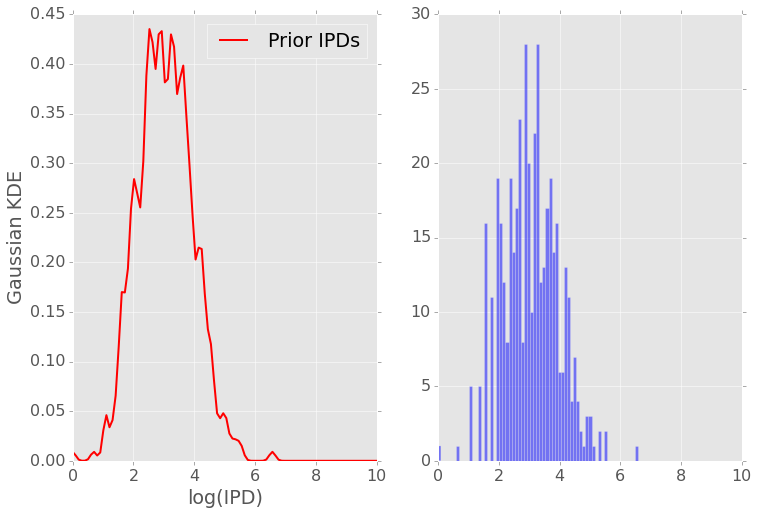

000000F motif: TGCAGATCTCC n_prior: 713
	weight  : [ 0.49841151  0.50158849]
	means   : [[ 3.29617182  2.56828639]]
	AIC1:  1790.850969 	BIC1:  1813.6983761


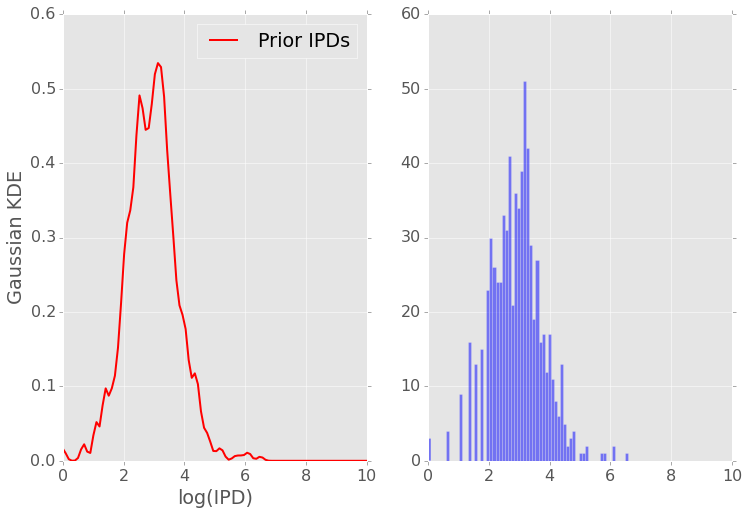

000000F motif: CAGATCTTACA n_prior: 1000
	weight  : [ 0.56903497  0.43096503]
	means   : [[ 2.67532531  2.91341072]]
	AIC1:  2457.63657568 	BIC1:  2482.17535207


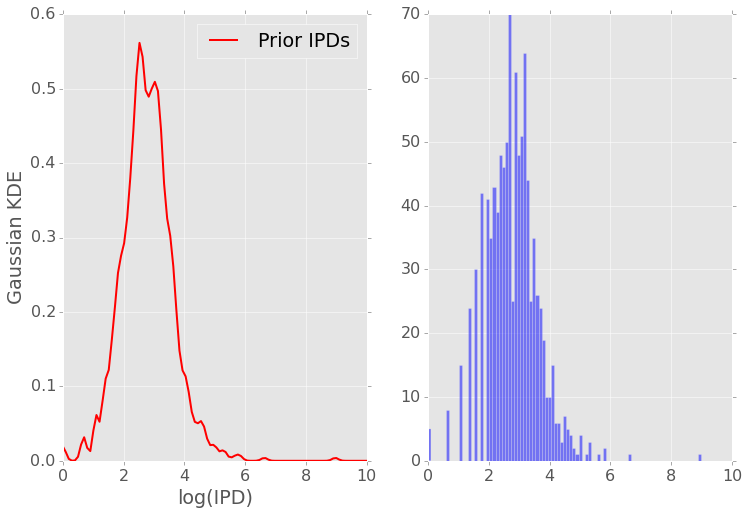

000000F motif: CAGATCTCTAG n_prior: 1000
	weight  : [ 0.60291624  0.39708376]
	means   : [[ 2.75155652  2.93173616]]
	AIC1:  2395.43990429 	BIC1:  2419.97868068


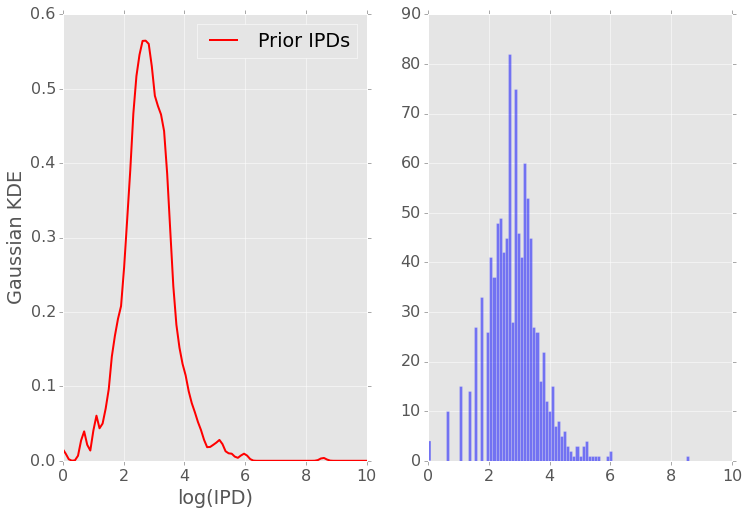

000000F motif: CAGATCTCTAT n_prior: 778
	weight  : [ 0.49194535  0.50805465]
	means   : [[ 2.56736707  3.28213946]]
	AIC1:  1912.07555134 	BIC1:  1935.35918397


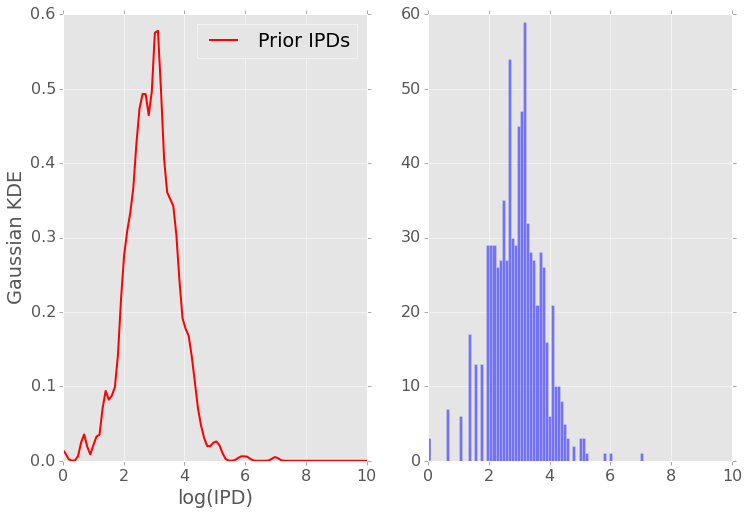

000000F motif: GCAGATCTAGC n_prior: 204
	weight  : [ 0.53095435  0.46904565]
	means   : [[ 2.46780398  3.32328586]]
	AIC1:  511.924248542 	BIC1:  528.514848511


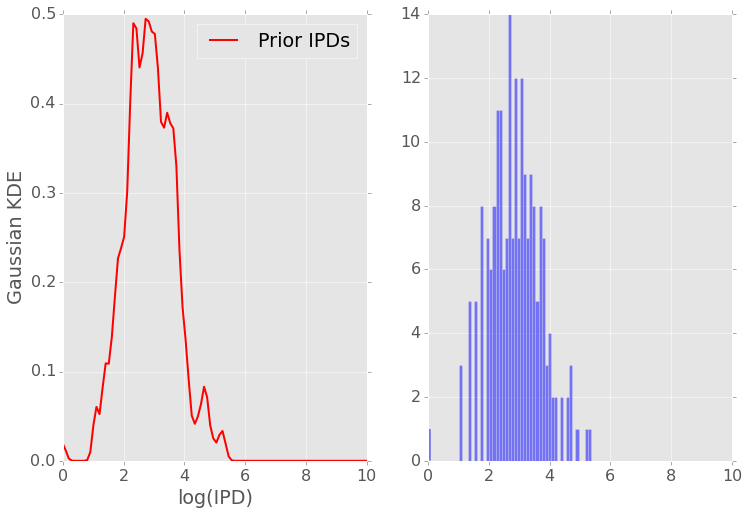

000000F motif: GCAGATCTAGT n_prior: 162
	weight  : [ 0.5593356  0.4406644]
	means   : [[ 2.8960322   3.03239878]]
	AIC1:  410.296498535 	BIC1:  425.734480211


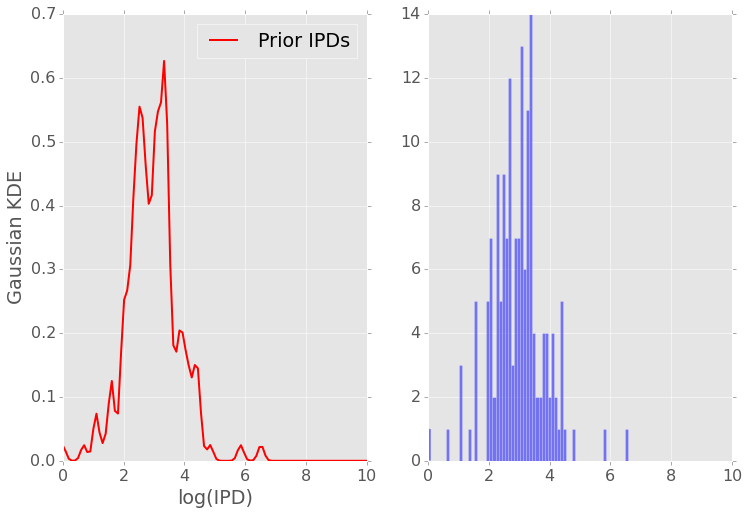

000000F motif: CAGATCTTCCT n_prior: 664
	weight  : [ 0.50496453  0.49503547]
	means   : [[ 3.03174212  2.32498538]]
	AIC1:  1605.89134814 	BIC1:  1628.38275889


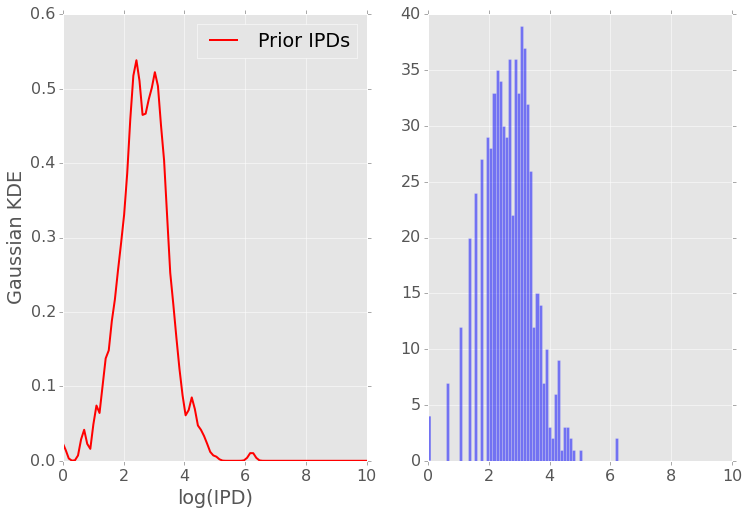

000000F motif: CAGATCTTCCG n_prior: 68
	weight  : [ 0.46203908  0.53796092]
	means   : [[ 2.90907903  2.19598191]]
	AIC1:  165.570260951 	BIC1:  176.667799477


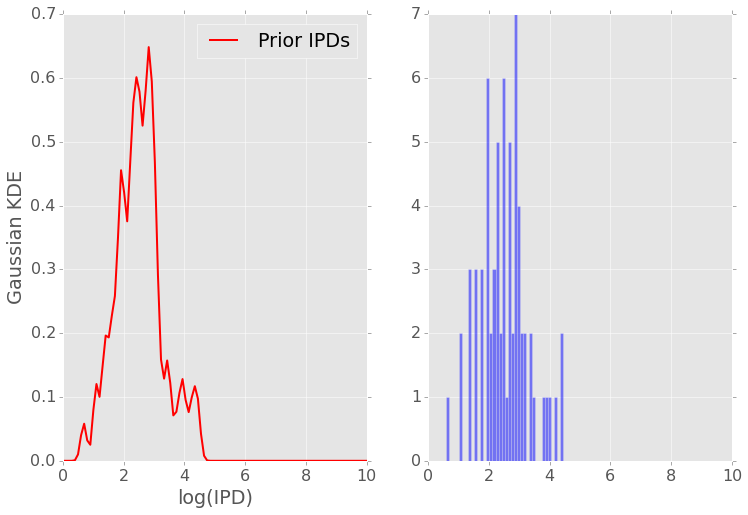

000000F motif: CAGATCTTCCA n_prior: 1000
	weight  : [ 0.47942815  0.52057185]
	means   : [[ 2.23791441  3.04597162]]
	AIC1:  2410.76856922 	BIC1:  2435.30734562


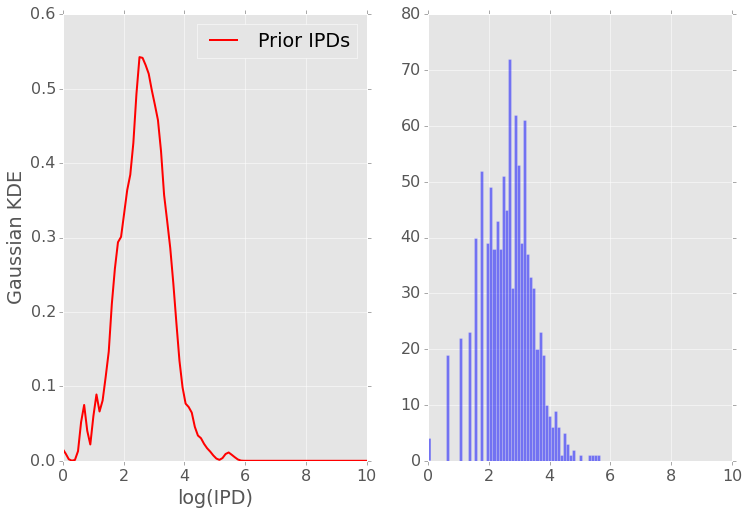

000000F motif: CAGATCTTCCC n_prior: 320
	weight  : [ 0.57363554  0.42636446]
	means   : [[ 2.37362522  3.10101127]]
	AIC1:  735.512544509 	BIC1:  754.354149488


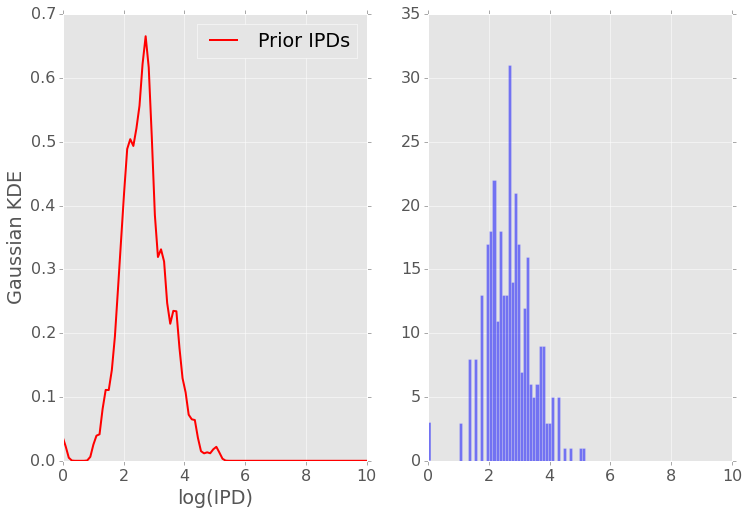

000000F motif: CACAGATCTAT n_prior: 742
	weight  : [ 0.48718993  0.51281007]
	means   : [[ 3.38744322  2.55085508]]
	AIC1:  1900.57551835 	BIC1:  1923.62226457


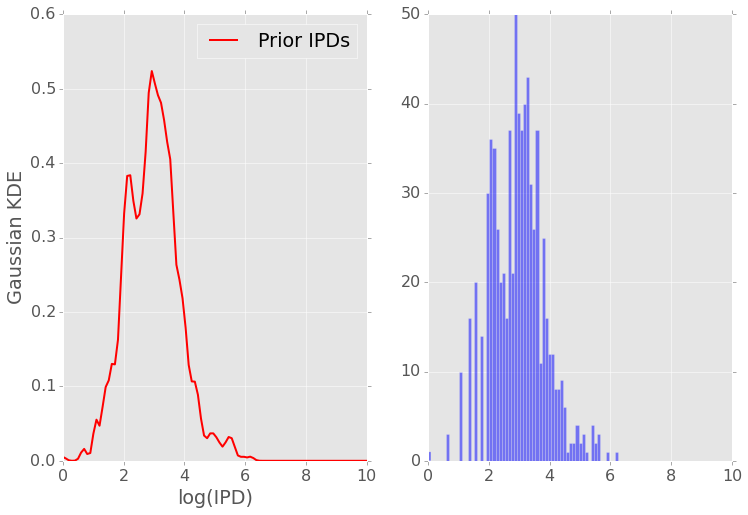

000000F motif: CACAGATCTAA n_prior: 602
	weight  : [ 0.49564896  0.50435104]
	means   : [[ 3.45734481  2.56178322]]
	AIC1:  1566.23223353 	BIC1:  1588.23352076


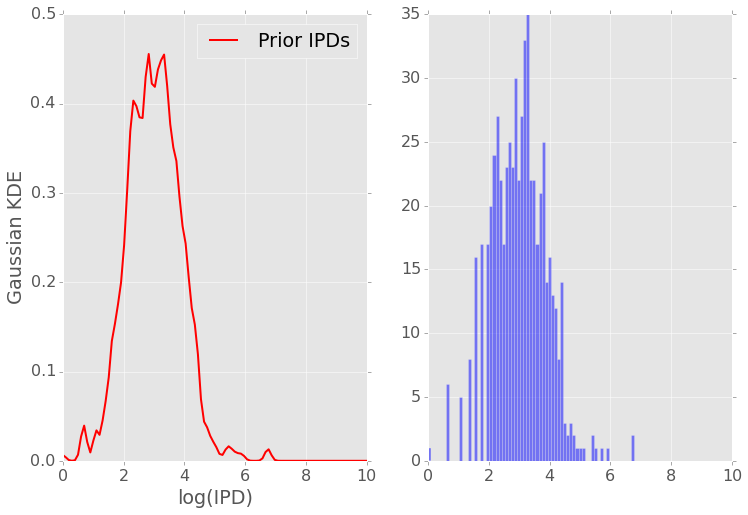

000000F motif: CACAGATCTAC n_prior: 503
	weight  : [ 0.53263059  0.46736941]
	means   : [[ 2.67112204  3.70459804]]
	AIC1:  1362.9757036 	BIC1:  1384.07865446


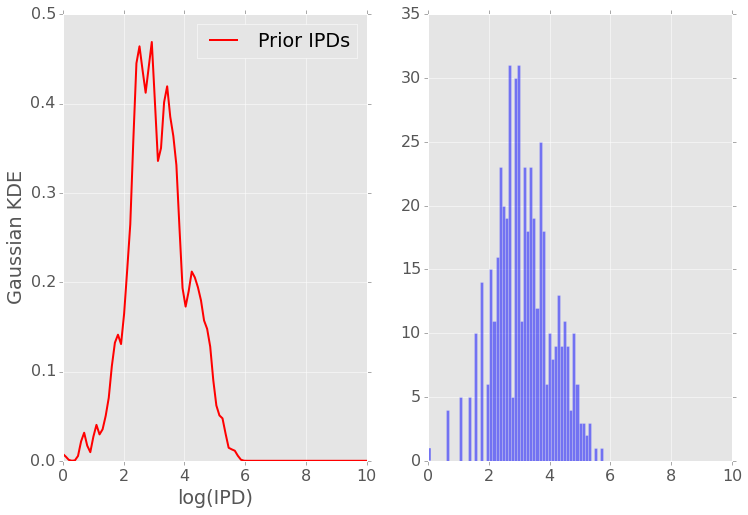

000000F motif: CACAGATCTAG n_prior: 111
	weight  : [ 0.41513037  0.58486963]
	means   : [[ 2.96464024  2.7178153 ]]
	AIC1:  302.23057085 	BIC1:  315.778221856


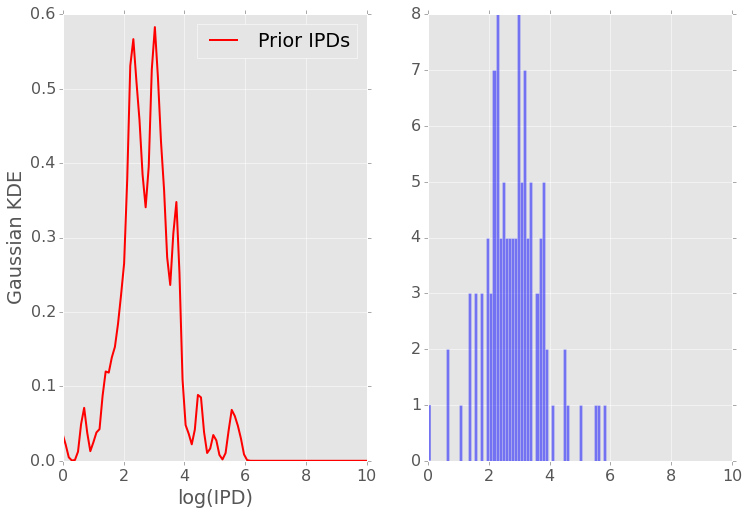

000000F motif: GCAGATCTAGA n_prior: 345
	weight  : [ 0.50245436  0.49754564]
	means   : [[ 2.59285002  3.32512732]]
	AIC1:  816.145502699 	BIC1:  835.363224784


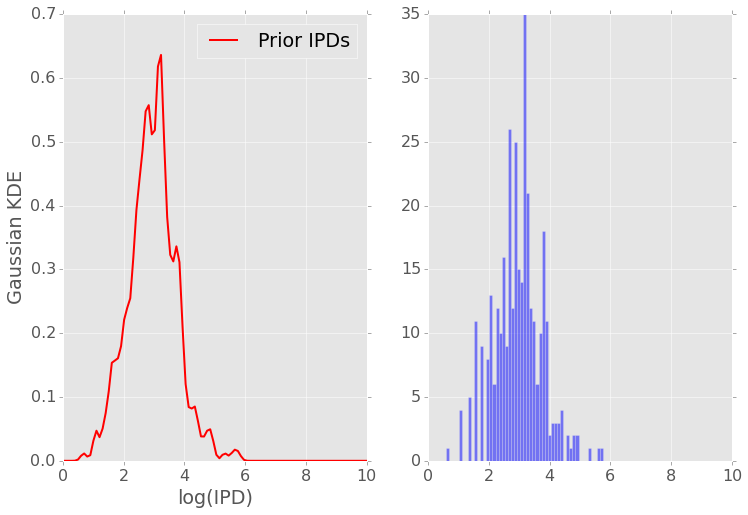

000000F motif: AACACAGATCT n_prior: 1000
	weight  : [ 0.58260971  0.41739029]
	means   : [[ 2.52816835  2.93003999]]
	AIC1:  2561.41234814 	BIC1:  2585.95112454


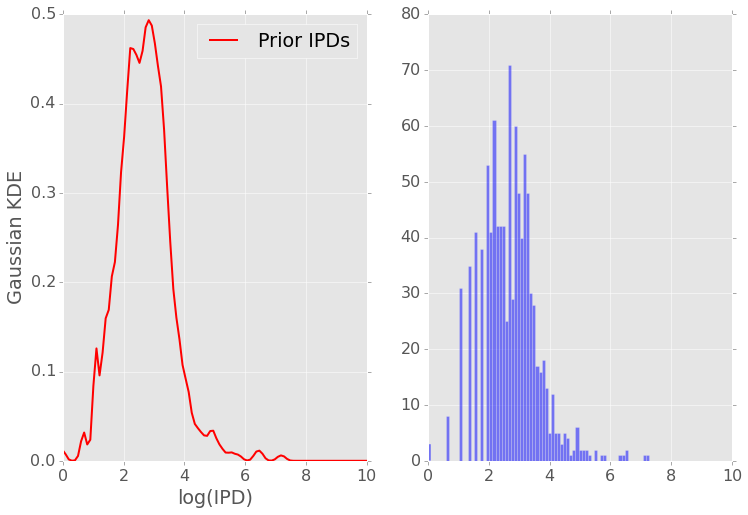

000000F motif: TTCCAGATCTT n_prior: 1000
	weight  : [ 0.51007763  0.48992237]
	means   : [[ 2.35109282  3.11940534]]
	AIC1:  2419.44230656 	BIC1:  2443.98108296


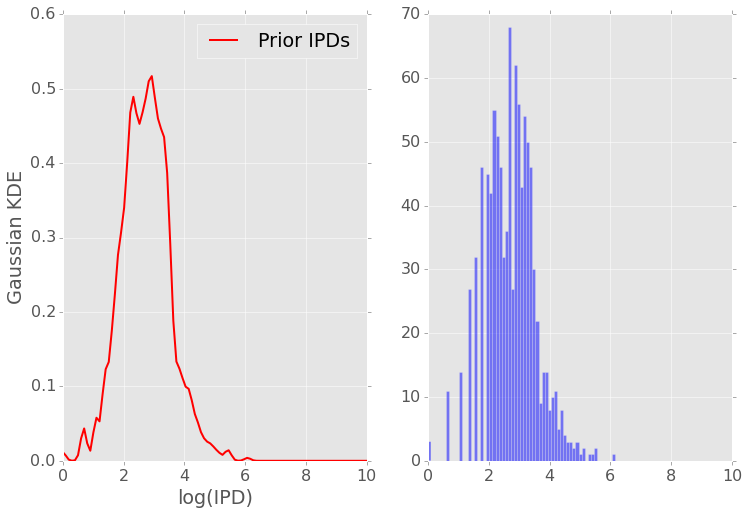

000000F motif: TTCCAGATCTA n_prior: 1000
	weight  : [ 0.42504317  0.57495683]
	means   : [[ 2.70628497  2.62548598]]
	AIC1:  2598.92480814 	BIC1:  2623.46358453


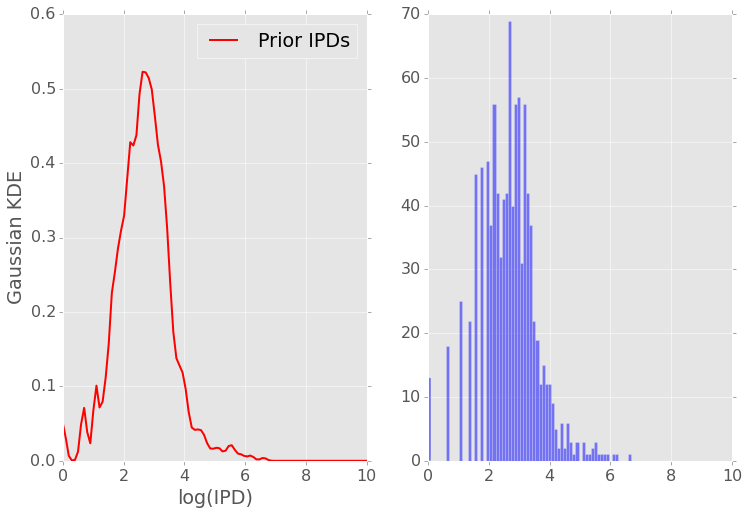

000000F motif: GCAGATCTCCT n_prior: 321
	weight  : [ 0.56736042  0.43263958]
	means   : [[ 3.20553006  2.77579691]]
	AIC1:  786.121110069 	BIC1:  804.978315684


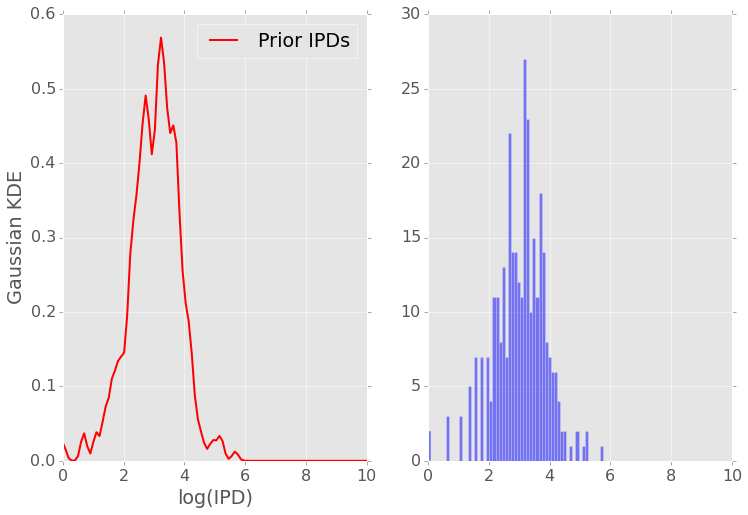

000000F motif: GCAGATCTCCG n_prior: 56
	weight  : [ 0.70620173  0.29379827]
	means   : [[ 3.50029305  2.43126493]]
	AIC1:  135.898611833 	BIC1:  146.025370287


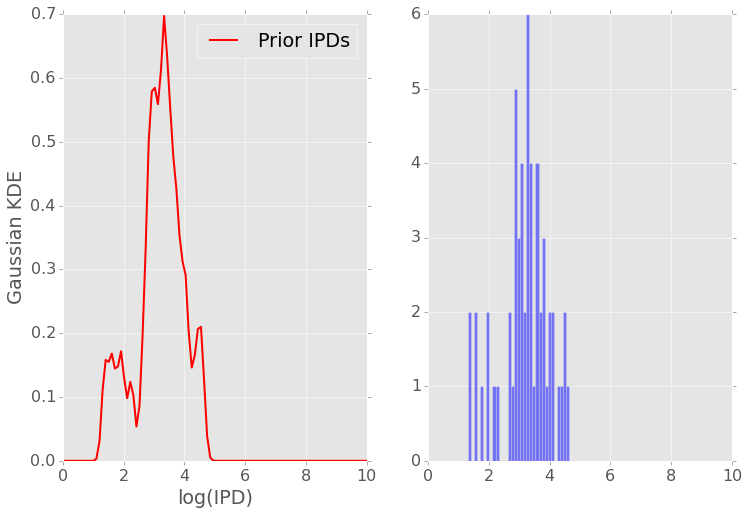

000000F motif: GCAGATCTCCA n_prior: 1000
	weight  : [ 0.47801902  0.52198098]
	means   : [[ 2.51142041  3.43505618]]
	AIC1:  2585.95146247 	BIC1:  2610.49023886


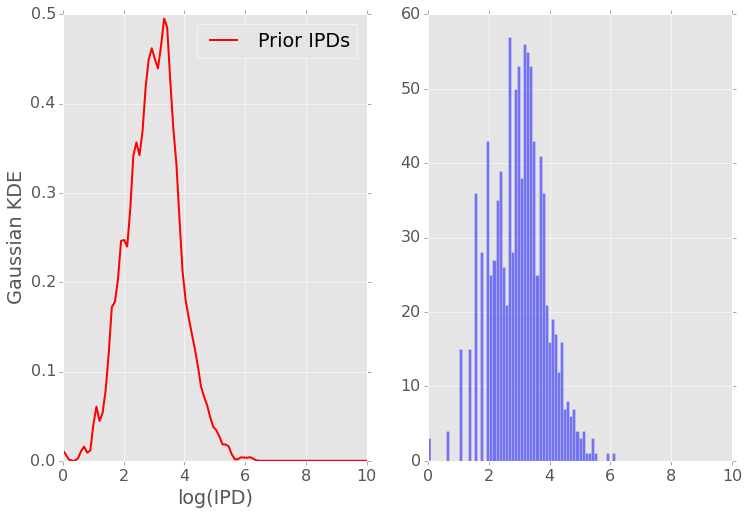

000000F motif: GCAGATCTCCC n_prior: 596
	weight  : [ 0.48281551  0.51718449]
	means   : [[ 2.50985076  3.3123833 ]]
	AIC1:  1517.93753562 	BIC1:  1539.88873896


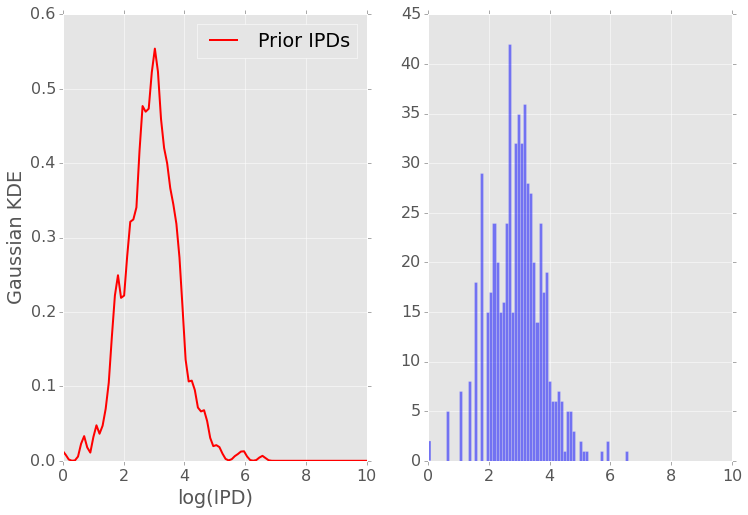

000000F motif: CAGATCTAACT n_prior: 422
	weight  : [ 0.48678307  0.51321693]
	means   : [[ 2.35832058  3.15357053]]
	AIC1:  977.861705859 	BIC1:  998.086732429


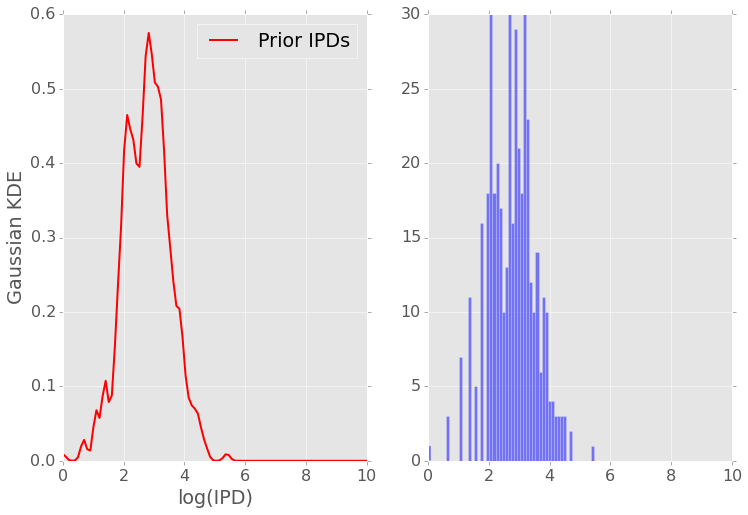

000000F motif: CAGATCTAACG n_prior: 50
	weight  : [ 0.57179082  0.42820918]
	means   : [[ 2.08588723  2.91994379]]
	AIC1:  116.821626284 	BIC1:  126.381741311


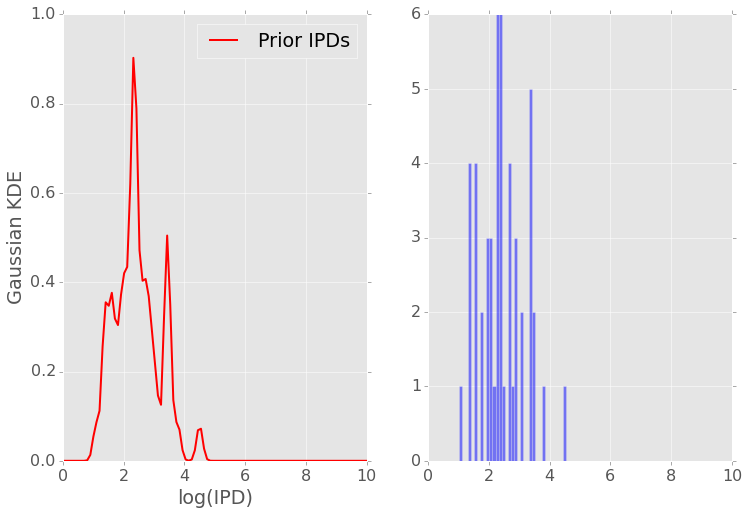

000000F motif: CAGATCTAACA n_prior: 464
	weight  : [ 0.49117573  0.50882427]
	means   : [[ 3.00816334  2.38233074]]
	AIC1:  1149.65791116 	BIC1:  1170.35733392


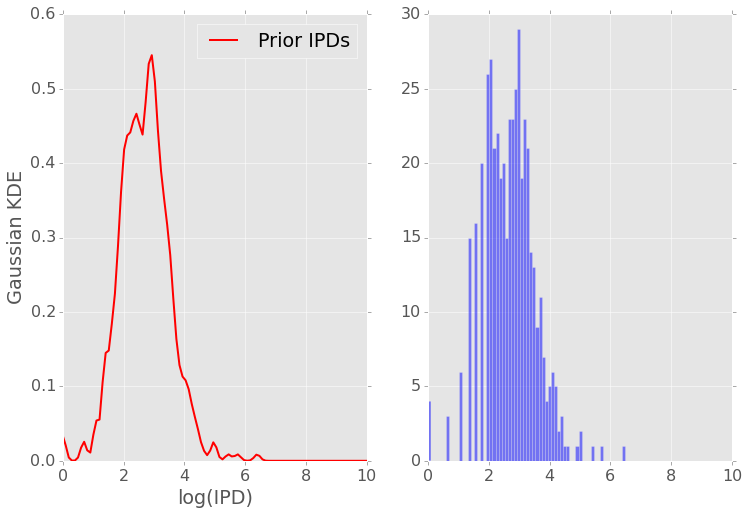

000000F motif: CAGATCTAACC n_prior: 244
	weight  : [ 0.48444674  0.51555326]
	means   : [[ 2.37883652  3.24107914]]
	AIC1:  613.435805163 	BIC1:  630.92164629


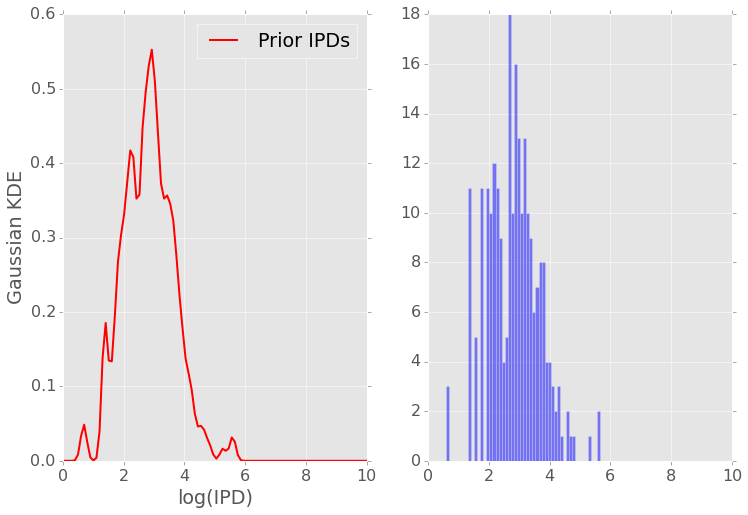

000000F motif: ATTGCAGATCT n_prior: 297
	weight  : [ 0.57313025  0.42686975]
	means   : [[ 3.00416702  2.25421262]]
	AIC1:  765.142694317 	BIC1:  783.611355011


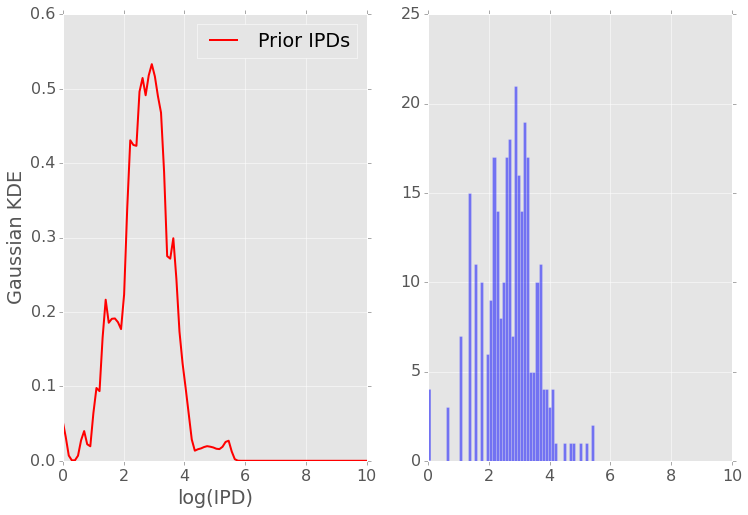

000000F motif: AGACCAGATCT n_prior: 230
	weight  : [ 0.50575404  0.49424596]
	means   : [[ 3.70727153  2.65141376]]
	AIC1:  654.962935612 	BIC1:  672.153332157


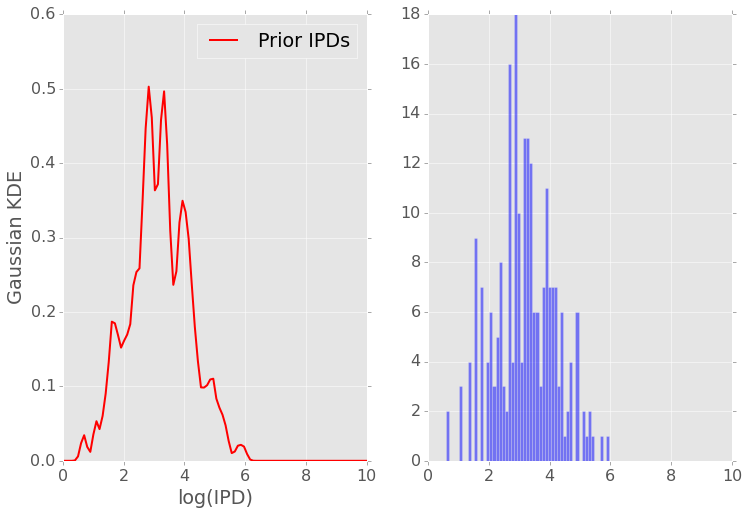

000000F motif: TGCAGATCTGT n_prior: 172
	weight  : [ 0.54774962  0.45225038]
	means   : [[ 2.56992876  3.50669255]]
	AIC1:  448.02549197 	BIC1:  463.762964354


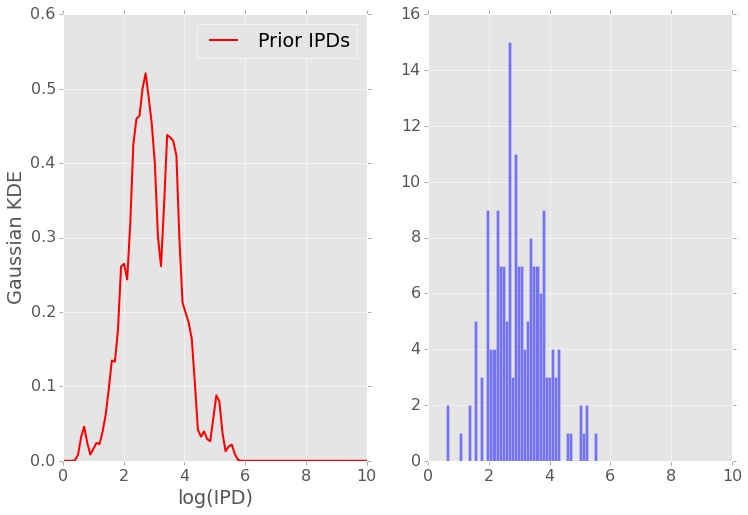

000000F motif: TGCAGATCTGC n_prior: 500
	weight  : [ 0.50551519  0.49448481]
	means   : [[ 3.4556996   2.52497843]]
	AIC1:  1304.60445163 	BIC1:  1325.67749212


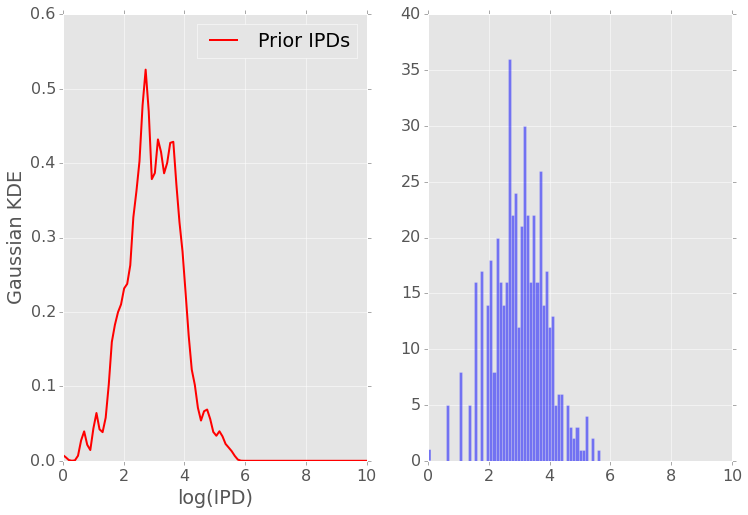

000000F motif: TGCAGATCTGA n_prior: 626
	weight  : [ 0.53387888  0.46612112]
	means   : [[ 3.26226259  2.50865812]]
	AIC1:  1480.43551426 	BIC1:  1502.63226611


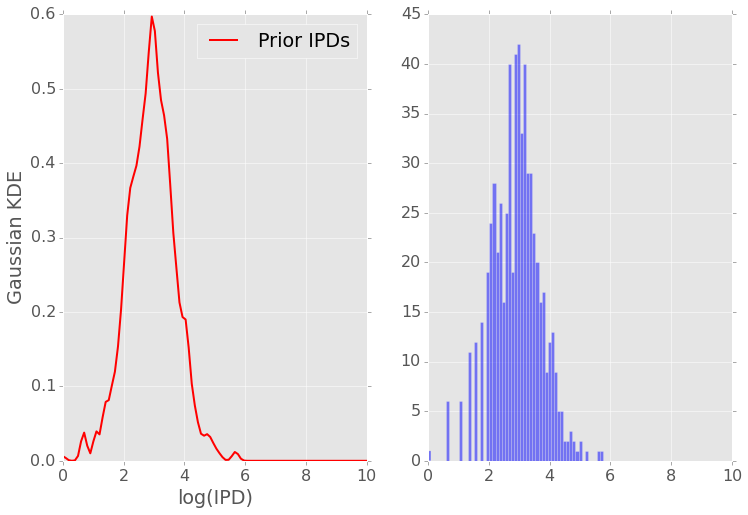

000000F motif: TGCAGATCTGG n_prior: 575
	weight  : [ 0.56281229  0.43718771]
	means   : [[ 2.89035452  3.02461968]]
	AIC1:  1464.16575648 	BIC1:  1485.93760669


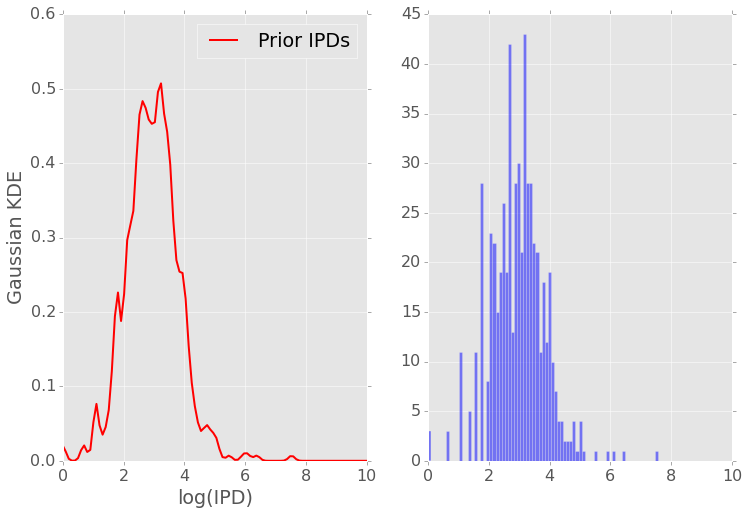

000000F motif: CCAGATCTGTT n_prior: 363
	weight  : [ 0.4792796  0.5207204]
	means   : [[ 2.53096594  3.37140646]]
	AIC1:  892.113008969 	BIC1:  911.585023141


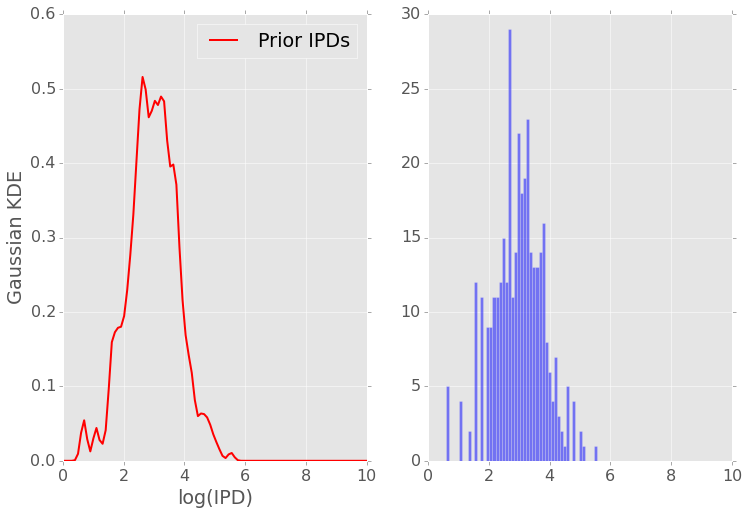

000000F motif: CCAGATCTGTG n_prior: 467
	weight  : [ 0.47725352  0.52274648]
	means   : [[ 3.27350194  2.43165388]]
	AIC1:  1156.40644698 	BIC1:  1177.13809327


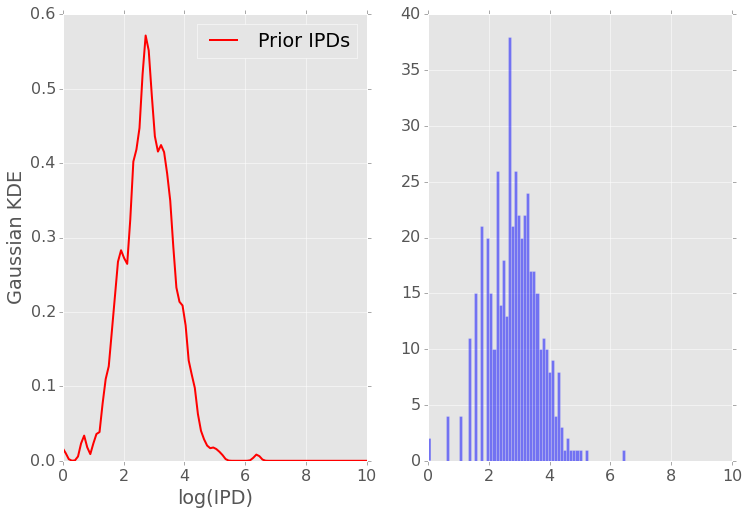

000000F motif: CCAGATCTGTA n_prior: 587
	weight  : [ 0.48713885  0.51286115]
	means   : [[ 3.26691348  2.52764314]]
	AIC1:  1445.5156214 	BIC1:  1467.3907455


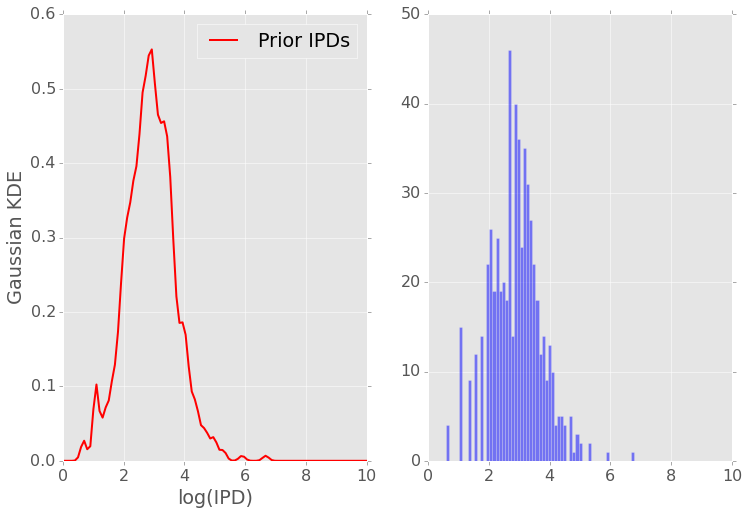

000000F motif: CCAGATCTGTC n_prior: 607
	weight  : [ 0.47811509  0.52188491]
	means   : [[ 3.26041171  2.48168592]]
	AIC1:  1504.28586636 	BIC1:  1526.32851031


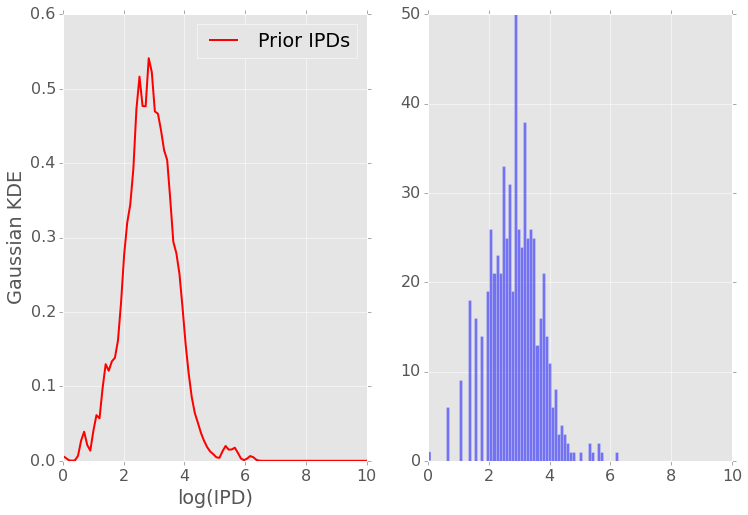

000000F motif: CGCAGATCTCG n_prior: 53
	weight  : [ 0.49746096  0.50253904]
	means   : [[ 2.76047493  3.72749796]]
	AIC1:  136.304134162 	BIC1:  146.155593729


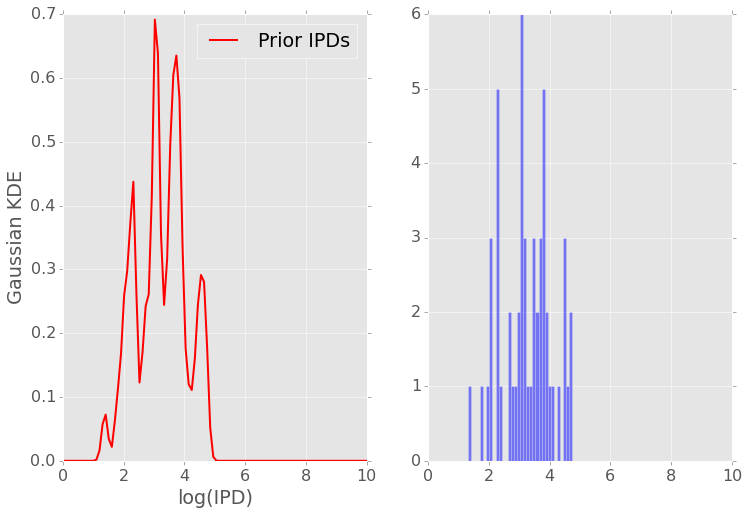

000000F motif: CGCAGATCTCC n_prior: 128
	weight  : [ 0.49991514  0.50008486]
	means   : [[ 2.53824909  3.36386858]]
	AIC1:  312.087434092 	BIC1:  326.347585412


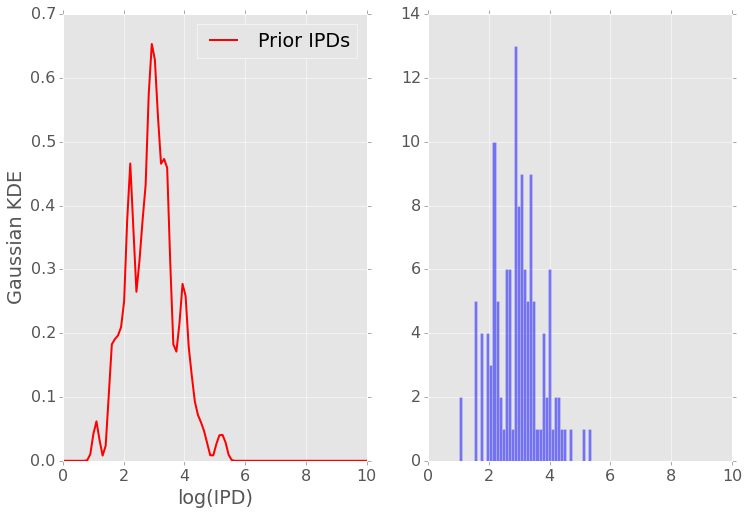

000000F motif: GGACAGATCTT n_prior: 438
	weight  : [ 0.48961479  0.51038521]
	means   : [[ 3.28039061  2.43224238]]
	AIC1:  1041.17925786 	BIC1:  1061.59035242


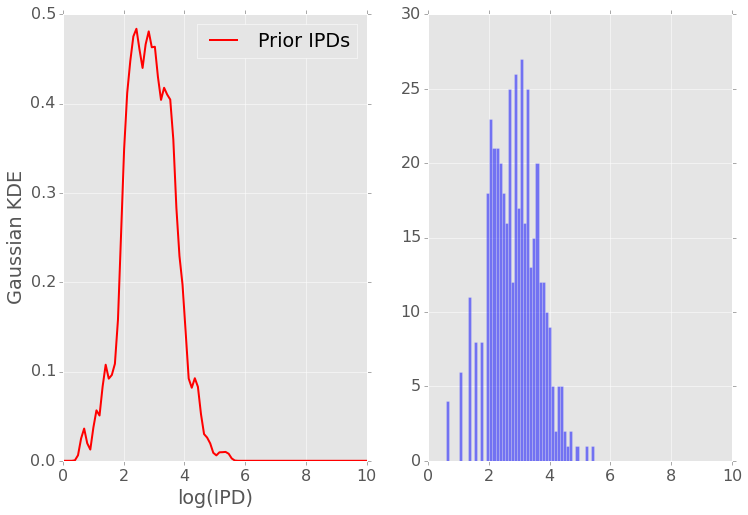

000000F motif: GGACAGATCTC n_prior: 361
	weight  : [ 0.39674072  0.60325928]
	means   : [[ 3.083686    2.90485242]]
	AIC1:  984.529082906 	BIC1:  1003.9734727


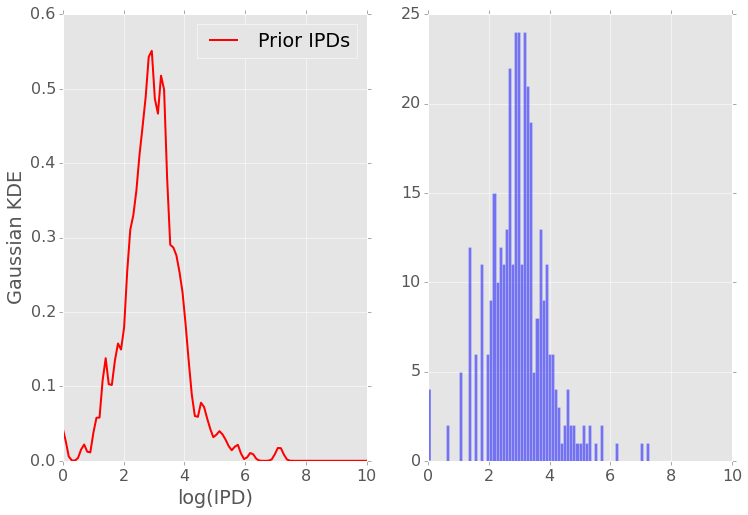

000000F motif: GGACAGATCTA n_prior: 333
	weight  : [ 0.49041552  0.50958448]
	means   : [[ 2.31689478  3.2316022 ]]
	AIC1:  877.443320746 	BIC1:  896.484033196


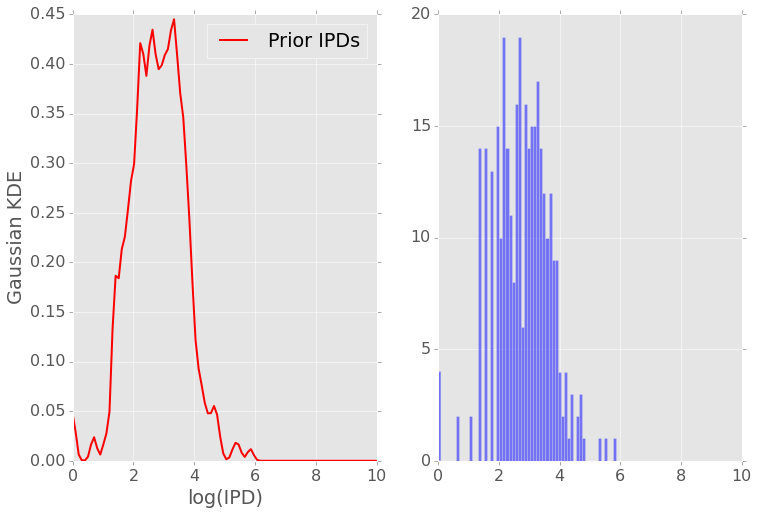

000000F motif: GGACAGATCTG n_prior: 200
	weight  : [ 0.49303994  0.50696006]
	means   : [[ 2.53415303  3.41487529]]
	AIC1:  522.09351978 	BIC1:  538.585106613


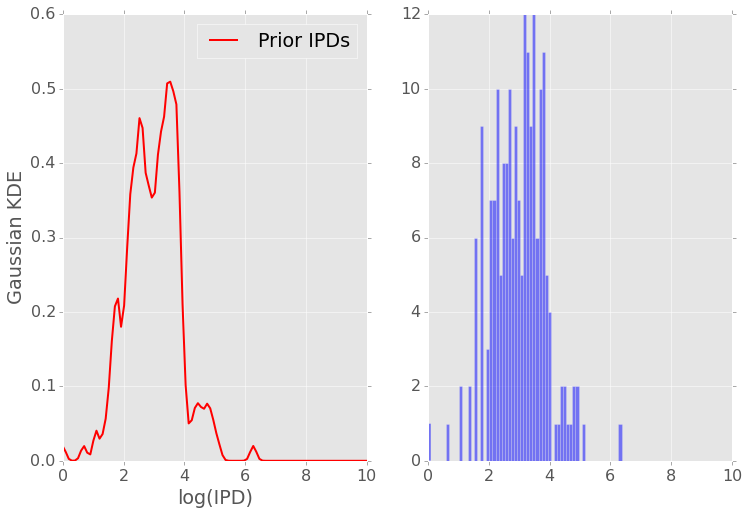

000000F motif: CAGATCTTGCT n_prior: 635
	weight  : [ 0.51847119  0.48152881]
	means   : [[ 2.32716029  3.24868859]]
	AIC1:  1619.33686042 	BIC1:  1641.60498541


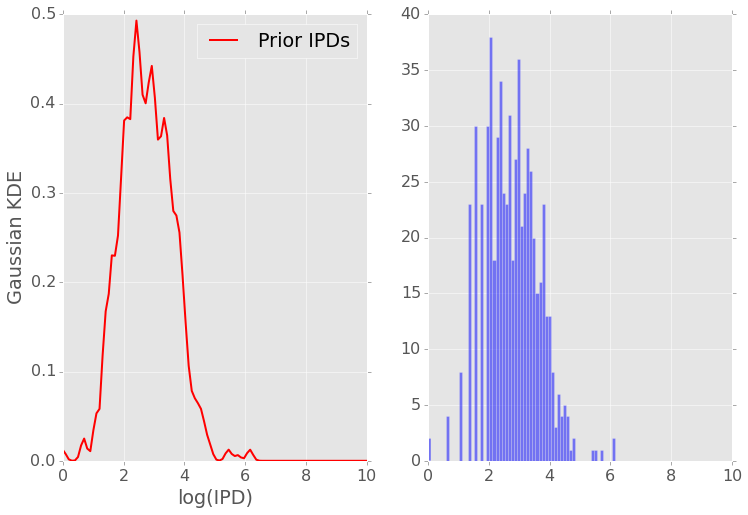

000000F motif: CAGATCTTGCA n_prior: 499
	weight  : [ 0.48490894  0.51509106]
	means   : [[ 3.07784506  2.28391951]]
	AIC1:  1223.69582347 	BIC1:  1244.75885395


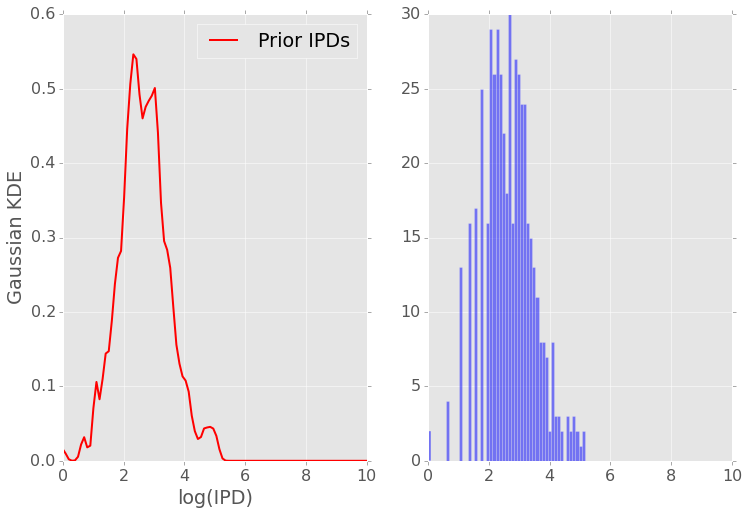

000000F motif: CAGATCTTGCC n_prior: 572
	weight  : [ 0.52155236  0.47844764]
	means   : [[ 2.42227343  3.22115901]]
	AIC1:  1369.84528076 	BIC1:  1391.59097571


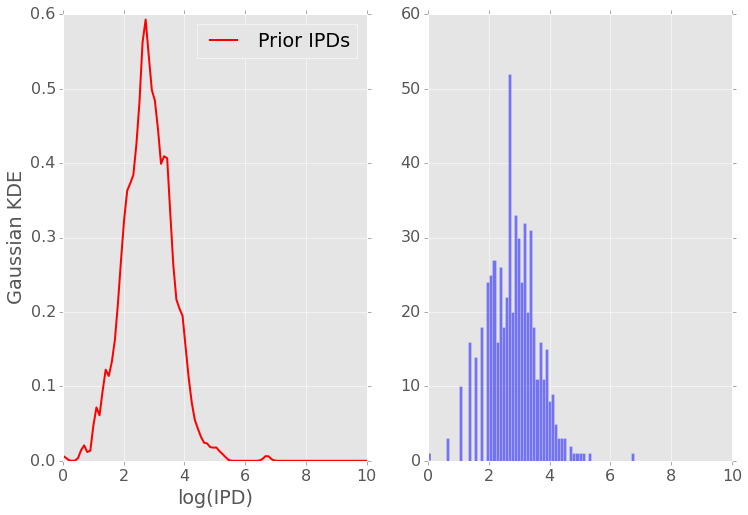

000000F motif: TACAGATCTTT n_prior: 1000
	weight  : [ 0.48148472  0.51851528]
	means   : [[ 2.48882284  3.32352095]]
	AIC1:  2489.39532202 	BIC1:  2513.93409841


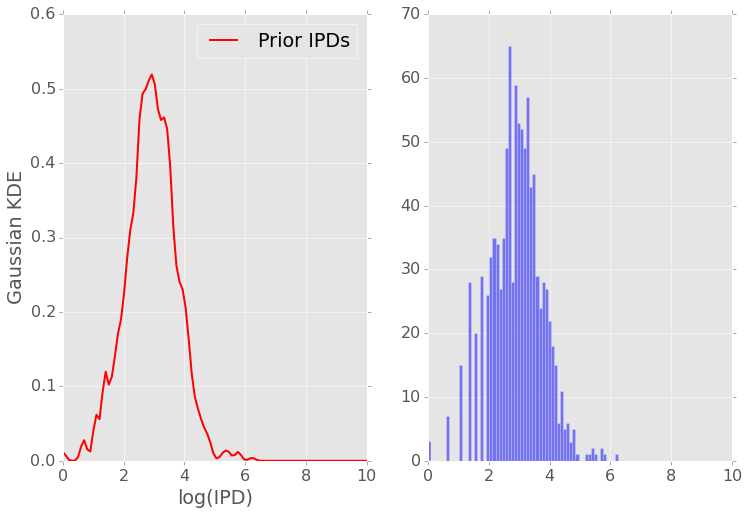

000000F motif: ACAGATCTCTT n_prior: 1000
	weight  : [ 0.49980785  0.50019215]
	means   : [[ 2.55553351  3.37514911]]
	AIC1:  2509.37819177 	BIC1:  2533.91696816


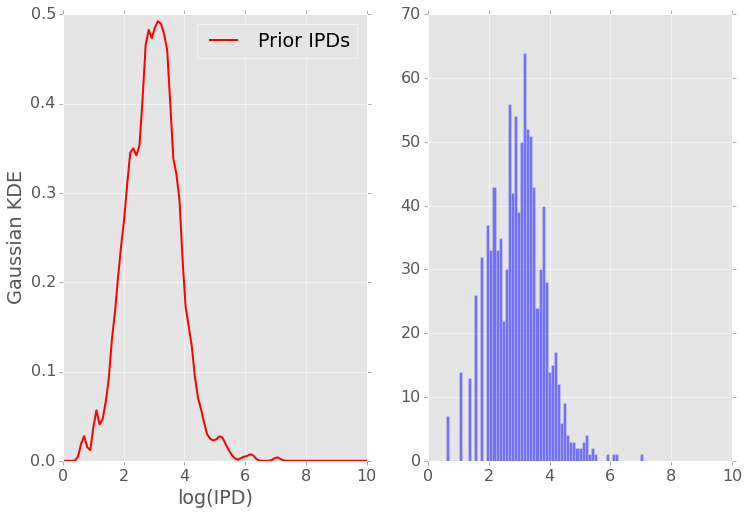

000000F motif: ACAGATCTCTC n_prior: 627
	weight  : [ 0.49481441  0.50518559]
	means   : [[ 3.29428809  2.49563483]]
	AIC1:  1568.93916688 	BIC1:  1591.14389958


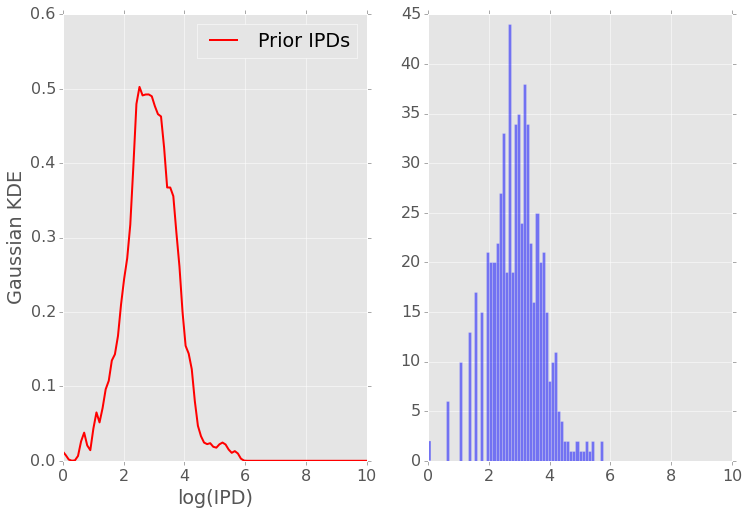

000000F motif: ACAGATCTCTA n_prior: 1000
	weight  : [ 0.49457258  0.50542742]
	means   : [[ 3.27211847  2.59994413]]
	AIC1:  2590.5936442 	BIC1:  2615.1324206


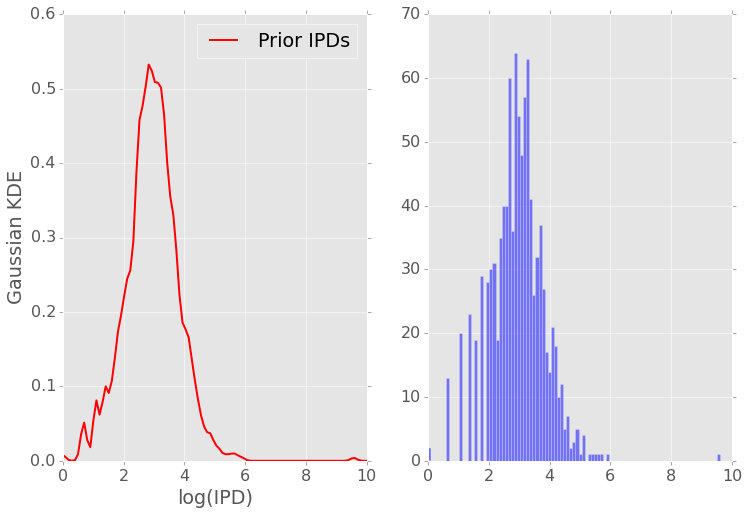

000000F motif: ACAGATCTCTG n_prior: 1000
	weight  : [ 0.49985439  0.50014561]
	means   : [[ 2.49485244  3.28463698]]
	AIC1:  2466.67307752 	BIC1:  2491.21185392


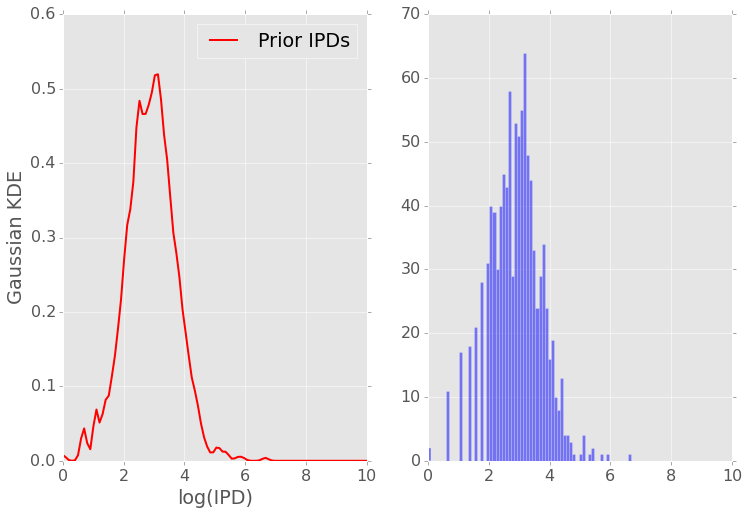

000000F motif: AGGCAGATCTT n_prior: 603
	weight  : [ 0.4560848  0.5439152]
	means   : [[ 3.17046356  2.41884475]]
	AIC1:  1454.33624376 	BIC1:  1476.34582974


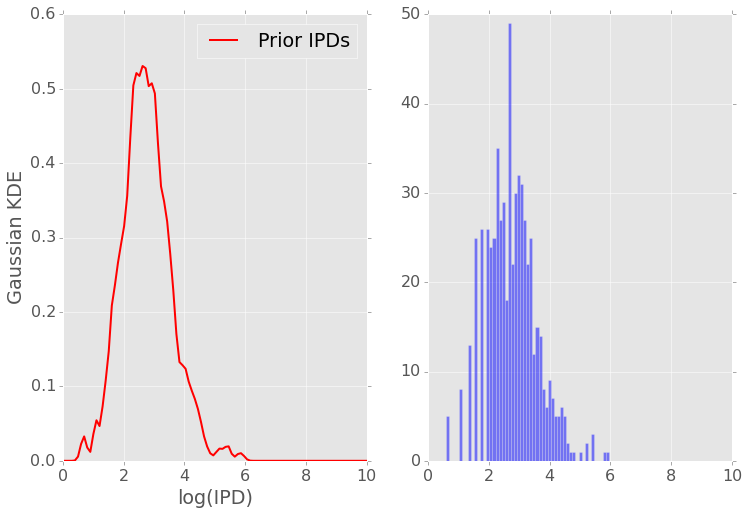

000000F motif: CAGATCTGACT n_prior: 556
	weight  : [ 0.49984147  0.50015853]
	means   : [[ 2.89452721  2.180988  ]]
	AIC1:  1387.88228791 	BIC1:  1409.48612938


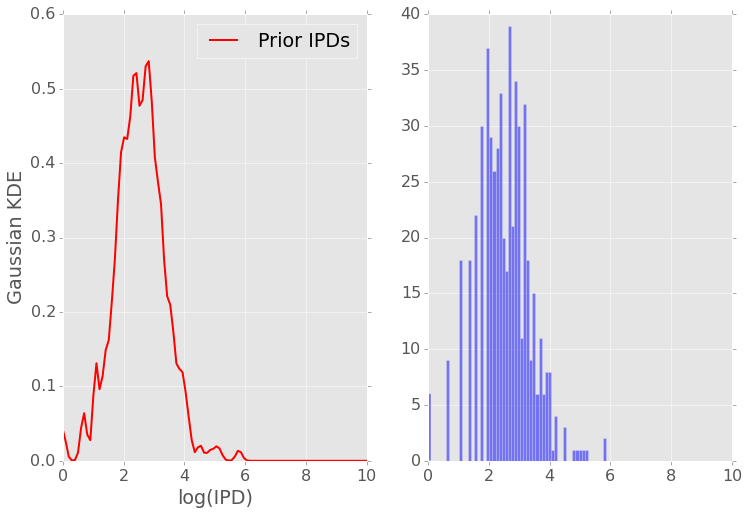

000000F motif: CAGATCTGACC n_prior: 488
	weight  : [ 0.48544161  0.51455839]
	means   : [[ 2.97430583  2.24309884]]
	AIC1:  1229.30266753 	BIC1:  1250.25424456


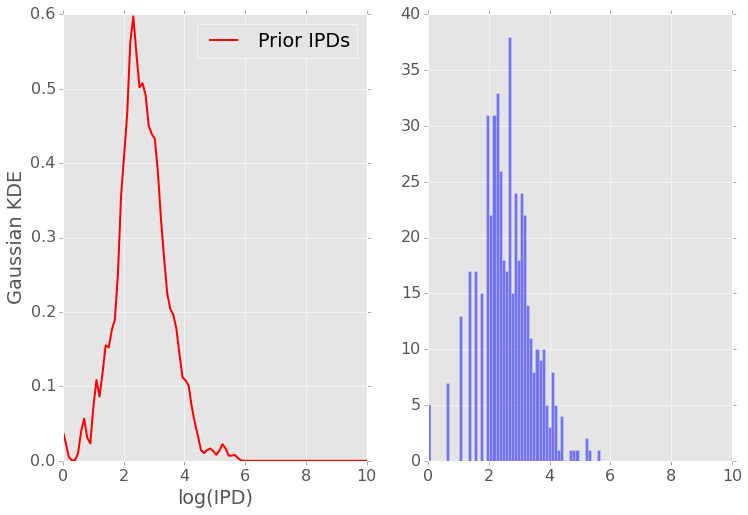

000000F motif: CAGATCTGACA n_prior: 760
	weight  : [ 0.5100363  0.4899637]
	means   : [[ 2.15390937  2.98541654]]
	AIC1:  1852.56367973 	BIC1:  1875.73027189


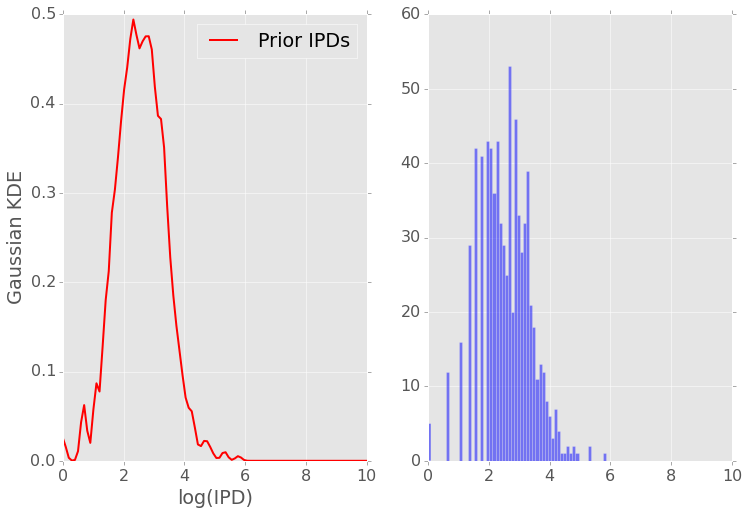

000000F motif: CAGATCTGACG n_prior: 55
	weight  : [ 0.63724966  0.36275034]
	means   : [[ 2.27221796  3.25643483]]
	AIC1:  145.963803807 	BIC1:  156.000469733


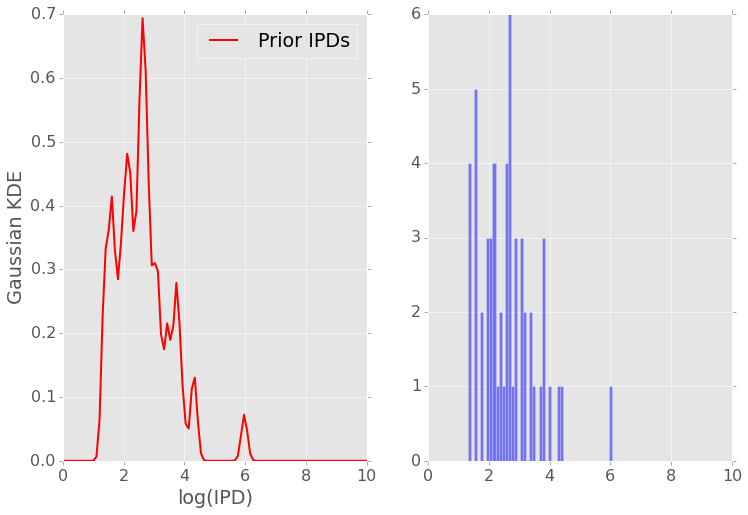

000000F motif: GCCAGATCTTT n_prior: 613
	weight  : [ 0.49318185  0.50681815]
	means   : [[ 2.56479321  3.35015324]]
	AIC1:  1502.25046715 	BIC1:  1524.34229183


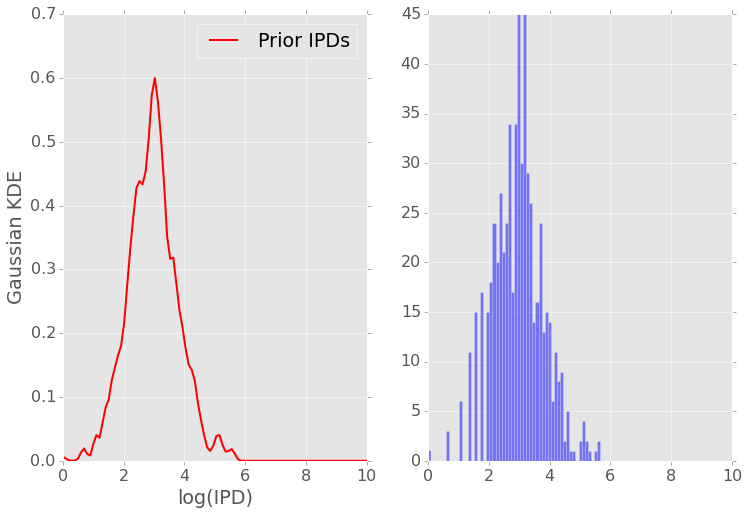

000000F motif: CTTACAGATCT n_prior: 495
	weight  : [ 0.49220325  0.50779675]
	means   : [[ 2.2570804   2.97090899]]
	AIC1:  1230.06887907 	BIC1:  1251.09166788


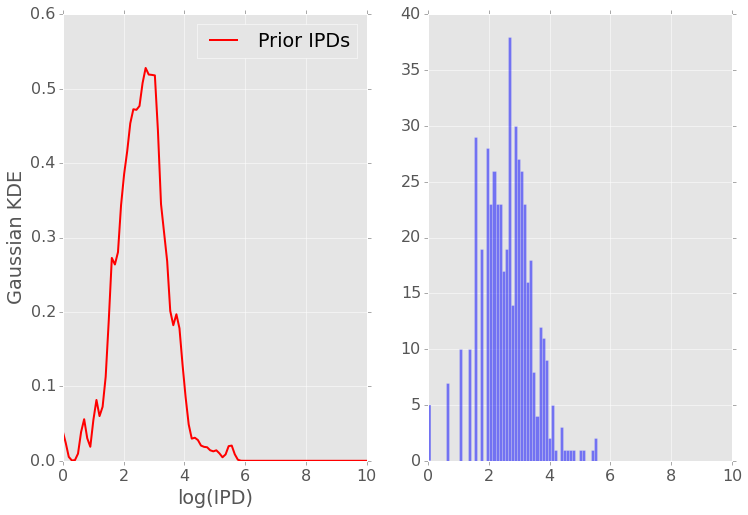

000000F motif: GCAGATCTGCA n_prior: 407
	weight  : [ 0.48734902  0.51265098]
	means   : [[ 3.45857105  2.66243228]]
	AIC1:  1060.57689236 	BIC1:  1080.62095829


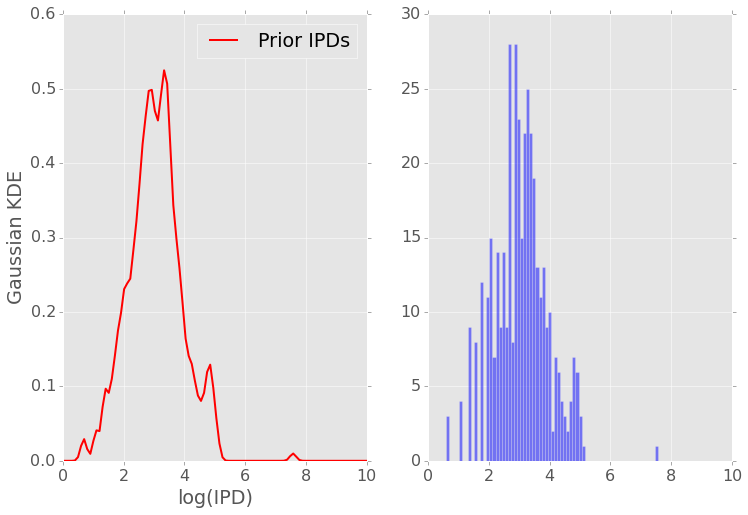

000000F motif: GCAGATCTGCC n_prior: 423
	weight  : [ 0.47378404  0.52621596]
	means   : [[ 3.36435739  2.55843866]]
	AIC1:  1060.49162663 	BIC1:  1080.72848752


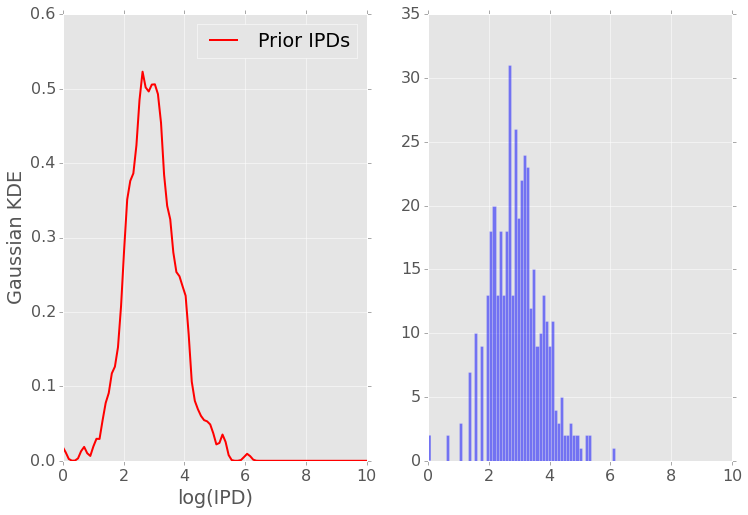

000000F motif: GCAGATCTGCT n_prior: 415
	weight  : [ 0.51985062  0.48014938]
	means   : [[ 3.46391046  2.57942821]]
	AIC1:  1057.86050383 	BIC1:  1078.00189643


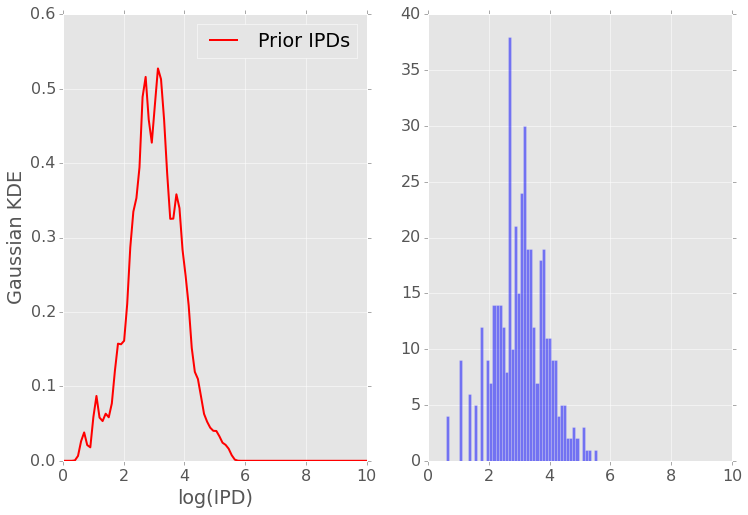

000000F motif: GCCAGATCTTG n_prior: 520
	weight  : [ 0.56941258  0.43058742]
	means   : [[ 2.78351862  3.11441767]]
	AIC1:  1322.54414371 	BIC1:  1343.81328777


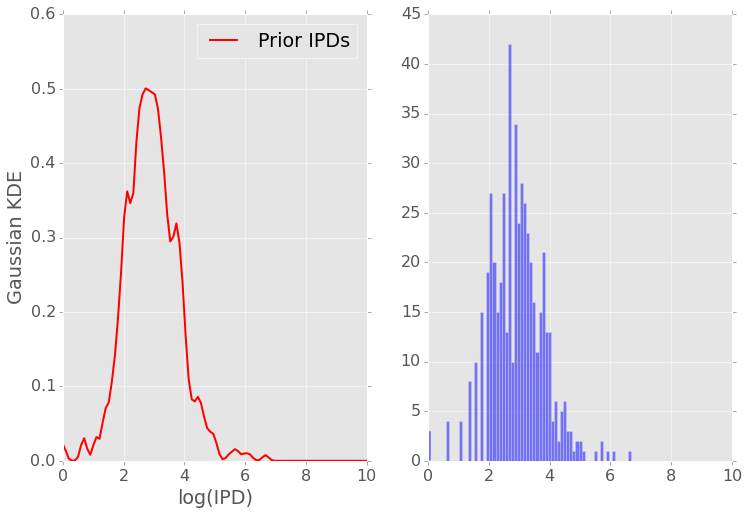

000000F motif: GCCAGATCTTA n_prior: 476
	weight  : [ 0.5303675  0.4696325]
	means   : [[ 3.17029508  2.40544731]]
	AIC1:  1198.60142432 	BIC1:  1219.42851359


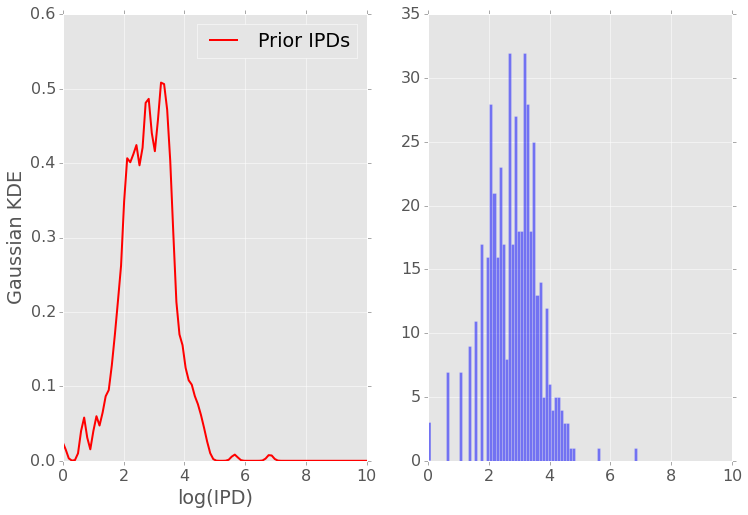

000000F motif: GCCAGATCTTC n_prior: 352
	weight  : [ 0.45183064  0.54816936]
	means   : [[ 2.45035063  3.20697328]]
	AIC1:  853.535101796 	BIC1:  872.853257674


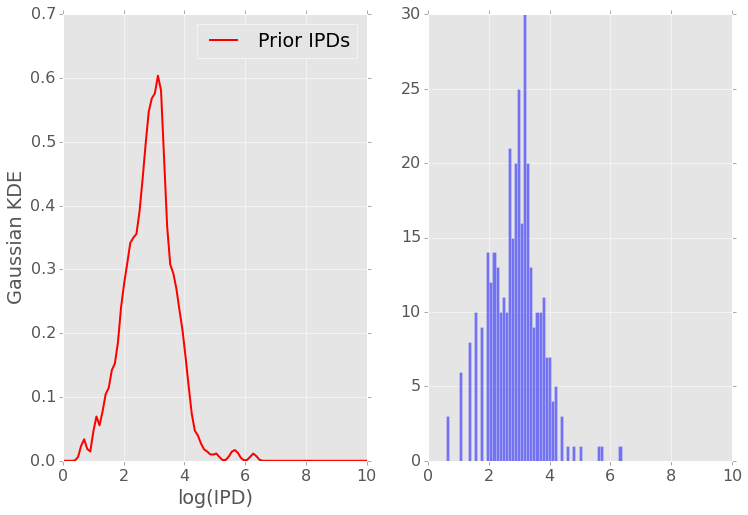

000000F motif: ACAGATCTATA n_prior: 768
	weight  : [ 0.52166752  0.47833248]
	means   : [[ 2.48831433  3.25234527]]
	AIC1:  1847.011854 	BIC1:  1870.23080267


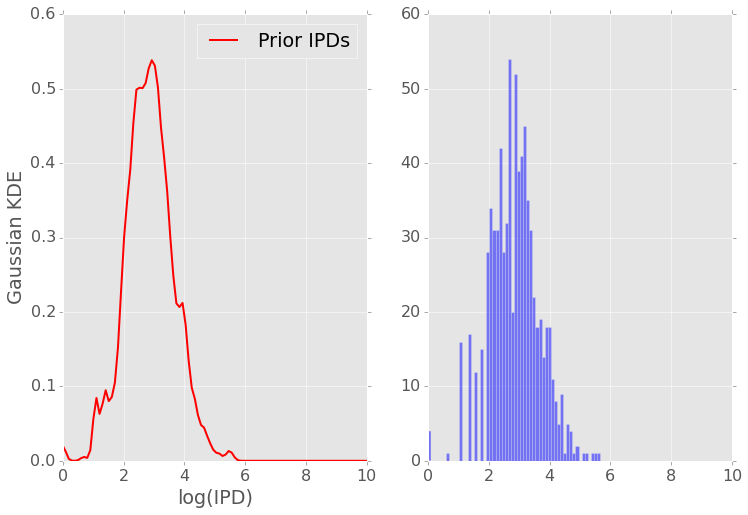

000000F motif: ACAGATCTATC n_prior: 323
	weight  : [ 0.48980355  0.51019645]
	means   : [[ 2.58504874  3.32107356]]
	AIC1:  831.874956134 	BIC1:  850.76321775


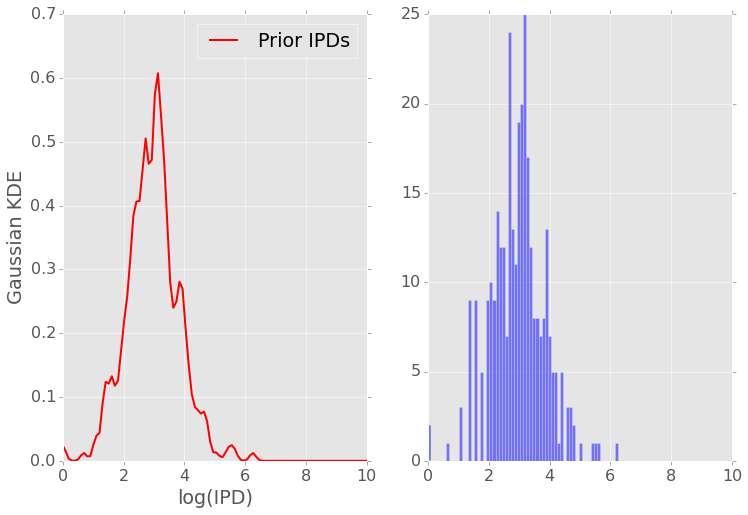

000000F motif: ACAGATCTATG n_prior: 487
	weight  : [ 0.52752174  0.47247826]
	means   : [[ 3.27962284  2.3590952 ]]
	AIC1:  1260.60114623 	BIC1:  1281.54246684


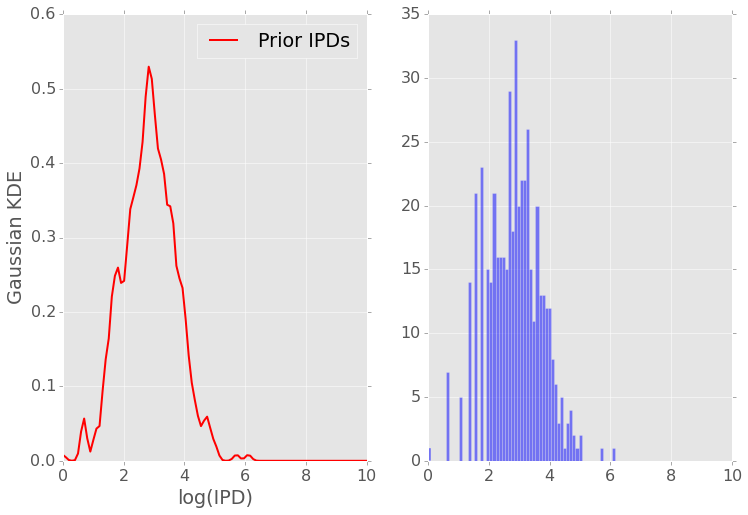

000000F motif: ACAGATCTATT n_prior: 893
	weight  : [ 0.58455027  0.41544973]
	means   : [[ 2.73610238  3.16976187]]
	AIC1:  2191.60506923 	BIC1:  2215.57800213


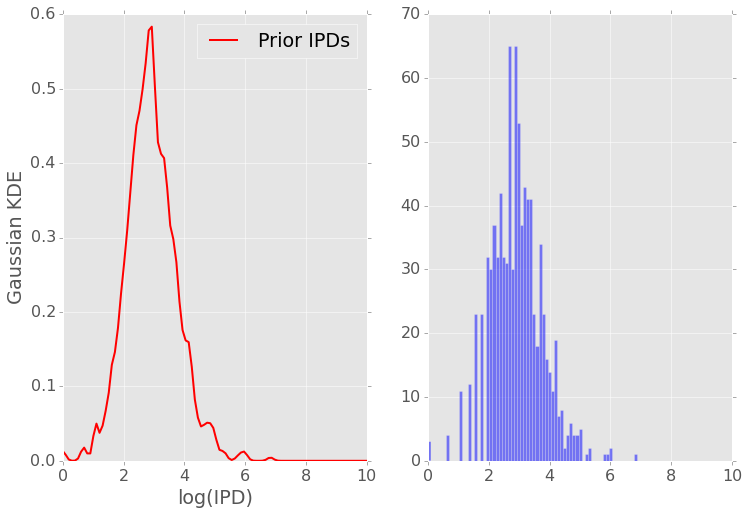

000000F motif: AGGACAGATCT n_prior: 267
	weight  : [ 0.50136068  0.49863932]
	means   : [[ 2.26142849  3.03203407]]
	AIC1:  668.545849484 	BIC1:  686.482092776


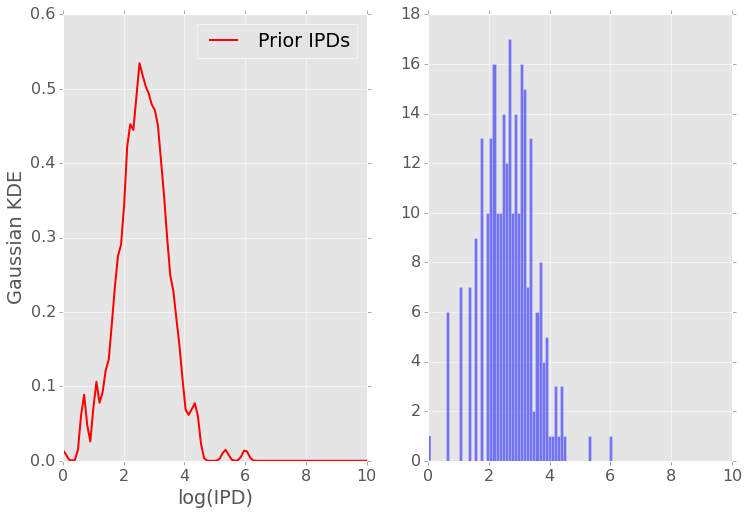

000000F motif: TAATCAGATCT n_prior: 989
	weight  : [ 0.55253439  0.44746561]
	means   : [[ 2.74665322  2.88283462]]
	AIC1:  2494.95698997 	BIC1:  2519.44046163


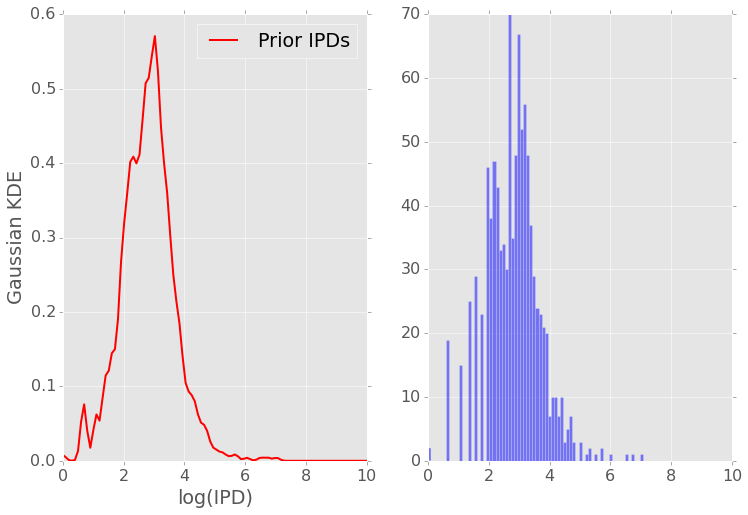

000000F motif: CAGATCTTGGC n_prior: 352
	weight  : [ 0.4669366  0.5330634]
	means   : [[ 3.10112753  2.30344846]]
	AIC1:  858.609136371 	BIC1:  877.927292249


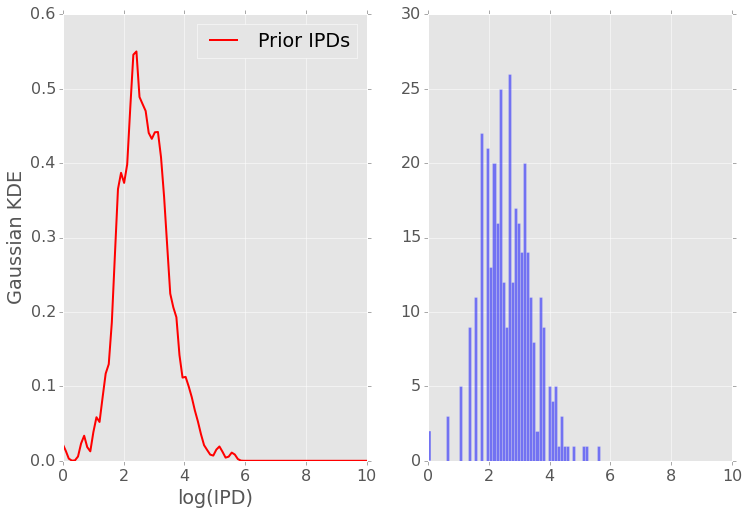

000000F motif: CAGATCTTGGT n_prior: 931
	weight  : [ 0.52848485  0.47151515]
	means   : [[ 2.55300995  3.22479096]]
	AIC1:  2380.17156522 	BIC1:  2404.35286161


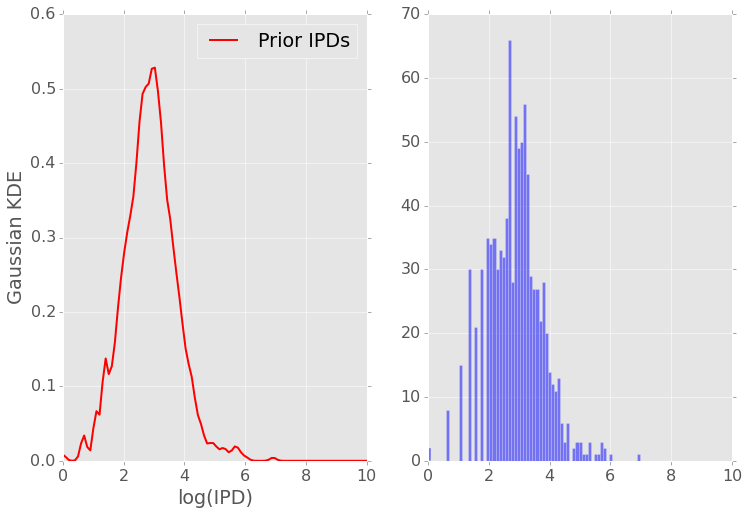

000000F motif: AAGGCAGATCT n_prior: 1000
	weight  : [ 0.50911527  0.49088473]
	means   : [[ 2.38127656  3.02221877]]
	AIC1:  2484.01629886 	BIC1:  2508.55507526


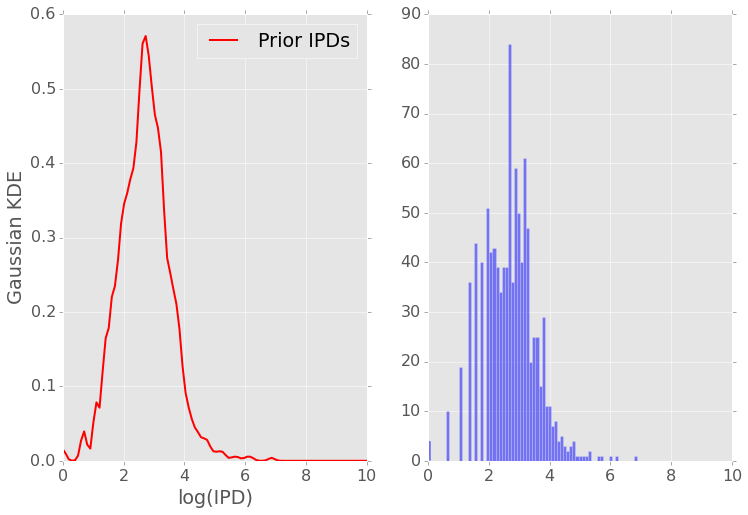

000000F motif: CAGATCTAGTA n_prior: 123
	weight  : [ 0.45118074  0.54881926]
	means   : [[ 2.12058287  2.82872004]]
	AIC1:  287.455254918 	BIC1:  301.516176695


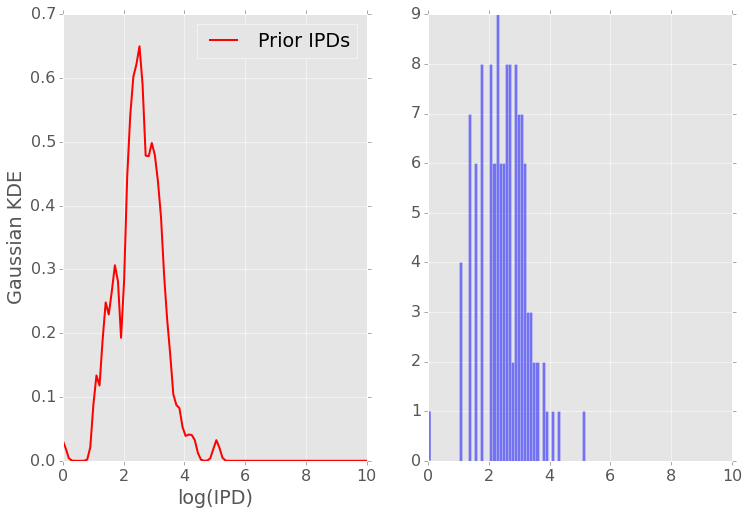

000000F motif: TCACCAGATCT n_prior: 623
	weight  : [ 0.55941073  0.44058927]
	means   : [[ 2.84143303  3.57531816]]
	AIC1:  1821.20186158 	BIC1:  1843.37459417


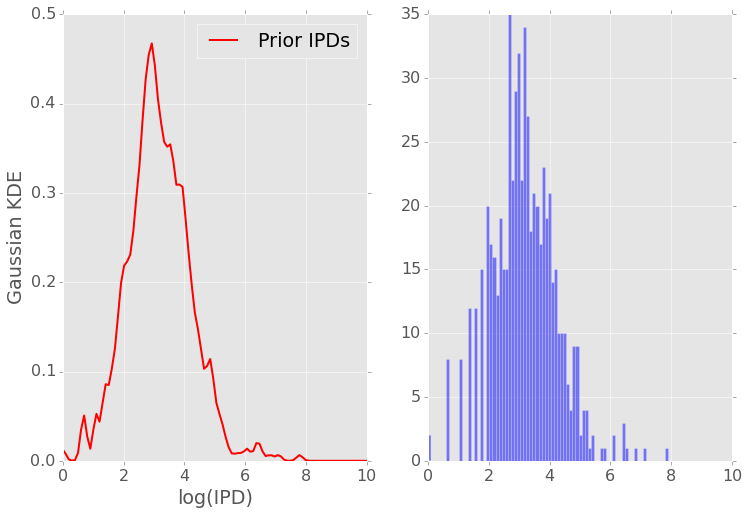

000000F motif: TTTCCAGATCT n_prior: 954
	weight  : [ 0.50399496  0.49600504]
	means   : [[ 3.31987737  2.44049955]]
	AIC1:  2404.42387375 	BIC1:  2428.72719211


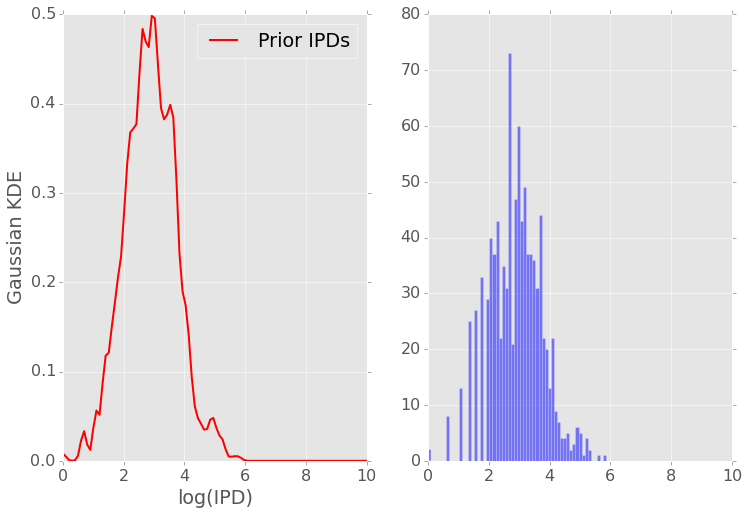

000000F motif: AGAGCAGATCT n_prior: 682
	weight  : [ 0.49545031  0.50454969]
	means   : [[ 2.37664959  3.10760311]]
	AIC1:  1701.06691888 	BIC1:  1723.69206717


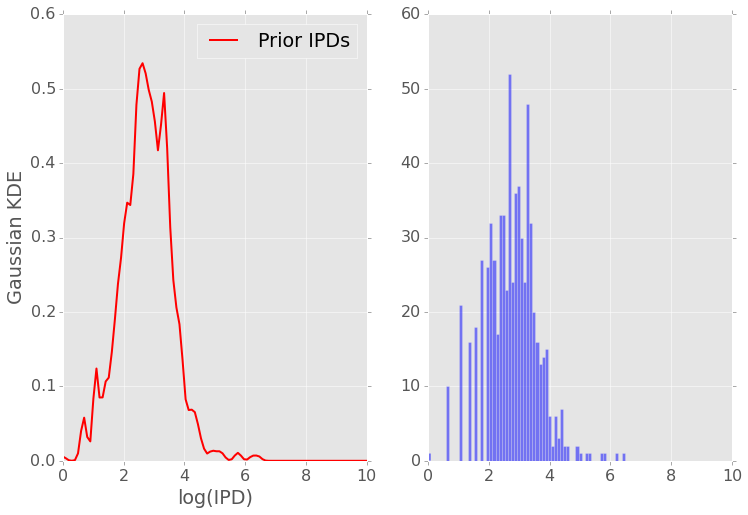

000000F motif: GATCAGATCTT n_prior: 455
	weight  : [ 0.55934302  0.44065698]
	means   : [[ 2.18923165  2.99926115]]
	AIC1:  1156.82264436 	BIC1:  1177.42413145


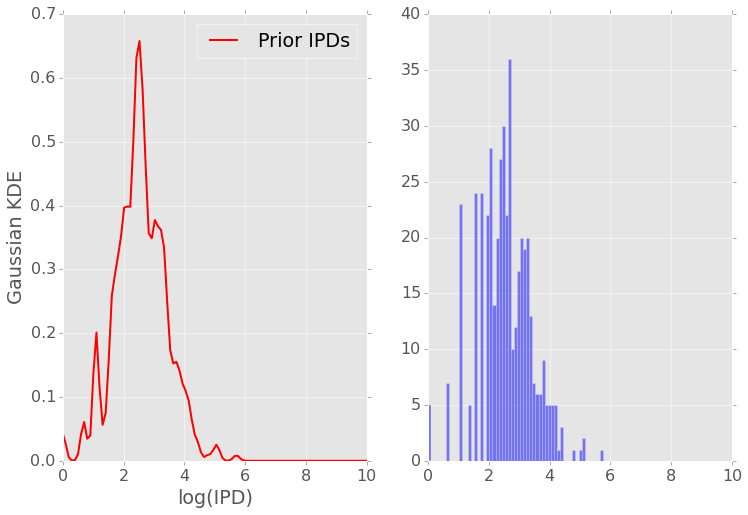

000000F motif: GATCAGATCTG n_prior: 589
	weight  : [ 0.45691006  0.54308994]
	means   : [[ 2.7711798   2.46460521]]
	AIC1:  1477.35884184 	BIC1:  1499.25097276


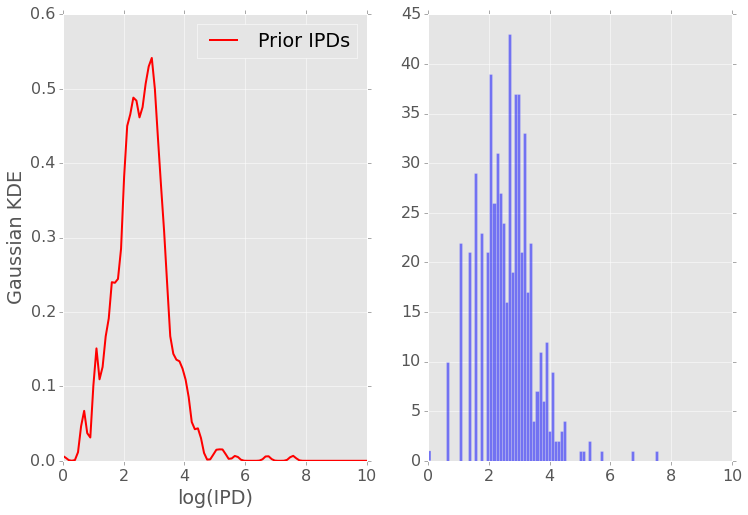

000000F motif: GATCAGATCTA n_prior: 279
	weight  : [ 0.57179101  0.42820899]
	means   : [[ 2.39784038  2.71517129]]
	AIC1:  711.157938191 	BIC1:  729.3139971


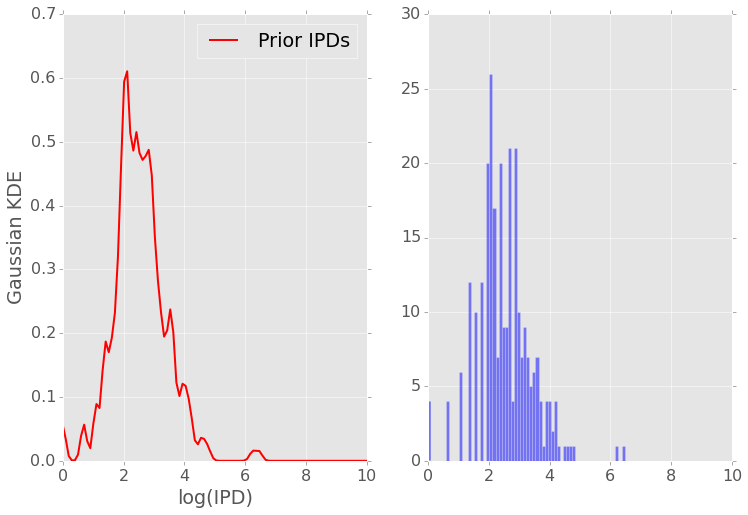

000000F motif: GATCAGATCTC n_prior: 635
	weight  : [ 0.49973285  0.50026715]
	means   : [[ 2.09160801  2.98999719]]
	AIC1:  1630.20862847 	BIC1:  1652.47675346


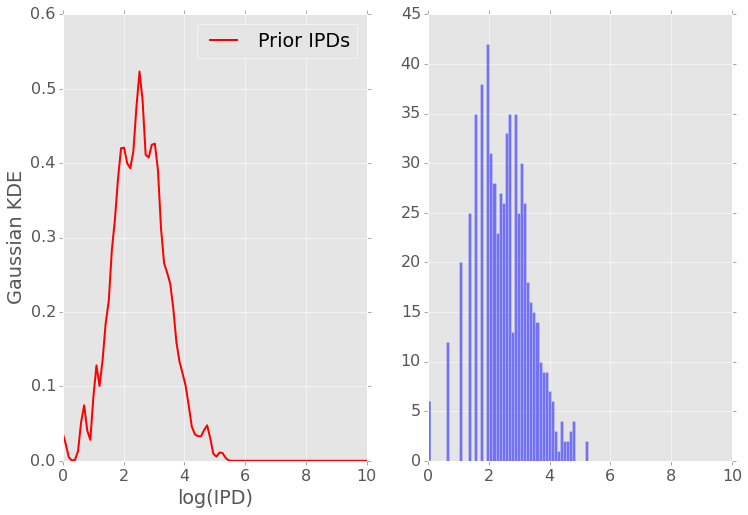

000000F motif: CAGATCTGGGG n_prior: 496
	weight  : [ 0.48848773  0.51151227]
	means   : [[ 3.0174351   2.21235593]]
	AIC1:  1286.35594725 	BIC1:  1307.38882688


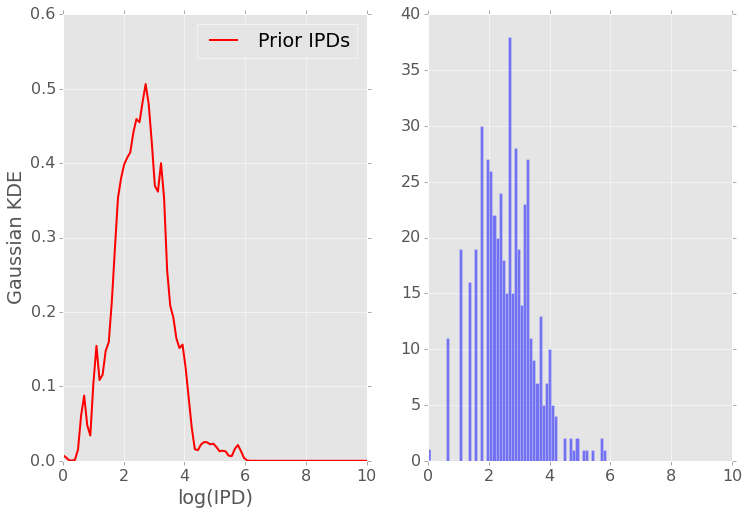

000000F motif: CAGATCTGGGA n_prior: 657
	weight  : [ 0.56151087  0.43848913]
	means   : [[ 2.46399671  2.66712784]]
	AIC1:  1674.48686627 	BIC1:  1696.92528636


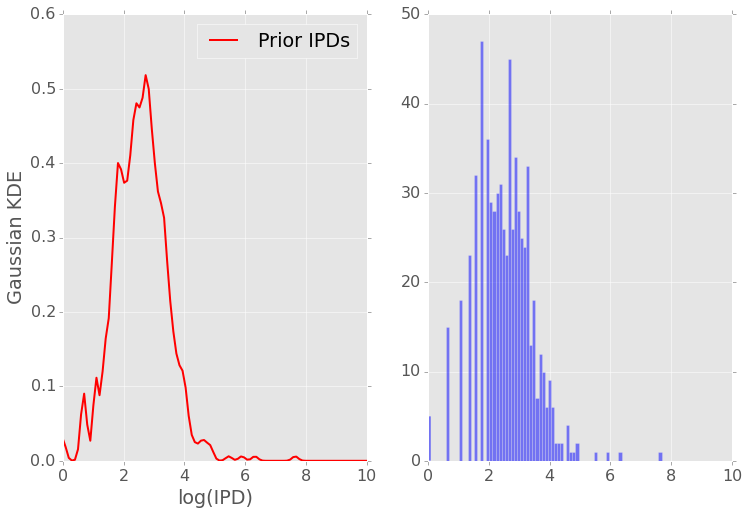

000000F motif: CAGATCTGGGC n_prior: 282
	weight  : [ 0.50670581  0.49329419]
	means   : [[ 2.19811491  3.10840108]]
	AIC1:  745.794000258 	BIC1:  764.003535613


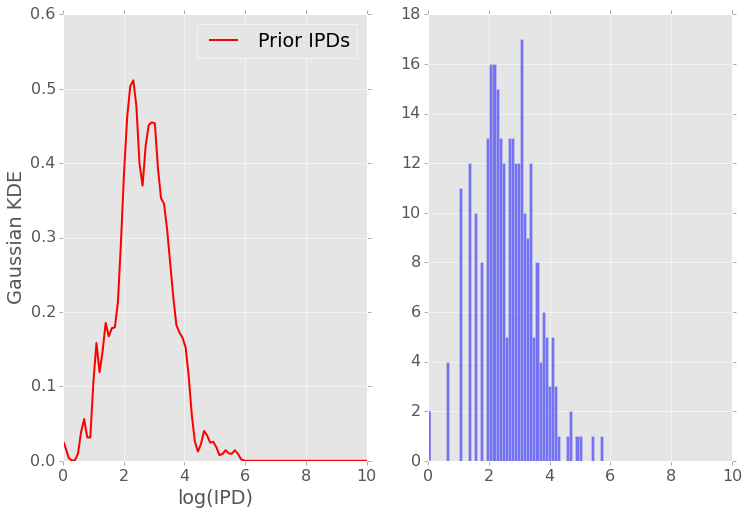

000000F motif: CAGATCTGGGT n_prior: 900
	weight  : [ 0.44274517  0.55725483]
	means   : [[ 2.93542988  2.50494576]]
	AIC1:  2326.82022612 	BIC1:  2350.83219994


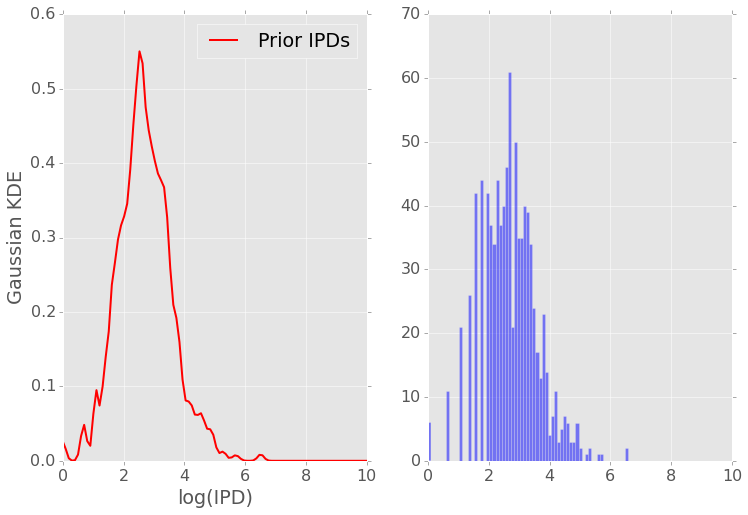

000000F motif: CCAGCAGATCT n_prior: 315
	weight  : [ 0.49328987  0.50671013]
	means   : [[ 2.28728097  3.12047077]]
	AIC1:  768.866639465 	BIC1:  787.629502659


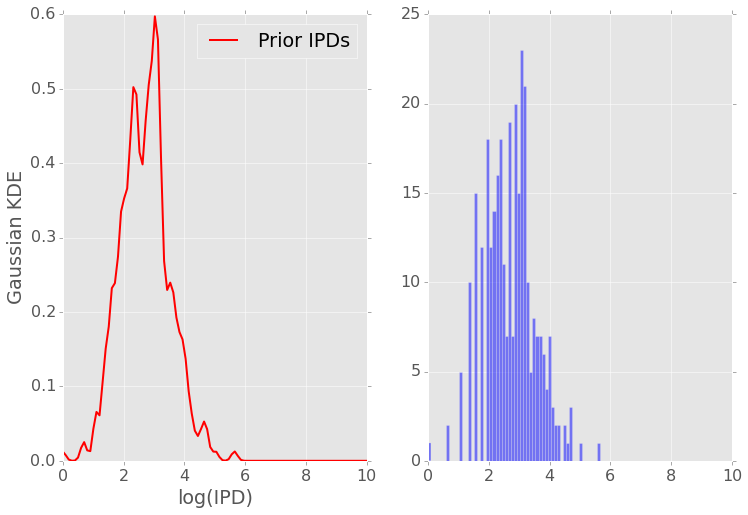

000000F motif: GTGCAGATCTA n_prior: 164
	weight  : [ 0.43602169  0.56397831]
	means   : [[ 2.67250229  2.45484125]]
	AIC1:  392.426708327 	BIC1:  407.926040466


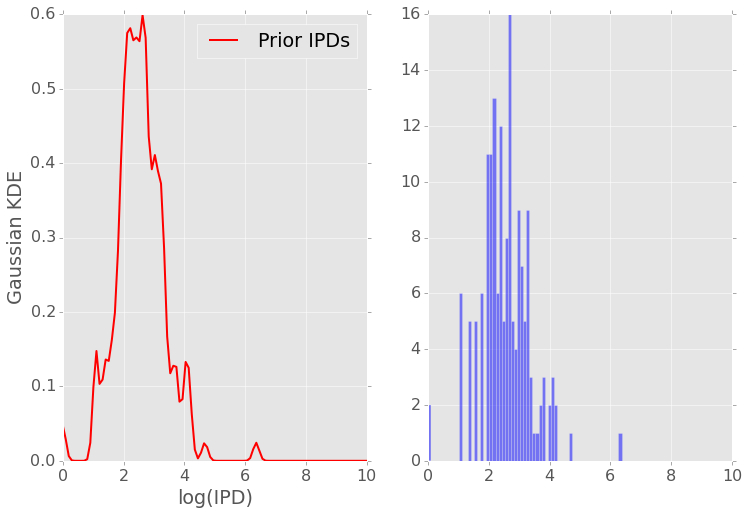

000000F motif: GTGCAGATCTC n_prior: 560
	weight  : [ 0.5088382  0.4911618]
	means   : [[ 3.34047754  2.47898856]]
	AIC1:  1404.99395799 	BIC1:  1426.63364191


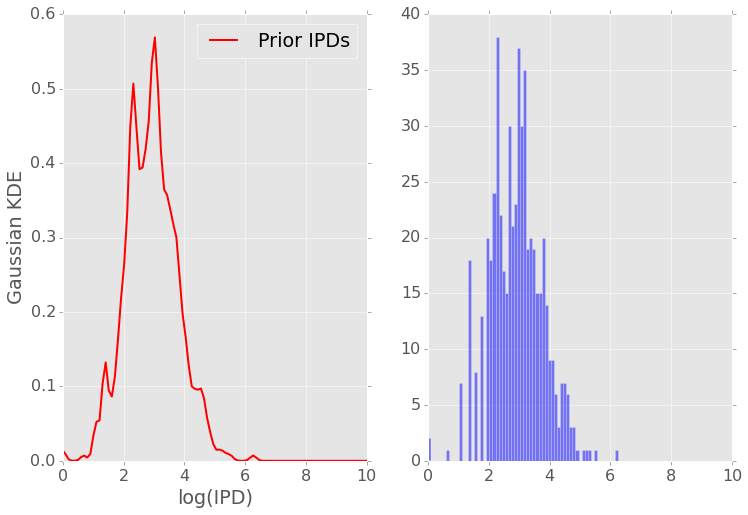

000000F motif: GTGCAGATCTG n_prior: 170
	weight  : [ 0.50850964  0.49149036]
	means   : [[ 2.47676438  3.3920514 ]]
	AIC1:  487.463696254 	BIC1:  503.14268844


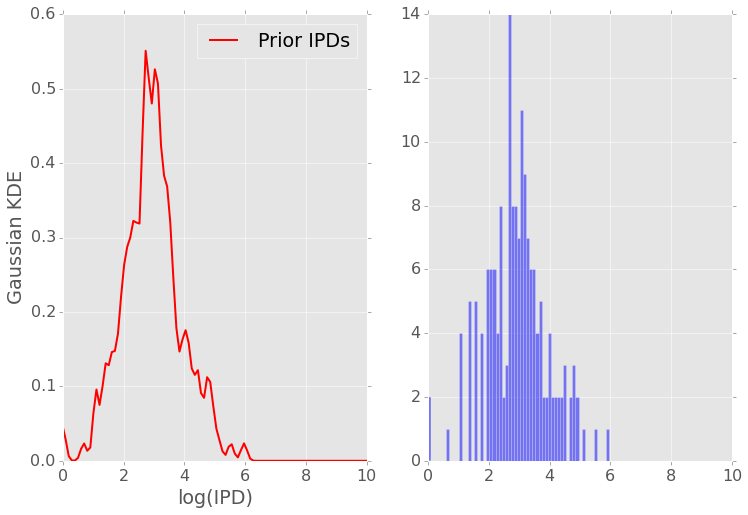

000000F motif: GTGCAGATCTT n_prior: 301
	weight  : [ 0.40262802  0.59737198]
	means   : [[ 3.06993795  2.67102111]]
	AIC1:  724.713393406 	BIC1:  743.24894473


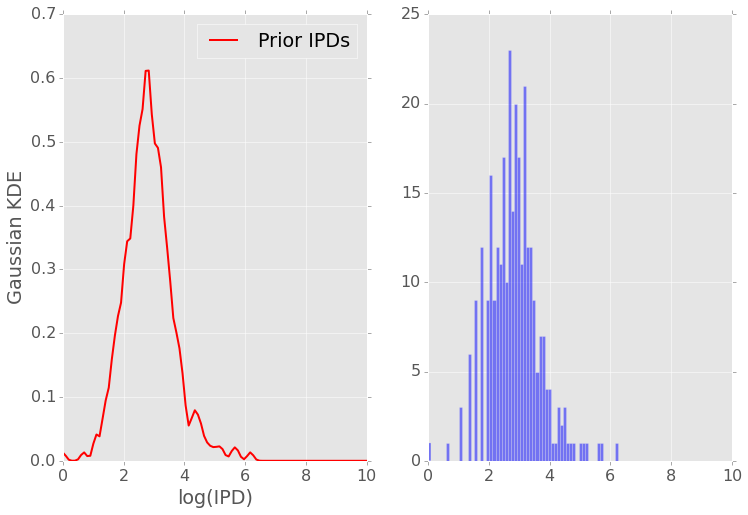

000000F motif: GAACAGATCTA n_prior: 324
	weight  : [ 0.41650446  0.58349554]
	means   : [[ 3.18292944  2.45481892]]
	AIC1:  855.677694869 	BIC1:  874.581412448


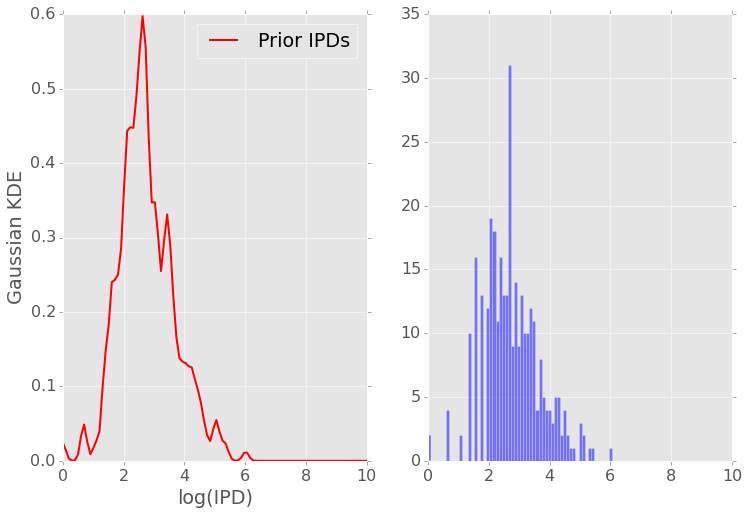

000000F motif: GAACAGATCTC n_prior: 478
	weight  : [ 0.59520458  0.40479542]
	means   : [[ 2.75018178  2.8769316 ]]
	AIC1:  1170.87522628 	BIC1:  1191.72327994


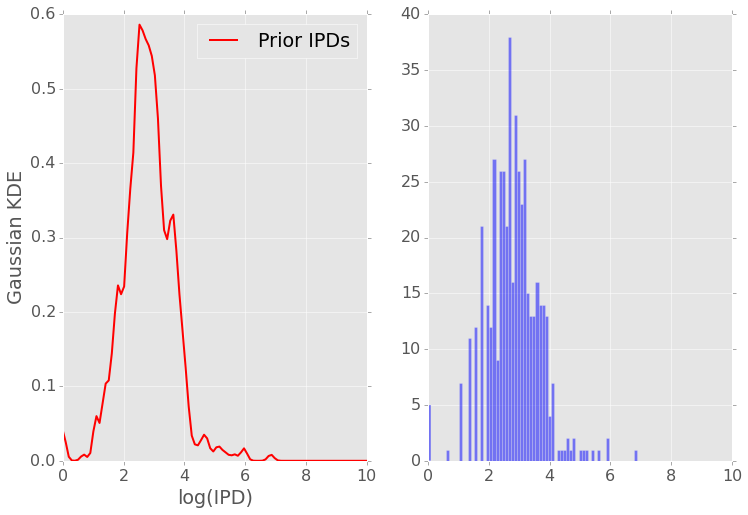

000000F motif: GAACAGATCTG n_prior: 315
	weight  : [ 0.43373692  0.56626308]
	means   : [[ 2.90216254  2.64551905]]
	AIC1:  801.930174973 	BIC1:  820.693038167


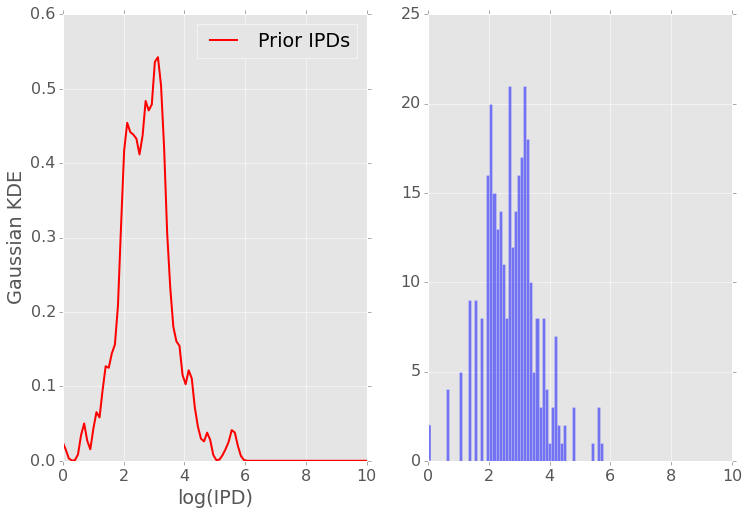

000000F motif: GAACAGATCTT n_prior: 483
	weight  : [ 0.41283993  0.58716007]
	means   : [[ 2.91640743  2.65682217]]
	AIC1:  1100.70637532 	BIC1:  1121.60645858


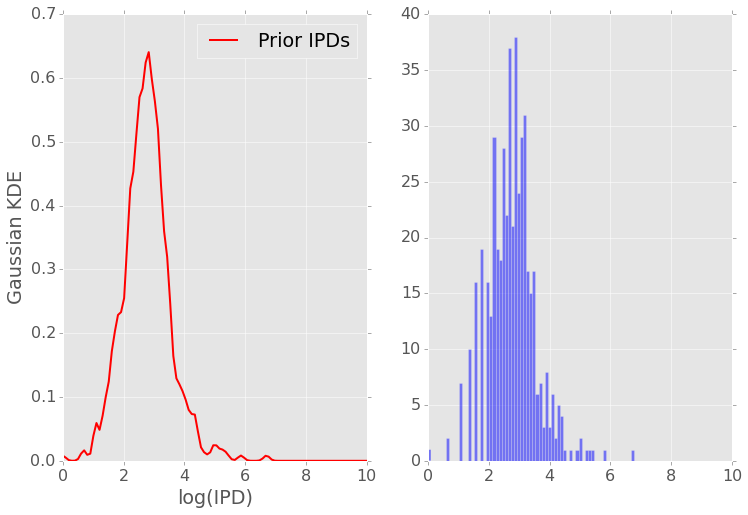

000000F motif: TCAGATCTTGA n_prior: 940
	weight  : [ 0.50665  0.49335]
	means   : [[ 2.56402633  3.40510088]]
	AIC1:  2306.2233946 	BIC1:  2330.45279398


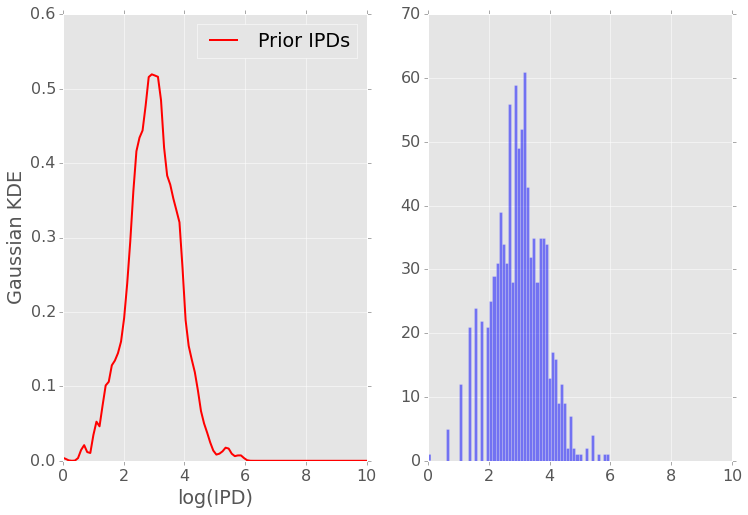

000000F motif: TCAGATCTTGC n_prior: 351
	weight  : [ 0.50049344  0.49950656]
	means   : [[ 3.50020609  2.60117671]]
	AIC1:  886.754220053 	BIC1:  906.05815117


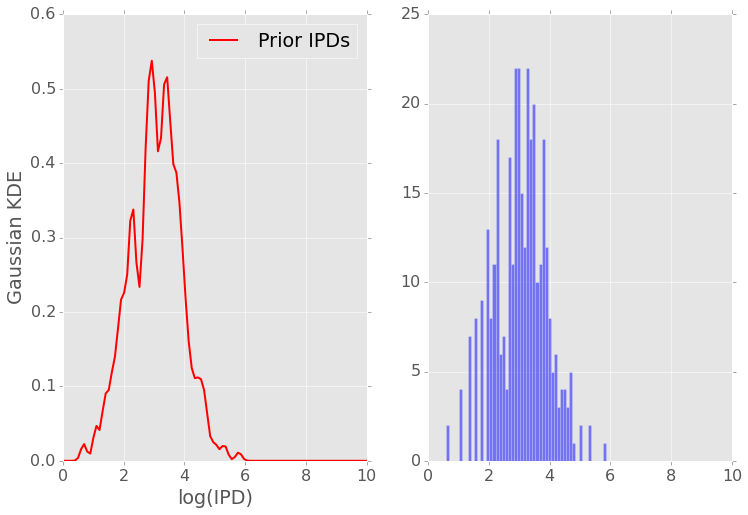

000000F motif: ACAGATCTTGT n_prior: 725
	weight  : [ 0.47623744  0.52376256]
	means   : [[ 2.6681001   3.46275792]]
	AIC1:  1689.21662255 	BIC1:  1712.14748083


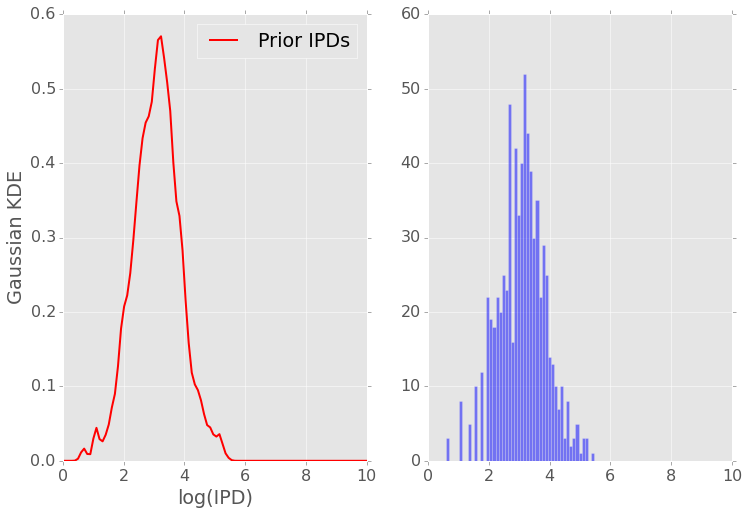

000000F motif: ACAGATCTTGA n_prior: 608
	weight  : [ 0.53048115  0.46951885]
	means   : [[ 3.40970637  2.56102233]]
	AIC1:  1476.04101018 	BIC1:  1498.09188459


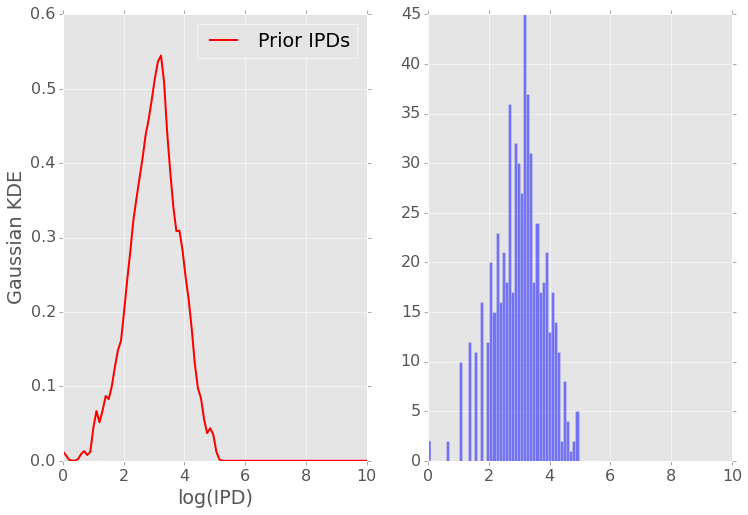

000000F motif: ACAGATCTTGC n_prior: 274
	weight  : [ 0.48790289  0.51209711]
	means   : [[ 3.49687123  2.6519101 ]]
	AIC1:  655.366166992 	BIC1:  673.431807523


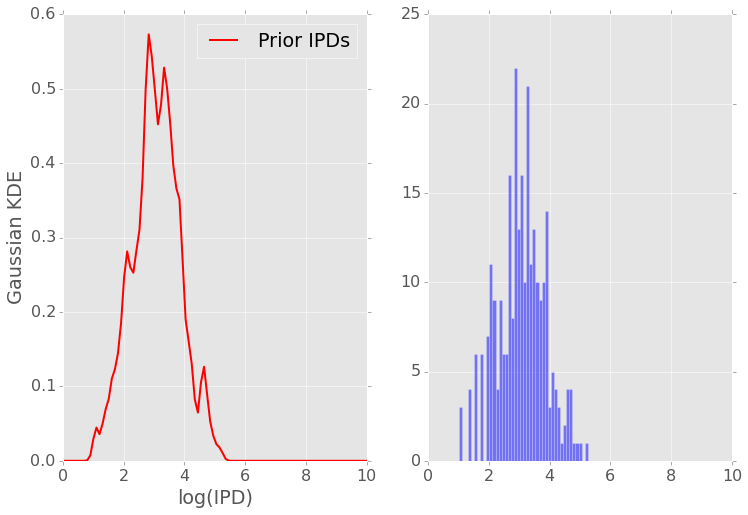

000000F motif: ACAGATCTTGG n_prior: 469
	weight  : [ 0.52668864  0.47331136]
	means   : [[ 2.57034443  3.45591969]]
	AIC1:  1204.55776612 	BIC1:  1225.31077997


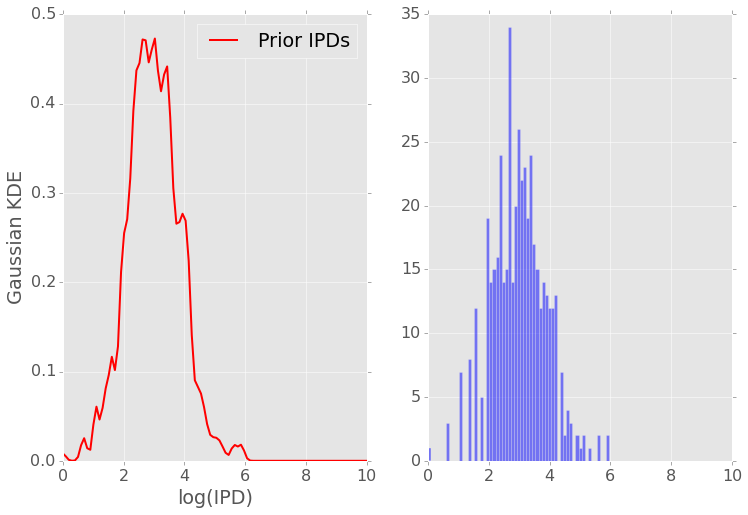

000000F motif: ATCAGATCTGG n_prior: 1000
	weight  : [ 0.43198829  0.56801171]
	means   : [[ 3.27573272  2.94562212]]
	AIC1:  2590.73054324 	BIC1:  2615.26931963


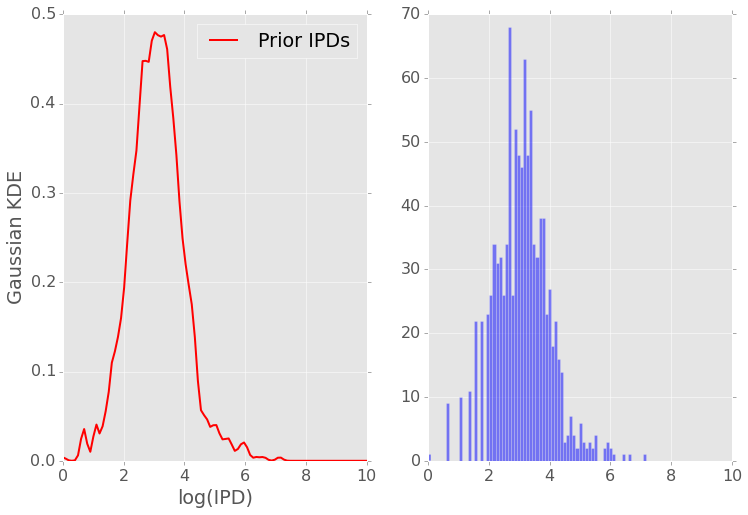

000000F motif: ATCAGATCTGC n_prior: 731
	weight  : [ 0.51581556  0.48418444]
	means   : [[ 3.40408712  2.6882593 ]]
	AIC1:  1863.82088991 	BIC1:  1886.79295721


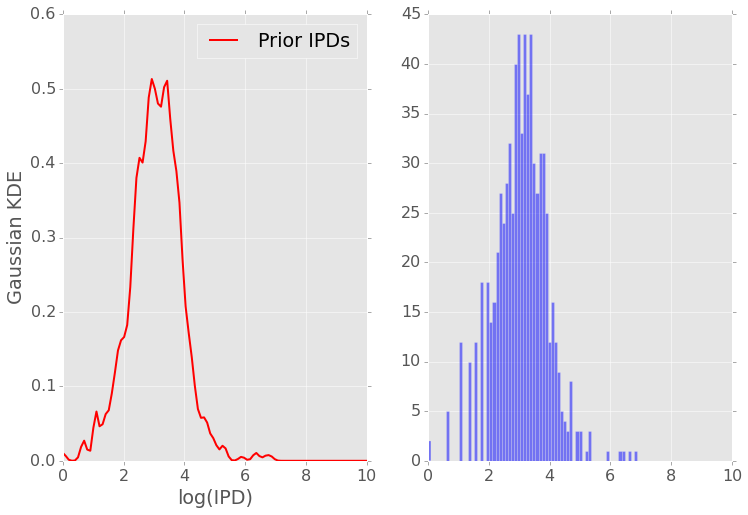

000000F motif: CAGATCTCTCT n_prior: 1000
	weight  : [ 0.51341405  0.48658595]
	means   : [[ 2.43295005  3.14056287]]
	AIC1:  2427.2062058 	BIC1:  2451.7449822


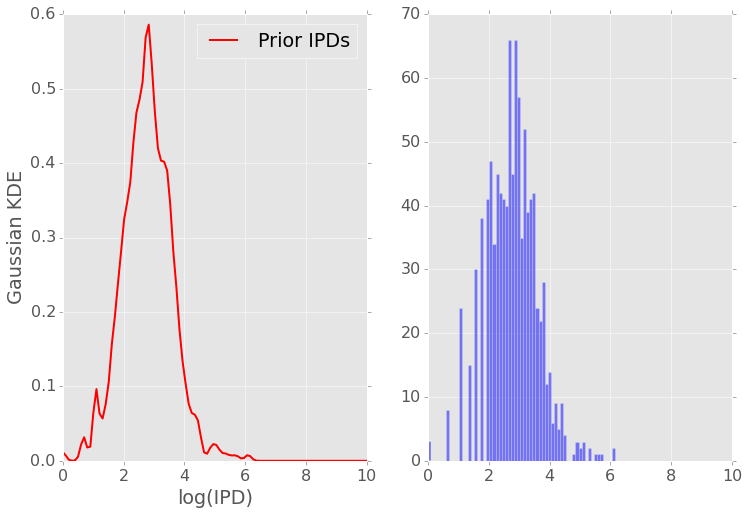

000000F motif: CAGATCTCTCC n_prior: 808
	weight  : [ 0.45715637  0.54284363]
	means   : [[ 3.22186342  2.51479315]]
	AIC1:  1999.33221838 	BIC1:  2022.80502867


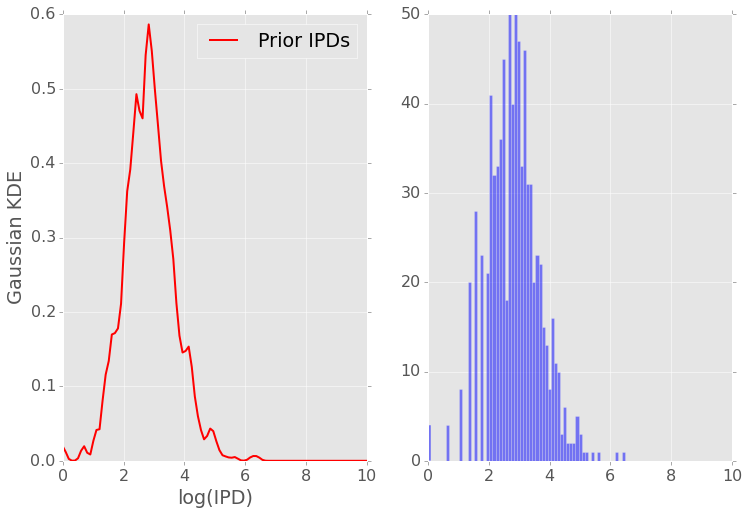

000000F motif: CAGATCTCTCA n_prior: 563
	weight  : [ 0.52335914  0.47664086]
	means   : [[ 2.32551276  3.08108684]]
	AIC1:  1329.39859824 	BIC1:  1351.06499638


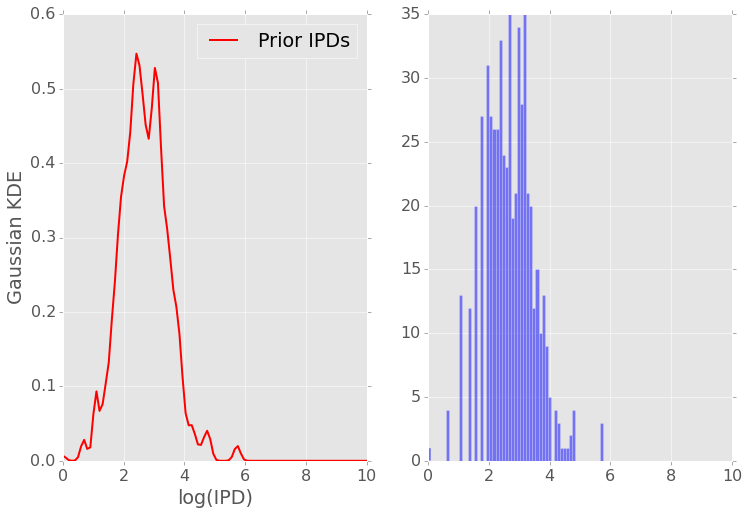

000000F motif: CAGATCTCTCG n_prior: 248
	weight  : [ 0.53796902  0.46203098]
	means   : [[ 3.13204784  2.27347126]]
	AIC1:  618.037746686 	BIC1:  635.604890417


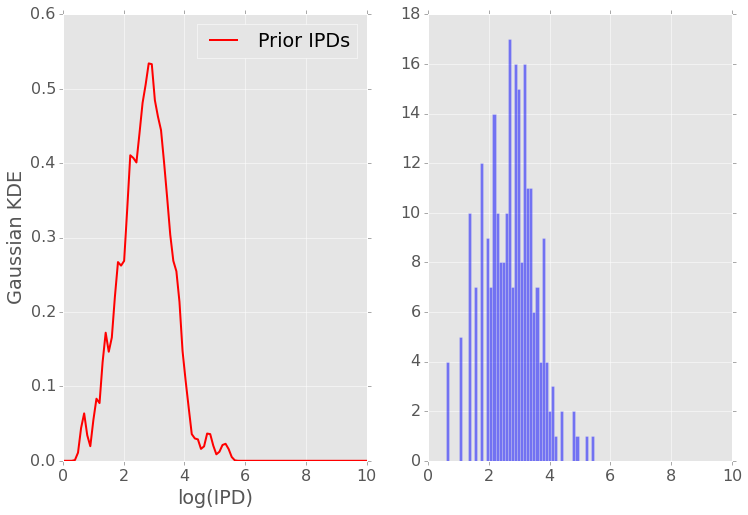

000000F motif: CAGATCTCGTC n_prior: 138
	weight  : [ 0.56091864  0.43908136]
	means   : [[ 2.2334962   3.10532512]]
	AIC1:  353.548408166 	BIC1:  368.184676591


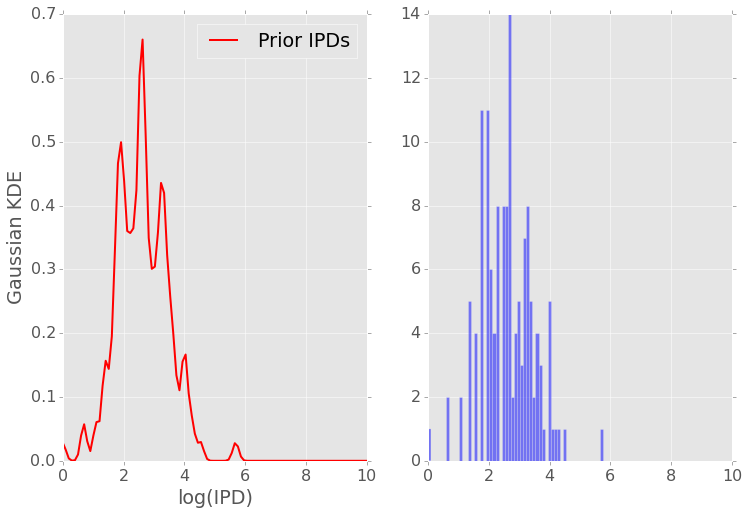

000000F motif: CGTCAGATCTC n_prior: 188
	weight  : [ 0.50067528  0.49932472]
	means   : [[ 3.0964873  2.2492521]]
	AIC1:  461.623893409 	BIC1:  477.806103223


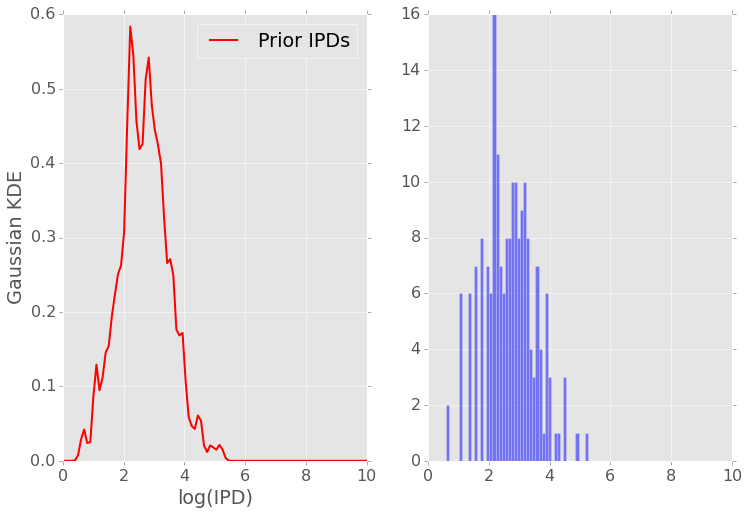

000000F motif: CGTCAGATCTG n_prior: 208
	weight  : [ 0.48379896  0.51620104]
	means   : [[ 2.23174309  2.88483071]]
	AIC1:  556.677781679 	BIC1:  573.365472078


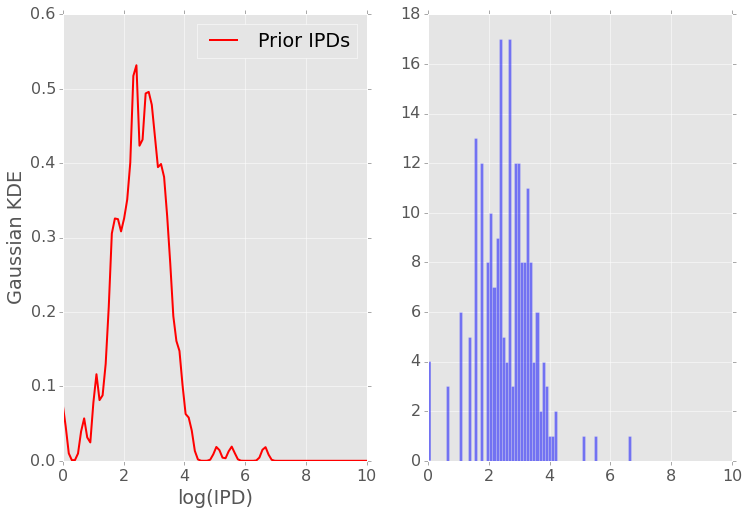

000000F motif: CGTCAGATCTT n_prior: 185
	weight  : [ 0.52411921  0.47588079]
	means   : [[ 2.20706907  3.10282458]]
	AIC1:  483.370985915 	BIC1:  499.47276504


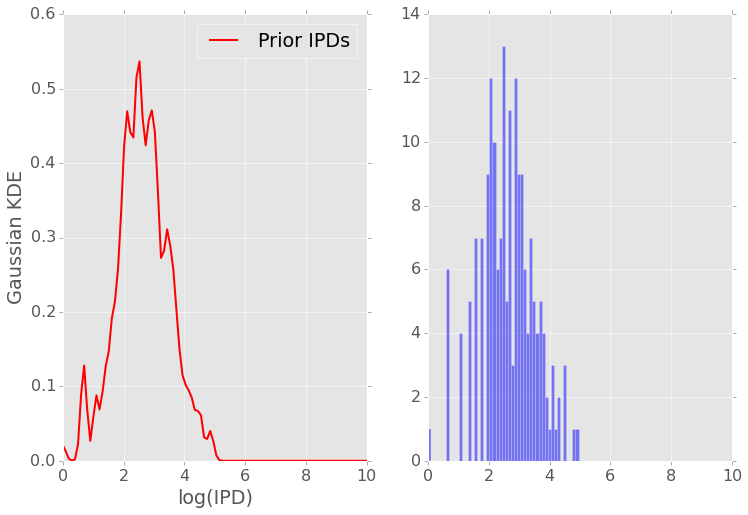

000000F motif: ACAGCAGATCT n_prior: 986
	weight  : [ 0.54869108  0.45130892]
	means   : [[ 2.48037321  3.26633326]]
	AIC1:  2370.38760991 	BIC1:  2394.85589168


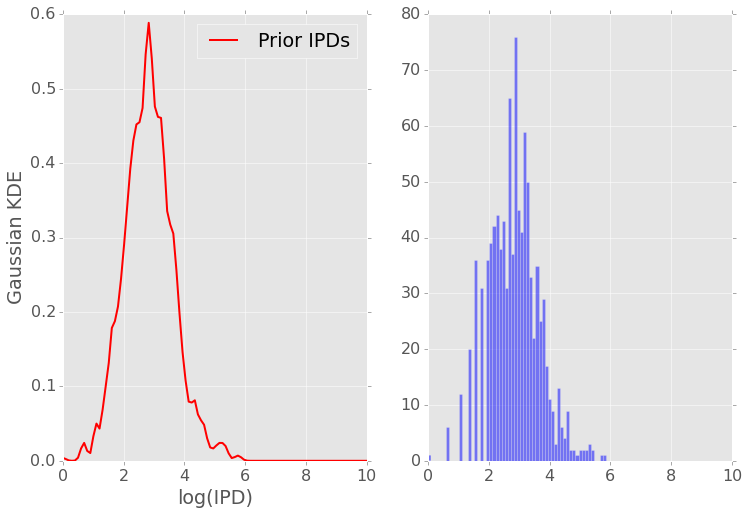

000000F motif: CAGATCTAGGT n_prior: 305
	weight  : [ 0.47639166  0.52360834]
	means   : [[ 3.43511468  2.53902845]]
	AIC1:  809.452733966 	BIC1:  828.054292849


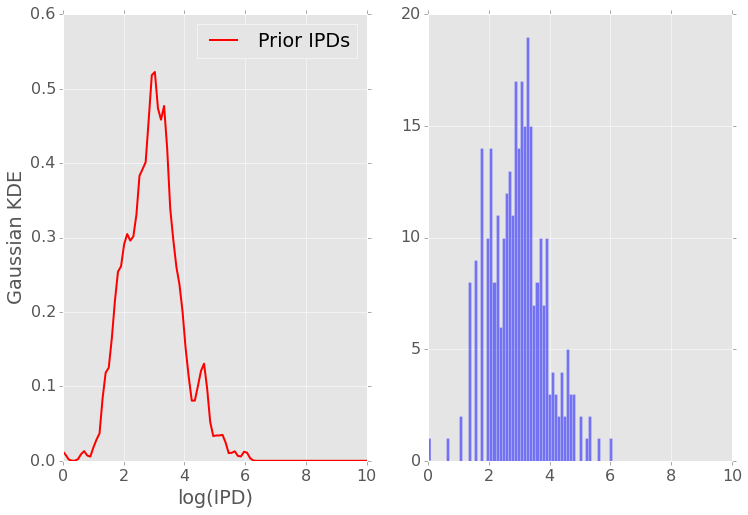

000000F motif: CAGATCTAGGC n_prior: 237
	weight  : [ 0.45865674  0.54134326]
	means   : [[ 3.14550405  2.34502877]]
	AIC1:  579.486878028 	BIC1:  596.827178733


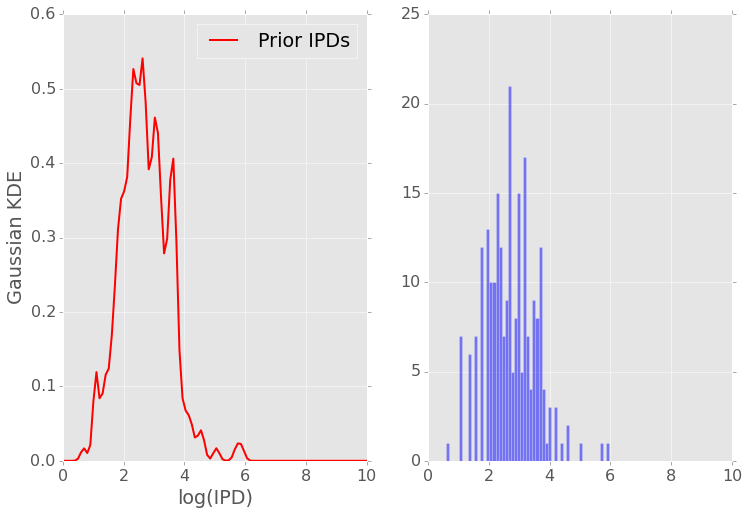

000000F motif: CAGATCTAGGG n_prior: 250
	weight  : [ 0.61888444  0.38111556]
	means   : [[ 2.82293494  3.03120791]]
	AIC1:  564.240617843 	BIC1:  581.847922432


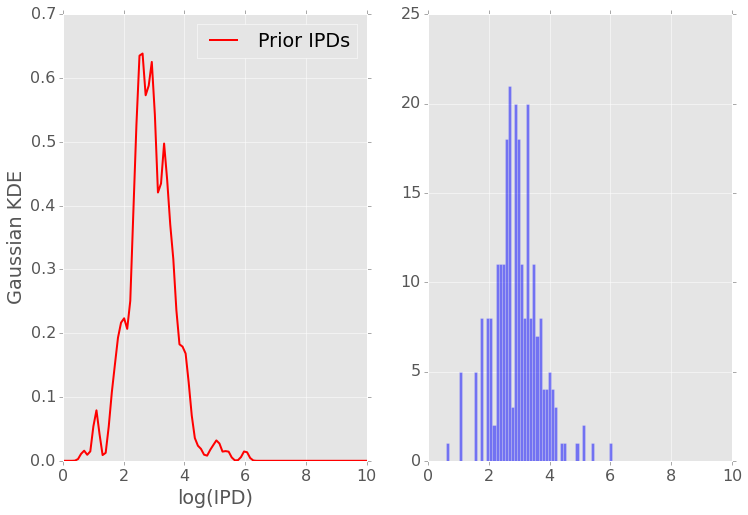

000000F motif: CCAGATCTATT n_prior: 802
	weight  : [ 0.47285721  0.52714279]
	means   : [[ 2.45071827  3.24958325]]
	AIC1:  1827.55516356 	BIC1:  1850.9907066


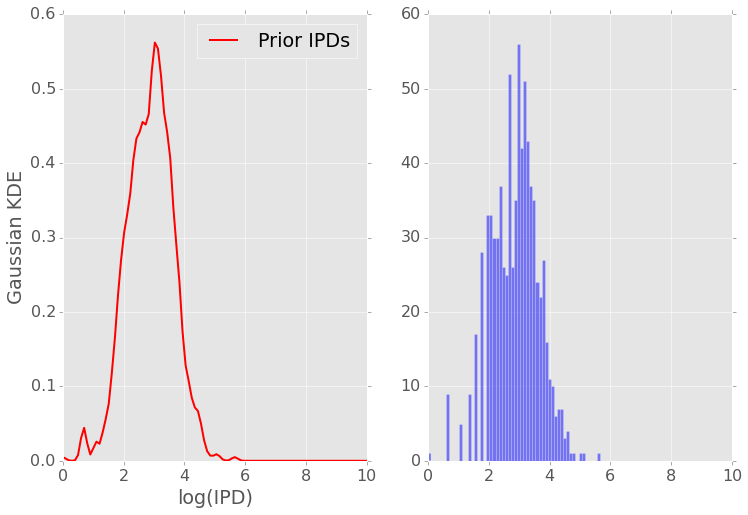

000000F motif: CCAGATCTATC n_prior: 527
	weight  : [ 0.43447653  0.56552347]
	means   : [[ 3.04769505  2.7830329 ]]
	AIC1:  1304.35011449 	BIC1:  1325.68611724


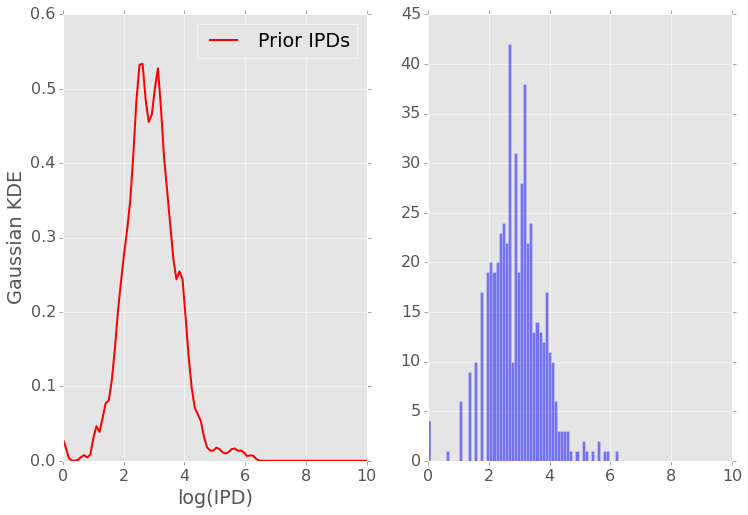

000000F motif: CCAGATCTATA n_prior: 214
	weight  : [ 0.4737278  0.5262722]
	means   : [[ 2.40951505  3.25559515]]
	AIC1:  497.974407148 	BIC1:  514.804287223


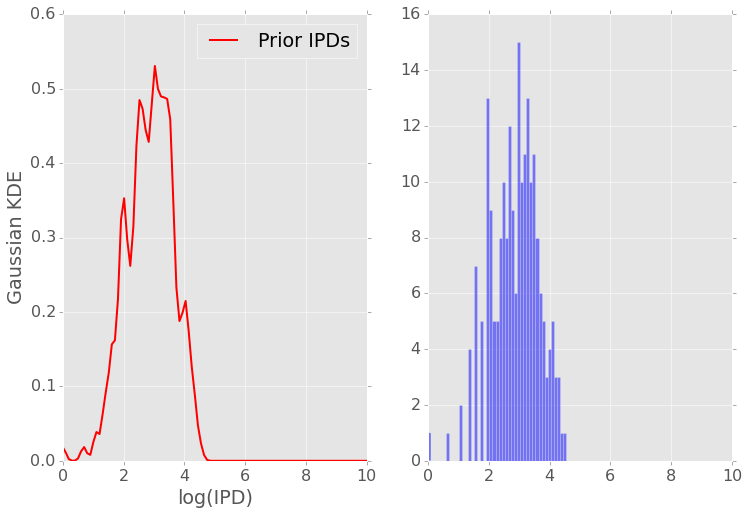

000000F motif: CCAGATCTTAT n_prior: 1000
	weight  : [ 0.50257881  0.49742119]
	means   : [[ 3.49002406  2.65156121]]
	AIC1:  2449.52881394 	BIC1:  2474.06759034


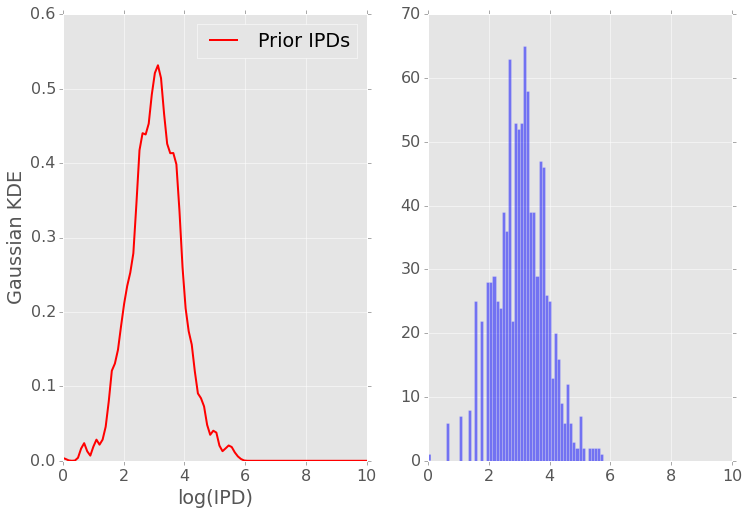

000000F motif: CCAGATCTTAA n_prior: 428
	weight  : [ 0.55991516  0.44008484]
	means   : [[ 2.97376956  3.31800582]]
	AIC1:  1091.57559389 	BIC1:  1111.87120987


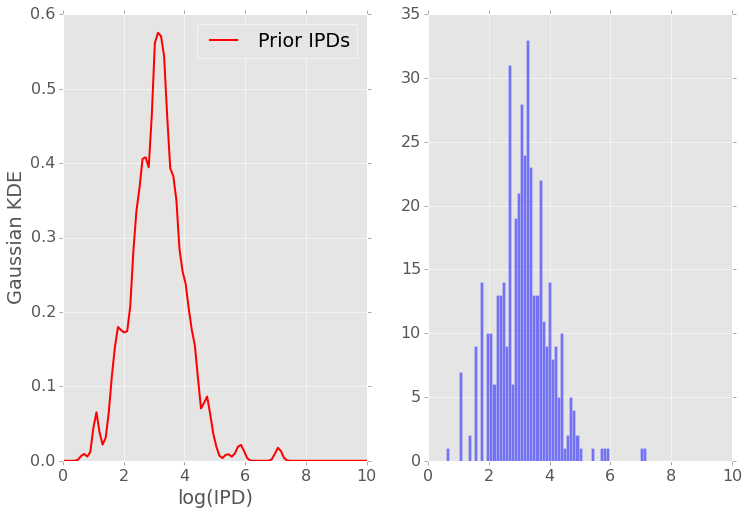

000000F motif: CCAGATCTTAC n_prior: 689
	weight  : [ 0.45616553  0.54383447]
	means   : [[ 3.60343418  2.78924316]]
	AIC1:  1682.12277584 	BIC1:  1704.79898219


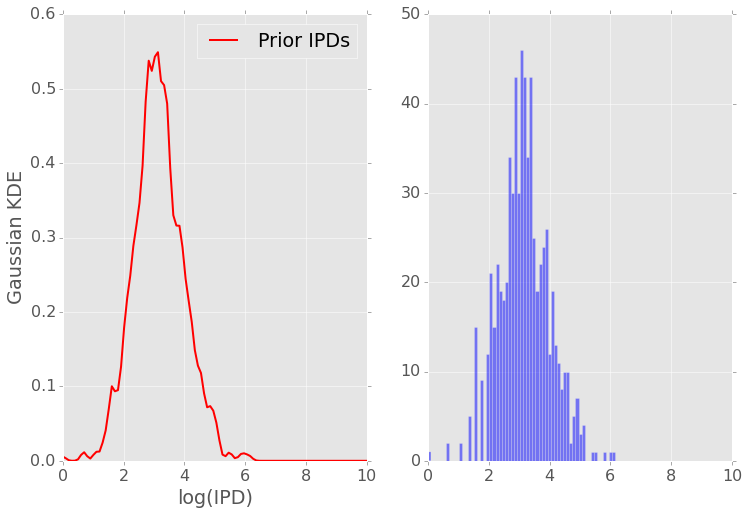

000000F motif: CCAGATCTTAG n_prior: 352
	weight  : [ 0.49849882  0.50150118]
	means   : [[ 2.63709646  3.31263255]]
	AIC1:  872.4011953 	BIC1:  891.719351178


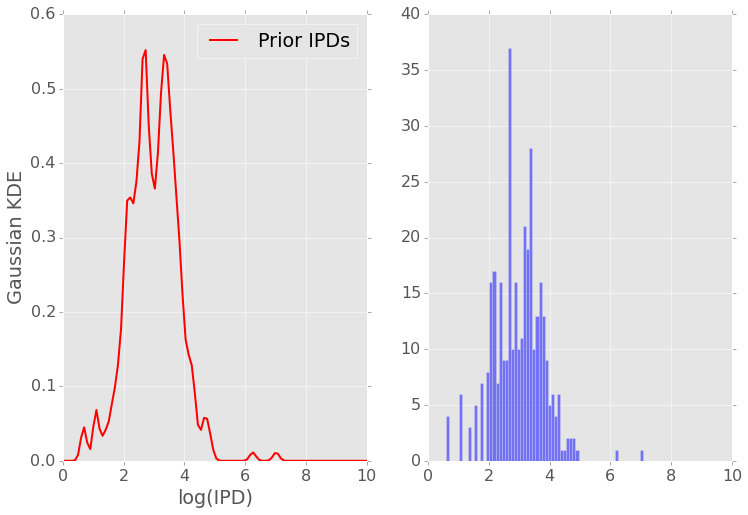

000000F motif: TTAGCAGATCT n_prior: 488
	weight  : [ 0.50882833  0.49117167]
	means   : [[ 3.2853511   2.44461466]]
	AIC1:  1277.70828657 	BIC1:  1298.65986359


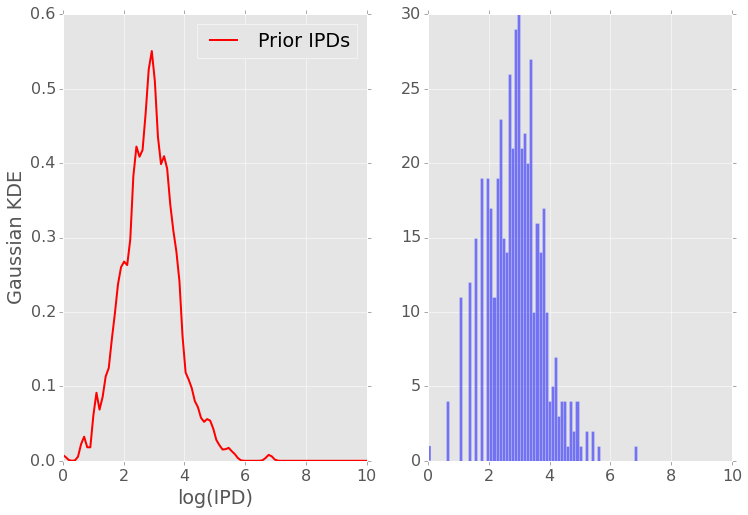

000000F motif: TTCAGATCTAT n_prior: 929
	weight  : [ 0.42422315  0.57577685]
	means   : [[ 3.43119175  3.08879767]]
	AIC1:  2471.08086124 	BIC1:  2495.25140494


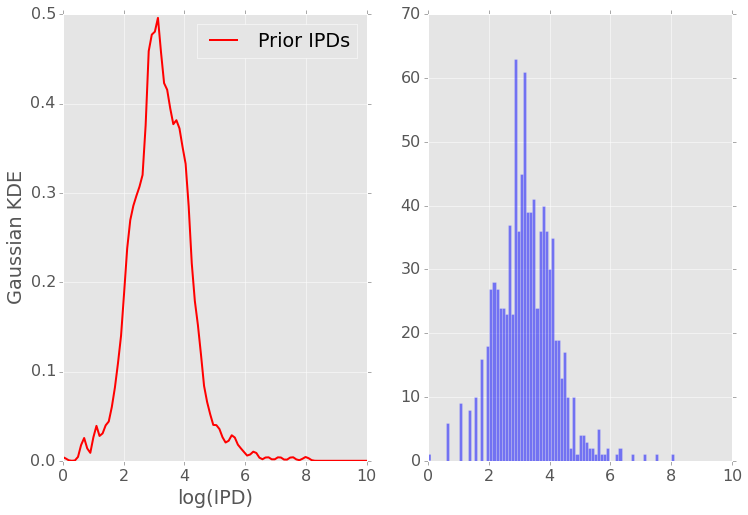

000000F motif: TTCAGATCTAA n_prior: 856
	weight  : [ 0.4930995  0.5069005]
	means   : [[ 2.82214658  3.62325524]]
	AIC1:  2149.93638152 	BIC1:  2173.6977334


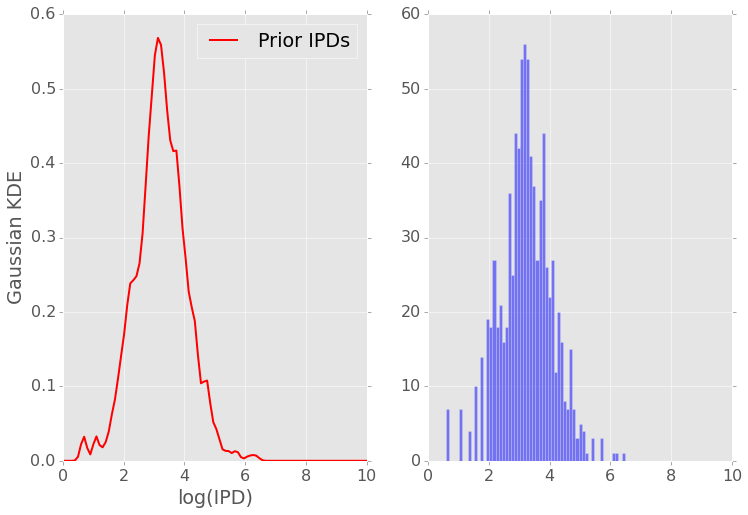

000000F motif: TTCAGATCTAC n_prior: 414
	weight  : [ 0.46096357  0.53903643]
	means   : [[ 3.73924072  2.81772836]]
	AIC1:  1053.2630863 	BIC1:  1073.39241617


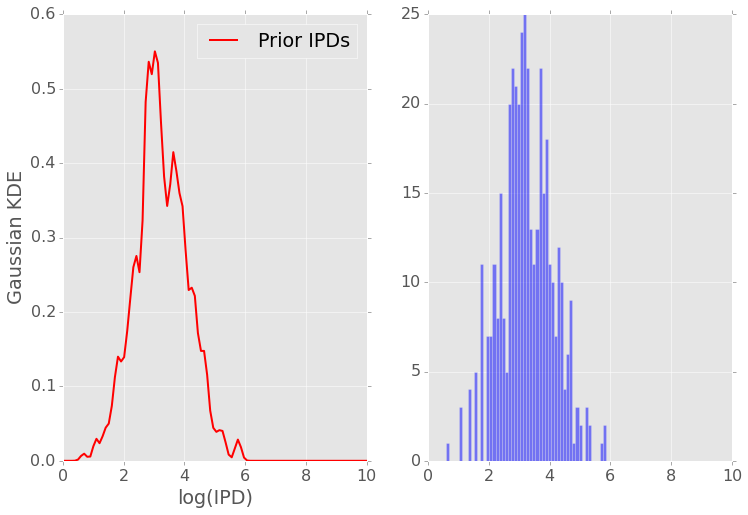

000000F motif: TTCAGATCTAG n_prior: 477
	weight  : [ 0.47072531  0.52927469]
	means   : [[ 3.57447476  2.6421912 ]]
	AIC1:  1273.51316973 	BIC1:  1294.35075218


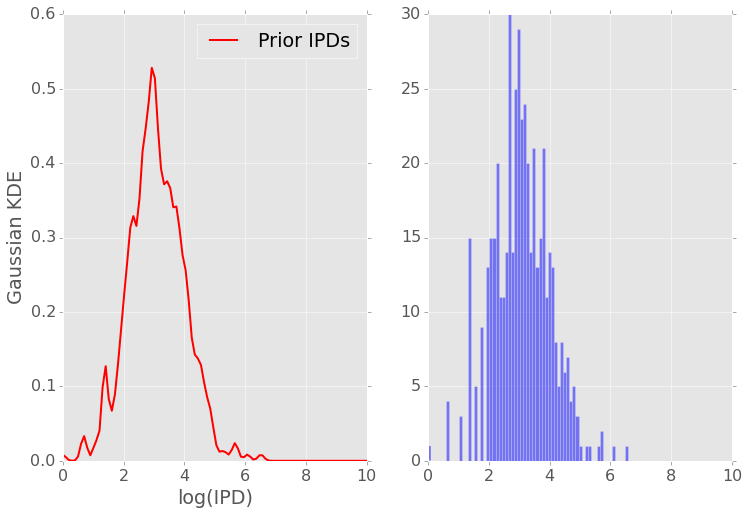

000000F motif: ACAGATCTTTG n_prior: 558
	weight  : [ 0.51992133  0.48007867]
	means   : [[ 2.6231339   3.45758747]]
	AIC1:  1357.73576243 	BIC1:  1379.35755724


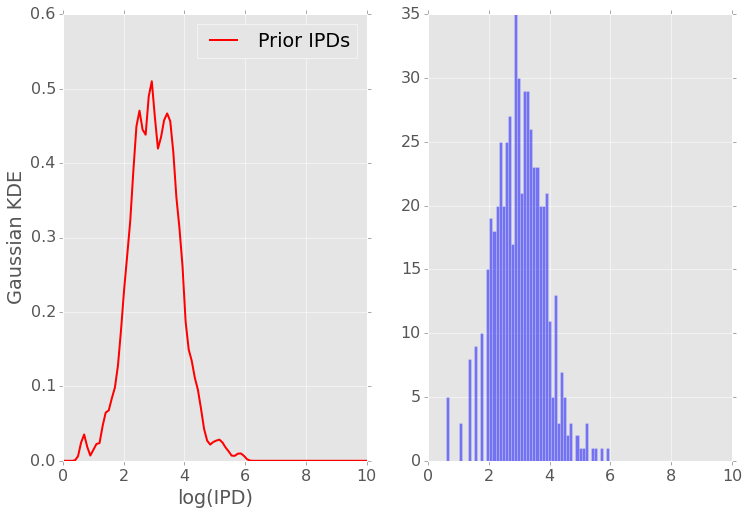

000000F motif: ACAGATCTTTA n_prior: 1000
	weight  : [ 0.49287265  0.50712735]
	means   : [[ 2.58826085  3.2467548 ]]
	AIC1:  2452.78373036 	BIC1:  2477.32250676


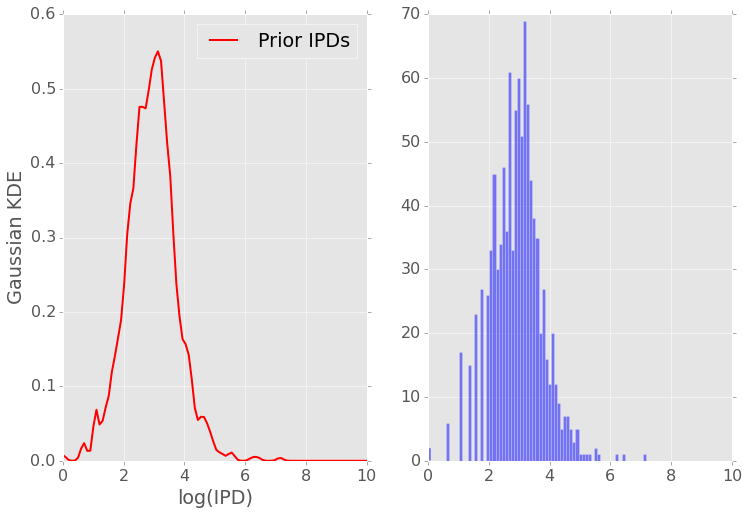

000000F motif: ACAGATCTTTC n_prior: 1000
	weight  : [ 0.56854292  0.43145708]
	means   : [[ 2.76539872  3.21059378]]
	AIC1:  2445.27666323 	BIC1:  2469.81543962


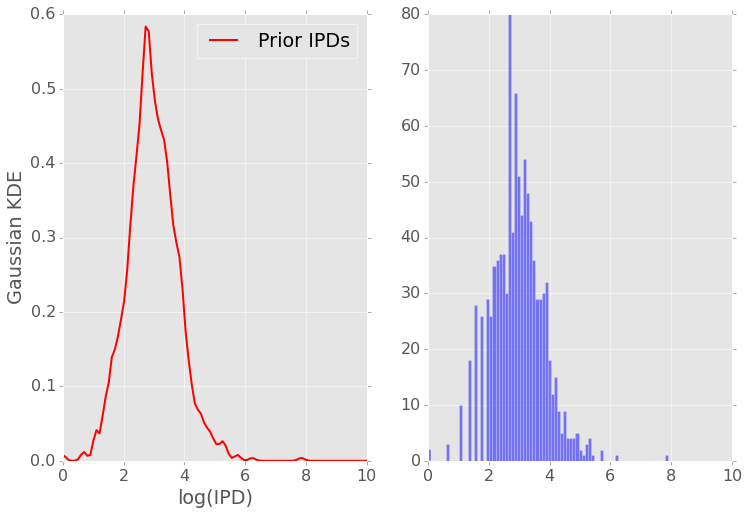

000000F motif: ACAGATCTTTT n_prior: 1000
	weight  : [ 0.50272837  0.49727163]
	means   : [[ 2.59781313  3.41501747]]
	AIC1:  2435.89764705 	BIC1:  2460.43642345


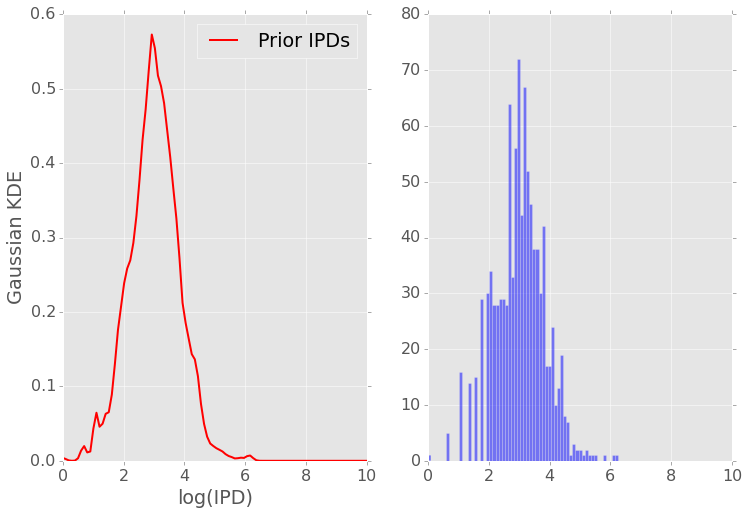

000000F motif: GTCCAGATCTT n_prior: 513
	weight  : [ 0.57761898  0.42238102]
	means   : [[ 2.57754185  2.85393495]]
	AIC1:  1249.43352589 	BIC1:  1270.63490512


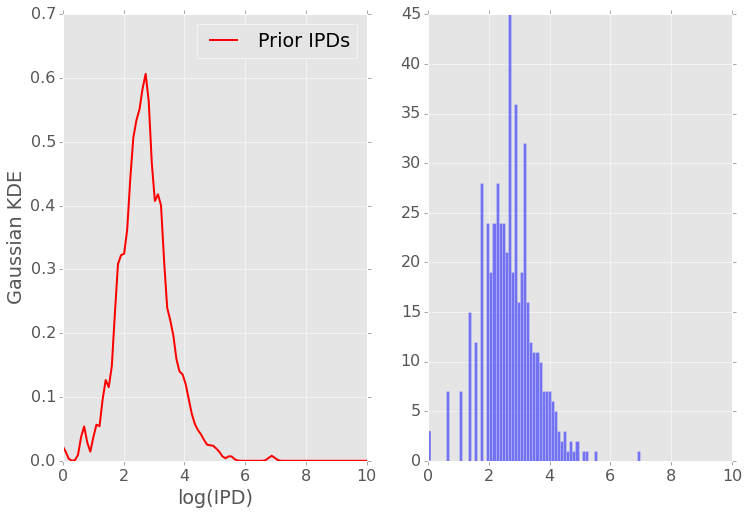

000000F motif: GTCCAGATCTG n_prior: 378
	weight  : [ 0.45424078  0.54575922]
	means   : [[ 2.89621801  2.27019747]]
	AIC1:  895.511125181 	BIC1:  915.18559616


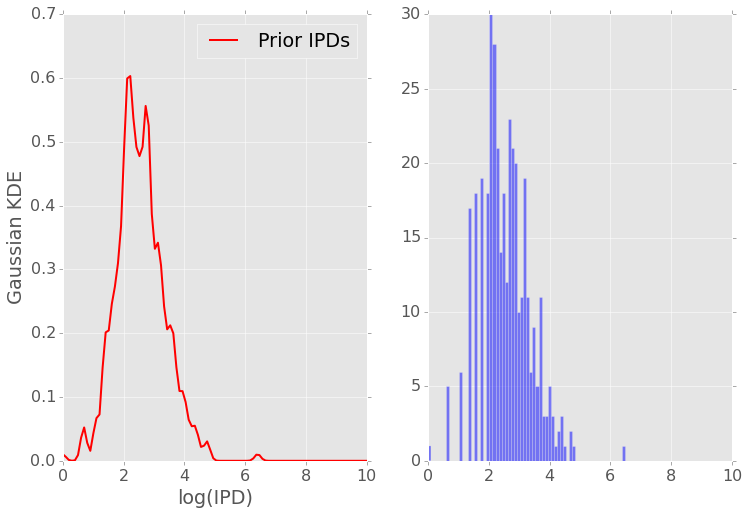

000000F motif: GTCCAGATCTA n_prior: 253
	weight  : [ 0.52201487  0.47798513]
	means   : [[ 2.85158616  2.27739813]]
	AIC1:  566.900784532 	BIC1:  584.567731976


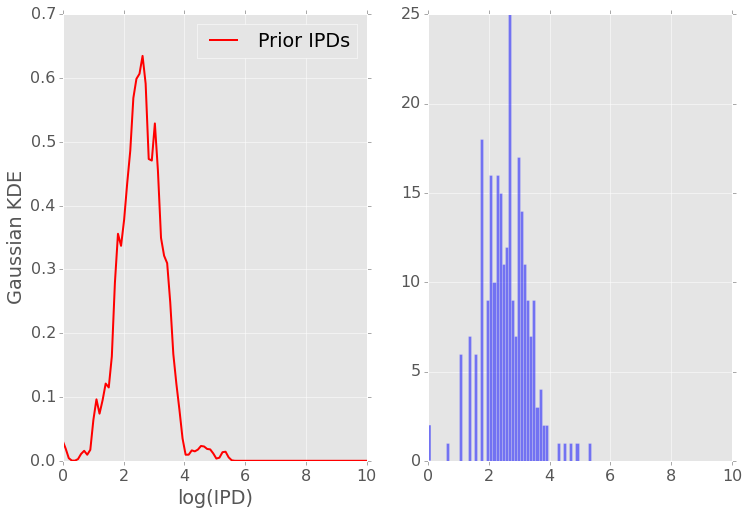

000000F motif: GTCCAGATCTC n_prior: 297
	weight  : [ 0.61059714  0.38940286]
	means   : [[ 2.56699667  3.06788794]]
	AIC1:  698.914667552 	BIC1:  717.383328246


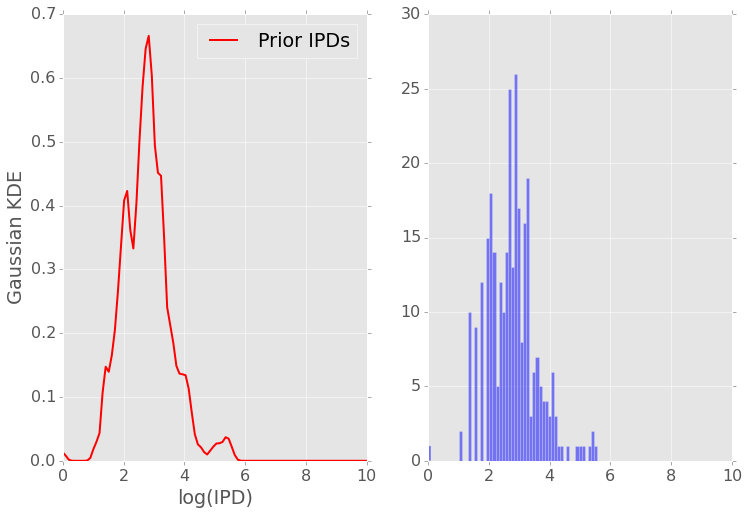

000000F motif: GCAGATCTTAT n_prior: 235
	weight  : [ 0.5850018  0.4149982]
	means   : [[ 3.2011641   2.79269754]]
	AIC1:  573.044069316 	BIC1:  590.341996887


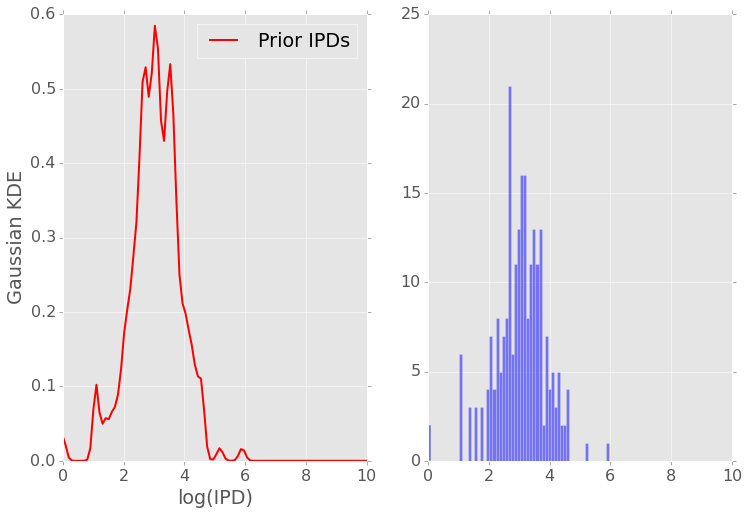

000000F motif: GCAGATCTTAA n_prior: 502
	weight  : [ 0.50407202  0.49592798]
	means   : [[ 3.47382344  2.76501402]]
	AIC1:  1201.9949357 	BIC1:  1223.0879363


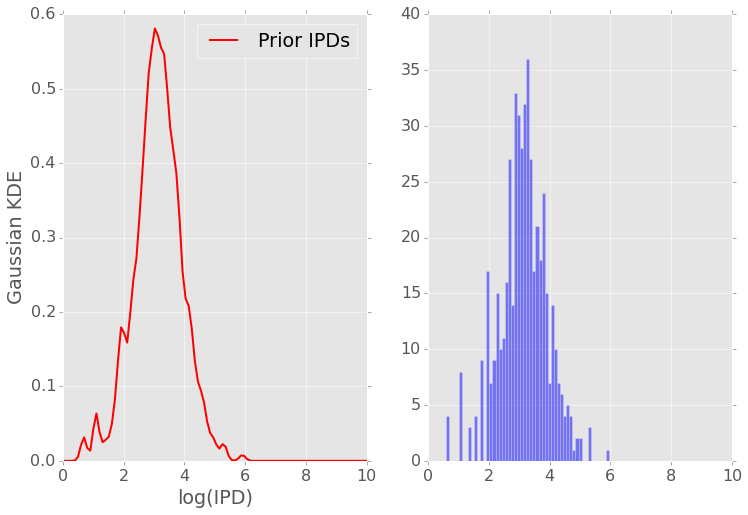

000000F motif: GCAGATCTTAC n_prior: 441
	weight  : [ 0.49010979  0.50989021]
	means   : [[ 2.74178859  3.49269485]]
	AIC1:  1169.1637047 	BIC1:  1189.60892908


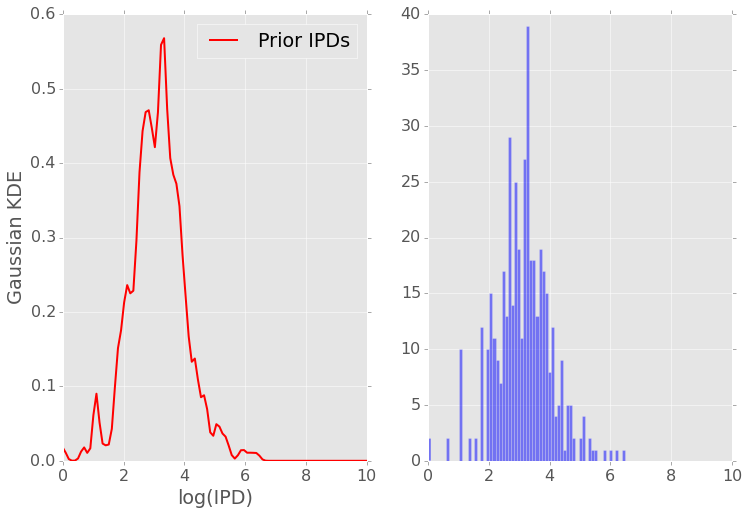

000000F motif: TCAGATCTCCT n_prior: 1000
	weight  : [ 0.52344223  0.47655777]
	means   : [[ 3.31365192  2.46599111]]
	AIC1:  2476.36279215 	BIC1:  2500.90156855


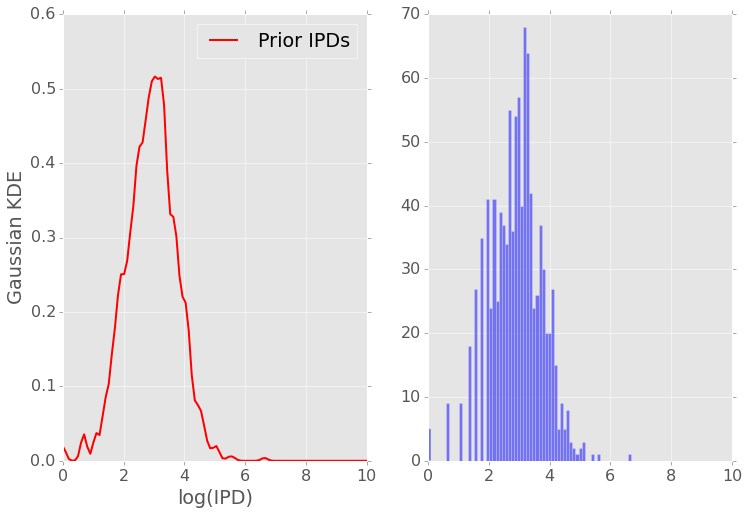

000000F motif: TCAGATCTCCC n_prior: 518
	weight  : [ 0.49763179  0.50236821]
	means   : [[ 3.35508035  2.48065298]]
	AIC1:  1313.2360388 	BIC1:  1334.48591501


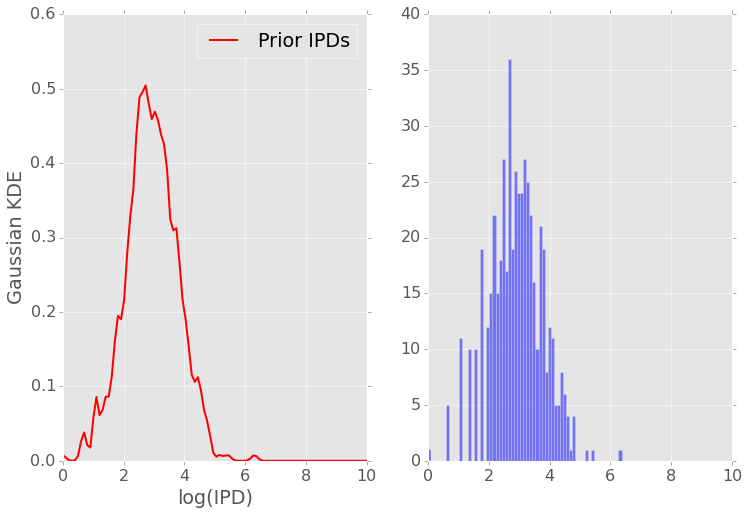

000000F motif: TCAGATCTCCA n_prior: 1000
	weight  : [ 0.52554319  0.47445681]
	means   : [[ 3.3832772   2.49906069]]
	AIC1:  2516.88409717 	BIC1:  2541.42287356


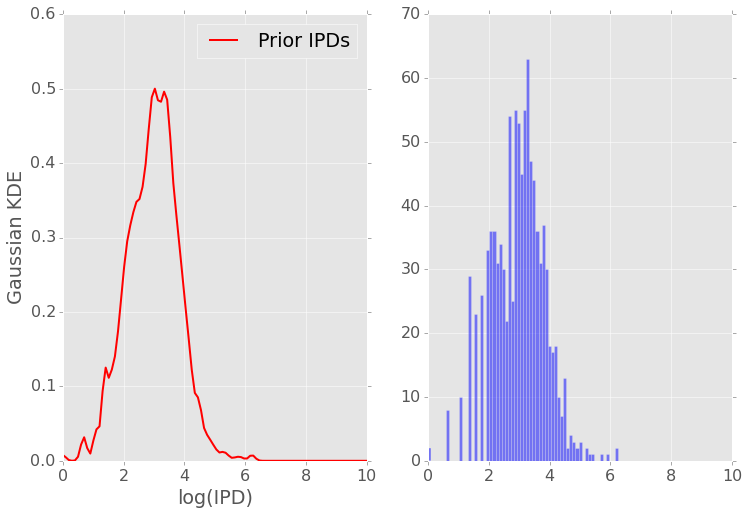

000000F motif: TCAGATCTCCG n_prior: 89
	weight  : [ 0.56811775  0.43188225]
	means   : [[ 3.24033201  2.36983248]]
	AIC1:  235.541823435 	BIC1:  247.985005284


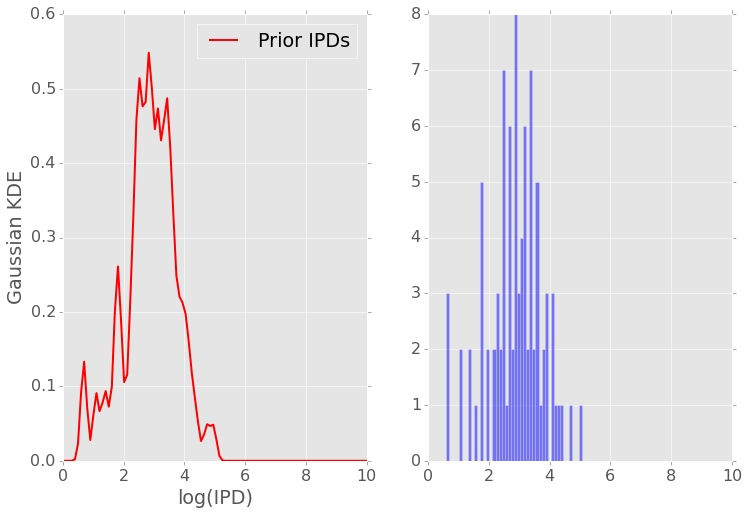

000000F motif: TCCAGATCTCT n_prior: 945
	weight  : [ 0.46930297  0.53069703]
	means   : [[ 2.48904718  3.19544027]]
	AIC1:  2267.9955221 	BIC1:  2292.25144674


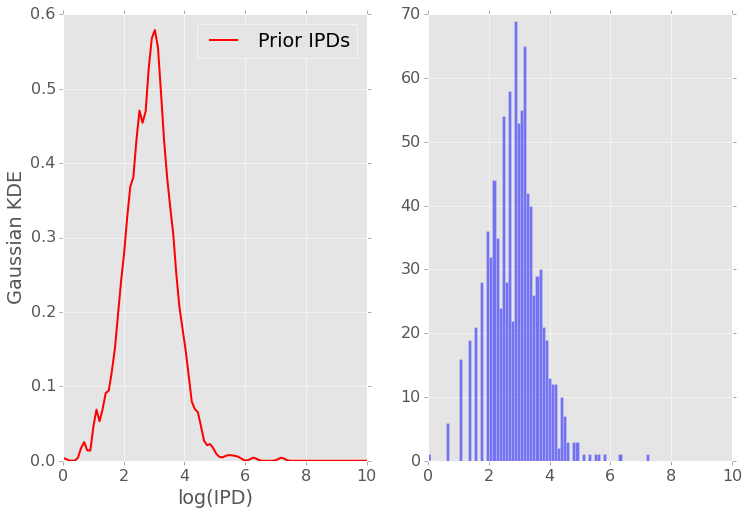

000000F motif: TCCAGATCTCC n_prior: 235
	weight  : [ 0.54061003  0.45938997]
	means   : [[ 3.44472968  2.56703406]]
	AIC1:  597.830080589 	BIC1:  615.12800816


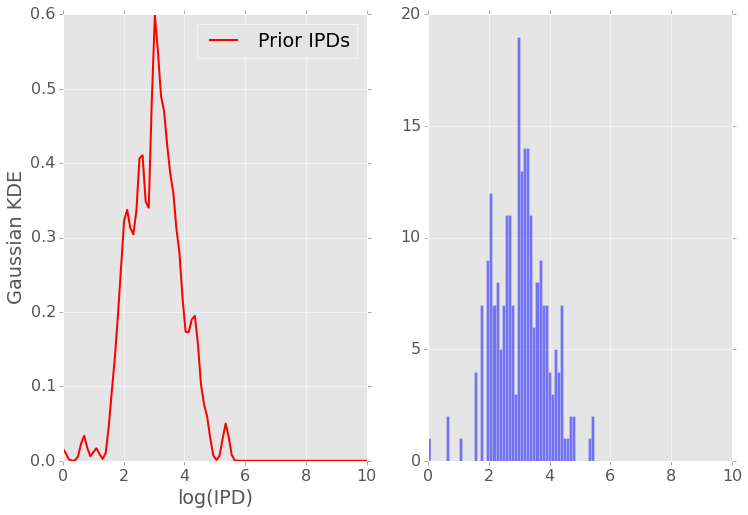

000000F motif: TCCAGATCTCA n_prior: 1000
	weight  : [ 0.48451369  0.51548631]
	means   : [[ 2.48660656  3.22262364]]
	AIC1:  2573.42718376 	BIC1:  2597.96596015


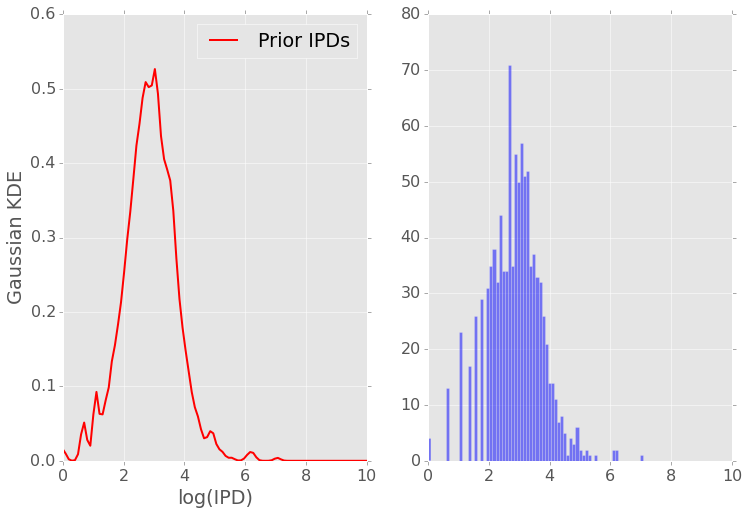

000000F motif: CAGATCTTTAA n_prior: 1000
	weight  : [ 0.49082033  0.50917967]
	means   : [[ 3.40072432  2.5475583 ]]
	AIC1:  2490.82293343 	BIC1:  2515.36170982


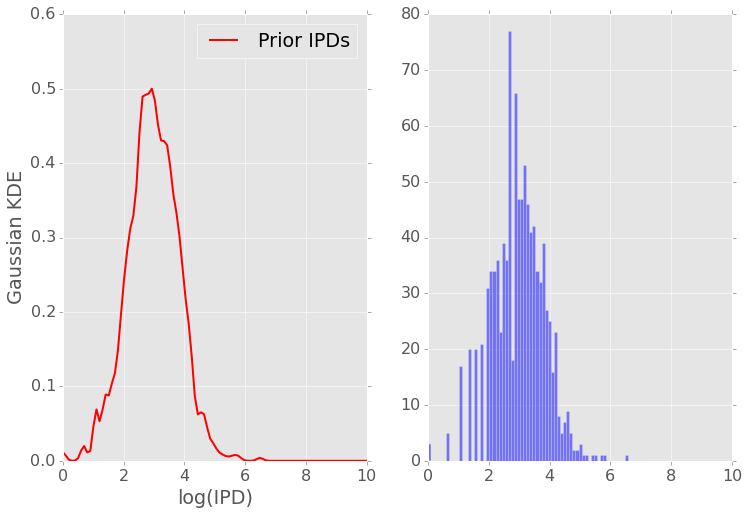

000000F motif: CAGATCTTTAC n_prior: 365
	weight  : [ 0.49847744  0.50152256]
	means   : [[ 2.6671348   3.68107317]]
	AIC1:  982.220919856 	BIC1:  1001.72040662


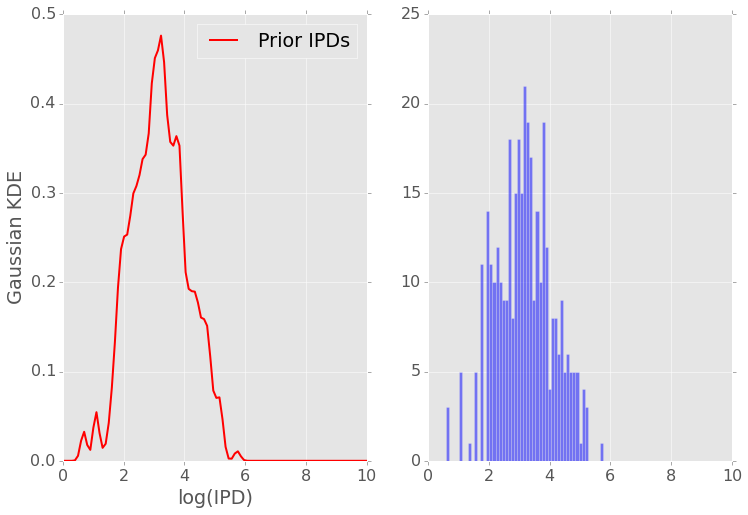

000000F motif: CAGATCTTTAG n_prior: 700
	weight  : [ 0.53972313  0.46027687]
	means   : [[ 2.54083497  3.36208502]]
	AIC1:  1650.48853831 	BIC1:  1673.24393998


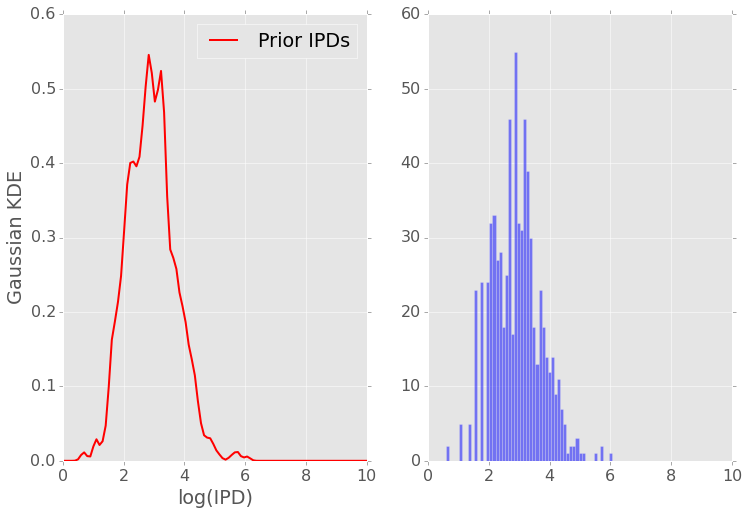

000000F motif: CAGATCTTTAT n_prior: 832
	weight  : [ 0.4914845  0.5085155]
	means   : [[ 3.37965065  2.5165659 ]]
	AIC1:  2079.58334755 	BIC1:  2103.20250976


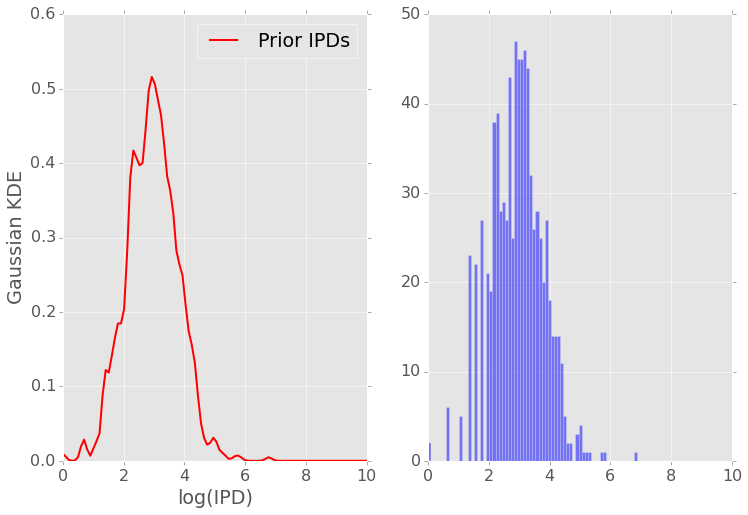

000000F motif: TAGCAGATCTG n_prior: 366
	weight  : [ 0.44183611  0.55816389]
	means   : [[ 2.856044    2.59374884]]
	AIC1:  877.821731343 	BIC1:  897.33489801


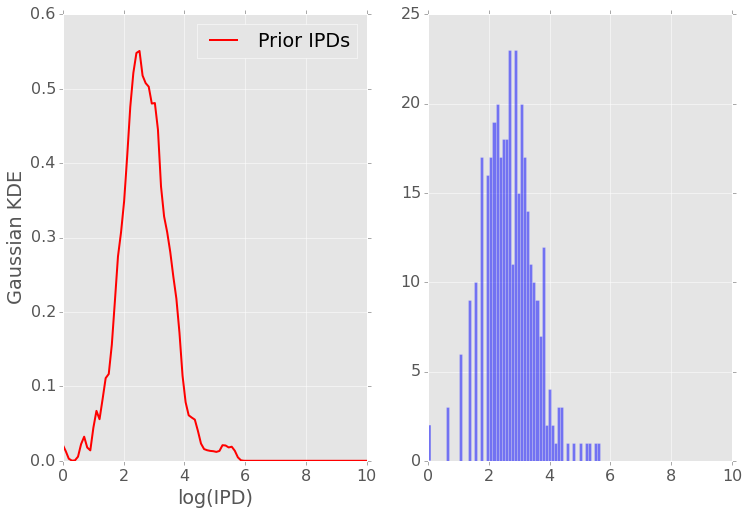

000000F motif: TAGCAGATCTA n_prior: 258
	weight  : [ 0.50091461  0.49908539]
	means   : [[ 2.94580824  1.99497546]]
	AIC1:  682.228297938 	BIC1:  699.993095862


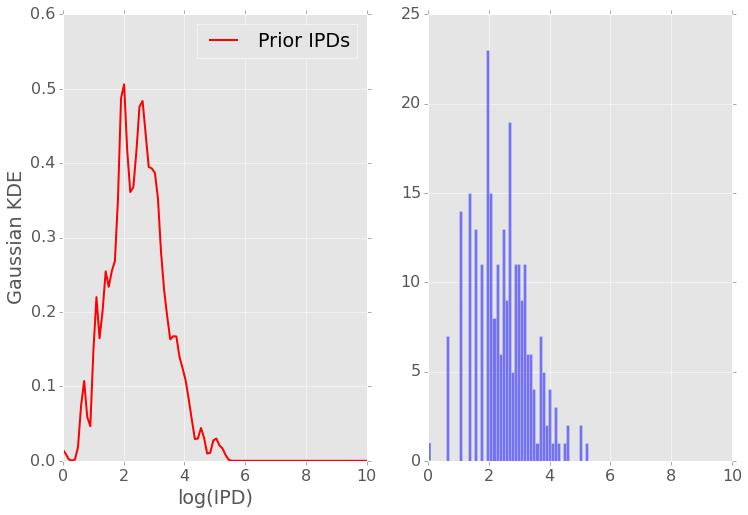

000000F motif: TAGCAGATCTC n_prior: 474
	weight  : [ 0.54544613  0.45455387]
	means   : [[ 2.29565108  3.04288929]]
	AIC1:  1172.27582939 	BIC1:  1193.081866


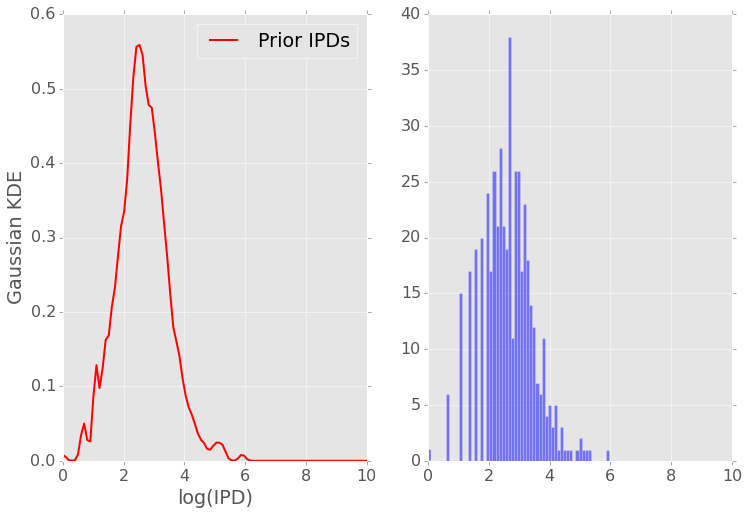

000000F motif: TAGCAGATCTT n_prior: 714
	weight  : [ 0.51889142  0.48110858]
	means   : [[ 2.9881092   2.23657748]]
	AIC1:  1818.19717148 	BIC1:  1841.05158629


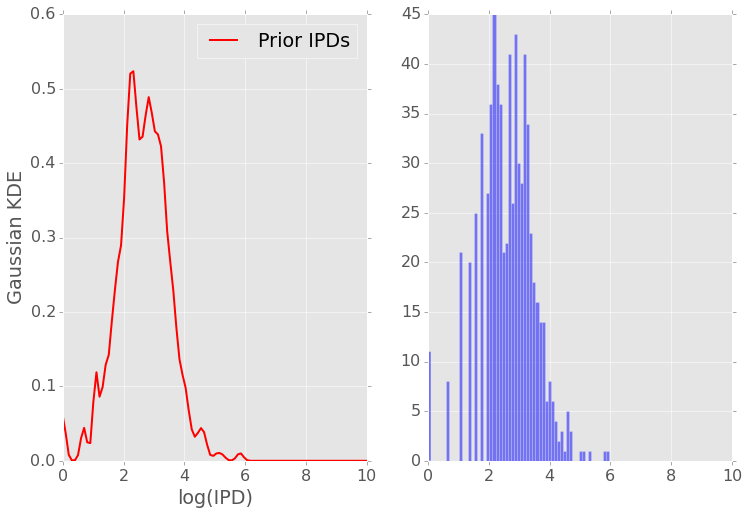

000000F motif: TGTCAGATCTG n_prior: 593
	weight  : [ 0.59993676  0.40006324]
	means   : [[ 2.46593499  2.85885141]]
	AIC1:  1518.72254051 	BIC1:  1540.6485125


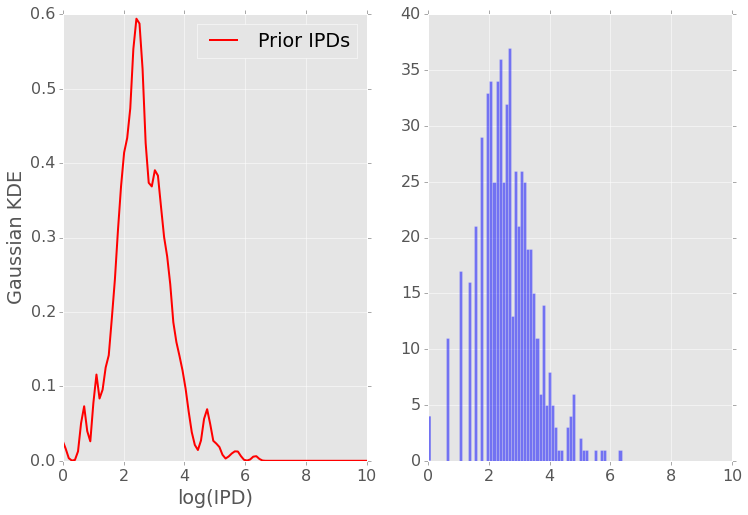

000000F motif: TCACAGATCTT n_prior: 1000
	weight  : [ 0.60447204  0.39552796]
	means   : [[ 2.64180546  3.05662568]]
	AIC1:  2580.31942999 	BIC1:  2604.85820638


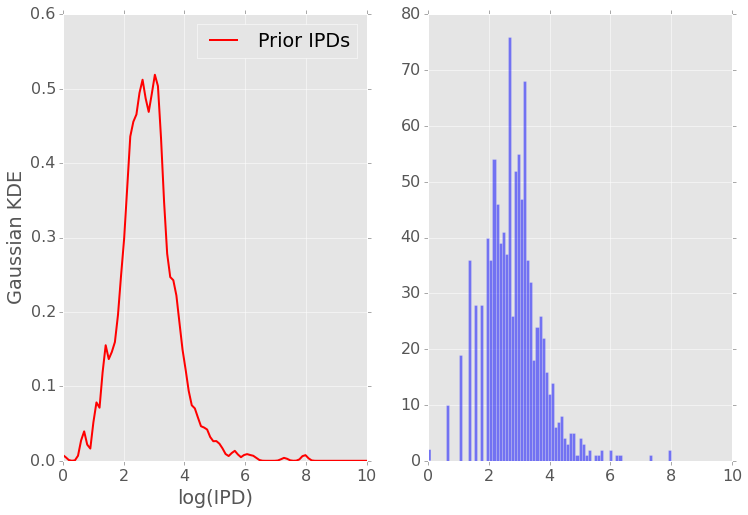

000000F motif: TCACAGATCTG n_prior: 1000
	weight  : [ 0.57588411  0.42411589]
	means   : [[ 2.70240822  3.11432666]]
	AIC1:  2582.89210435 	BIC1:  2607.43088074


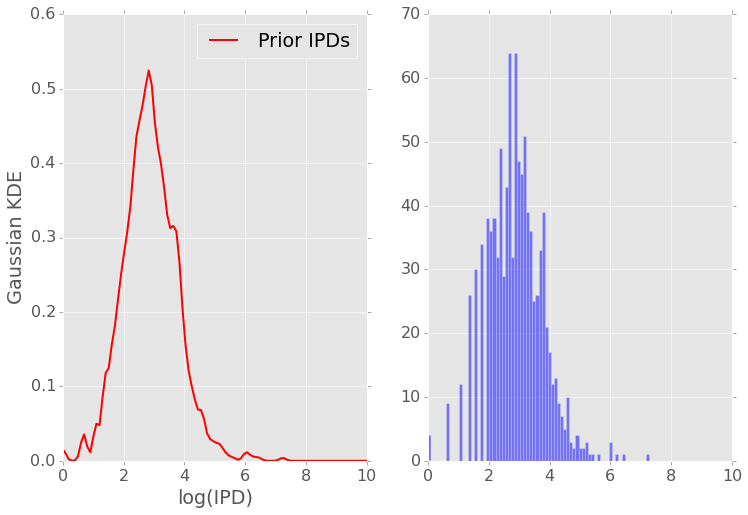

000000F motif: CAGATCTATAC n_prior: 271
	weight  : [ 0.43697864  0.56302136]
	means   : [[ 3.43759786  3.0537607 ]]
	AIC1:  770.531035819 	BIC1:  788.541629923


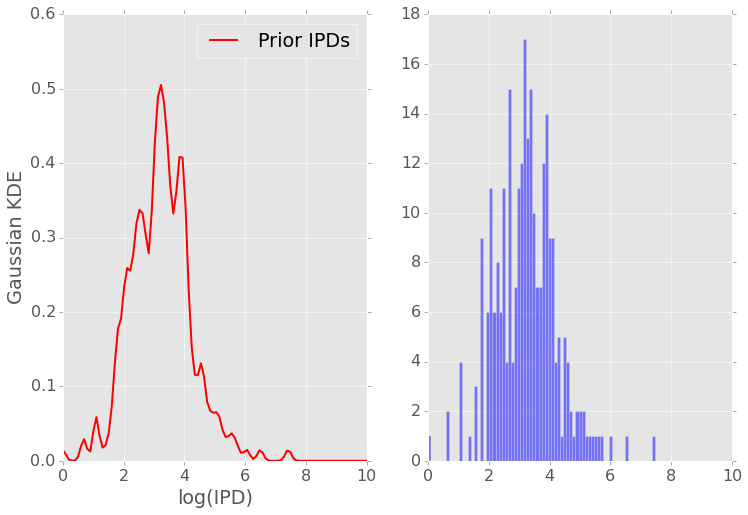

000000F motif: CAGATCTATAA n_prior: 472
	weight  : [ 0.44261602  0.55738398]
	means   : [[ 3.69621726  2.80533096]]
	AIC1:  1283.5690014 	BIC1:  1304.35389633


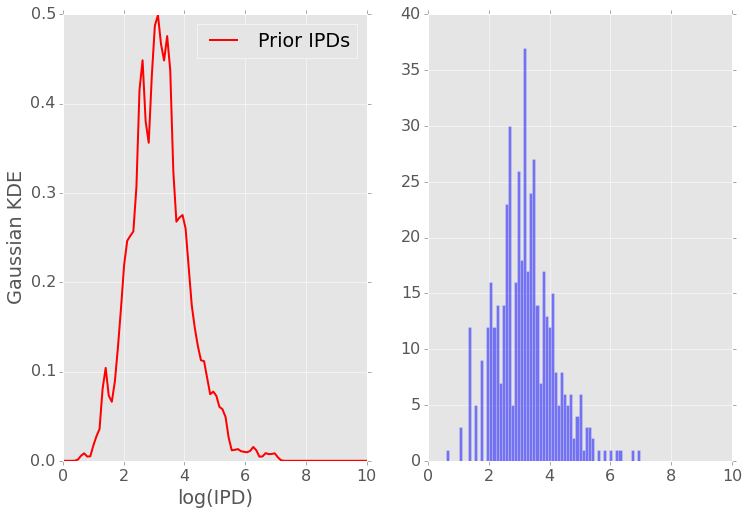

000000F motif: CAGATCTATAG n_prior: 571
	weight  : [ 0.40590266  0.59409734]
	means   : [[ 3.36592326  2.92760443]]
	AIC1:  1626.511624 	BIC1:  1648.24857005


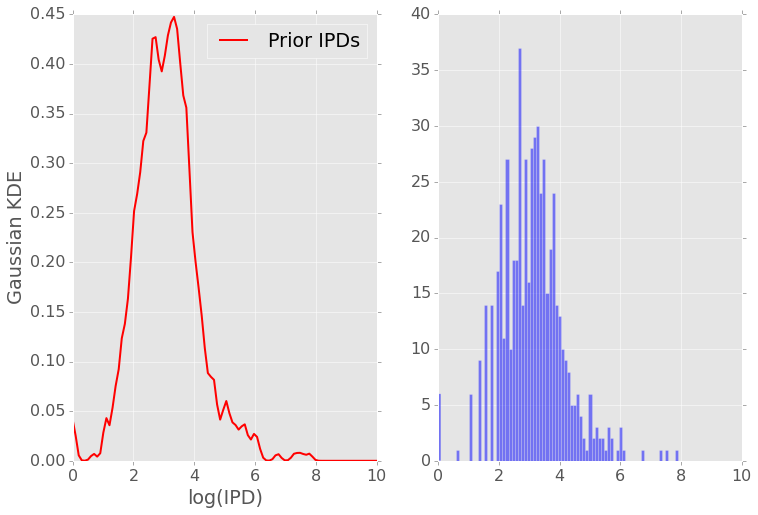

000000F motif: CAGATCTATAT n_prior: 477
	weight  : [ 0.5319011  0.4680989]
	means   : [[ 2.71314691  3.78652463]]
	AIC1:  1406.72080408 	BIC1:  1427.55838653


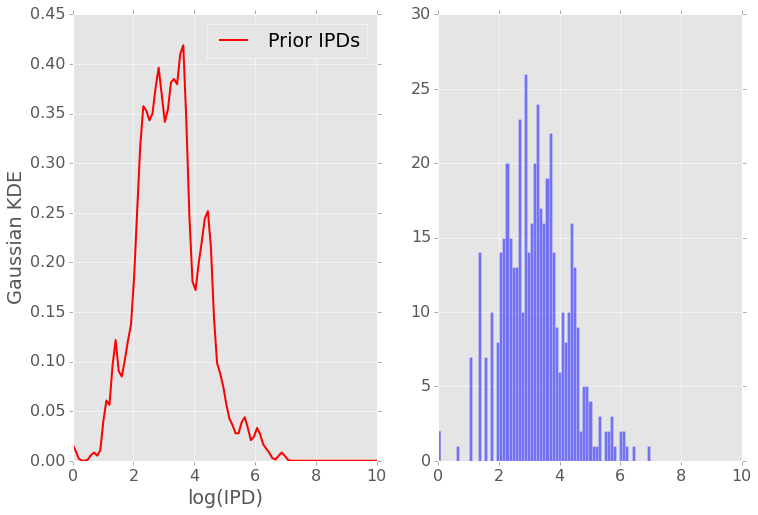

000000F motif: AGACAGATCTC n_prior: 767
	weight  : [ 0.57996524  0.42003476]
	means   : [[ 2.74070236  3.33408849]]
	AIC1:  2073.84765991 	BIC1:  2097.06009391


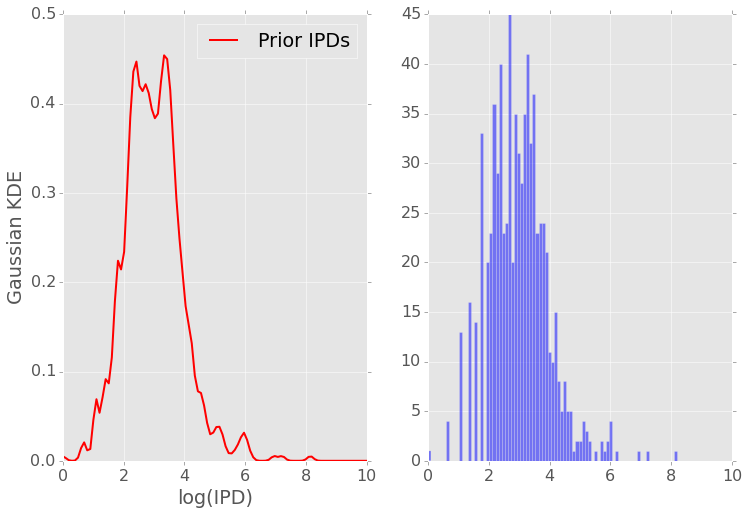

000000F motif: TCTTCAGATCT n_prior: 1000
	weight  : [ 0.48936522  0.51063478]
	means   : [[ 2.34006455  3.2053996 ]]
	AIC1:  2483.63501295 	BIC1:  2508.17378935


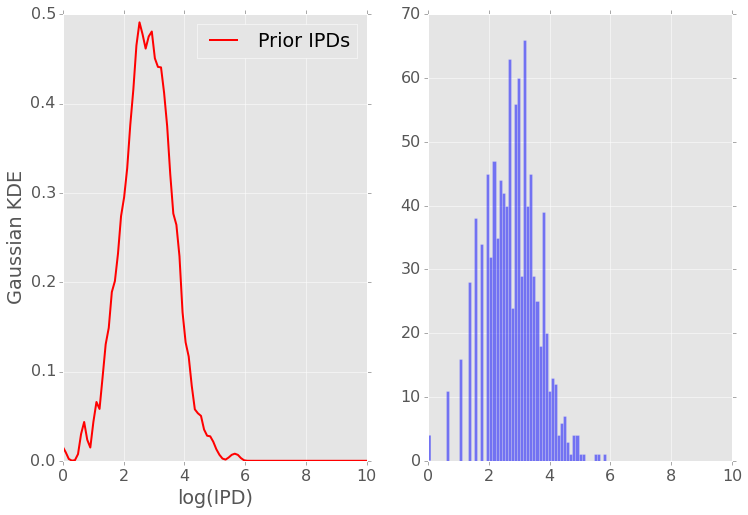

000000F motif: CTGACAGATCT n_prior: 950
	weight  : [ 0.43979223  0.56020777]
	means   : [[ 2.88262696  2.64377455]]
	AIC1:  2414.35288023 	BIC1:  2438.63519015


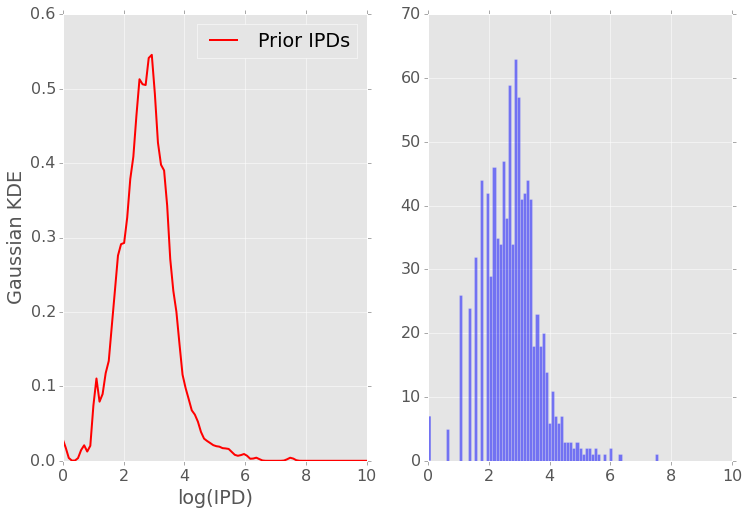

000000F motif: GATTCAGATCT n_prior: 544
	weight  : [ 0.50111879  0.49888121]
	means   : [[ 3.08884885  2.29227453]]
	AIC1:  1366.52611918 	BIC1:  1388.02086541


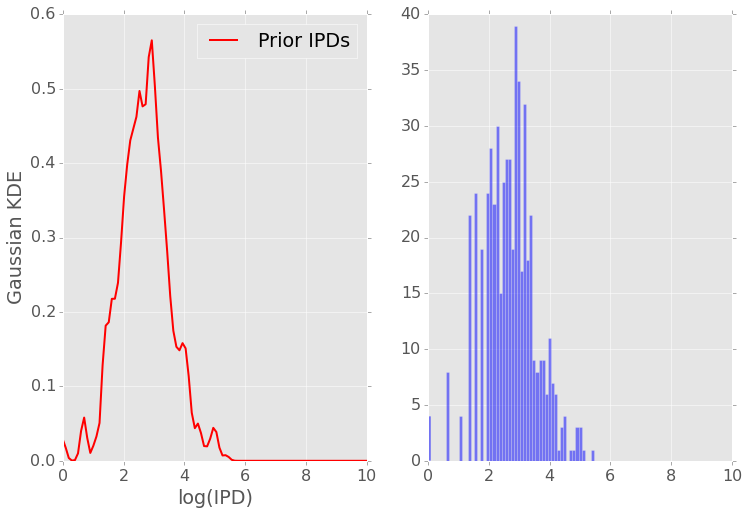

000000F motif: GATCCAGATCT n_prior: 264
	weight  : [ 0.41685078  0.58314922]
	means   : [[ 3.2641015   2.33947737]]
	AIC1:  683.967927562 	BIC1:  701.847673078


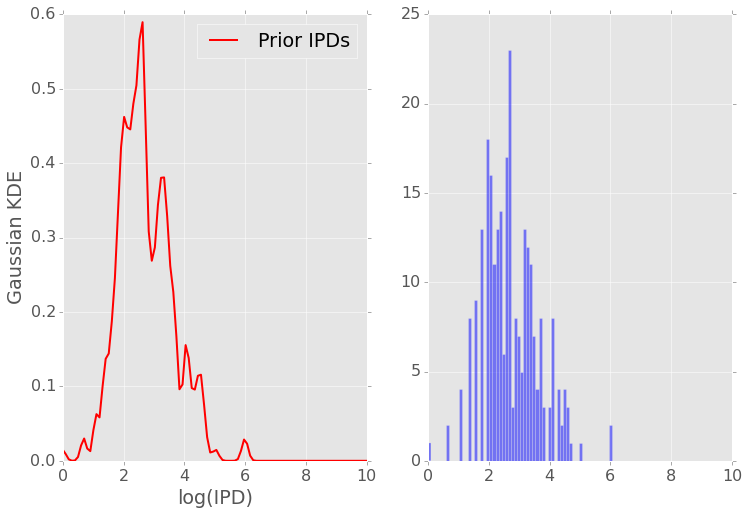

000000F motif: AACAGATCTCA n_prior: 909
	weight  : [ 0.51129287  0.48870713]
	means   : [[ 2.55318415  3.29216594]]
	AIC1:  2284.76153609 	BIC1:  2308.82326156


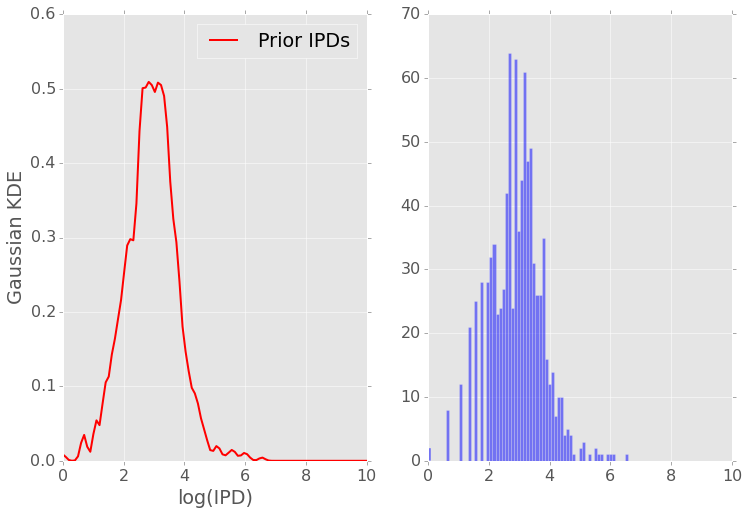

000000F motif: AACAGATCTCC n_prior: 260
	weight  : [ 0.5996575  0.4003425]
	means   : [[ 2.73704071  3.16908304]]
	AIC1:  666.953101795 	BIC1:  684.75650995


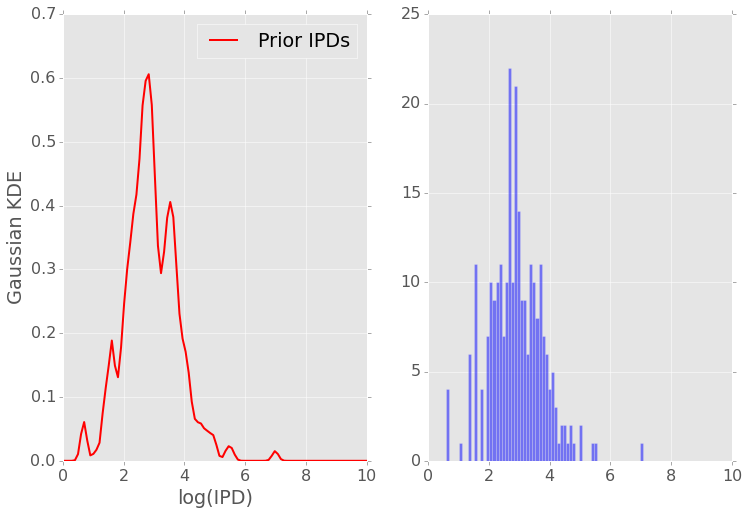

000000F motif: AACAGATCTCT n_prior: 1000
	weight  : [ 0.50709181  0.49290819]
	means   : [[ 2.49914954  3.34366196]]
	AIC1:  2420.94499241 	BIC1:  2445.48376881


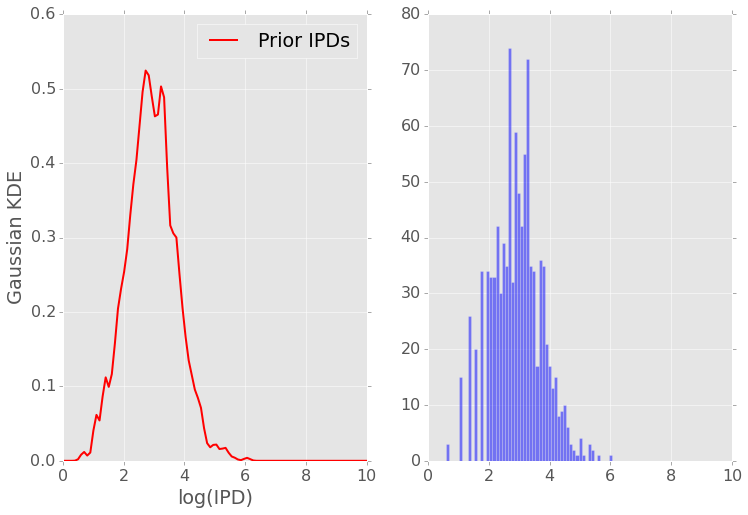

000000F motif: GAGCAGATCTT n_prior: 543
	weight  : [ 0.66113996  0.33886004]
	means   : [[ 2.66499604  3.29778496]]
	AIC1:  1470.28131318 	BIC1:  1491.76685978


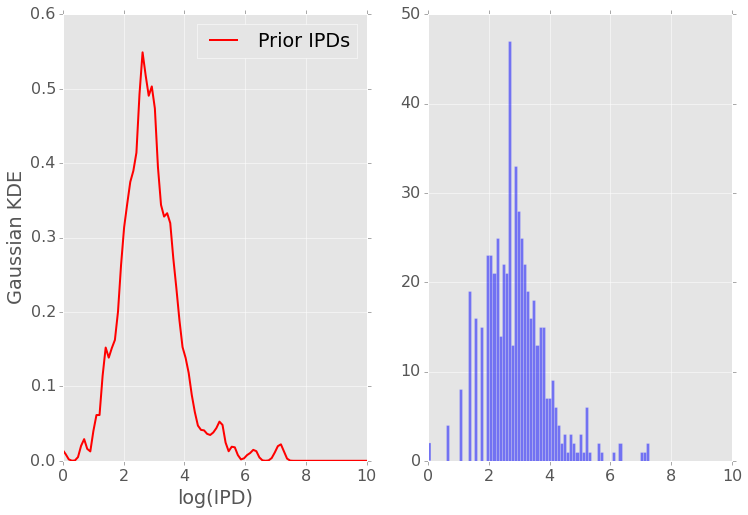

000000F motif: GAGCAGATCTA n_prior: 318
	weight  : [ 0.4889514  0.5110486]
	means   : [[ 2.9074305   2.15084205]]
	AIC1:  823.272929438 	BIC1:  842.083186351


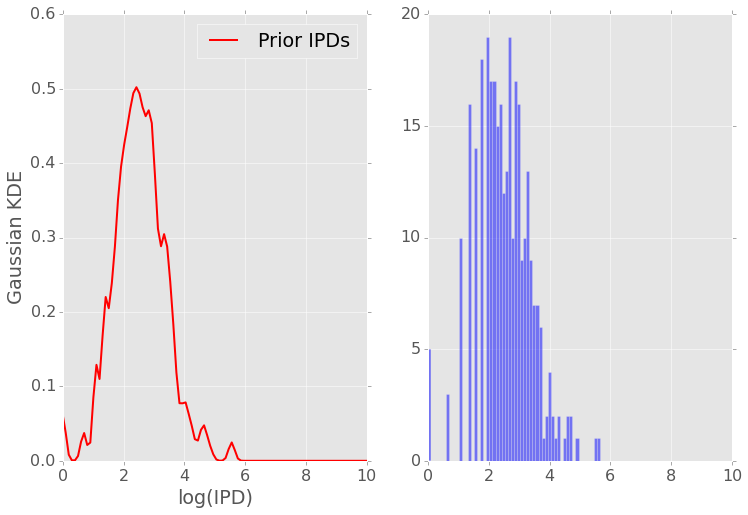

000000F motif: TCAGATCTGCT n_prior: 650
	weight  : [ 0.48673084  0.51326916]
	means   : [[ 2.6404841   3.44263832]]
	AIC1:  1611.05877699 	BIC1:  1633.4436388


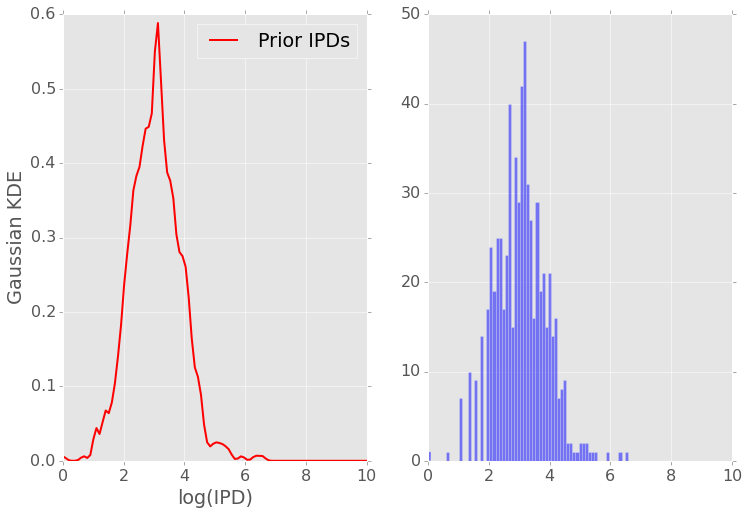

000000F motif: TCAGATCTGCG n_prior: 200
	weight  : [ 0.4713431  0.5286569]
	means   : [[ 3.23142816  2.51138836]]
	AIC1:  503.393642764 	BIC1:  519.885229596


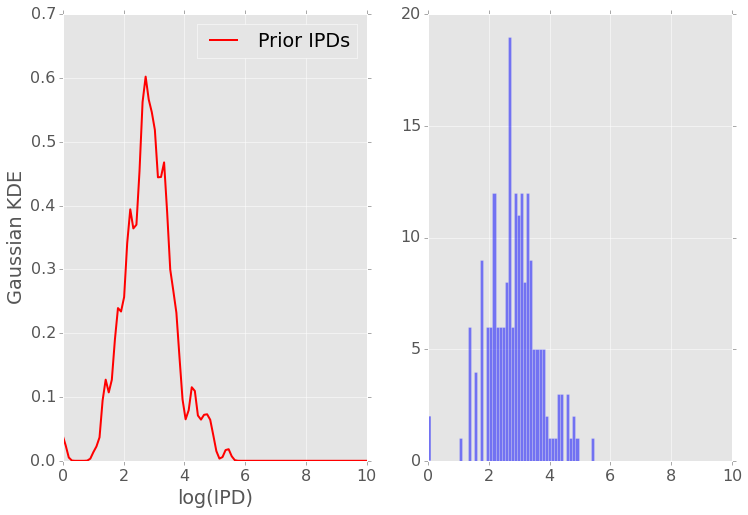

000000F motif: TCAGATCTGCA n_prior: 881
	weight  : [ 0.47431222  0.52568778]
	means   : [[ 2.4996354  3.3507761]]
	AIC1:  2207.02778961 	BIC1:  2230.93307774


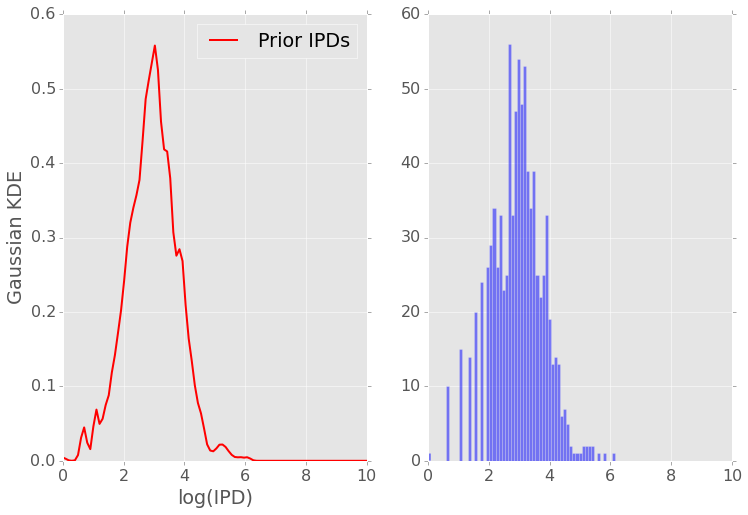

000000F motif: GTCAGATCTGT n_prior: 315
	weight  : [ 0.50642085  0.49357915]
	means   : [[ 2.88568855  3.54181253]]
	AIC1:  806.632465894 	BIC1:  825.395329088


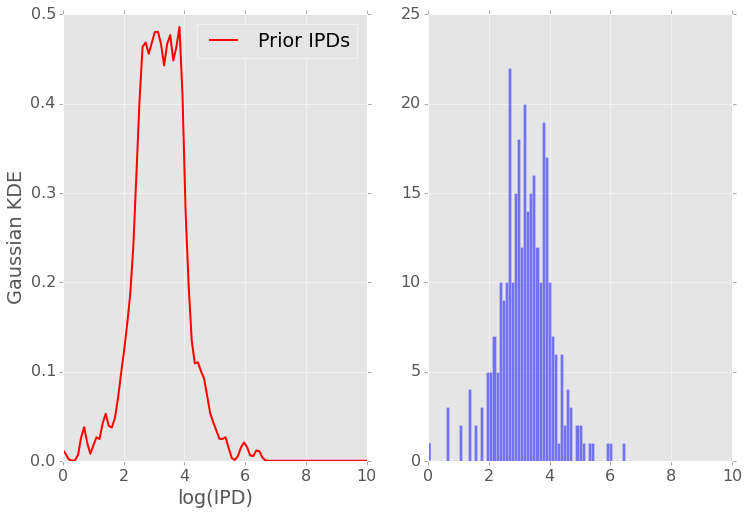

000000F motif: GTCAGATCTGA n_prior: 530
	weight  : [ 0.54601316  0.45398684]
	means   : [[ 2.76062214  3.52304605]]
	AIC1:  1303.82320055 	BIC1:  1325.18758558


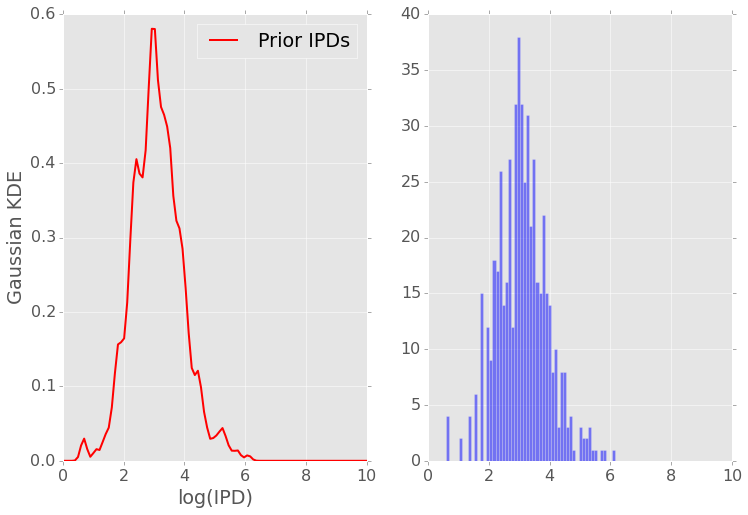

000000F motif: GTCAGATCTGC n_prior: 409
	weight  : [ 0.43658638  0.56341362]
	means   : [[ 3.32426013  2.91173972]]
	AIC1:  1079.27585314 	BIC1:  1099.34442892


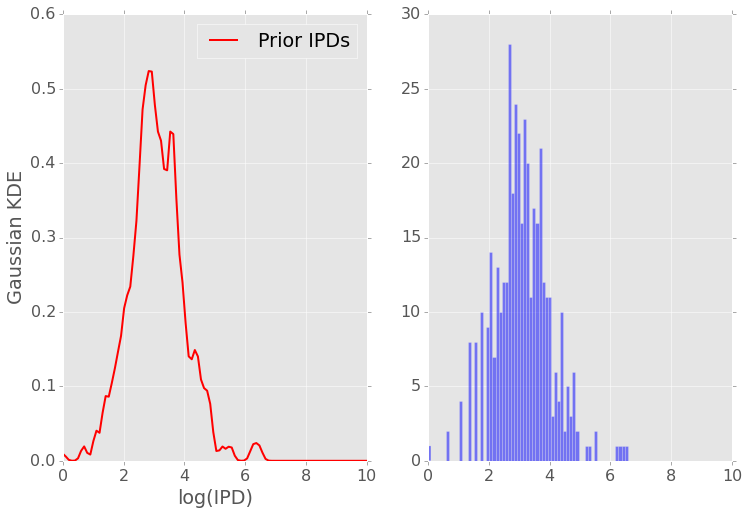

000000F motif: GTCAGATCTGG n_prior: 525
	weight  : [ 0.49945337  0.50054663]
	means   : [[ 3.45638231  2.67439499]]
	AIC1:  1290.46467893 	BIC1:  1311.78167024


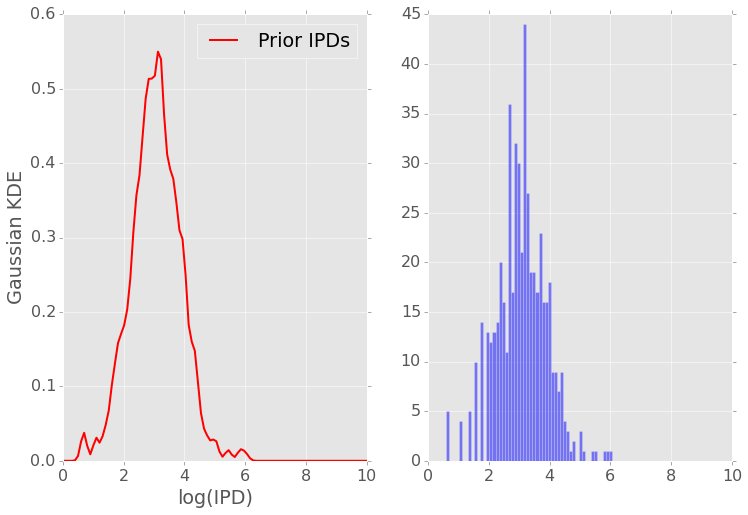

000000F motif: CCAGATCTGAT n_prior: 786
	weight  : [ 0.58965768  0.41034232]
	means   : [[ 2.95569763  3.23002297]]
	AIC1:  1991.94431745 	BIC1:  2015.27910141


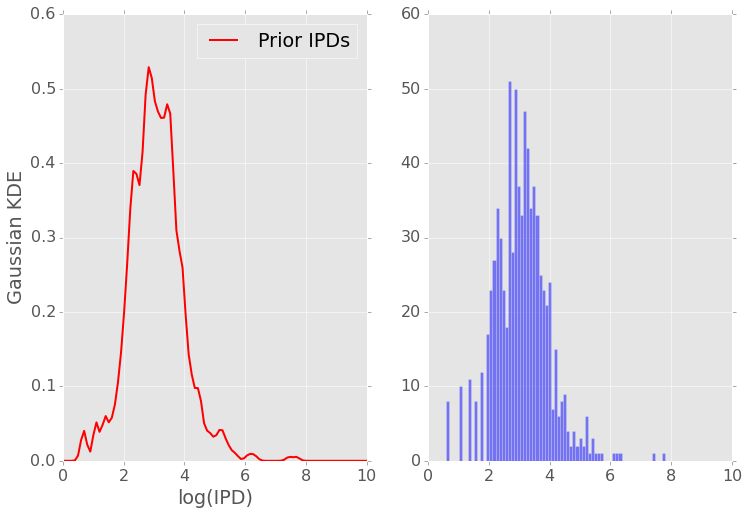

000000F motif: CCAGATCTGAC n_prior: 619
	weight  : [ 0.49547028  0.50452972]
	means   : [[ 2.63154279  3.43477903]]
	AIC1:  1552.22064563 	BIC1:  1574.36117199


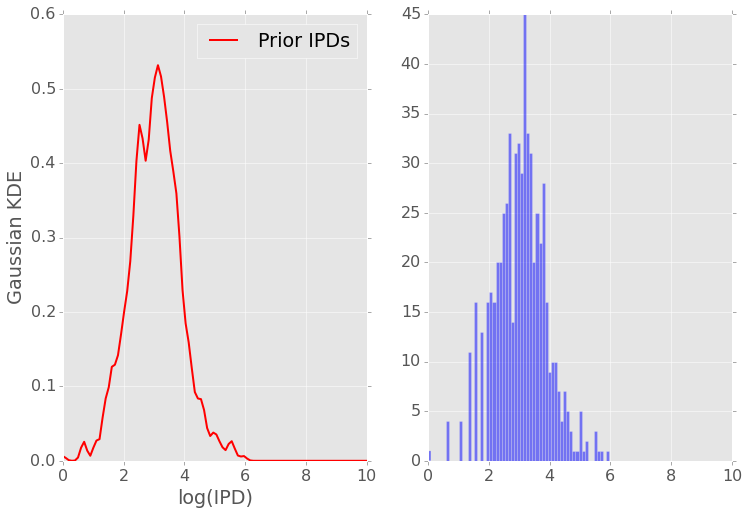

000000F motif: CCAGATCTGAG n_prior: 666
	weight  : [ 0.49281482  0.50718518]
	means   : [[ 3.44515941  2.65161539]]
	AIC1:  1762.25334455 	BIC1:  1784.7597929


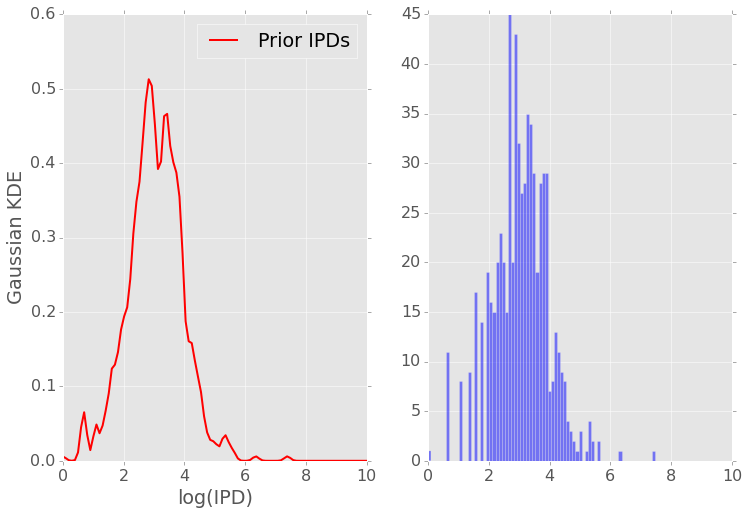

000000F motif: CAGATCTGTCG n_prior: 76
	weight  : [ 0.40687812  0.59312188]
	means   : [[ 2.6913385   2.94019357]]
	AIC1:  201.368008614 	BIC1:  213.021675315


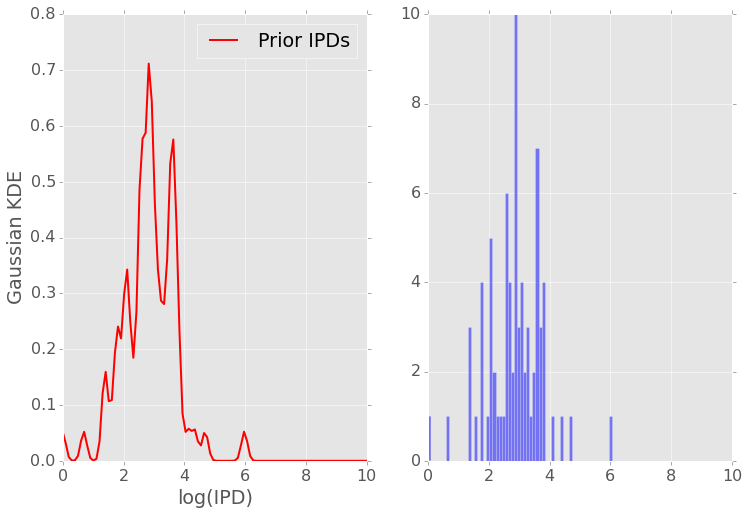

000000F motif: ACTGCAGATCT n_prior: 842
	weight  : [ 0.49197807  0.50802193]
	means   : [[ 3.12612003  2.3556563 ]]
	AIC1:  2168.38443673 	BIC1:  2192.0633368


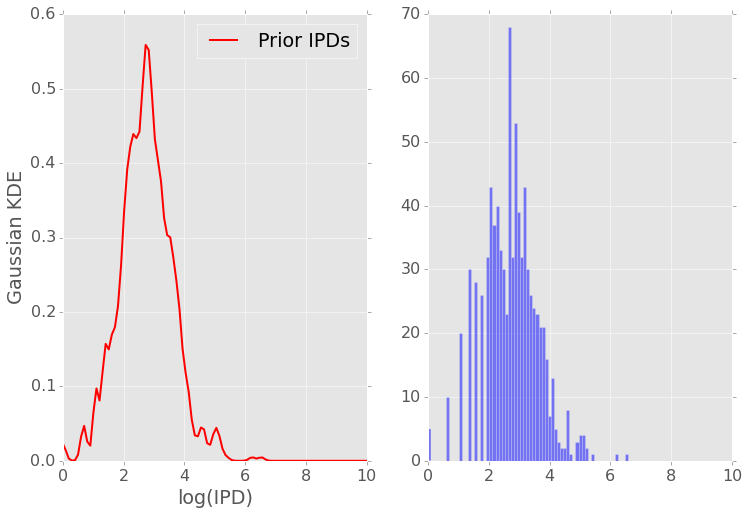

000000F motif: GGCAGATCTCT n_prior: 519
	weight  : [ 0.55232437  0.44767563]
	means   : [[ 3.03244756  3.19910529]]
	AIC1:  1332.5227929 	BIC1:  1353.78231231


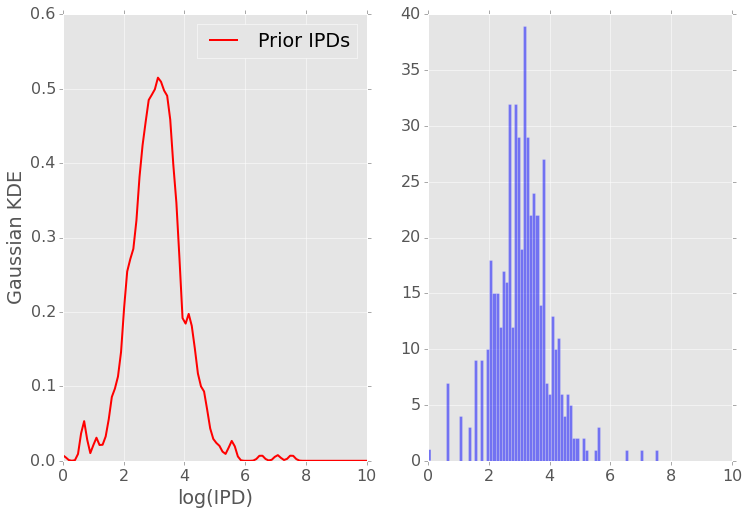

000000F motif: GGCAGATCTCG n_prior: 268
	weight  : [ 0.46937368  0.53062632]
	means   : [[ 3.39757178  2.7630837 ]]
	AIC1:  639.098420989 	BIC1:  657.053355891


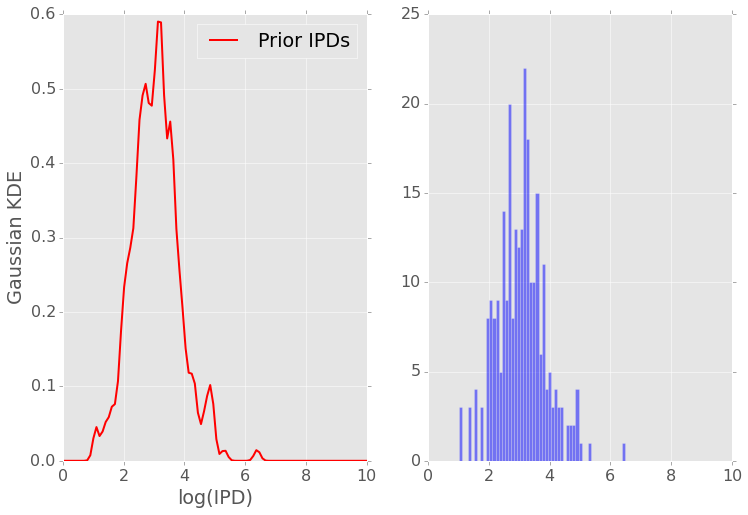

000000F motif: TGACAGATCTG n_prior: 1000
	weight  : [ 0.49686555  0.50313445]
	means   : [[ 3.20878081  2.50932471]]
	AIC1:  2461.69175457 	BIC1:  2486.23053097


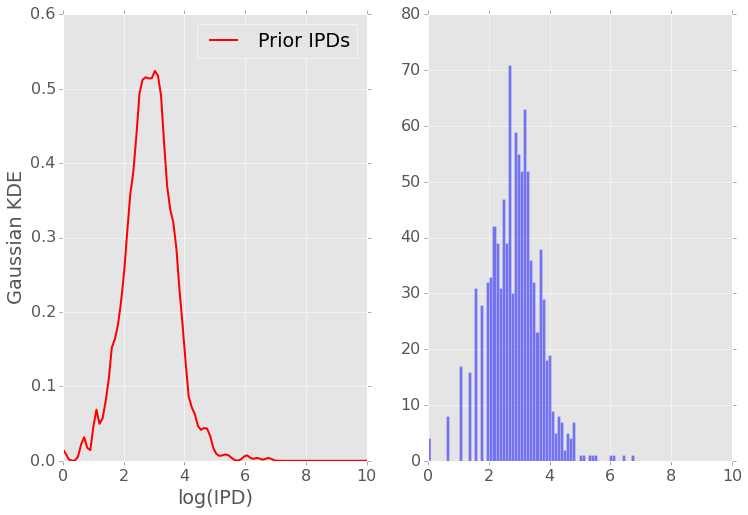

000000F motif: TGACAGATCTA n_prior: 867
	weight  : [ 0.52163396  0.47836604]
	means   : [[ 3.18833371  2.46441414]]
	AIC1:  2259.31666089 	BIC1:  2283.14185577


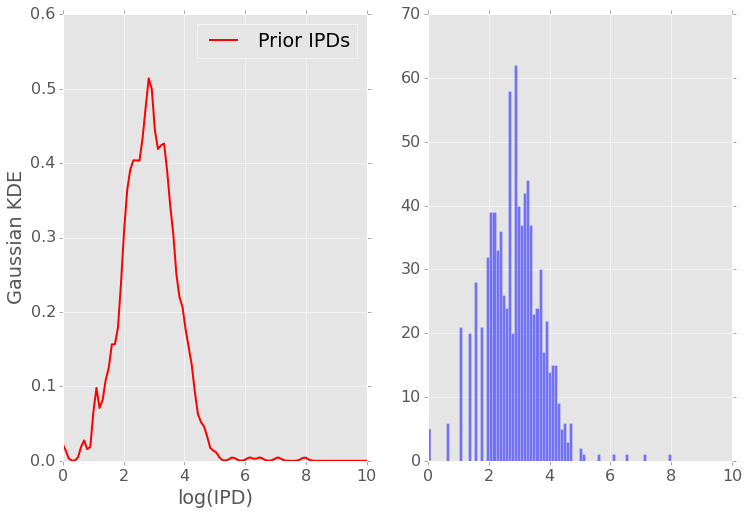

000000F motif: TGACAGATCTC n_prior: 335
	weight  : [ 0.50098656  0.49901344]
	means   : [[ 3.20866893  2.45536621]]
	AIC1:  793.373360446 	BIC1:  812.444013106


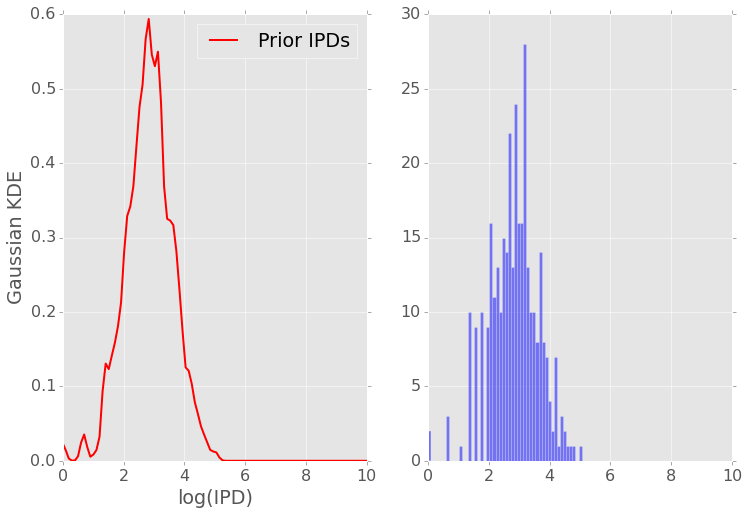

000000F motif: TGACAGATCTT n_prior: 811
	weight  : [ 0.50209097  0.49790903]
	means   : [[ 2.49744607  3.18405359]]
	AIC1:  2061.01647827 	BIC1:  2084.50781854


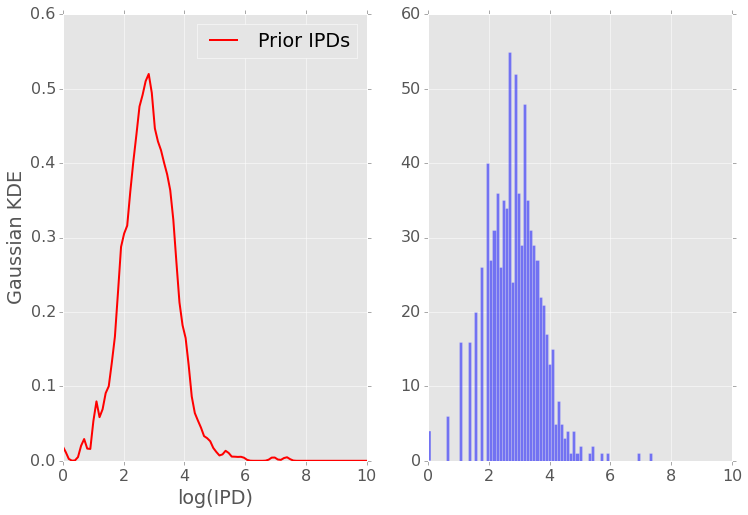

000000F motif: GGCCAGATCTA n_prior: 365
	weight  : [ 0.45706881  0.54293119]
	means   : [[ 2.8735679  2.3003264]]
	AIC1:  919.352311128 	BIC1:  938.851797896


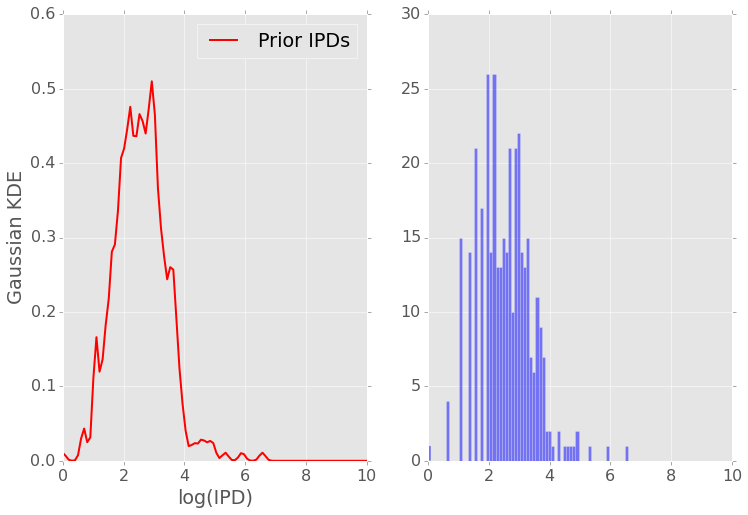

000000F motif: TACAGATCTGC n_prior: 188
	weight  : [ 0.47997989  0.52002011]
	means   : [[ 2.50905723  3.29305676]]
	AIC1:  443.991880446 	BIC1:  460.17409026


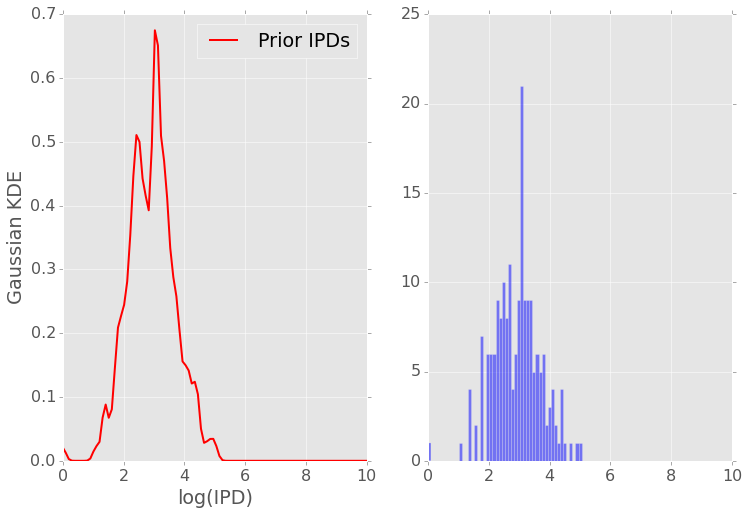

000000F motif: CCCAGATCTAT n_prior: 383
	weight  : [ 0.42190765  0.57809235]
	means   : [[ 3.36093483  2.95892082]]
	AIC1:  958.449566091 	BIC1:  978.189741037


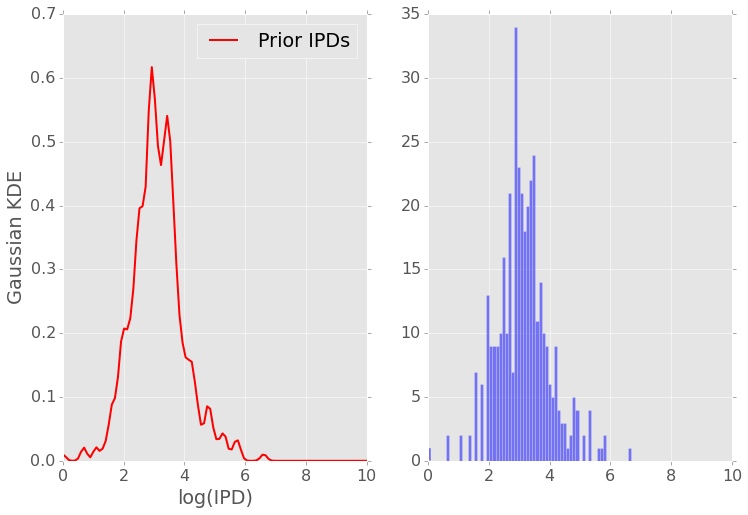

000000F motif: CCCAGATCTAG n_prior: 599
	weight  : [ 0.51340502  0.48659498]
	means   : [[ 2.57845819  3.44829114]]
	AIC1:  1452.43328266 	BIC1:  1474.40959065


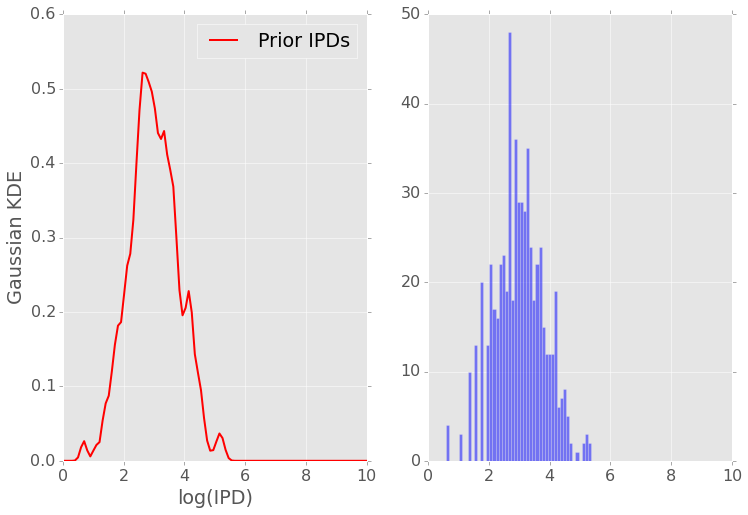

000000F motif: CCCAGATCTAC n_prior: 203
	weight  : [ 0.38335198  0.61664802]
	means   : [[ 3.77752779  3.01819376]]
	AIC1:  571.22807468 	BIC1:  587.794104575


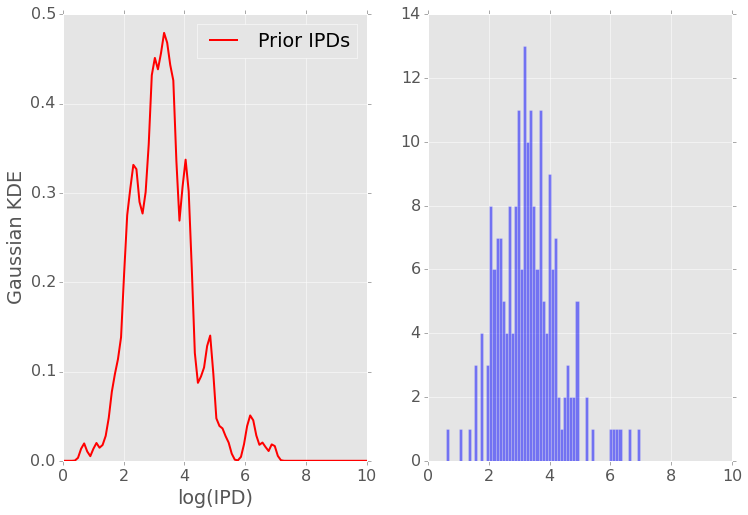

000000F motif: CCCAGATCTAA n_prior: 813
	weight  : [ 0.4716236  0.5283764]
	means   : [[ 3.46204435  2.74100615]]
	AIC1:  2094.54817693 	BIC1:  2118.05183248


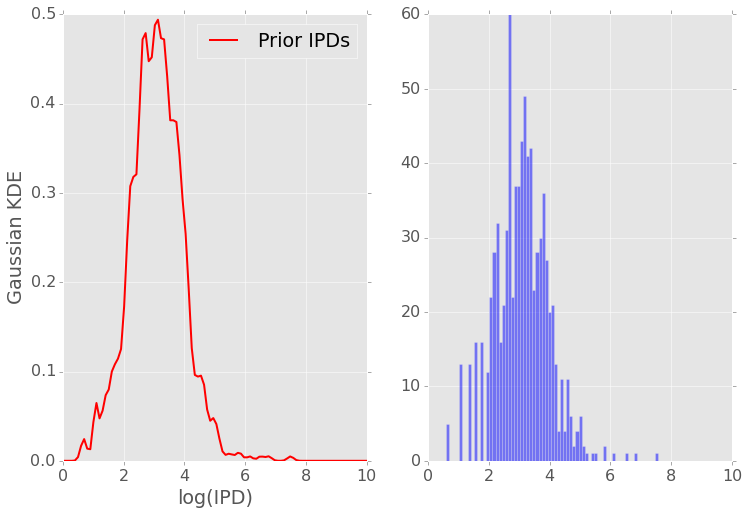

000000F motif: GTCAGATCTTG n_prior: 800
	weight  : [ 0.48879308  0.51120692]
	means   : [[ 2.66697158  3.4940311 ]]
	AIC1:  2154.27327642 	BIC1:  2177.69633505


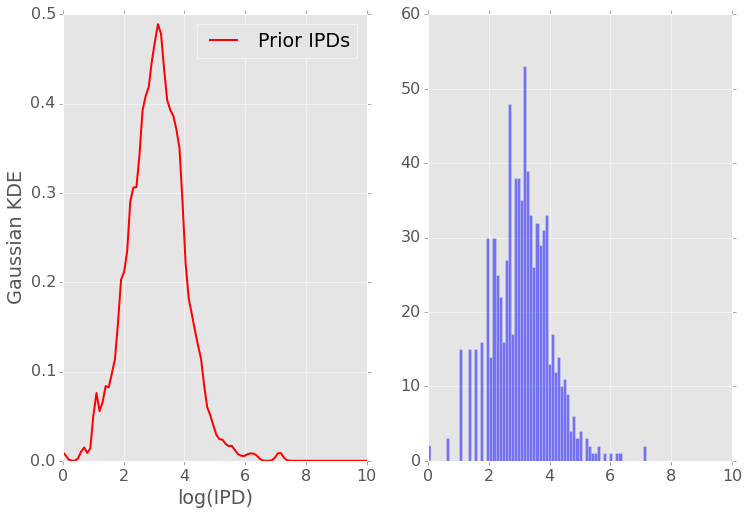

000000F motif: GTCAGATCTTA n_prior: 372
	weight  : [ 0.5190717  0.4809283]
	means   : [[ 2.60114477  3.43570459]]
	AIC1:  955.06786311 	BIC1:  974.662332381


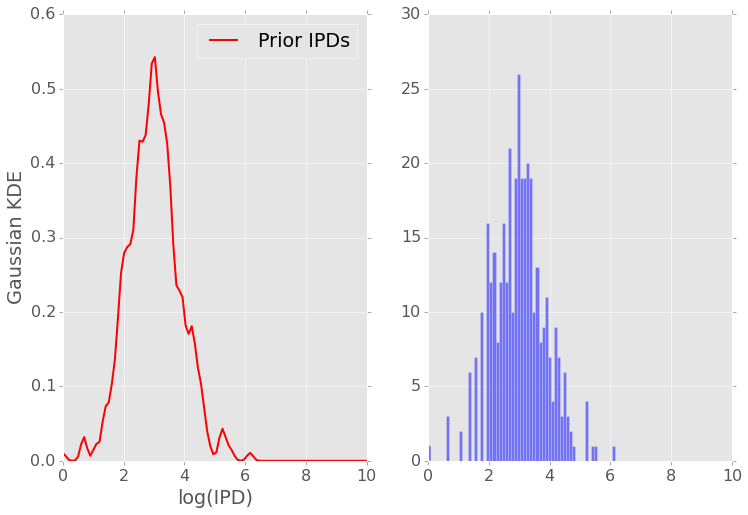

000000F motif: GTCAGATCTTC n_prior: 312
	weight  : [ 0.49847729  0.50152271]
	means   : [[ 3.1651159   2.79604691]]
	AIC1:  781.058724902 	BIC1:  799.773740841


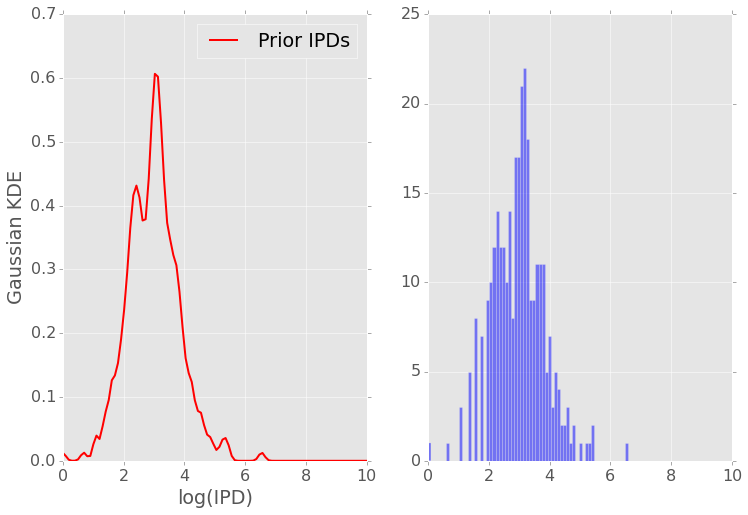

000000F motif: GTCAGATCTTT n_prior: 746
	weight  : [ 0.54089238  0.45910762]
	means   : [[ 2.69973377  3.4781565 ]]
	AIC1:  2017.52550685 	BIC1:  2040.59913485


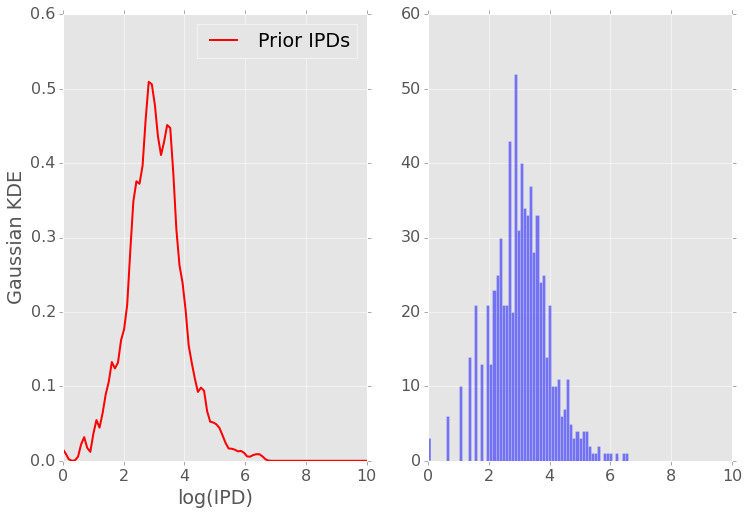

000000F motif: CGCAGATCTCA n_prior: 167
	weight  : [ 0.60785301  0.39214699]
	means   : [[ 2.86274088  3.18755025]]
	AIC1:  422.285766913 	BIC1:  437.875735975


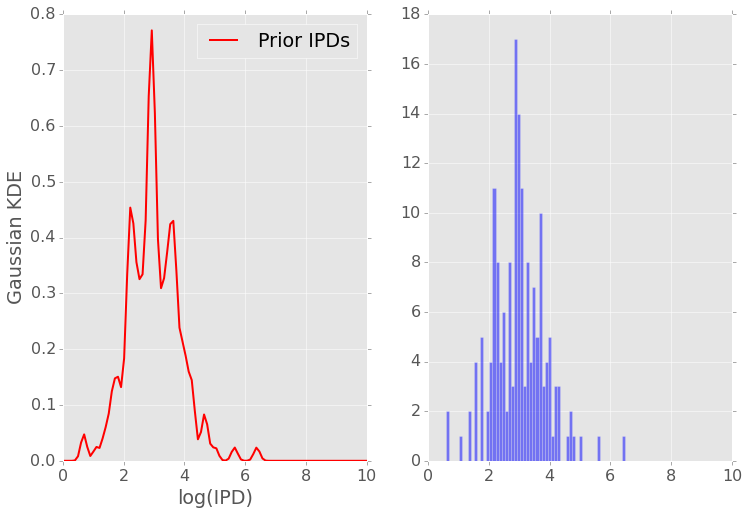

000000F motif: CGCAGATCTCT n_prior: 60
	weight  : [ 0.55825957  0.44174043]
	means   : [[ 3.23559643  2.48148245]]
	AIC1:  168.335642662 	BIC1:  178.807365474


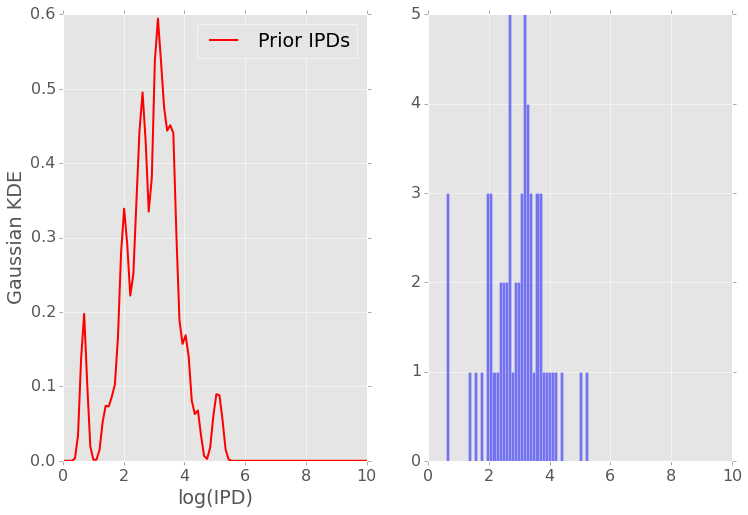

000000F motif: TGCAGATCTTC n_prior: 794
	weight  : [ 0.48137016  0.51862984]
	means   : [[ 3.30702428  2.47834272]]
	AIC1:  2046.93296702 	BIC1:  2070.31838433


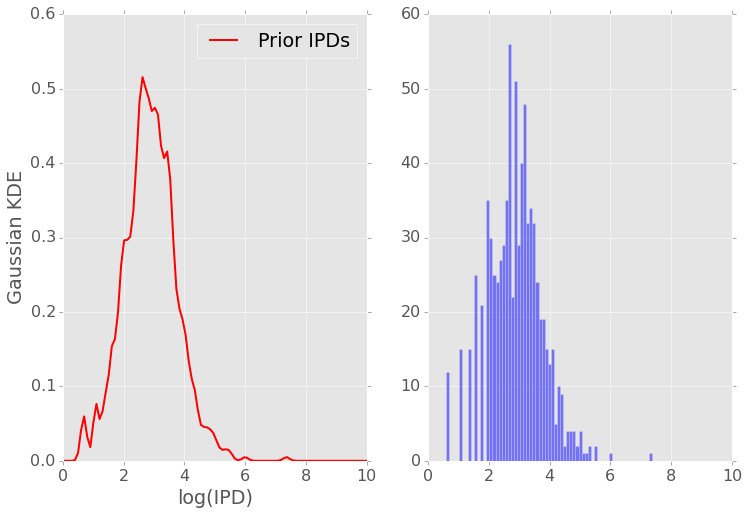

000000F motif: TGCTCAGATCT n_prior: 874
	weight  : [ 0.53723959  0.46276041]
	means   : [[ 2.64770508  2.96675798]]
	AIC1:  2128.72222364 	BIC1:  2152.58762552


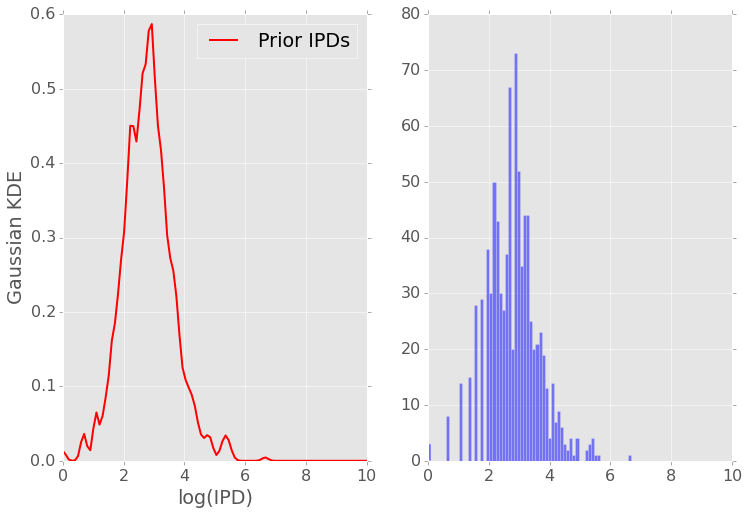

000000F motif: ACAGATCTAGA n_prior: 554
	weight  : [ 0.46664398  0.53335602]
	means   : [[ 2.44888135  3.20717953]]
	AIC1:  1329.05245111 	BIC1:  1350.63827454


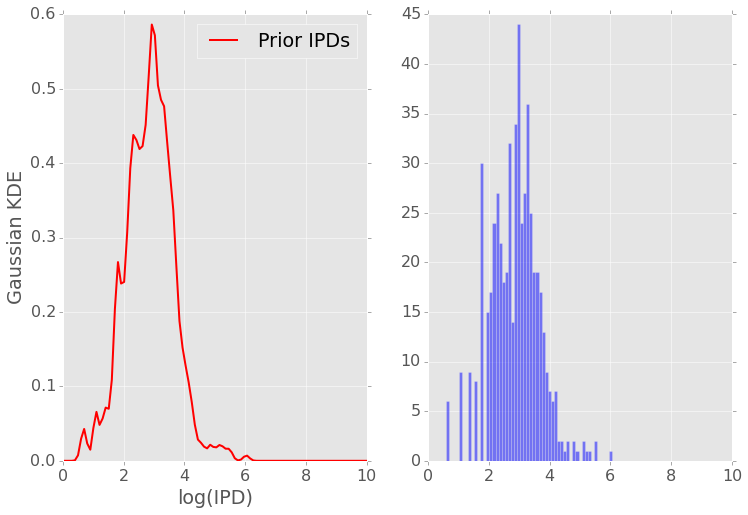

000000F motif: AGATCAGATCT n_prior: 727
	weight  : [ 0.47544122  0.52455878]
	means   : [[ 3.33616054  2.53384365]]
	AIC1:  1856.26879772 	BIC1:  1879.21343011


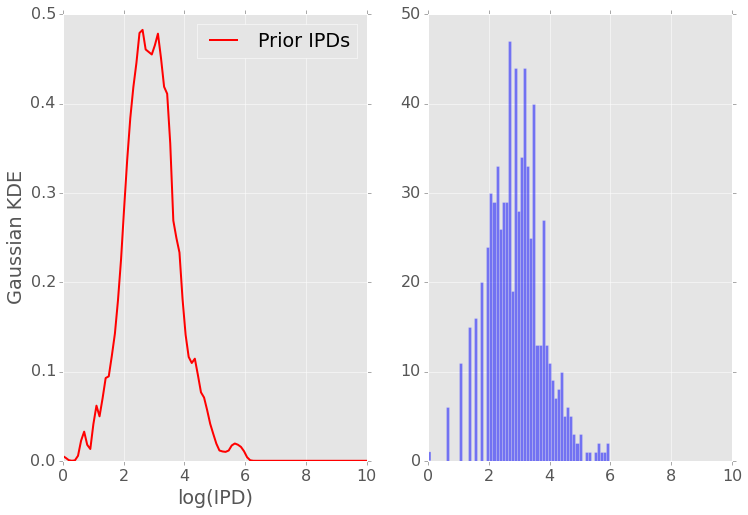

000000F motif: ACAGATCTGTG n_prior: 1000
	weight  : [ 0.48696329  0.51303671]
	means   : [[ 3.30385364  2.57576528]]
	AIC1:  2495.80651735 	BIC1:  2520.34529374


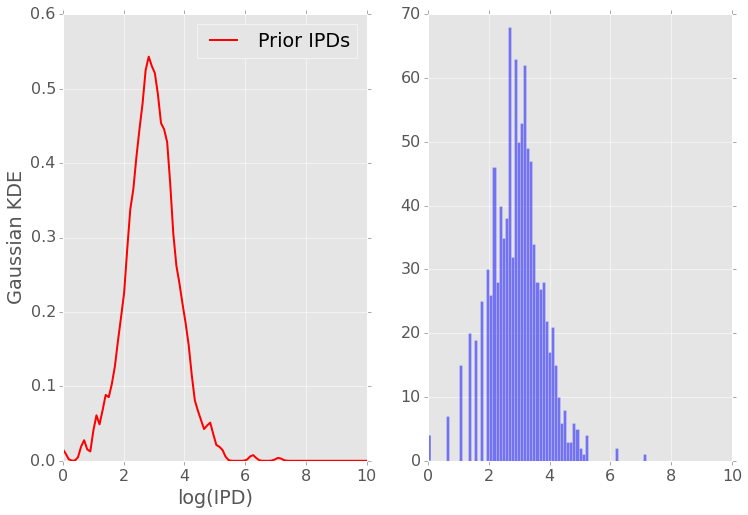

000000F motif: ACAGATCTGTC n_prior: 492
	weight  : [ 0.47917758  0.52082242]
	means   : [[ 2.48836346  3.27442124]]
	AIC1:  1311.97892333 	BIC1:  1332.97131691


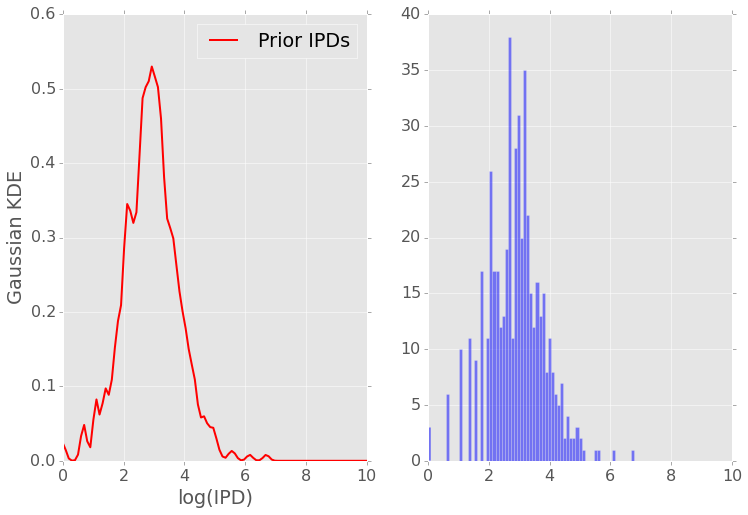

000000F motif: ACAGATCTGTA n_prior: 723
	weight  : [ 0.48650397  0.51349603]
	means   : [[ 2.56265331  3.36545174]]
	AIC1:  1788.49587223 	BIC1:  1811.41291834


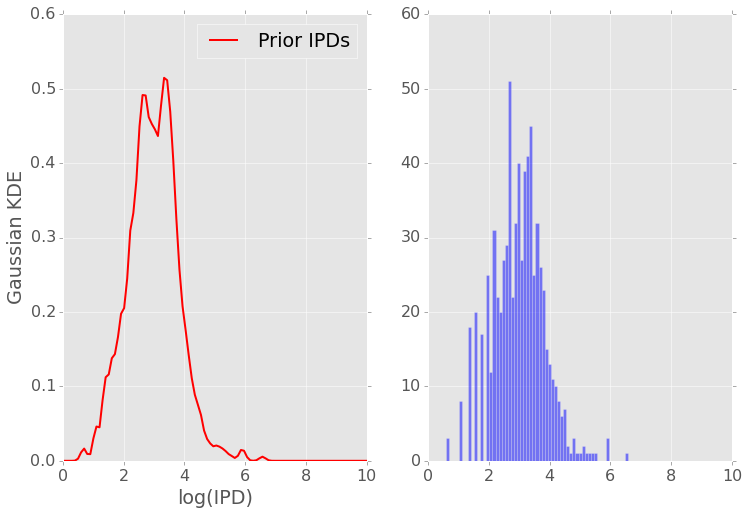

000000F motif: ACAGATCTGTT n_prior: 553
	weight  : [ 0.52742783  0.47257217]
	means   : [[ 2.57402538  3.42735617]]
	AIC1:  1406.06063207 	BIC1:  1427.63742208


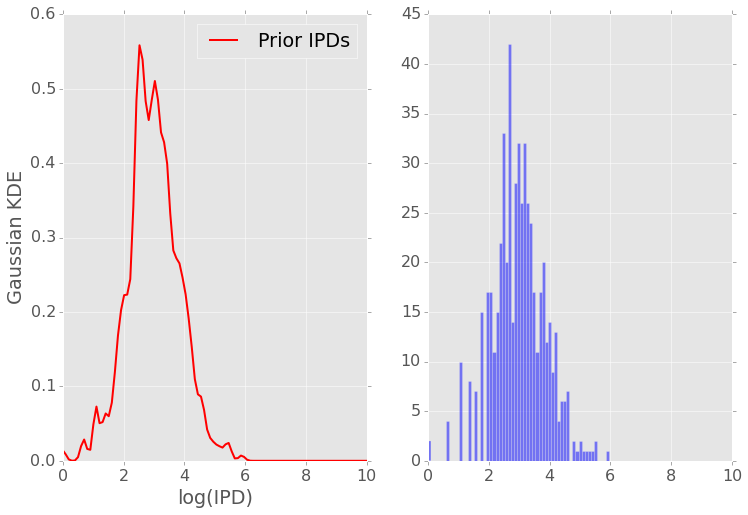

000000F motif: ACCCCAGATCT n_prior: 485
	weight  : [ 0.60053397  0.39946603]
	means   : [[ 2.68128691  3.46285513]]
	AIC1:  1313.20552765 	BIC1:  1334.1262721


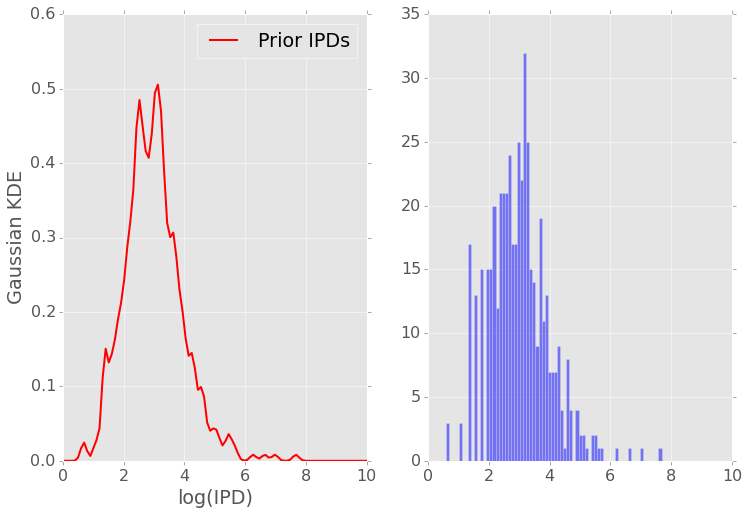

000000F motif: GATGCAGATCT n_prior: 240
	weight  : [ 0.48234584  0.51765416]
	means   : [[ 2.8488131  2.5533055]]
	AIC1:  625.853991774 	BIC1:  643.257186391


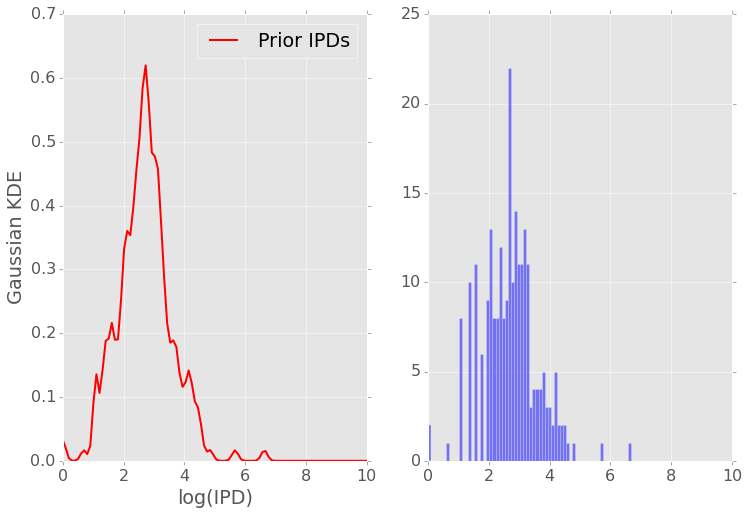

000000F motif: TATCAGATCTG n_prior: 757
	weight  : [ 0.54294857  0.45705143]
	means   : [[ 2.19618184  2.93873384]]
	AIC1:  1916.99804519 	BIC1:  1940.14486146


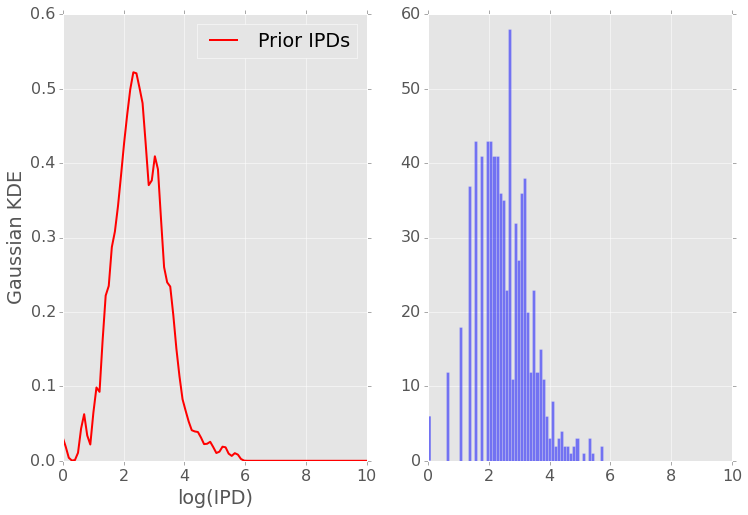

000000F motif: TATCAGATCTC n_prior: 729
	weight  : [ 0.48773948  0.51226052]
	means   : [[ 2.95352999  2.11934307]]
	AIC1:  1841.56927789 	BIC1:  1864.52764655


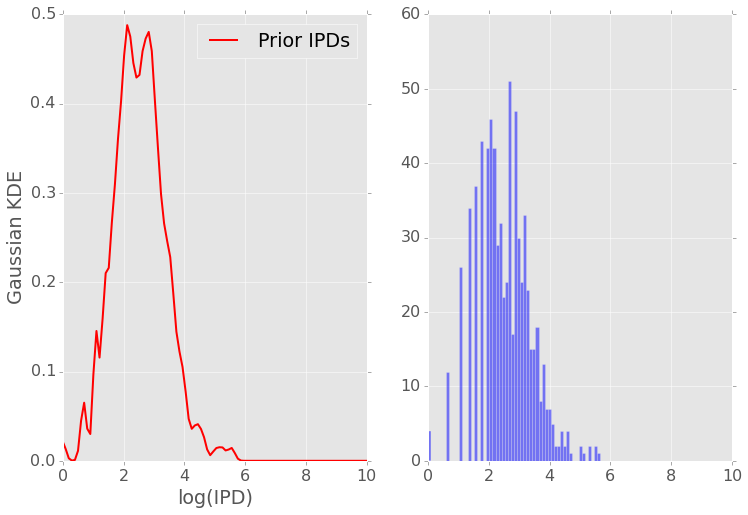

000000F motif: TATCAGATCTA n_prior: 609
	weight  : [ 0.5215815  0.4784185]
	means   : [[ 2.06093107  2.88556454]]
	AIC1:  1563.82279141 	BIC1:  1585.88188275


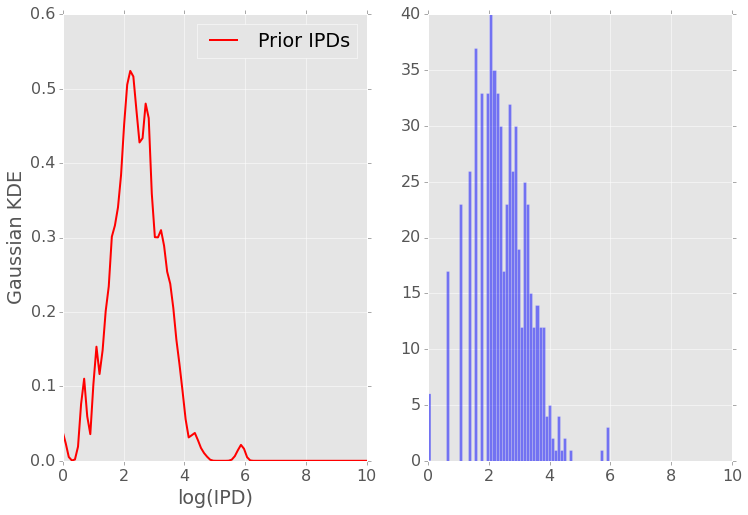

000000F motif: TATCAGATCTT n_prior: 999
	weight  : [ 0.51355666  0.48644334]
	means   : [[ 2.17225713  3.0224197 ]]
	AIC1:  2577.42687067 	BIC1:  2601.96064456


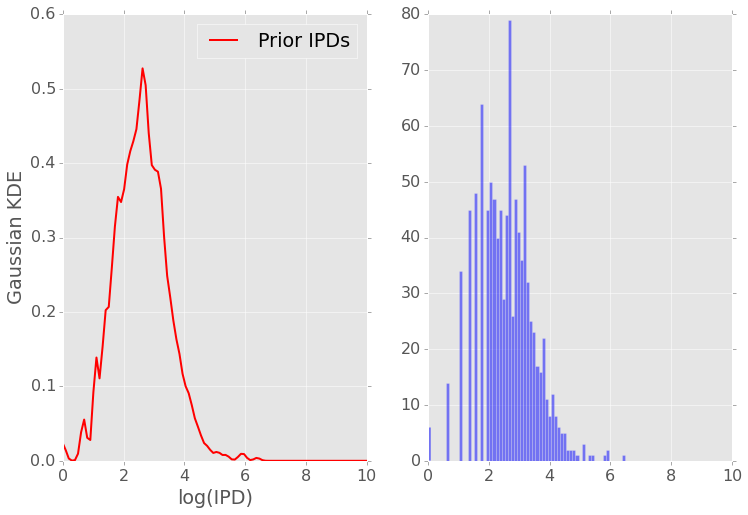

000000F motif: TCAGATCTAGT n_prior: 418
	weight  : [ 0.48758557  0.51241443]
	means   : [[ 2.56919821  3.29978159]]
	AIC1:  1012.07171303 	BIC1:  1032.2491202


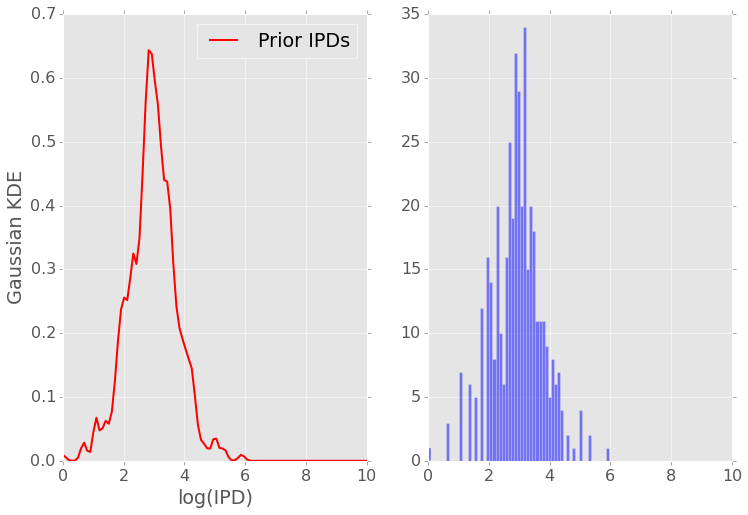

000000F motif: TCAGATCTAGA n_prior: 779
	weight  : [ 0.48397883  0.51602117]
	means   : [[ 3.29673828  2.45953931]]
	AIC1:  2009.71560344 	BIC1:  2033.00565867


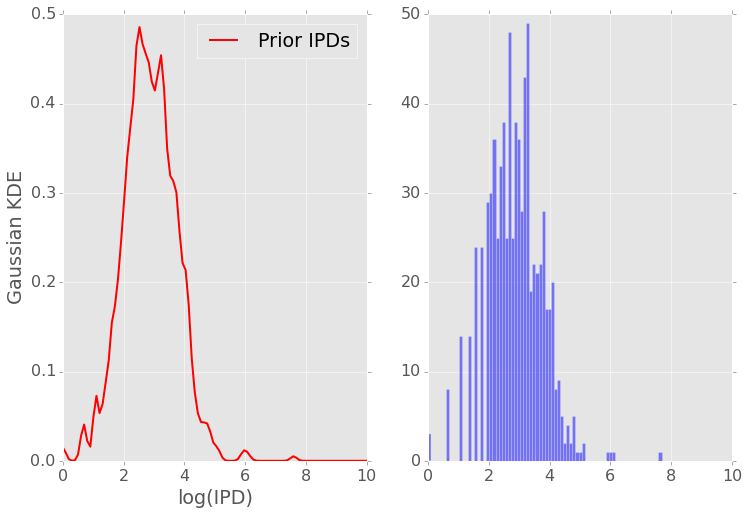

000000F motif: TCAGATCTAGC n_prior: 161
	weight  : [ 0.48896456  0.51103544]
	means   : [[ 3.29399837  2.45563642]]
	AIC1:  388.257103104 	BIC1:  403.664124929


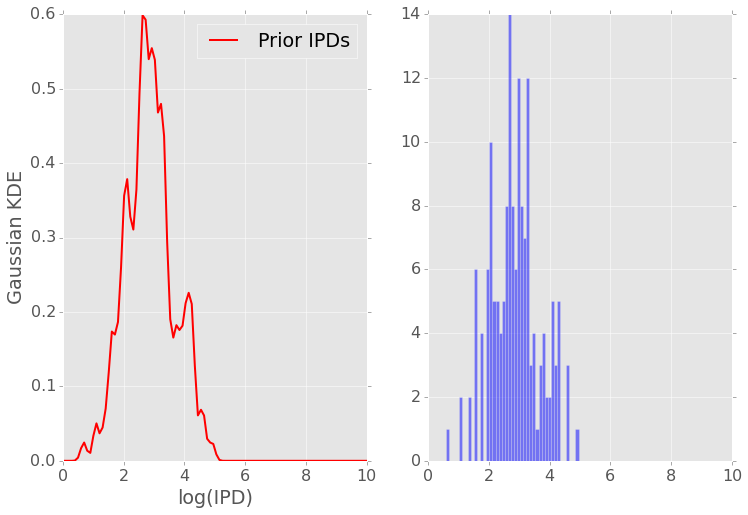

000000F motif: TCAGATCTAGG n_prior: 291
	weight  : [ 0.51571456  0.48428544]
	means   : [[ 3.22703973  2.33905817]]
	AIC1:  750.508041745 	BIC1:  768.87465808


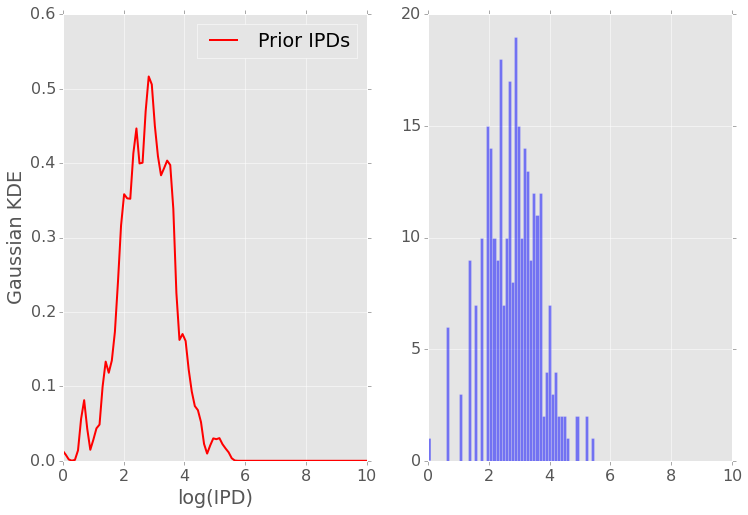

000000F motif: ACCAGATCTAA n_prior: 177
	weight  : [ 0.40816043  0.59183957]
	means   : [[ 3.74060434  2.93953541]]
	AIC1:  403.122187739 	BIC1:  419.002936402


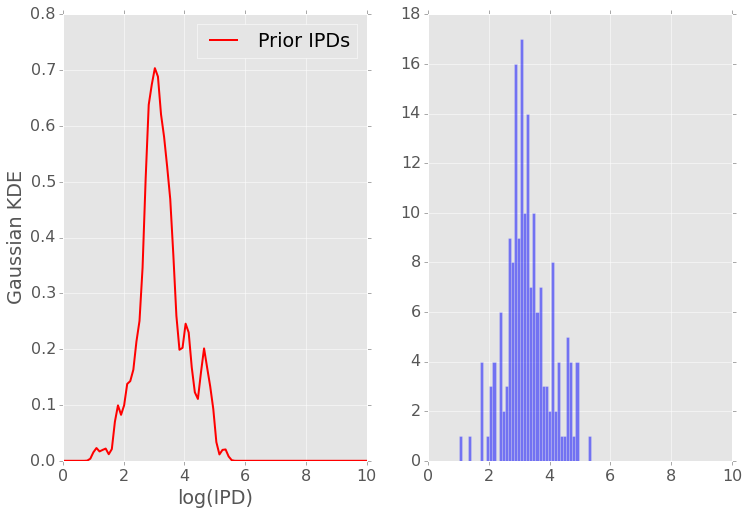

000000F motif: ACCAGATCTAC n_prior: 240
	weight  : [ 0.48384273  0.51615727]
	means   : [[ 2.76186766  3.5429168 ]]
	AIC1:  574.335732847 	BIC1:  591.738927463


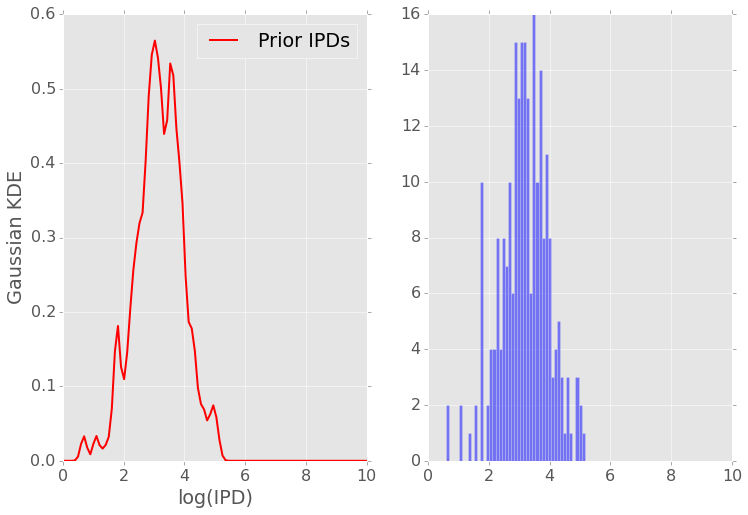

000000F motif: ACCAGATCTAG n_prior: 428
	weight  : [ 0.60019388  0.39980612]
	means   : [[ 2.96416845  3.38618031]]
	AIC1:  1123.0075851 	BIC1:  1143.30320108


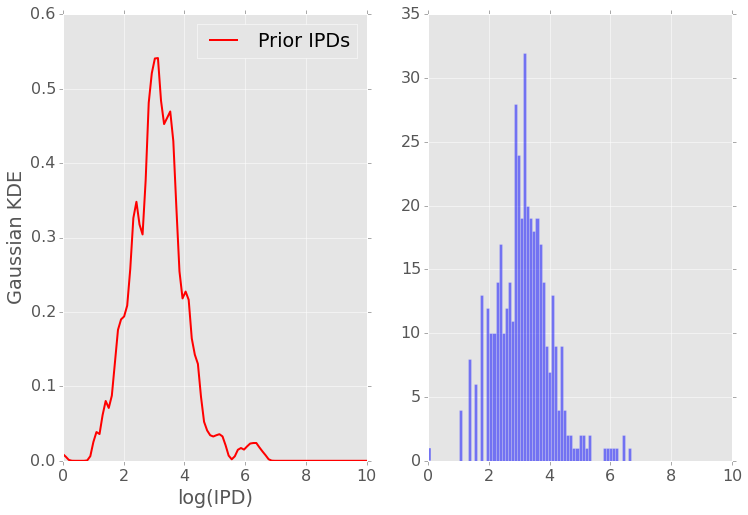

000000F motif: ACCAGATCTAT n_prior: 285
	weight  : [ 0.43417753  0.56582247]
	means   : [[ 2.90563568  3.22993164]]
	AIC1:  713.956402326 	BIC1:  732.218848228


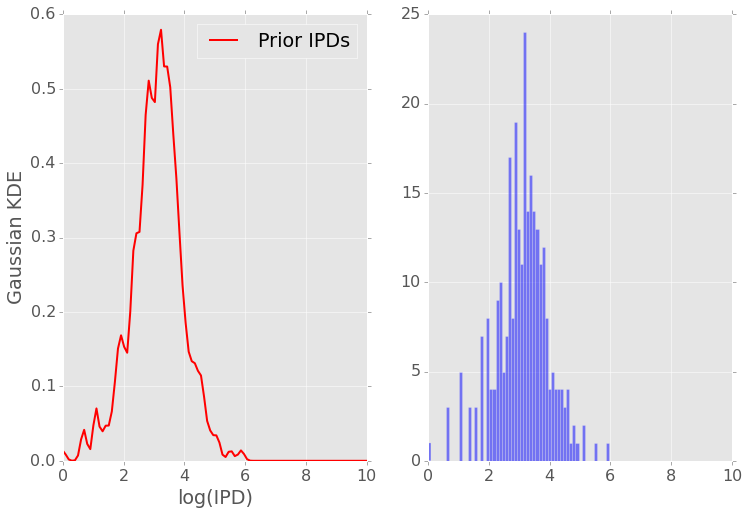

000000F motif: CCGCCAGATCT n_prior: 183
	weight  : [ 0.5569841  0.4430159]
	means   : [[ 3.46074519  2.42515822]]
	AIC1:  520.938769234 	BIC1:  536.986199998


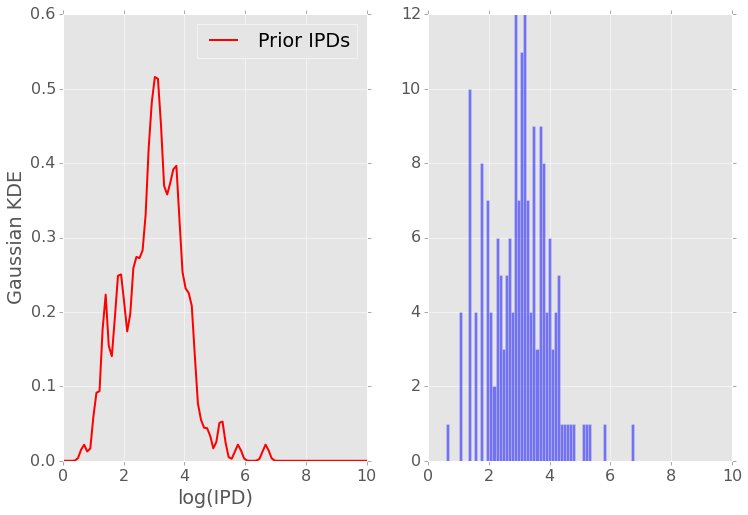

000000F motif: AGCAGATCTCC n_prior: 448
	weight  : [ 0.49554186  0.50445814]
	means   : [[ 3.49224493  2.70238096]]
	AIC1:  1188.33335702 	BIC1:  1208.85732318


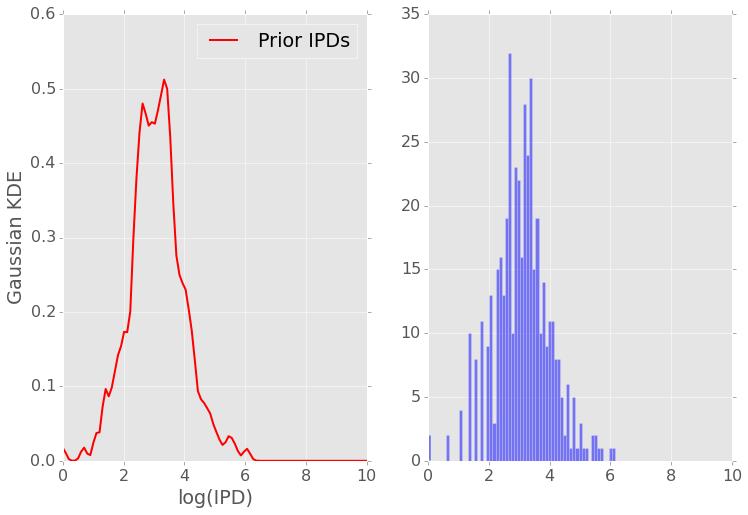

000000F motif: AGCAGATCTCA n_prior: 517
	weight  : [ 0.51844899  0.48155101]
	means   : [[ 2.62254773  3.33931498]]
	AIC1:  1284.4293436 	BIC1:  1305.66955797


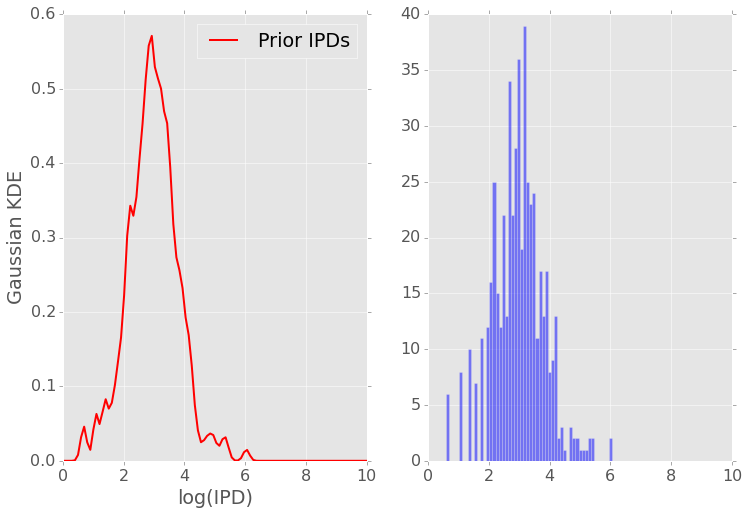

000000F motif: AGCAGATCTCG n_prior: 68
	weight  : [ 0.48757469  0.51242531]
	means   : [[ 3.45680691  2.6824802 ]]
	AIC1:  165.287524204 	BIC1:  176.385062729


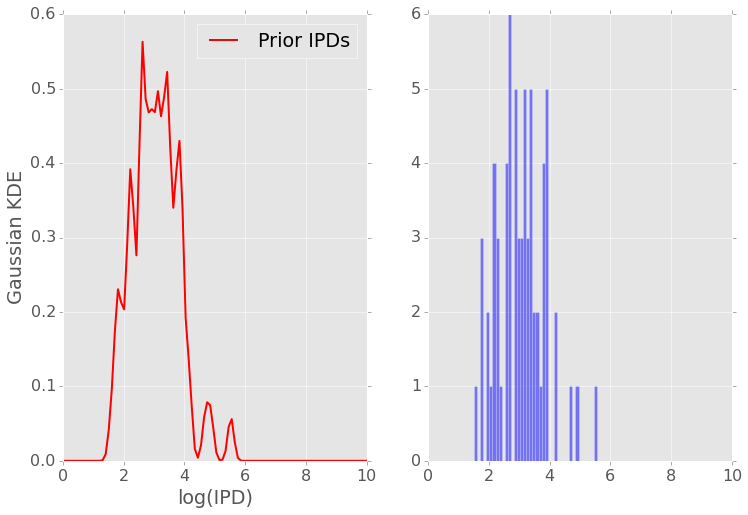

000000F motif: AGCAGATCTCT n_prior: 1000
	weight  : [ 0.51106957  0.48893043]
	means   : [[ 2.66570473  3.32926612]]
	AIC1:  2527.43689222 	BIC1:  2551.97566861


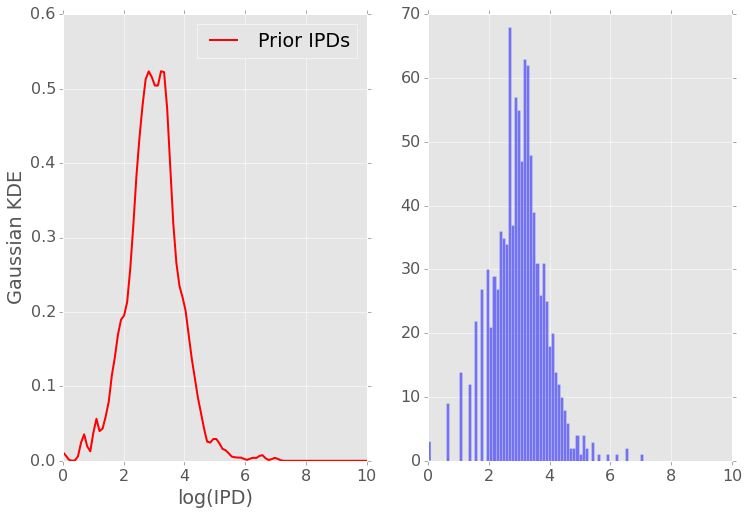

000000F motif: TACAGATCTTC n_prior: 399
	weight  : [ 0.45198392  0.54801608]
	means   : [[ 3.3305513  2.5125413]]
	AIC1:  976.91715714 	BIC1:  996.861964224


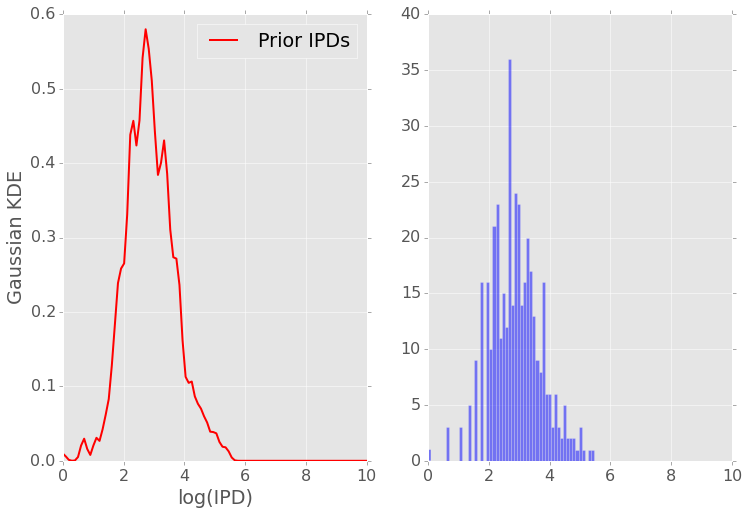

000000F motif: TACAGATCTTG n_prior: 582
	weight  : [ 0.48318172  0.51681828]
	means   : [[ 2.42190647  3.24543118]]
	AIC1:  1509.20868432 	BIC1:  1531.04103656


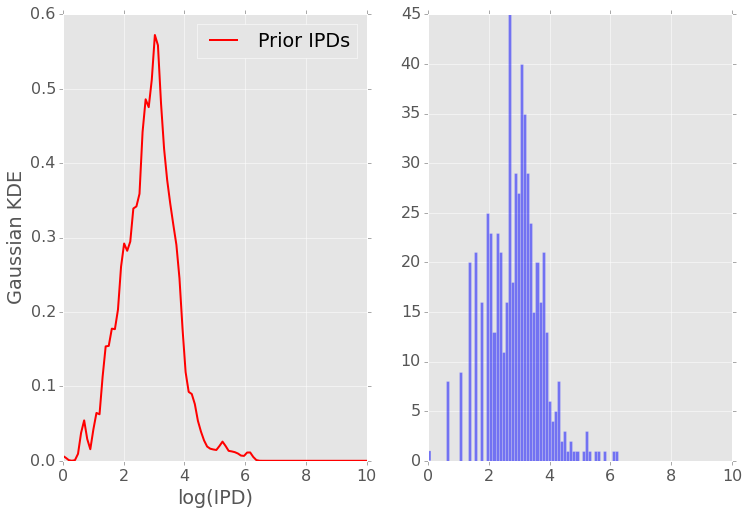

000000F motif: AGGCAGATCTG n_prior: 262
	weight  : [ 0.61914453  0.38085547]
	means   : [[ 2.57451879  3.00382442]]
	AIC1:  674.455126512 	BIC1:  692.296849031


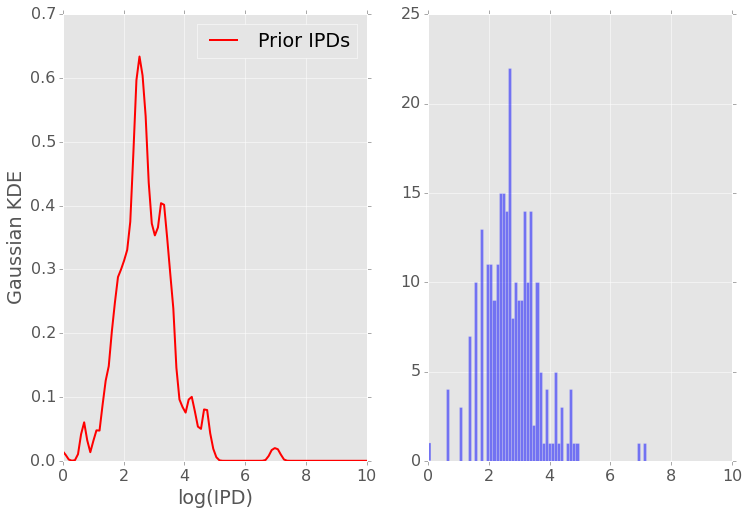

000000F motif: AGGCAGATCTC n_prior: 1000
	weight  : [ 0.51552613  0.48447387]
	means   : [[ 2.39678385  3.27733765]]
	AIC1:  2555.19606023 	BIC1:  2579.73483663


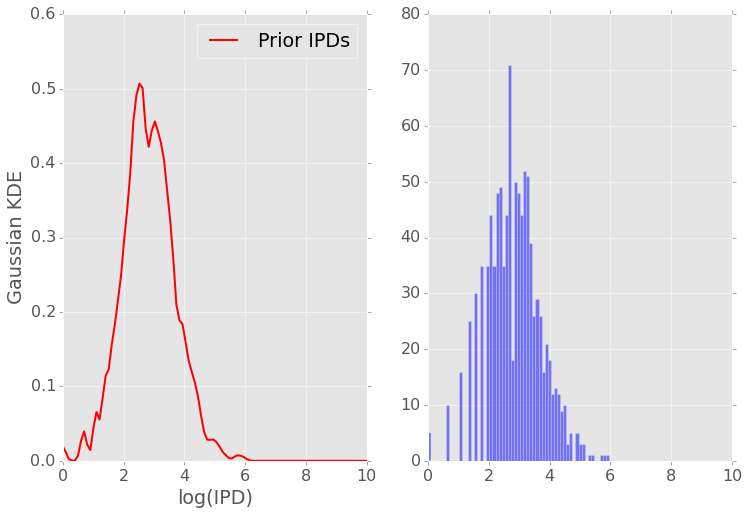

000000F motif: AGGCAGATCTA n_prior: 794
	weight  : [ 0.44724772  0.55275228]
	means   : [[ 2.86309884  2.56529691]]
	AIC1:  2010.5360744 	BIC1:  2033.92149171


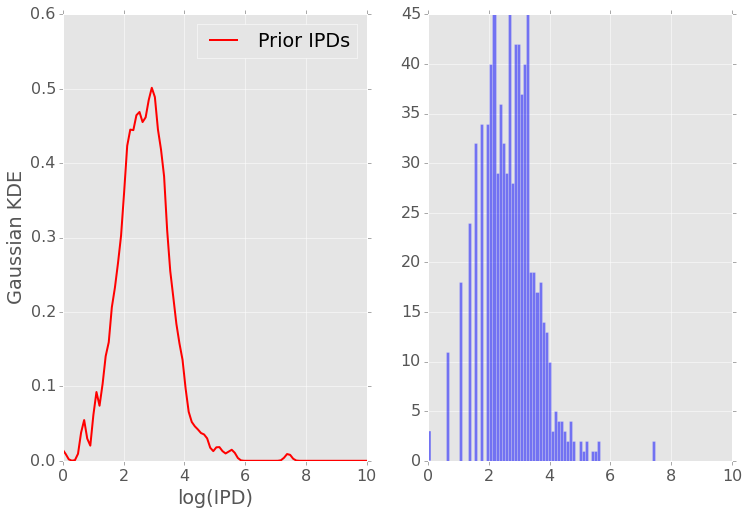

000000F motif: CAGATCTACCG n_prior: 133
	weight  : [ 0.47426929  0.52573071]
	means   : [[ 3.20036136  2.24451946]]
	AIC1:  343.26752276 	BIC1:  357.719268401


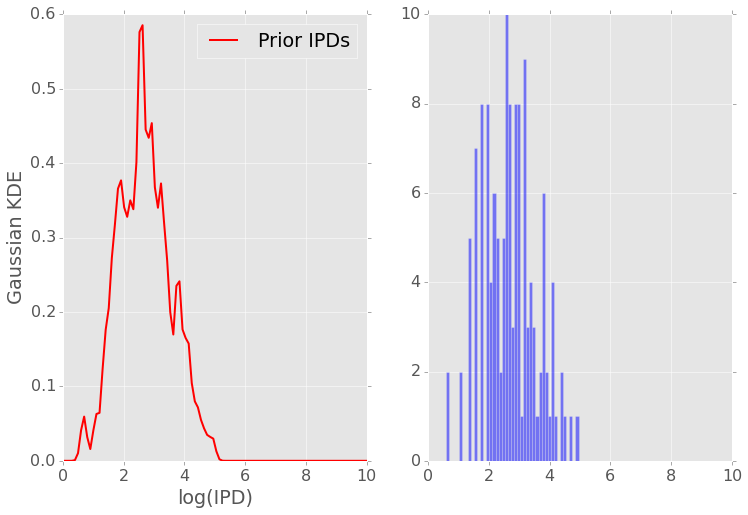

000000F motif: GACTCAGATCT n_prior: 1000
	weight  : [ 0.50082176  0.49917824]
	means   : [[ 3.18753806  2.37324038]]
	AIC1:  2379.73726004 	BIC1:  2404.27603644


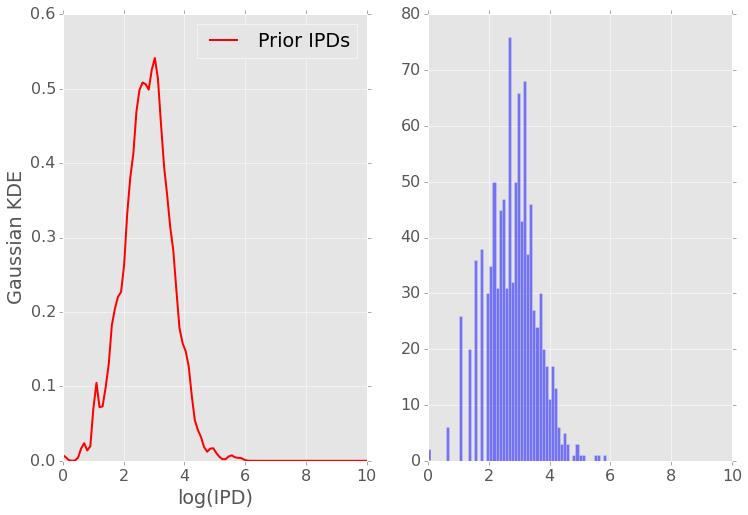

000000F motif: AACCAGATCTA n_prior: 406
	weight  : [ 0.48370293  0.51629707]
	means   : [[ 2.86084704  2.25318495]]
	AIC1:  1012.15811555 	BIC1:  1032.18988135


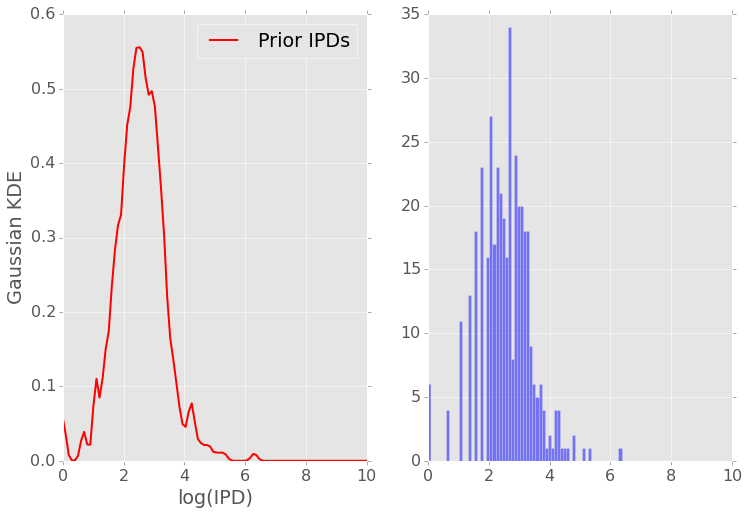

000000F motif: AACCAGATCTC n_prior: 1000
	weight  : [ 0.45053701  0.54946299]
	means   : [[ 2.90845146  2.15336232]]
	AIC1:  2587.01169874 	BIC1:  2611.55047514


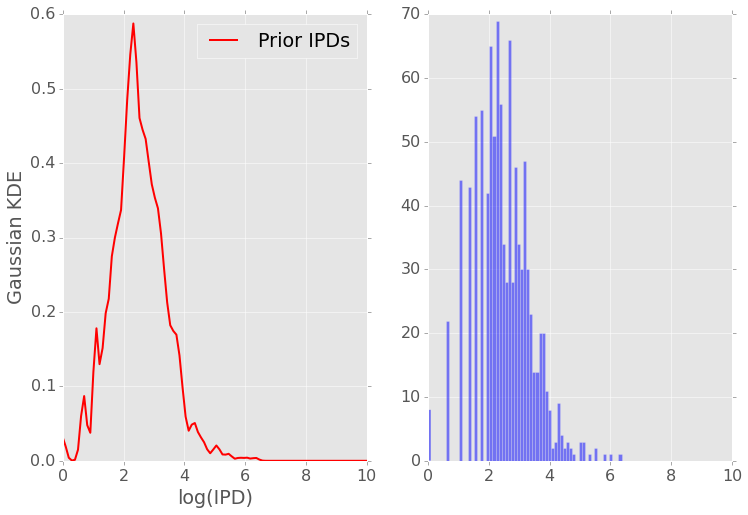

000000F motif: AACCAGATCTG n_prior: 937
	weight  : [ 0.50977792  0.49022208]
	means   : [[ 2.14168652  2.96050809]]
	AIC1:  2300.31077523 	BIC1:  2324.52419164


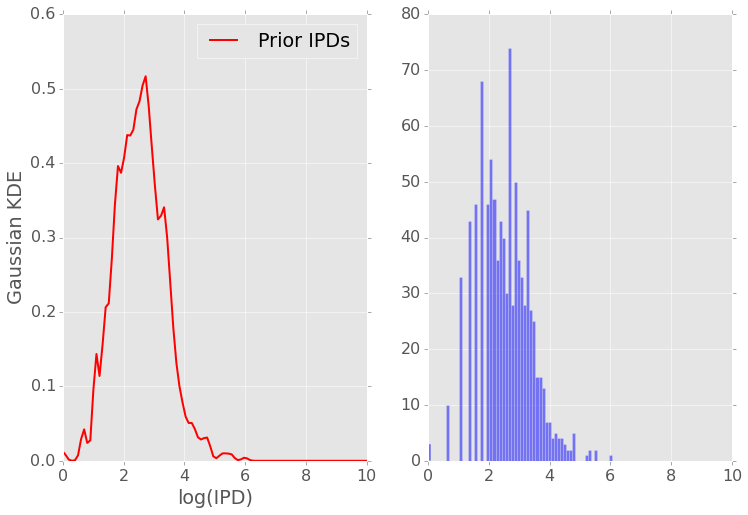

000000F motif: AACCAGATCTT n_prior: 1000
	weight  : [ 0.50021532  0.49978468]
	means   : [[ 2.96017802  2.09430586]]
	AIC1:  2507.94052876 	BIC1:  2532.47930516


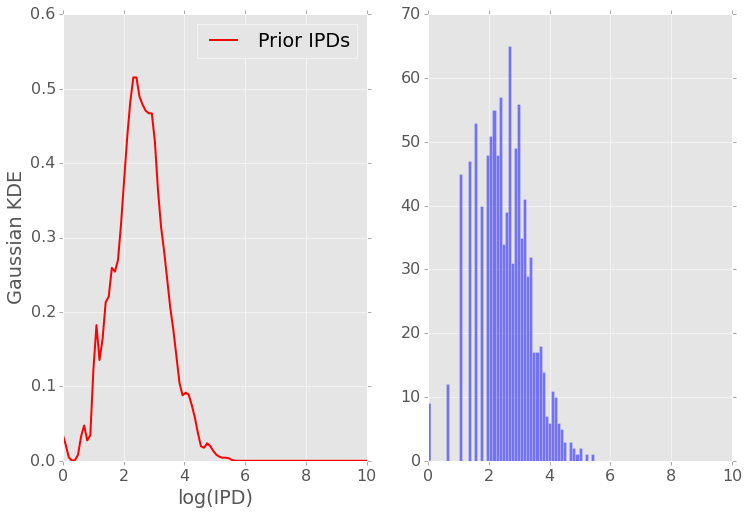

000000F motif: CTCCCAGATCT n_prior: 824
	weight  : [ 0.47833022  0.52166978]
	means   : [[ 3.26347325  2.44577466]]
	AIC1:  2193.35186872 	BIC1:  2216.92272137


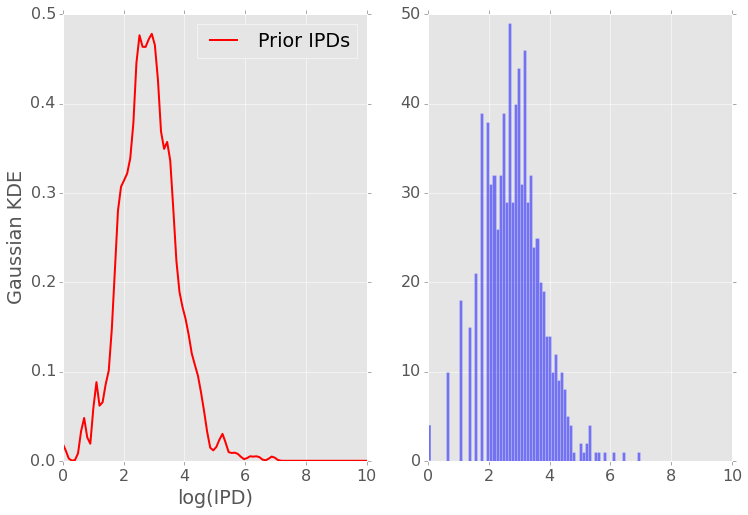

000000F motif: CAACCAGATCT n_prior: 1000
	weight  : [ 0.51284657  0.48715343]
	means   : [[ 2.5611483   3.42336865]]
	AIC1:  2551.15776516 	BIC1:  2575.69654156


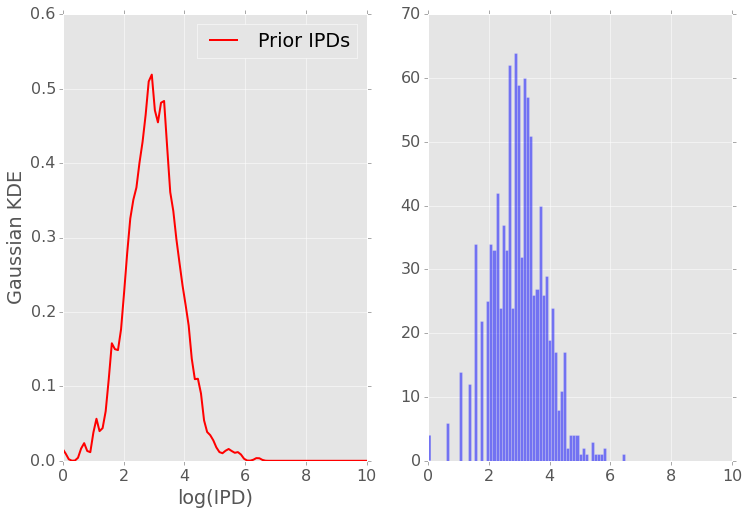

000000F motif: GCACCAGATCT n_prior: 230
	weight  : [ 0.59153227  0.40846773]
	means   : [[ 2.9295767   3.90917326]]
	AIC1:  647.129054439 	BIC1:  664.319450984


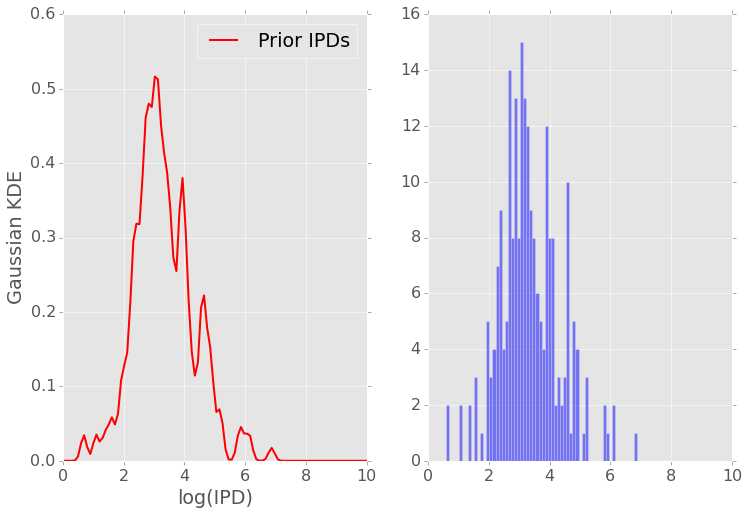

000000F motif: AATCCAGATCT n_prior: 877
	weight  : [ 0.4979773  0.5020227]
	means   : [[ 2.26497748  3.14509584]]
	AIC1:  2194.2664224 	BIC1:  2218.14895737


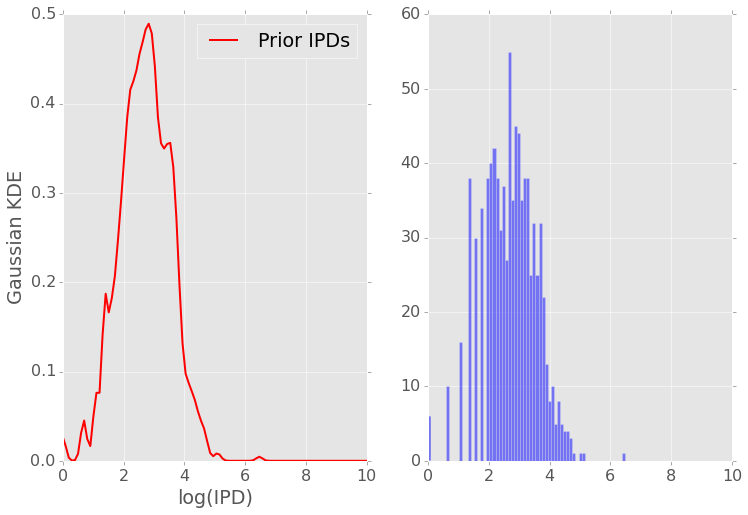

000000F motif: CAGATCTACCA n_prior: 444
	weight  : [ 0.42113756  0.57886244]
	means   : [[ 2.94240538  2.52454965]]
	AIC1:  1122.58442371 	BIC1:  1143.06354652


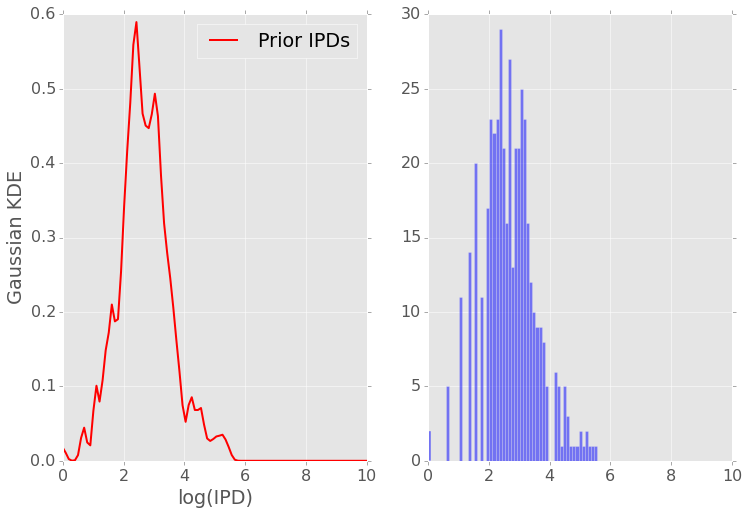

000000F motif: CAGATCTGTGC n_prior: 603
	weight  : [ 0.43403472  0.56596528]
	means   : [[ 3.314077    2.59289836]]
	AIC1:  1539.3123262 	BIC1:  1561.32191218


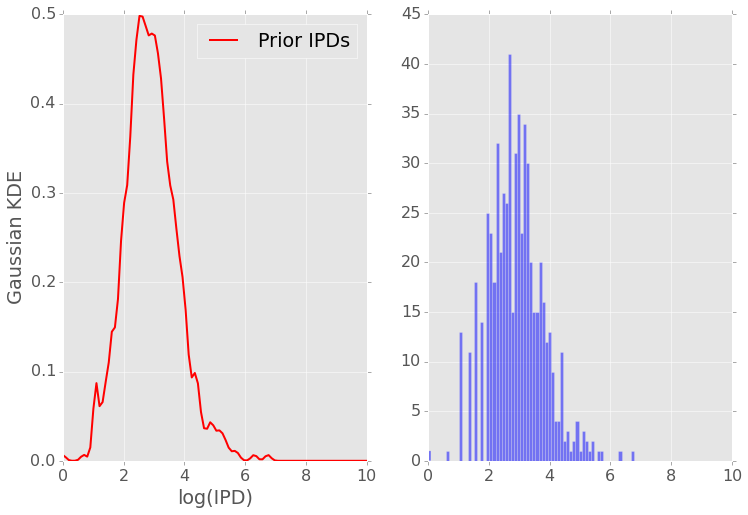

000000F motif: CAGATCTGTGA n_prior: 958
	weight  : [ 0.4437649  0.5562351]
	means   : [[ 3.37303522  2.54059926]]
	AIC1:  2480.77405449 	BIC1:  2505.09829338


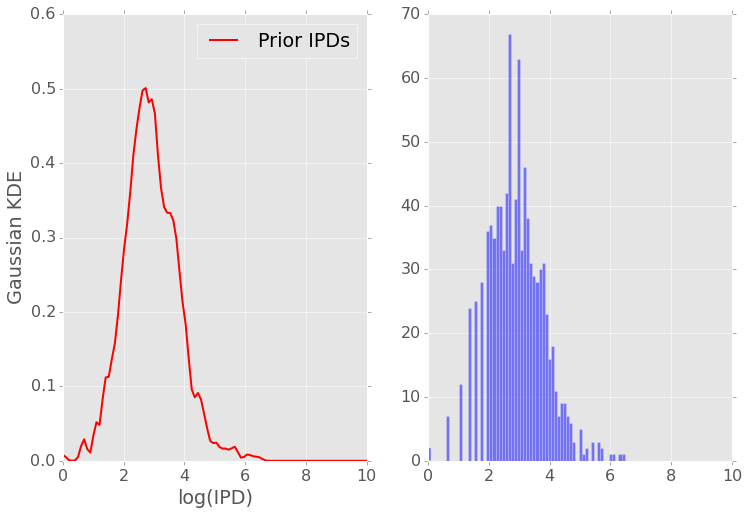

000000F motif: CAGATCTGTGG n_prior: 712
	weight  : [ 0.58195634  0.41804366]
	means   : [[ 2.74915959  3.02417648]]
	AIC1:  1904.98634873 	BIC1:  1927.82673828


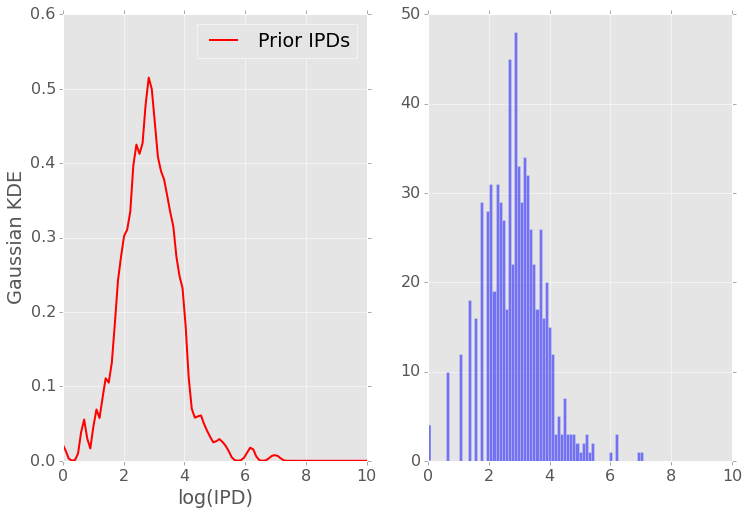

000000F motif: CAGATCTGTGT n_prior: 906
	weight  : [ 0.50376962  0.49623038]
	means   : [[ 2.47319653  3.35112843]]
	AIC1:  2254.35228349 	BIC1:  2278.39748002


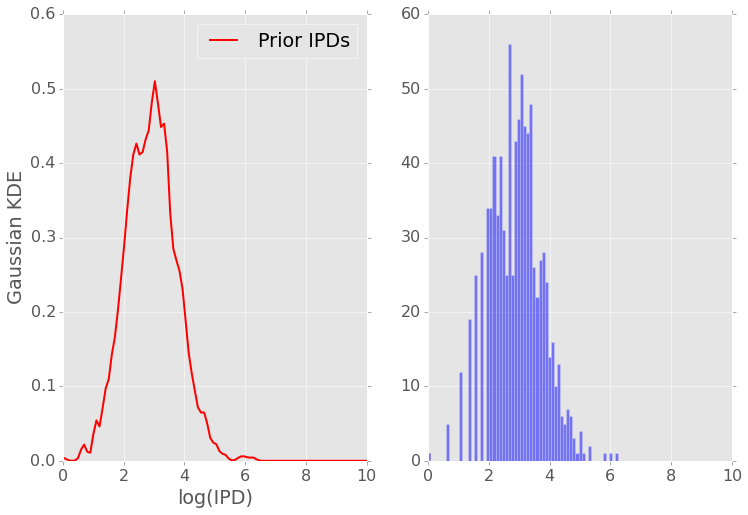

000000F motif: GGCAGATCTGG n_prior: 558
	weight  : [ 0.60416355  0.39583645]
	means   : [[ 2.89046095  3.23726903]]
	AIC1:  1417.64983542 	BIC1:  1439.27163024


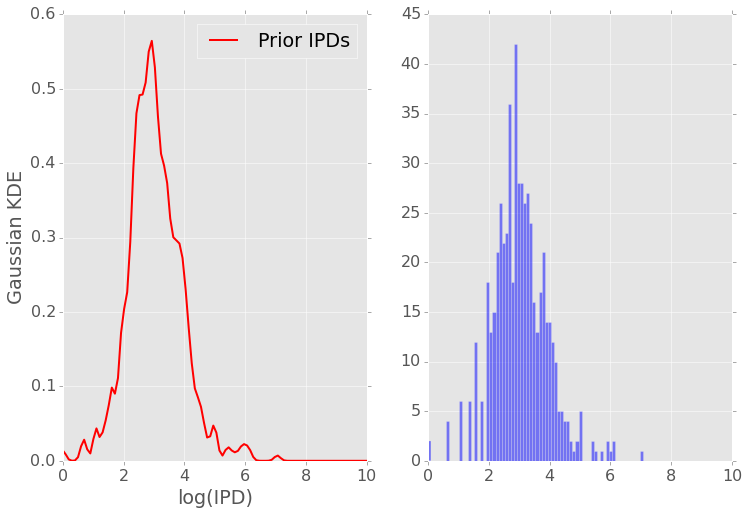

000000F motif: GGCAGATCTGA n_prior: 131
	weight  : [ 0.43773261  0.56226739]
	means   : [[ 2.4592084   3.39584445]]
	AIC1:  340.528916717 	BIC1:  354.904903333


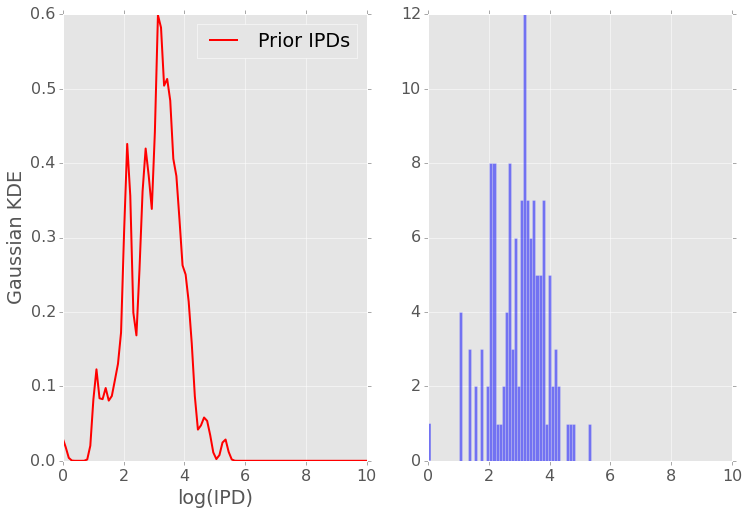

000000F motif: GGCAGATCTGT n_prior: 227
	weight  : [ 0.49415249  0.50584751]
	means   : [[ 3.41667259  2.50218621]]
	AIC1:  583.105111014 	BIC1:  600.229861101


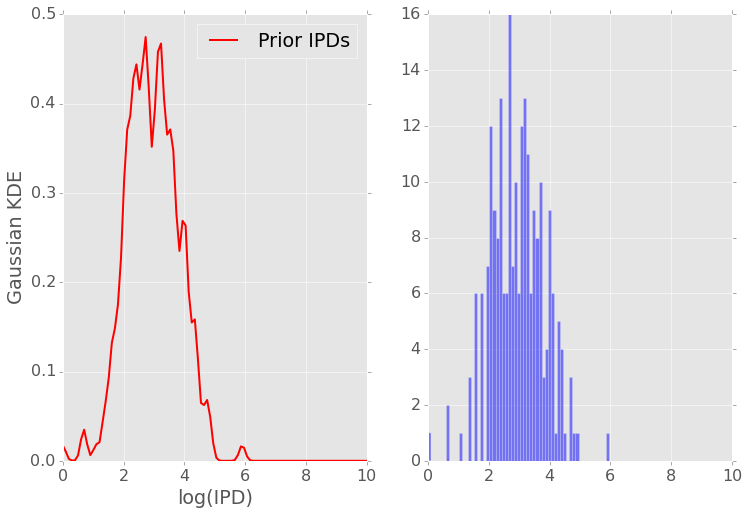

000000F motif: CAGATCTTGTT n_prior: 639
	weight  : [ 0.52133547  0.47866453]
	means   : [[ 2.28518243  3.01505484]]
	AIC1:  1534.87425357 	BIC1:  1557.17377584


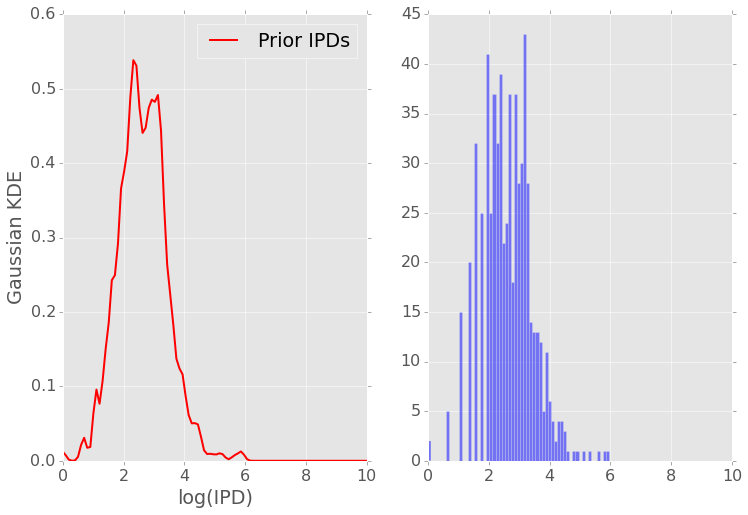

000000F motif: GGCAGATCTGC n_prior: 379
	weight  : [ 0.47307054  0.52692946]
	means   : [[ 2.63627206  3.40948805]]
	AIC1:  1014.39150432 	BIC1:  1034.07918534


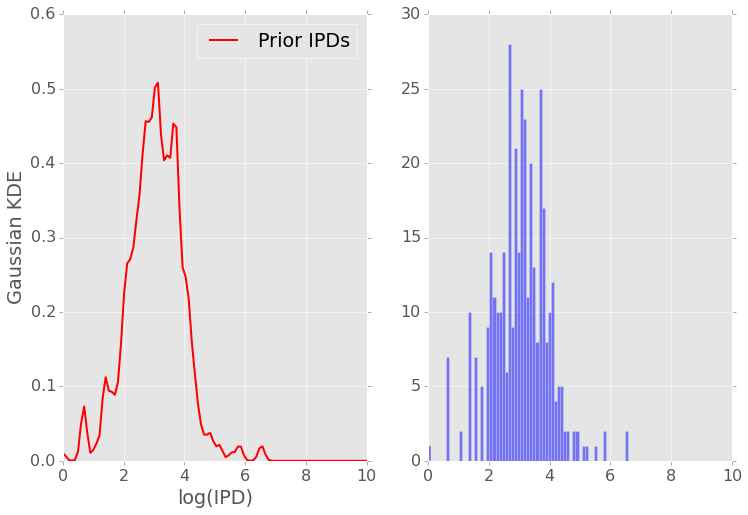

000000F motif: CAGATCTTCGC n_prior: 213
	weight  : [ 0.49909043  0.50090957]
	means   : [[ 3.28372872  2.51953033]]
	AIC1:  509.014176939 	BIC1:  525.820637767


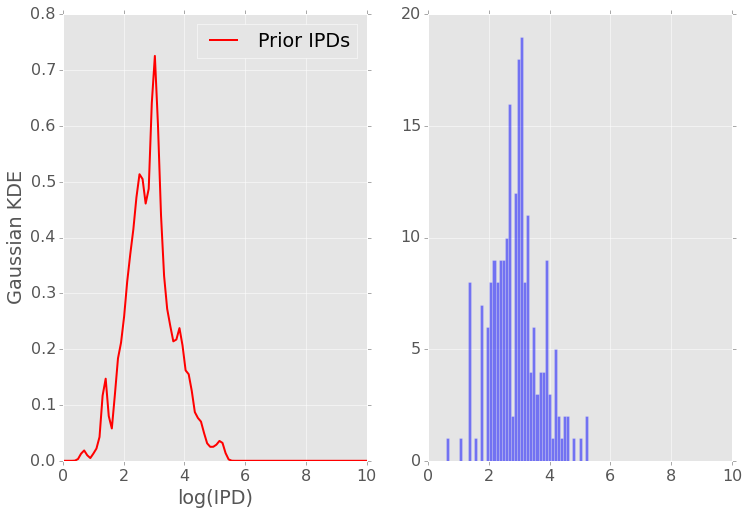

000000F motif: TCCGCAGATCT n_prior: 170
	weight  : [ 0.52657504  0.47342496]
	means   : [[ 2.49613804  3.3247498 ]]
	AIC1:  419.124212148 	BIC1:  434.803204334


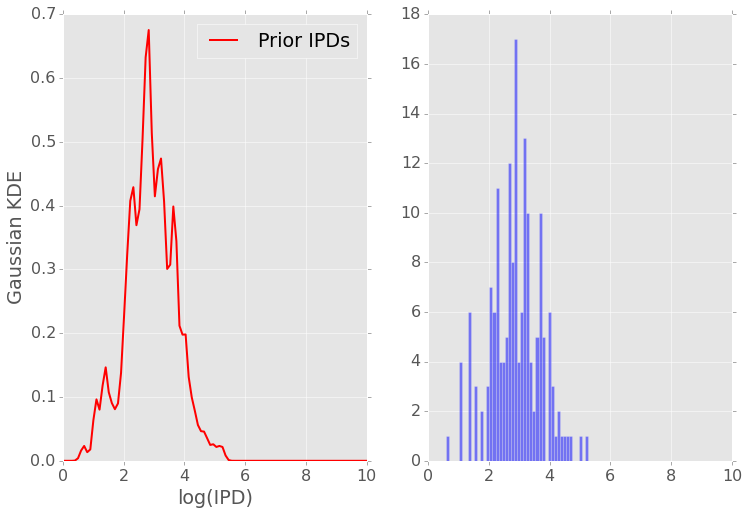

000000F motif: GCTACAGATCT n_prior: 258
	weight  : [ 0.57349295  0.42650705]
	means   : [[ 2.60301828  2.76971737]]
	AIC1:  653.751926506 	BIC1:  671.516724431


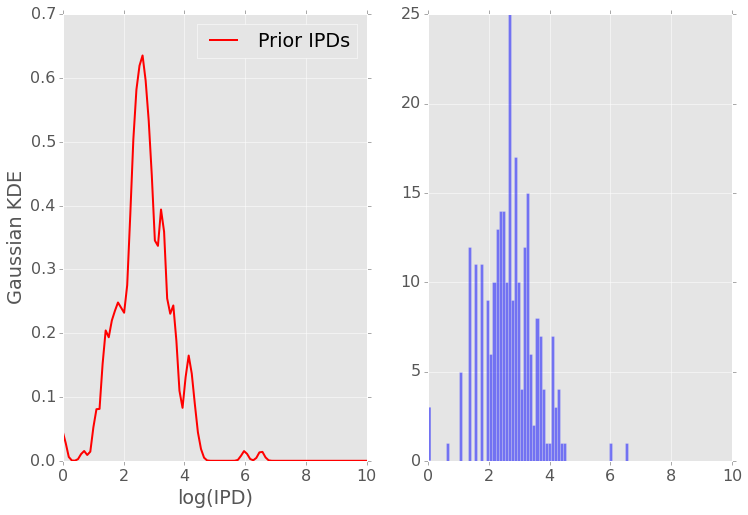

000000F motif: CCGTCAGATCT n_prior: 254
	weight  : [ 0.57916798  0.42083202]
	means   : [[ 2.89942523  2.9893579 ]]
	AIC1:  621.550419723 	BIC1:  639.237091058


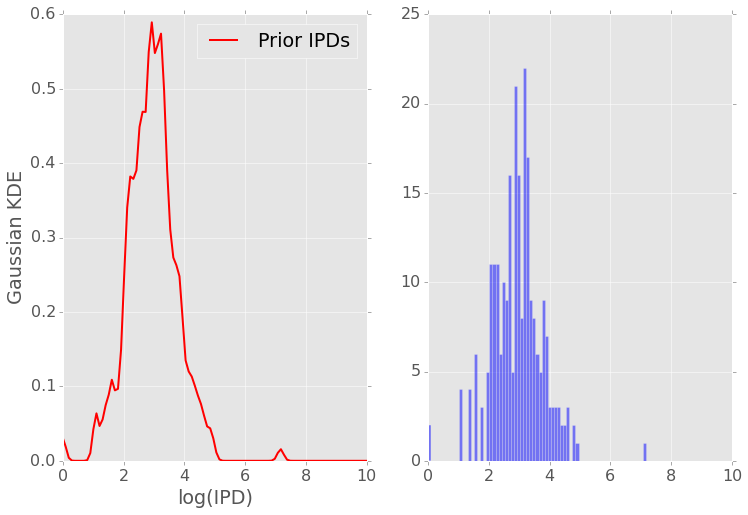

000000F motif: TTCAGATCTGA n_prior: 1000
	weight  : [ 0.52202221  0.47797779]
	means   : [[ 3.50567466  2.64517317]]
	AIC1:  2633.5439812 	BIC1:  2658.08275759


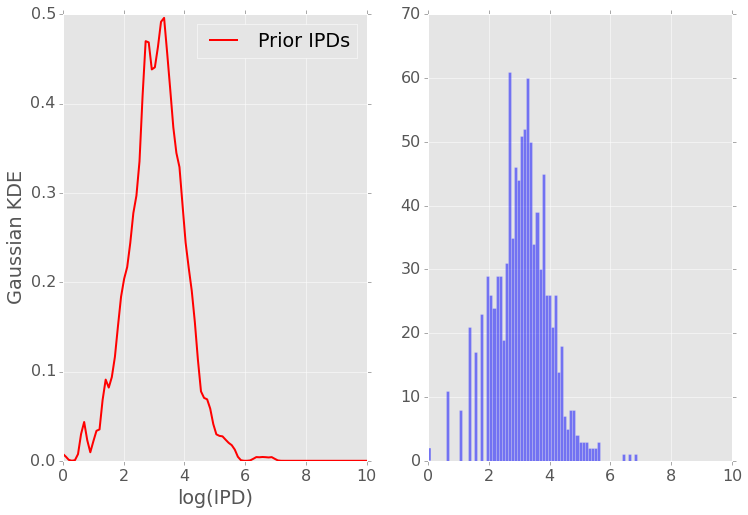

000000F motif: CCCACAGATCT n_prior: 773
	weight  : [ 0.60438092  0.39561908]
	means   : [[ 2.66063282  2.94622289]]
	AIC1:  2018.34124291 	BIC1:  2041.59263815


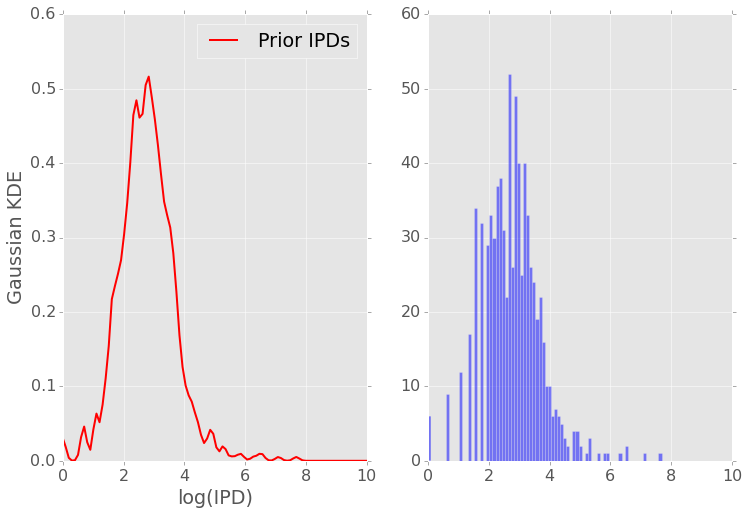

000000F motif: TGTCCAGATCT n_prior: 694
	weight  : [ 0.4867958  0.5132042]
	means   : [[ 3.15591018  2.33573659]]
	AIC1:  1668.3015791 	BIC1:  1691.0139389


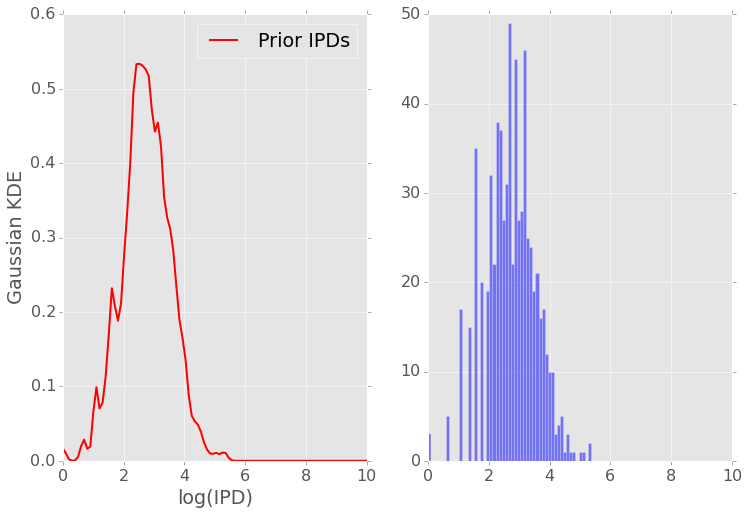

000000F motif: GACAGATCTGT n_prior: 824
	weight  : [ 0.50767724  0.49232276]
	means   : [[ 2.58616589  3.34130218]]
	AIC1:  2083.45923536 	BIC1:  2107.03008801


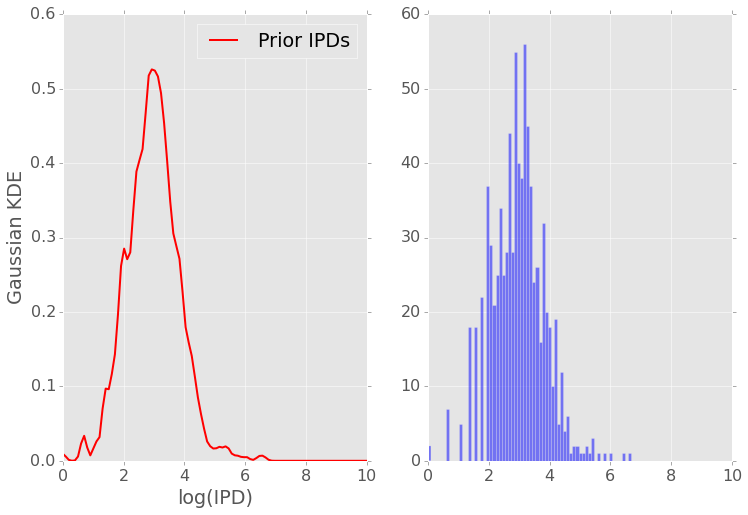

000000F motif: GACAGATCTGG n_prior: 651
	weight  : [ 0.52935524  0.47064476]
	means   : [[ 2.59189789  3.24349888]]
	AIC1:  1690.20613949 	BIC1:  1712.5986877


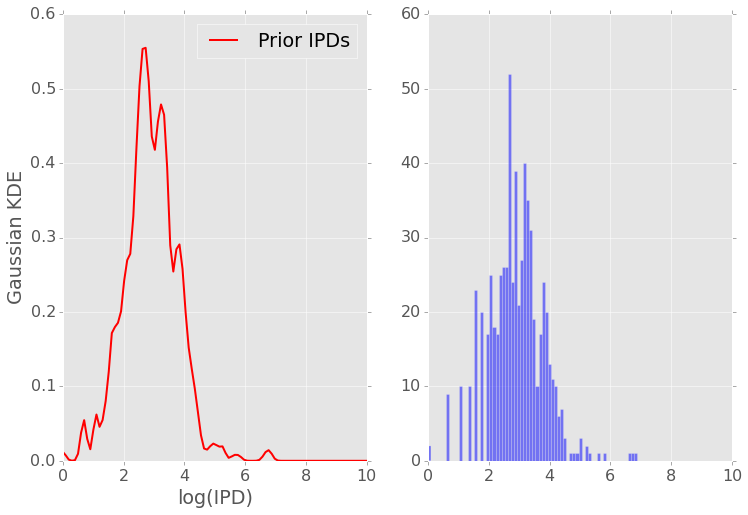

000000F motif: GACAGATCTGC n_prior: 586
	weight  : [ 0.52035137  0.47964863]
	means   : [[ 2.63060811  3.45471762]]
	AIC1:  1517.22658807 	BIC1:  1539.09318701


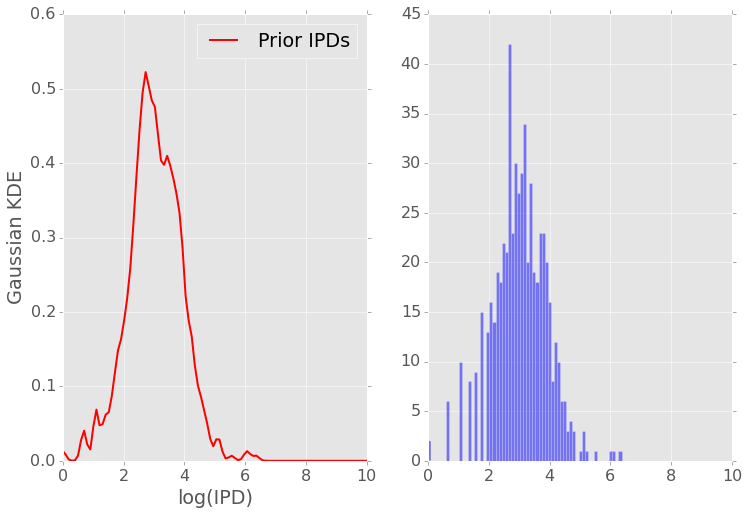

000000F motif: GACAGATCTGA n_prior: 710
	weight  : [ 0.50667146  0.49332854]
	means   : [[ 3.31623299  2.44706326]]
	AIC1:  1808.26184757 	BIC1:  1831.08817242


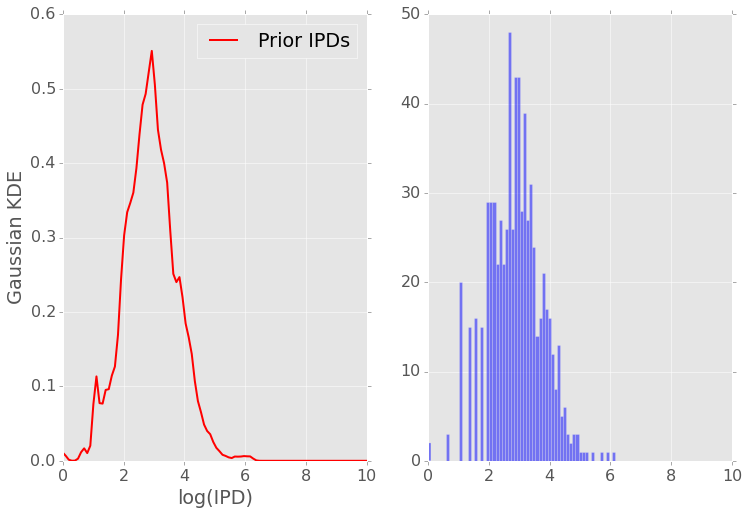

000000F motif: CTCACAGATCT n_prior: 890
	weight  : [ 0.60871909  0.39128091]
	means   : [[ 2.51160523  3.31030125]]
	AIC1:  2380.77245087 	BIC1:  2404.72855818


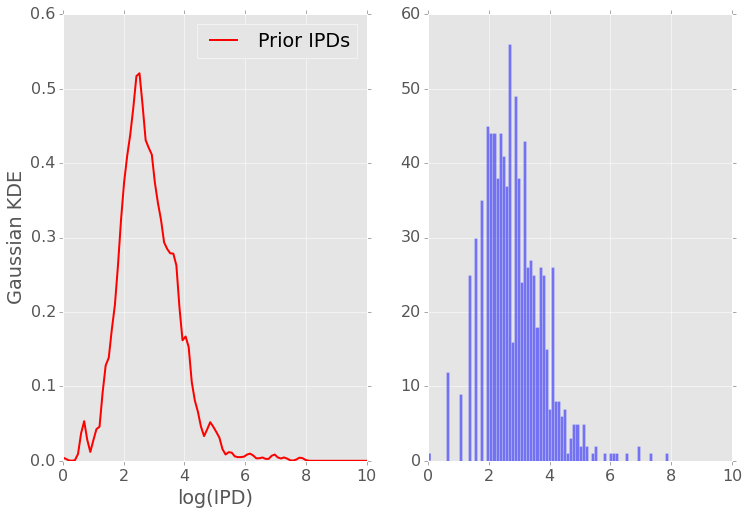

000000F motif: CACCCAGATCT n_prior: 807
	weight  : [ 0.54233411  0.45766589]
	means   : [[ 2.6059996   2.94979454]]
	AIC1:  2080.30018725 	BIC1:  2103.76680559


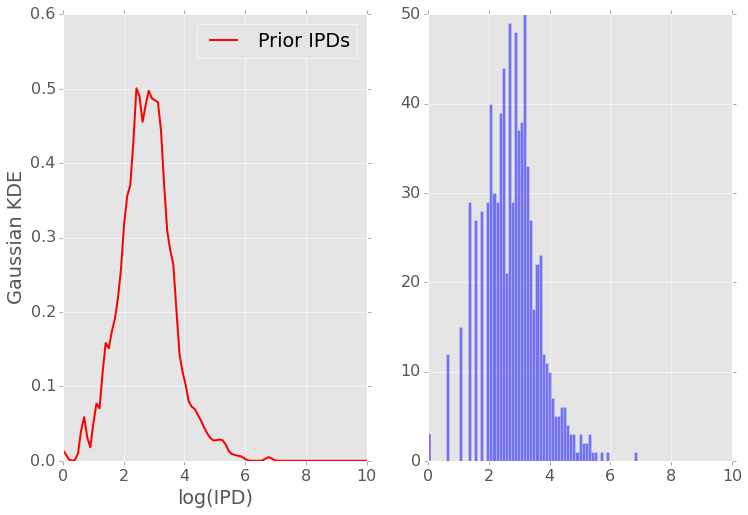

000000F motif: GAGACAGATCT n_prior: 885
	weight  : [ 0.53249189  0.46750811]
	means   : [[ 2.23896346  2.9169589 ]]
	AIC1:  2300.88962954 	BIC1:  2324.81756777


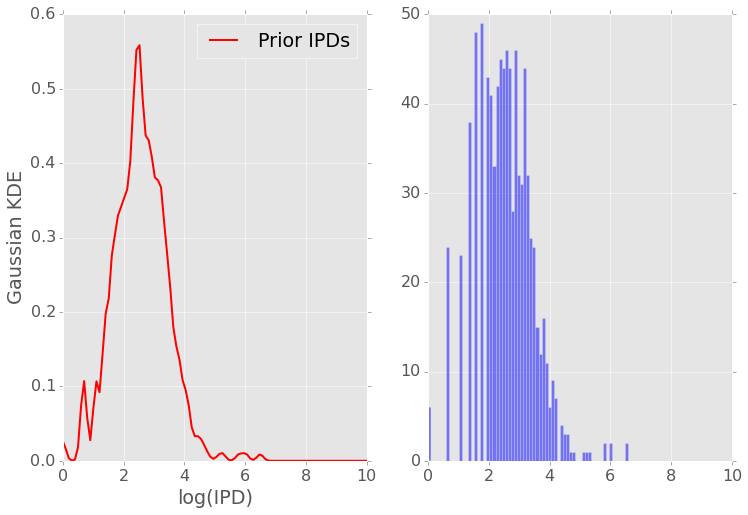

000000F motif: ACACAGATCTT n_prior: 1000
	weight  : [ 0.50690888  0.49309112]
	means   : [[ 3.41644997  2.57401997]]
	AIC1:  2600.2481566 	BIC1:  2624.786933


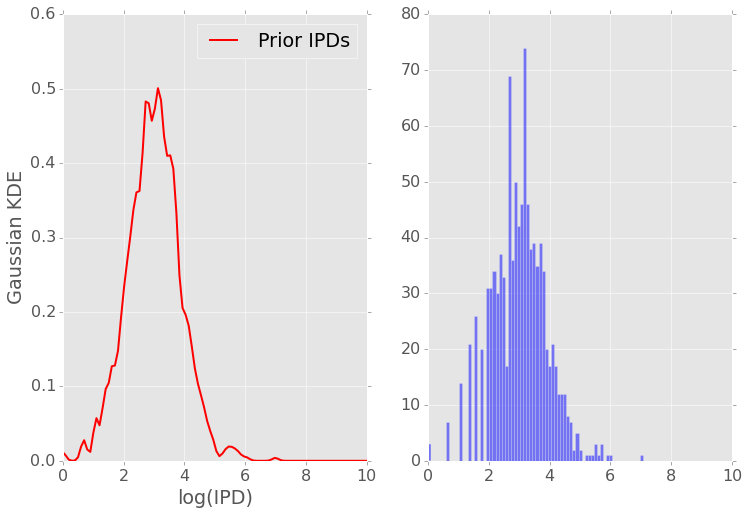

000000F motif: ACAGATCTGCC n_prior: 242
	weight  : [ 0.5073261  0.4926739]
	means   : [[ 2.72711521  3.56335669]]
	AIC1:  595.066593216 	BIC1:  612.511281847


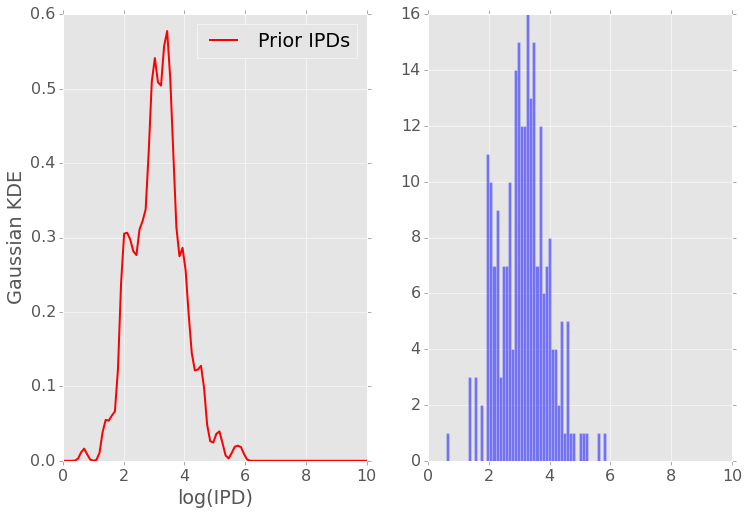

000000F motif: ACAGATCTGCA n_prior: 838
	weight  : [ 0.48231518  0.51768482]
	means   : [[ 3.36779773  2.55760402]]
	AIC1:  1988.65800536 	BIC1:  2012.31309587


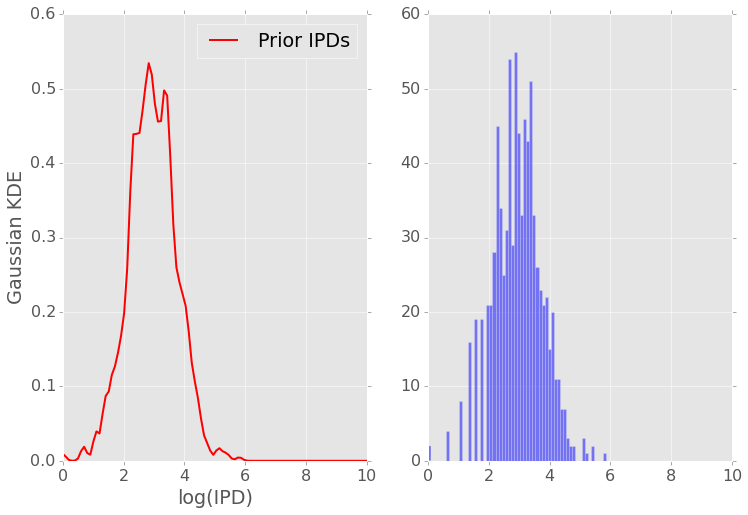

000000F motif: ACAGATCTGCG n_prior: 67
	weight  : [ 0.55146091  0.44853909]
	means   : [[ 3.46832913  2.70483741]]
	AIC1:  143.792116424 	BIC1:  154.815579521


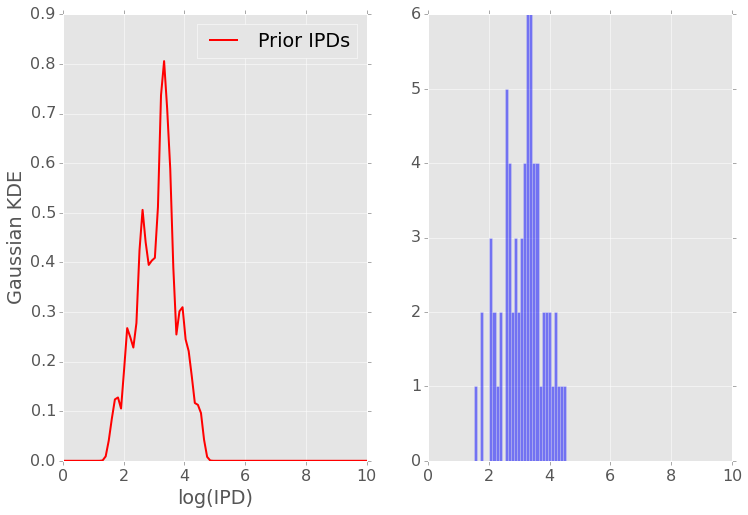

000000F motif: CTTCAGATCTG n_prior: 646
	weight  : [ 0.47131725  0.52868275]
	means   : [[ 2.12442989  2.96519826]]
	AIC1:  1593.58374725 	BIC1:  1615.93774477


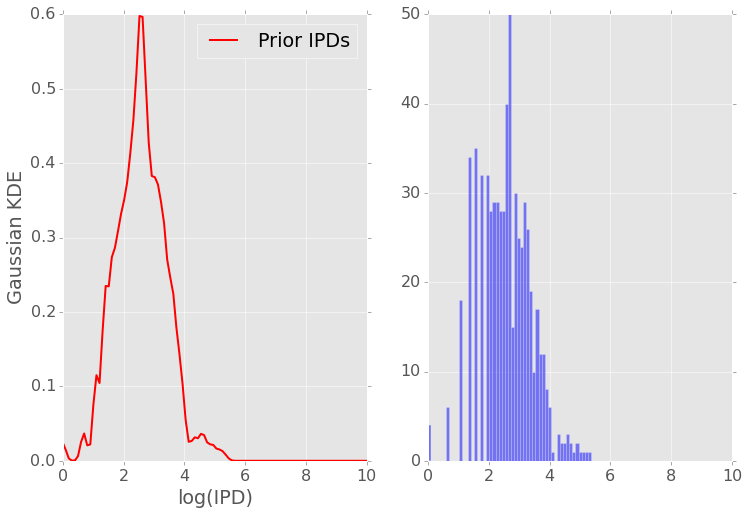

000000F motif: CTTCAGATCTC n_prior: 1000
	weight  : [ 0.50396225  0.49603775]
	means   : [[ 2.2015725   2.97552321]]
	AIC1:  2442.7896572 	BIC1:  2467.3284336


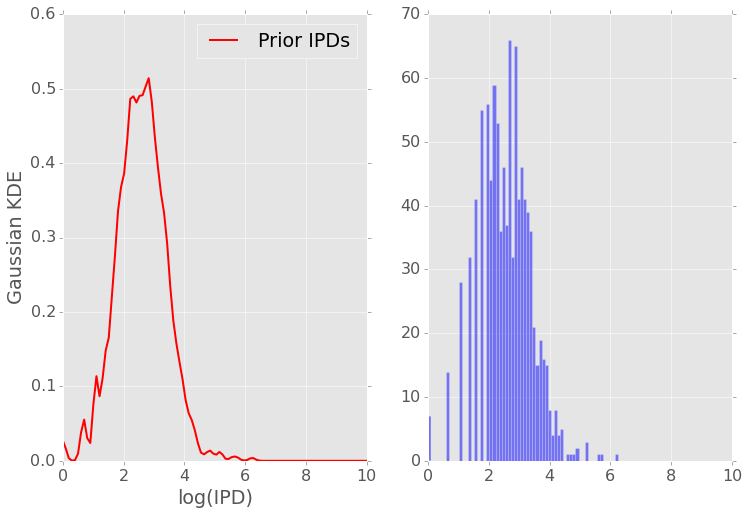

000000F motif: CTTCAGATCTA n_prior: 856
	weight  : [ 0.51668304  0.48331696]
	means   : [[ 2.17900573  2.9113031 ]]
	AIC1:  2215.89686116 	BIC1:  2239.65821304


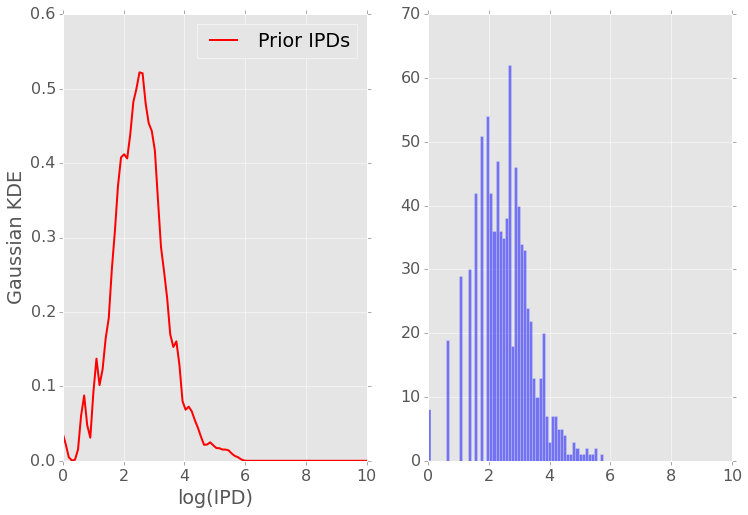

000000F motif: CTTCAGATCTT n_prior: 1000
	weight  : [ 0.55703389  0.44296611]
	means   : [[ 2.44066937  2.84770673]]
	AIC1:  2468.63693158 	BIC1:  2493.17570798


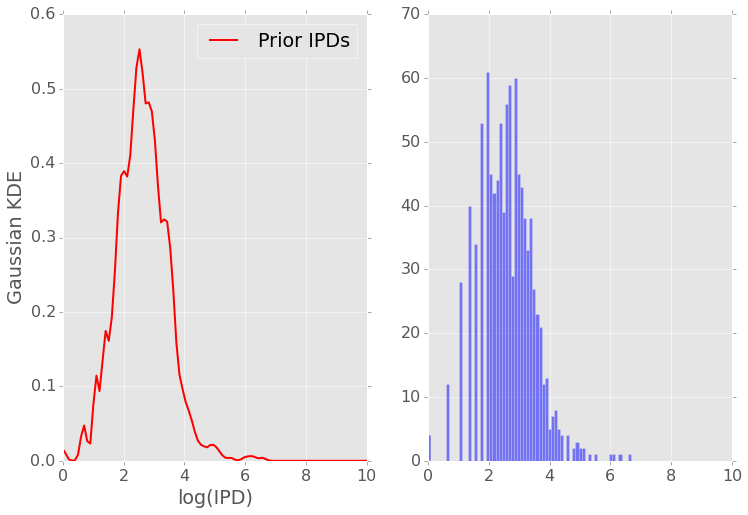

000000F motif: TCAGATCTATC n_prior: 787
	weight  : [ 0.50939043  0.49060957]
	means   : [[ 2.51146661  3.45023091]]
	AIC1:  2075.04719517 	BIC1:  2098.38833642


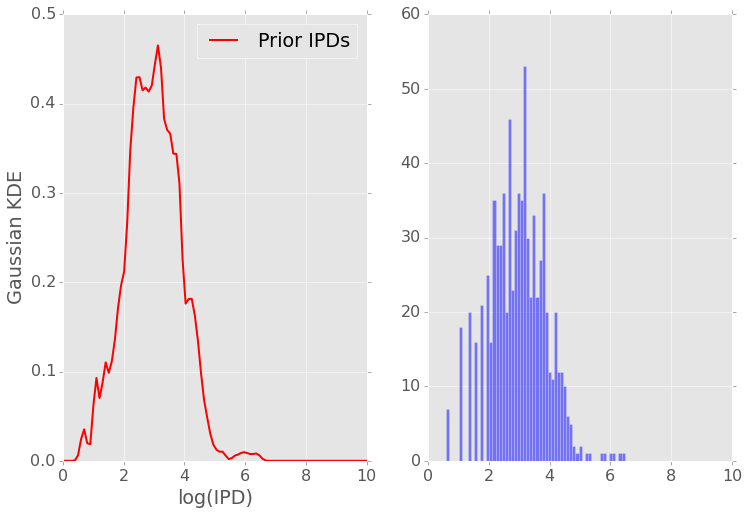

000000F motif: CACGCAGATCT n_prior: 89
	weight  : [ 0.42011804  0.57988196]
	means   : [[ 2.83437148  2.57698316]]
	AIC1:  225.130321107 	BIC1:  237.573502956


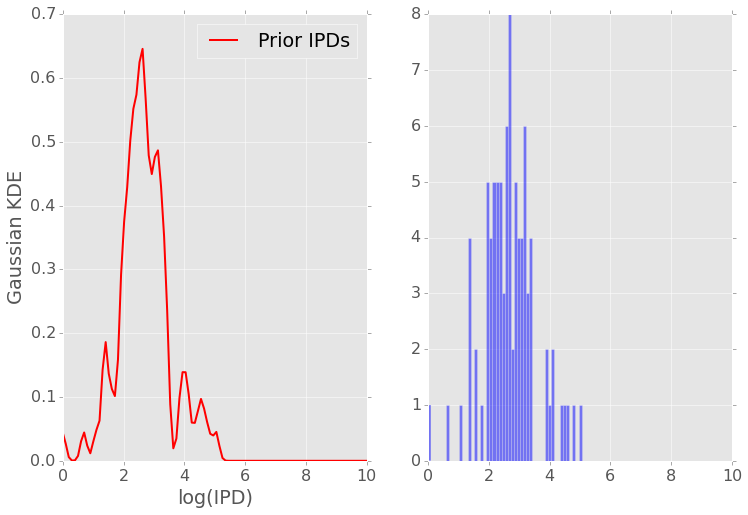

000000F motif: TTGTCAGATCT n_prior: 610
	weight  : [ 0.51933505  0.48066495]
	means   : [[ 3.15772013  2.2895923 ]]
	AIC1:  1546.31326717 	BIC1:  1568.38056195


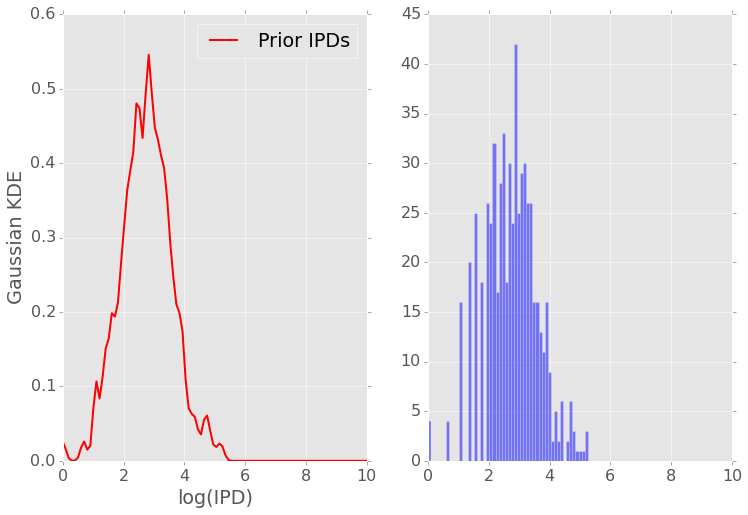

000000F motif: CCAGATCTGGA n_prior: 764
	weight  : [ 0.52134968  0.47865032]
	means   : [[ 2.50035231  3.33749157]]
	AIC1:  1803.30209789 	BIC1:  1826.49493684


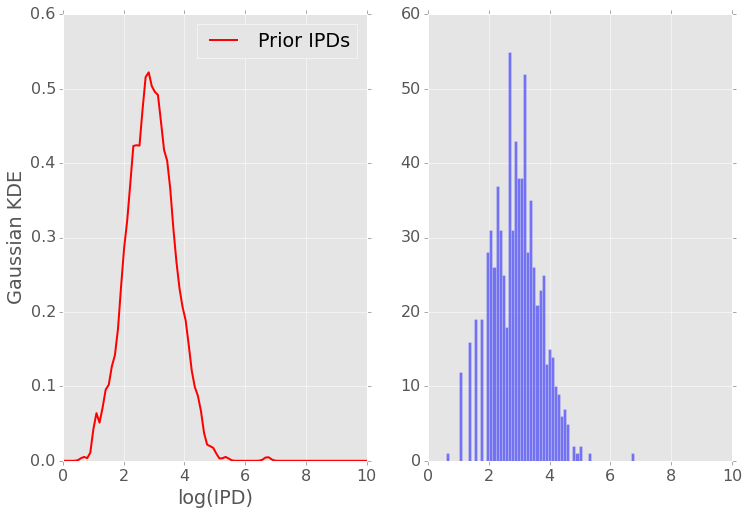

000000F motif: CCAGATCTGGC n_prior: 474
	weight  : [ 0.49370229  0.50629771]
	means   : [[ 3.34302725  2.58114538]]
	AIC1:  1215.45929841 	BIC1:  1236.26533502


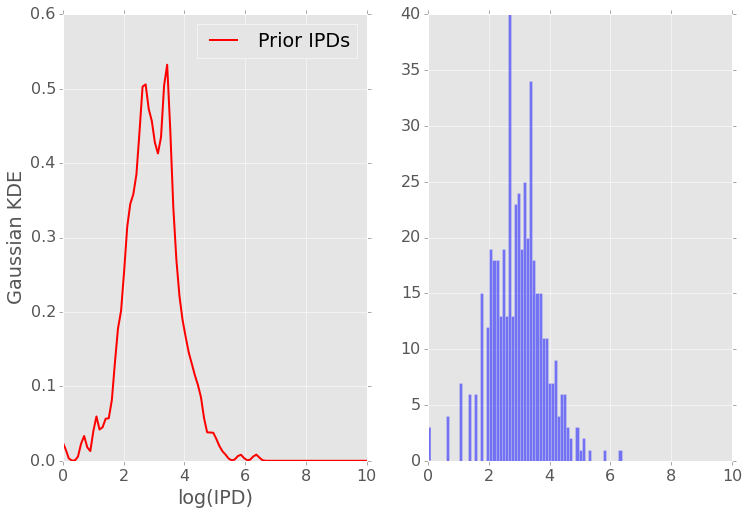

000000F motif: CCAGATCTGGG n_prior: 371
	weight  : [ 0.52138025  0.47861975]
	means   : [[ 2.61988131  3.52093089]]
	AIC1:  969.110331993 	BIC1:  988.691342306


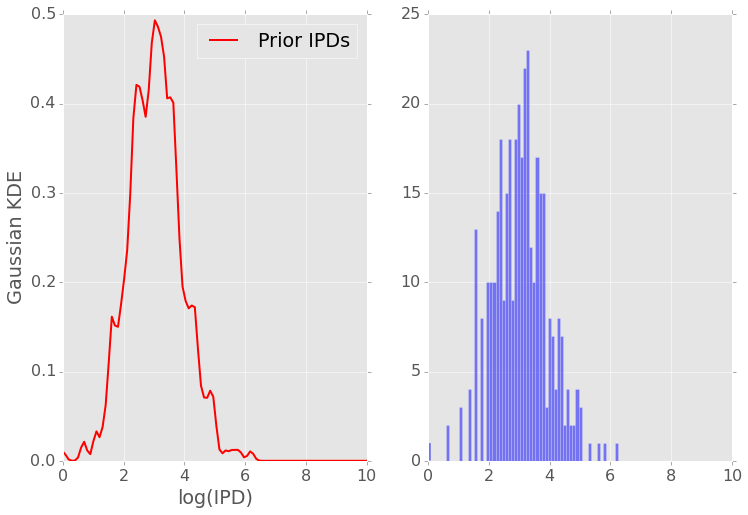

000000F motif: CCAGATCTGGT n_prior: 367
	weight  : [ 0.51309342  0.48690658]
	means   : [[ 3.39500234  2.66215061]]
	AIC1:  908.099470471 	BIC1:  927.626279711


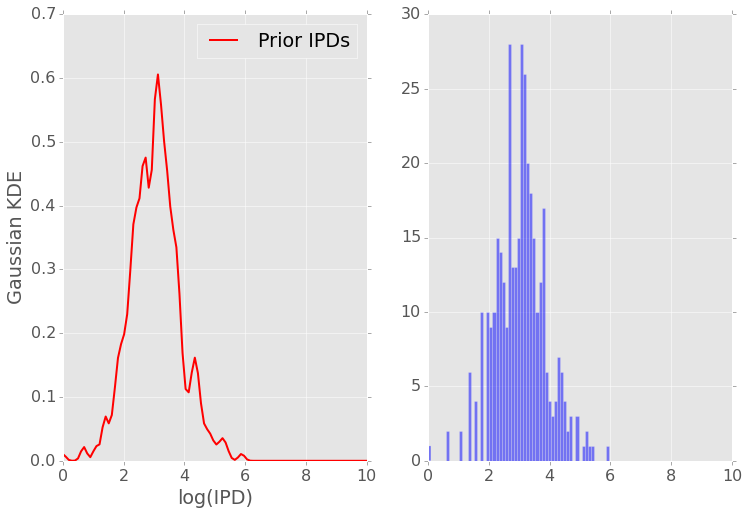

000000F motif: GCCAGATCTAG n_prior: 265
	weight  : [ 0.48993962  0.51006038]
	means   : [[ 3.30189955  2.47645719]]
	AIC1:  641.96632248 	BIC1:  659.86497161


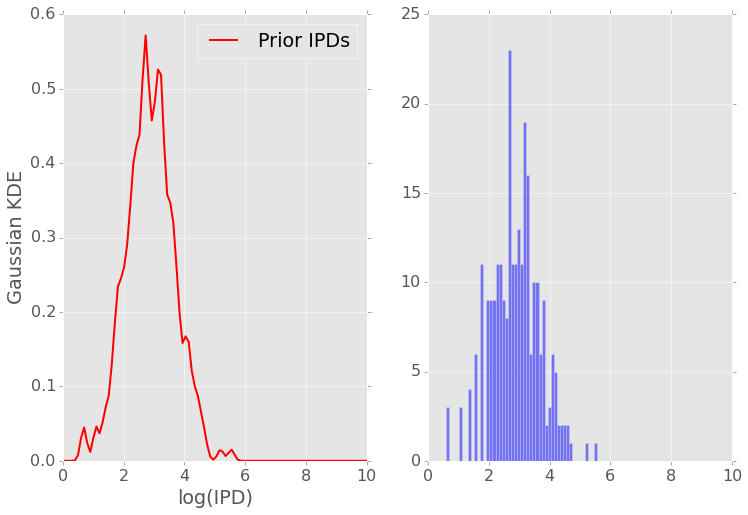

000000F motif: GAAGCAGATCT n_prior: 388
	weight  : [ 0.50845624  0.49154376]
	means   : [[ 3.09179183  2.31905401]]
	AIC1:  950.88671899 	BIC1:  970.691745688


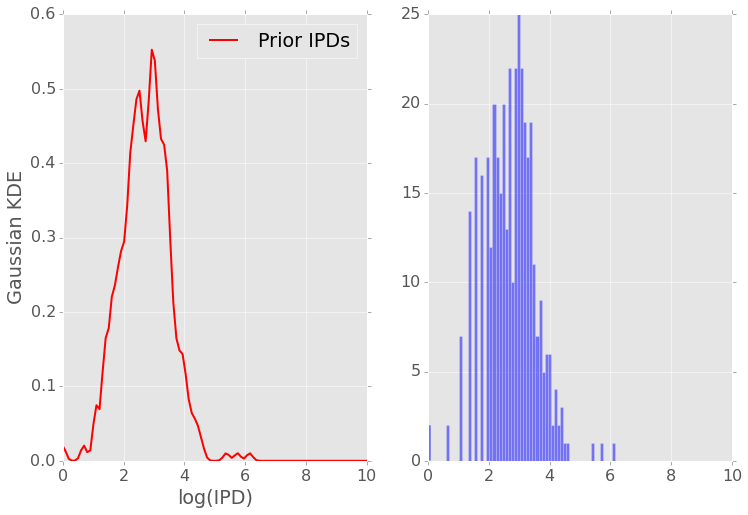

000000F motif: CAGATCTTAAA n_prior: 1000
	weight  : [ 0.52039575  0.47960425]
	means   : [[ 2.39155285  3.2553696 ]]
	AIC1:  2513.06775299 	BIC1:  2537.60652939


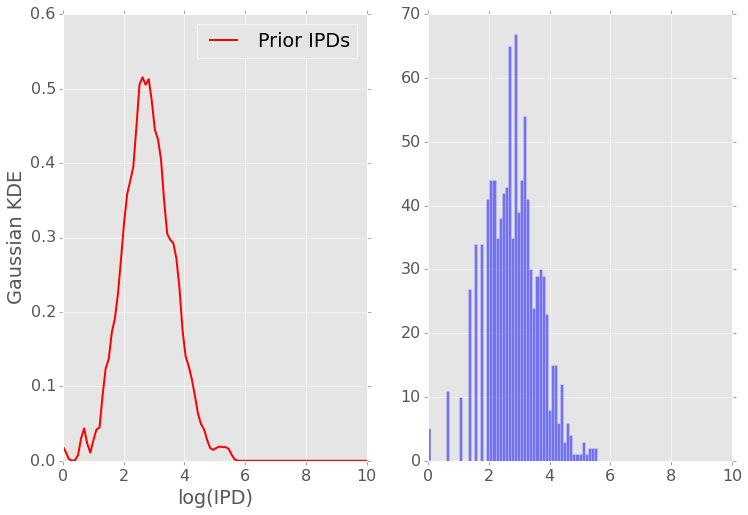

000000F motif: CAGATCTTAAC n_prior: 541
	weight  : [ 0.52747347  0.47252653]
	means   : [[ 2.41210653  3.27099211]]
	AIC1:  1398.64960338 	BIC1:  1420.11669977


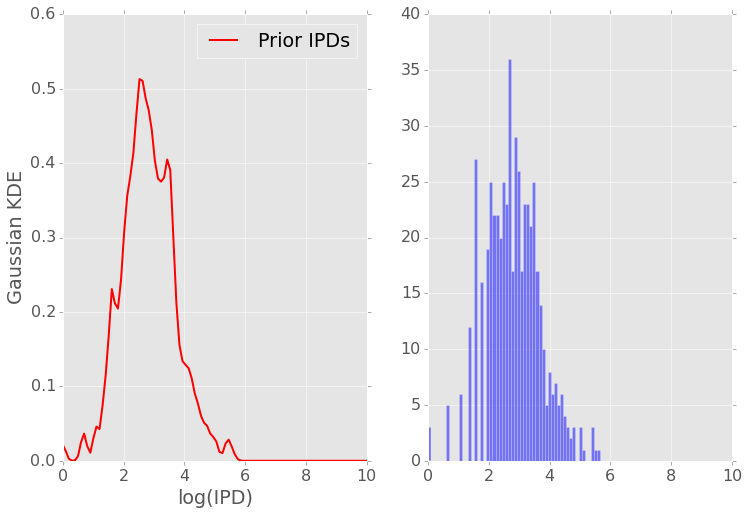

000000F motif: CAGATCTTAAG n_prior: 861
	weight  : [ 0.44651722  0.55348278]
	means   : [[ 3.16635035  2.40468443]]
	AIC1:  2081.37281719 	BIC1:  2105.16328971


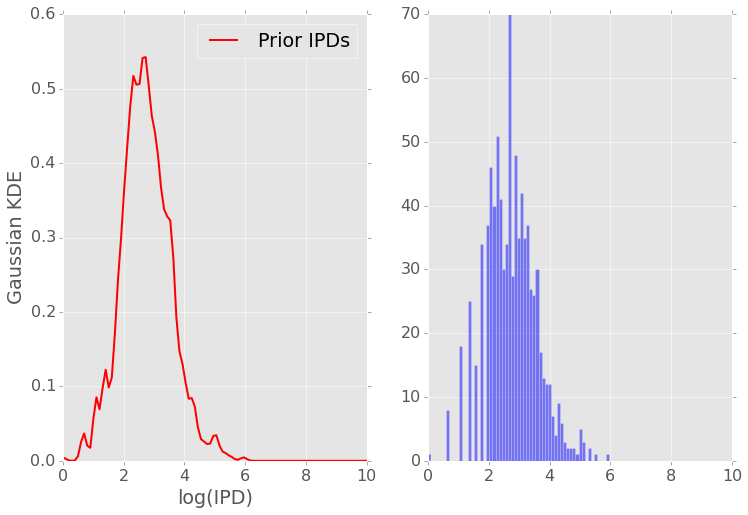

000000F motif: CAGATCTTAAT n_prior: 731
	weight  : [ 0.49608429  0.50391571]
	means   : [[ 2.38604597  3.12128333]]
	AIC1:  1775.07846049 	BIC1:  1798.05052779


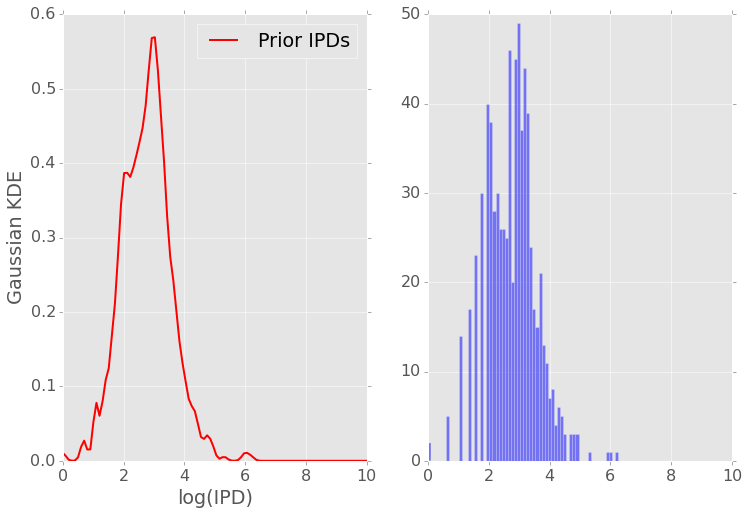

000000F motif: CAGATCTGGCA n_prior: 570
	weight  : [ 0.51977153  0.48022847]
	means   : [[ 2.32179947  2.98054864]]
	AIC1:  1404.67040615 	BIC1:  1426.39858796


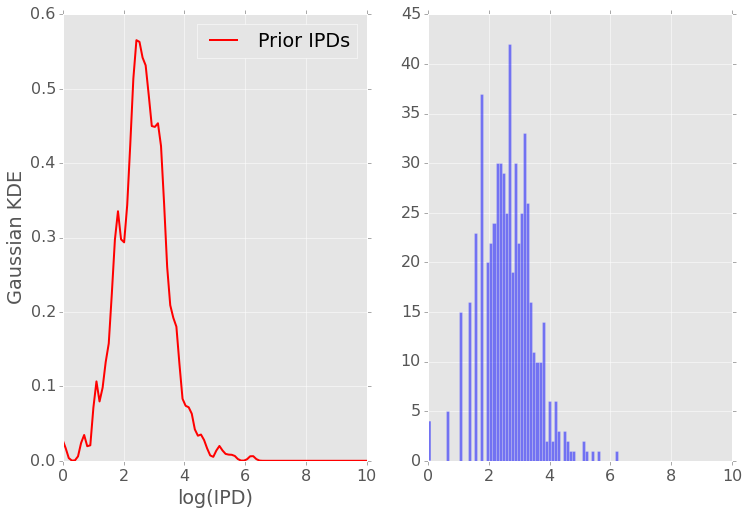

000000F motif: CAGATCTATCC n_prior: 407
	weight  : [ 0.41758997  0.58241003]
	means   : [[ 3.63492408  2.76424076]]
	AIC1:  1160.66439704 	BIC1:  1180.70846296


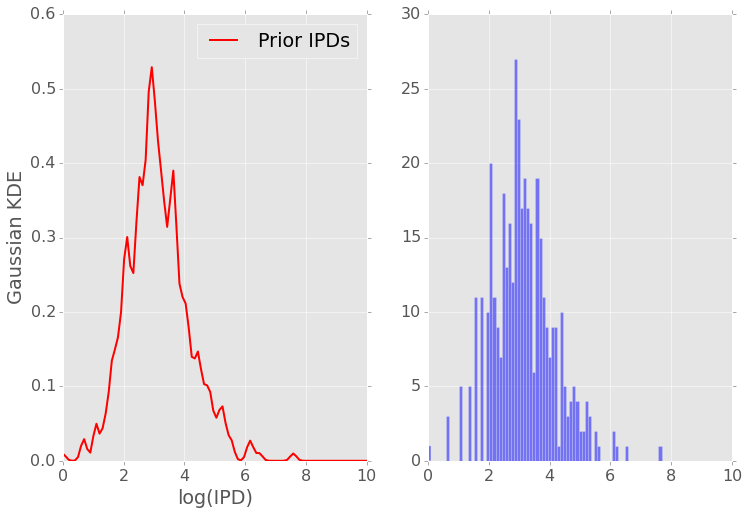

000000F motif: ACAGATCTCCC n_prior: 207
	weight  : [ 0.72968848  0.27031152]
	means   : [[ 2.98655559  3.1526752 ]]
	AIC1:  478.826367907 	BIC1:  495.489961873


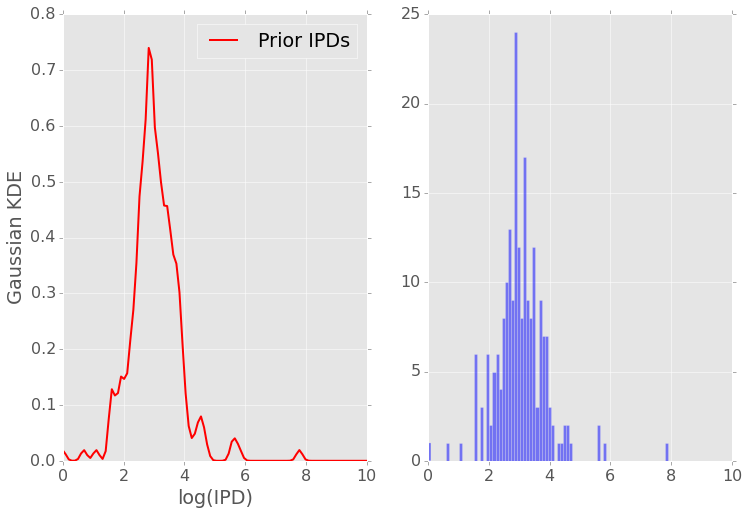

000000F motif: ACAGATCTCCA n_prior: 722
	weight  : [ 0.48823823  0.51176177]
	means   : [[ 3.2442088   2.63408578]]
	AIC1:  1797.62634268 	BIC1:  1820.53646838


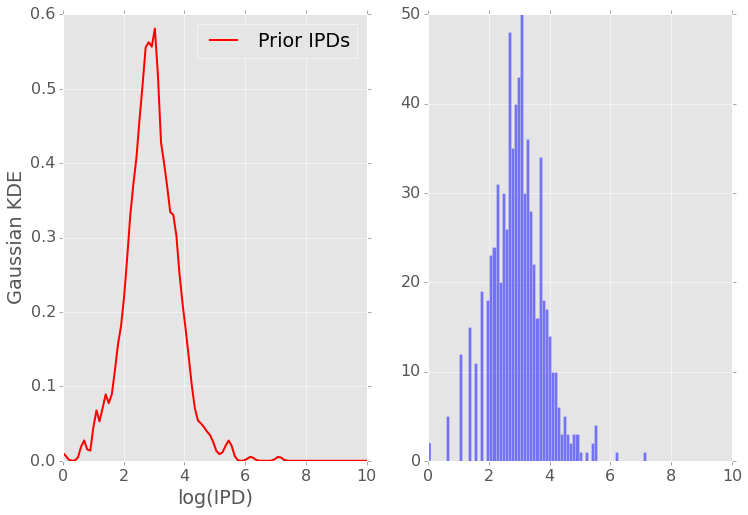

000000F motif: ACAGATCTCCT n_prior: 325
	weight  : [ 0.5059723  0.4940277]
	means   : [[ 3.33265553  2.4995276 ]]
	AIC1:  783.278117713 	BIC1:  802.197243625


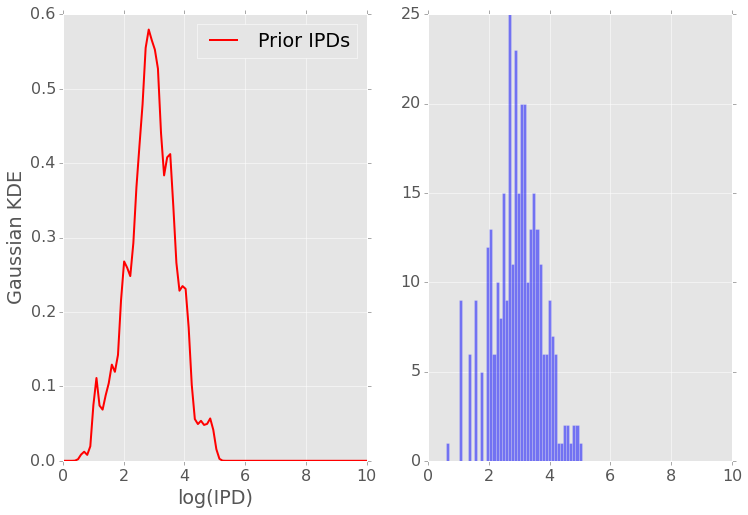

000000F motif: AGTCCAGATCT n_prior: 289
	weight  : [ 0.60316504  0.39683496]
	means   : [[ 2.72944235  2.9424396 ]]
	AIC1:  803.411669248 	BIC1:  821.743802689


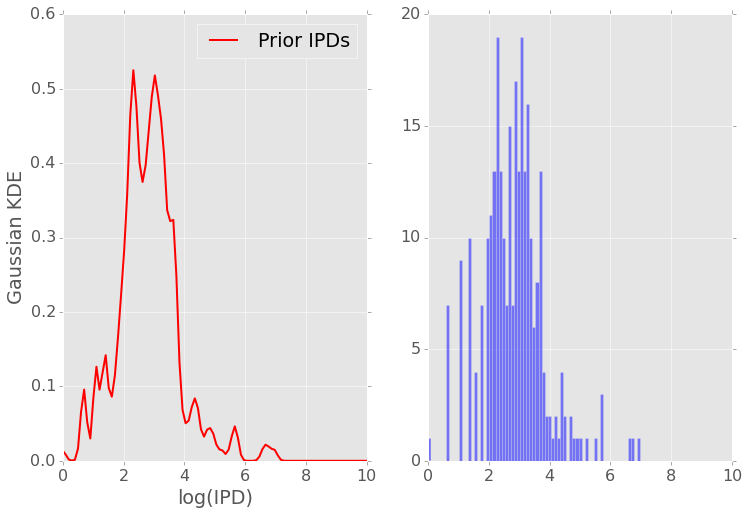

000000F motif: GCCCCAGATCT n_prior: 446
	weight  : [ 0.51700094  0.48299906]
	means   : [[ 3.37855742  2.61988458]]
	AIC1:  1193.880127 	BIC1:  1214.38172176


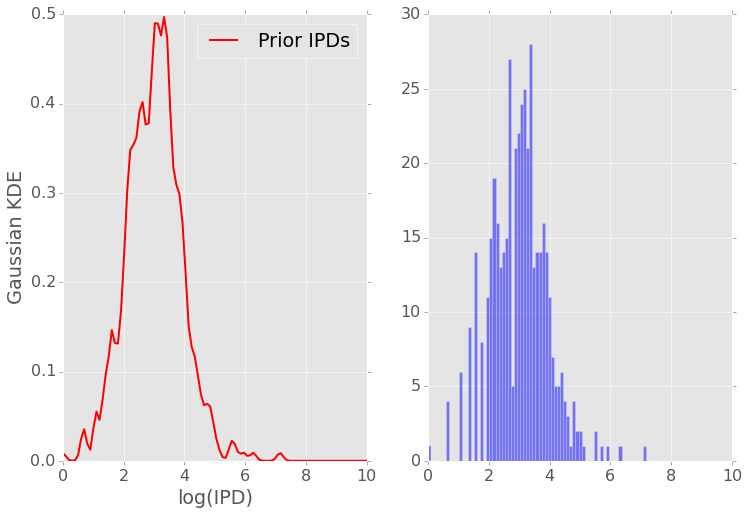

000000F motif: CTCAGATCTCA n_prior: 1000
	weight  : [ 0.51124329  0.48875671]
	means   : [[ 2.650356    3.45611075]]
	AIC1:  2525.91417108 	BIC1:  2550.45294748


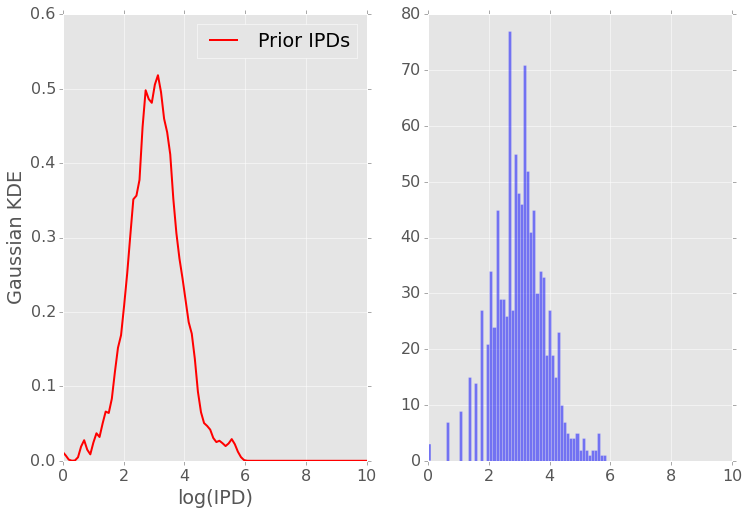

000000F motif: CTCAGATCTCC n_prior: 1000
	weight  : [ 0.49714424  0.50285576]
	means   : [[ 3.37556887  2.62700764]]
	AIC1:  2546.45850313 	BIC1:  2570.99727952


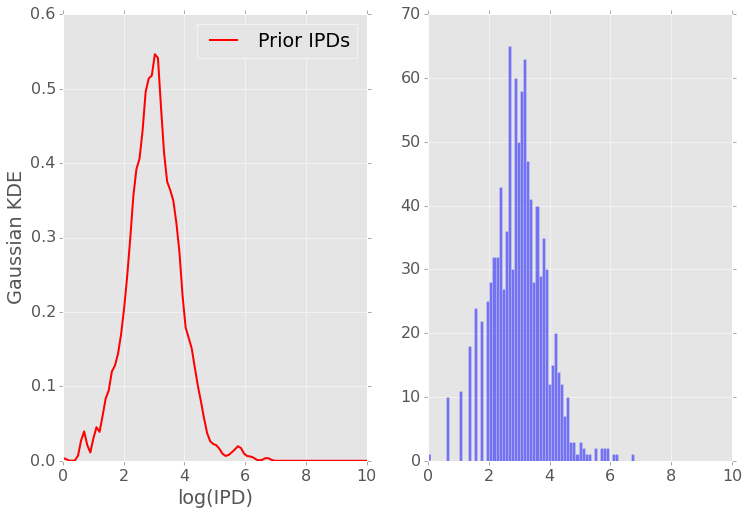

000000F motif: CTCAGATCTCT n_prior: 1000
	weight  : [ 0.52441679  0.47558321]
	means   : [[ 2.64487307  3.46526947]]
	AIC1:  2558.6211661 	BIC1:  2583.15994249


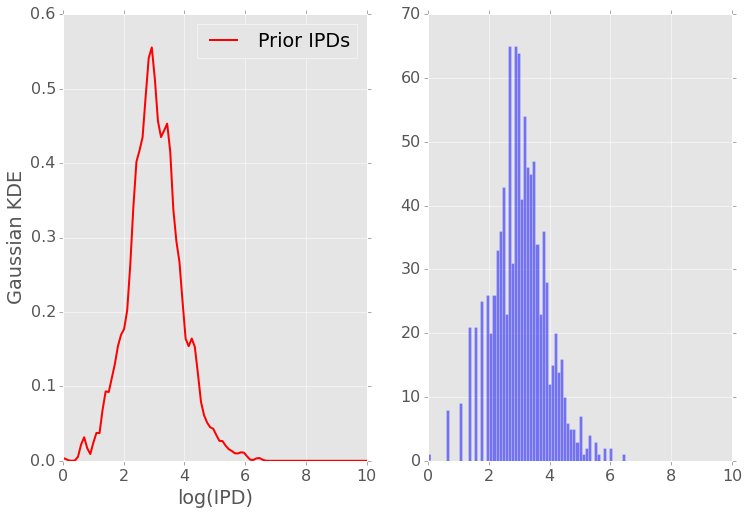

000000F motif: CAGATCTTCAT n_prior: 1000
	weight  : [ 0.55462937  0.44537063]
	means   : [[ 2.6862025   2.90328763]]
	AIC1:  2515.39404902 	BIC1:  2539.93282541


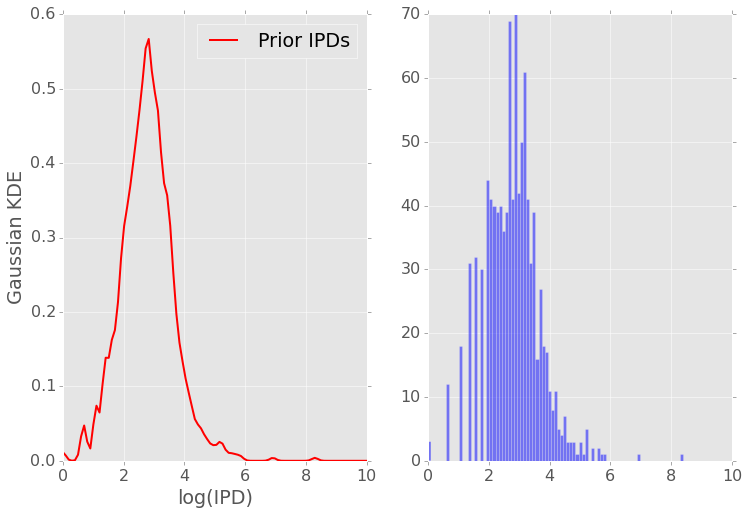

000000F motif: CAGATCTTCAC n_prior: 246
	weight  : [ 0.51181471  0.48818529]
	means   : [[ 3.26832172  2.39908698]]
	AIC1:  636.958892579 	BIC1:  654.485550259


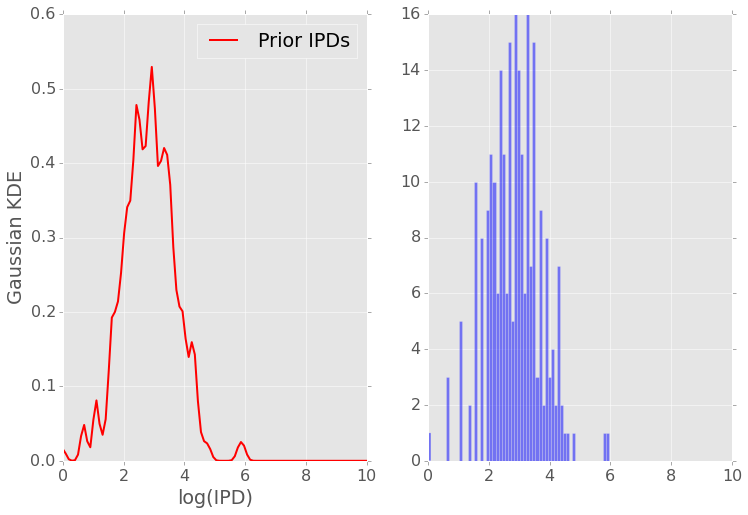

000000F motif: CAGATCTTCAA n_prior: 995
	weight  : [ 0.4708158  0.5291842]
	means   : [[ 2.38313021  3.14648287]]
	AIC1:  2339.68789178 	BIC1:  2364.20160546


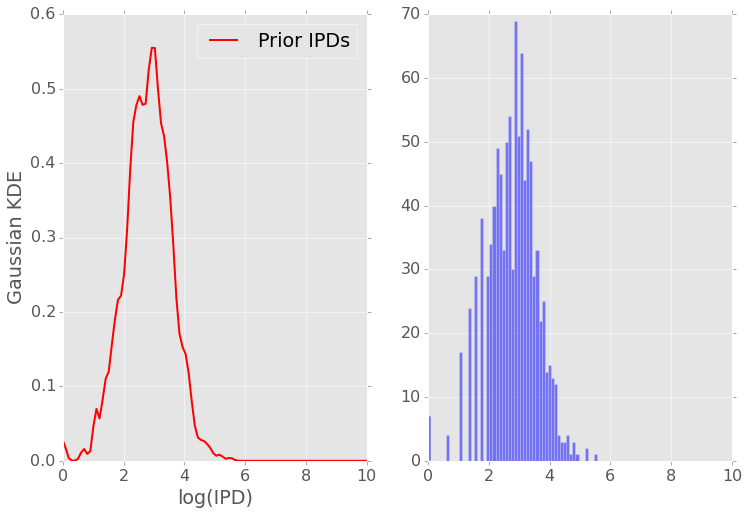

000000F motif: AAACCAGATCT n_prior: 788
	weight  : [ 0.47681361  0.52318639]
	means   : [[ 3.43860956  2.65556993]]
	AIC1:  2142.45940049 	BIC1:  2165.80689094


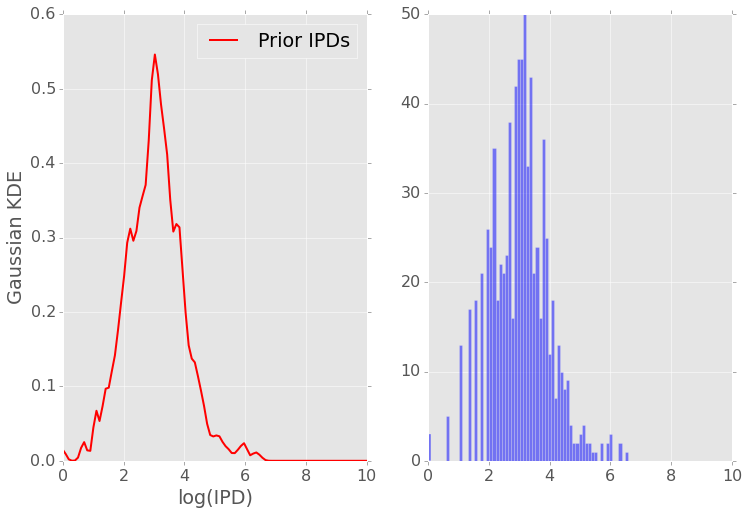

000000F motif: GCCAGATCTGT n_prior: 269
	weight  : [ 0.47049379  0.52950621]
	means   : [[ 2.57806494  3.44762476]]
	AIC1:  654.784904949 	BIC1:  672.758461847


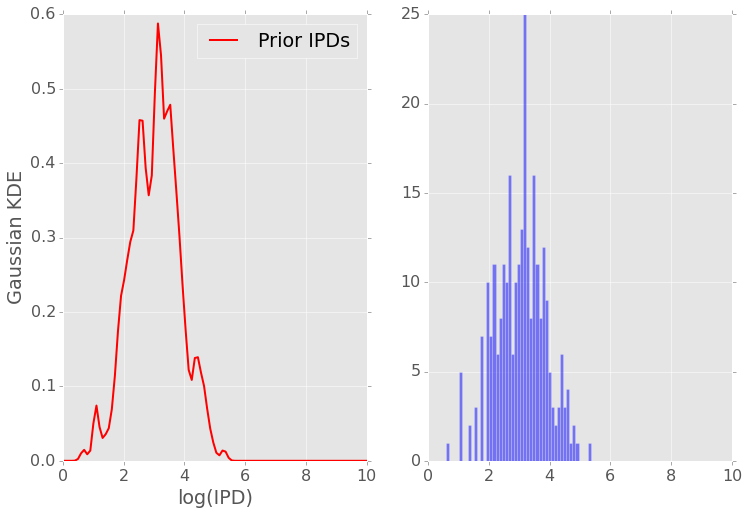

000000F motif: GCCAGATCTGA n_prior: 296
	weight  : [ 0.51902755  0.48097245]
	means   : [[ 3.38224787  2.52930623]]
	AIC1:  716.515520515 	BIC1:  734.967317786


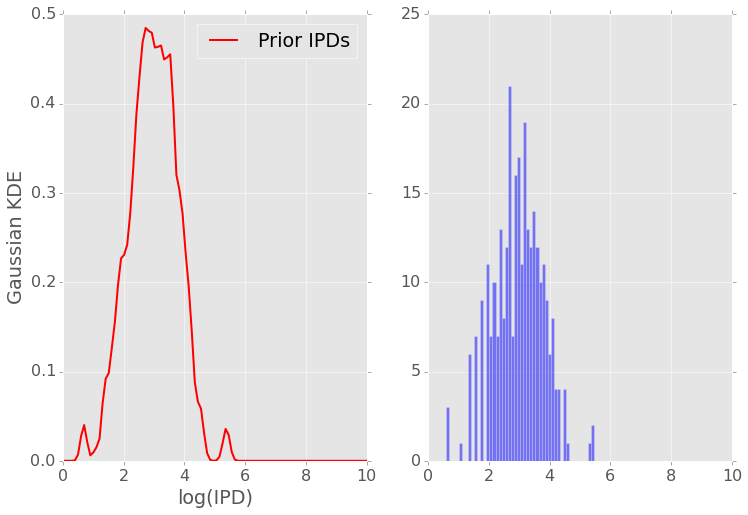

000000F motif: GCCAGATCTGC n_prior: 276
	weight  : [ 0.53990707  0.46009293]
	means   : [[ 3.36190018  2.6416295 ]]
	AIC1:  735.756457897 	BIC1:  753.858462226


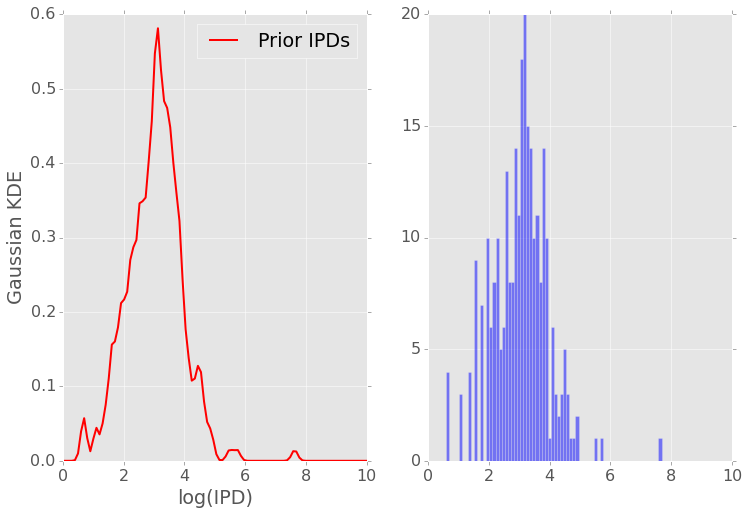

000000F motif: GCCAGATCTGG n_prior: 523
	weight  : [ 0.51724462  0.48275538]
	means   : [[ 2.63417011  3.44332384]]
	AIC1:  1314.12997458 	BIC1:  1335.4278819


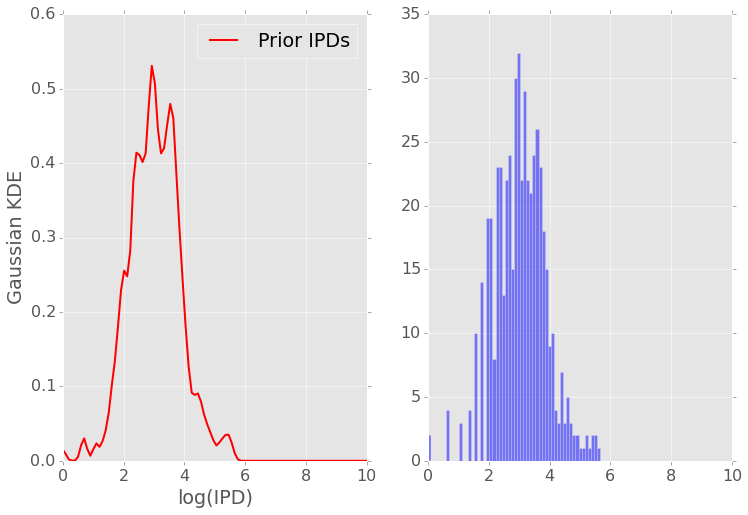

000000F motif: ACAGATCTAGT n_prior: 142
	weight  : [ 0.54816498  0.45183502]
	means   : [[ 3.40863888  2.56936801]]
	AIC1:  334.746028697 	BIC1:  349.525163985


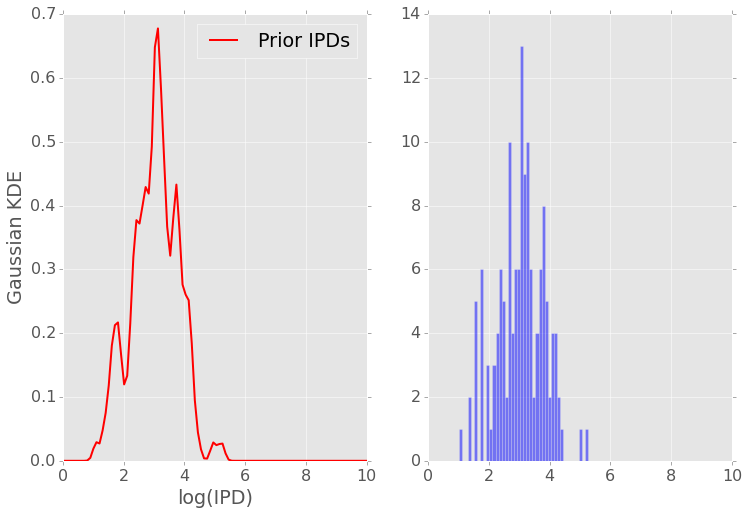

000000F motif: ACAGATCTAGG n_prior: 296
	weight  : [ 0.46467106  0.53532894]
	means   : [[ 3.42355491  2.5779224 ]]
	AIC1:  718.973784669 	BIC1:  737.42558194


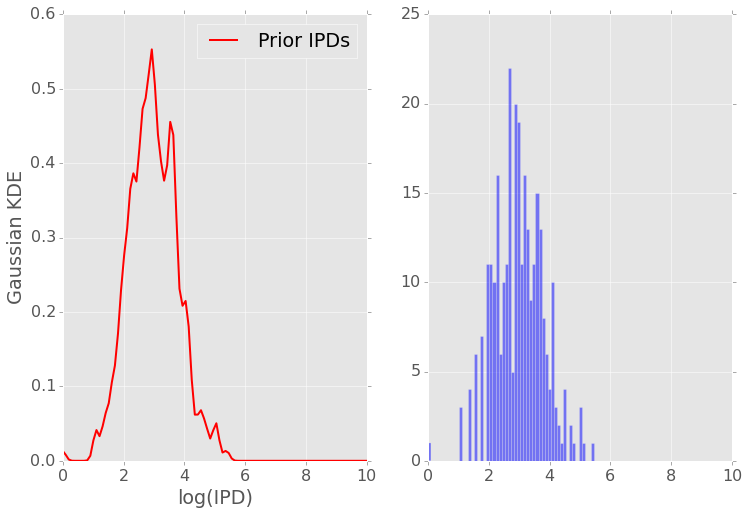

000000F motif: TGCAGATCTAT n_prior: 283
	weight  : [ 0.52415666  0.47584334]
	means   : [[ 3.54487958  2.64560596]]
	AIC1:  769.053484648 	BIC1:  787.280719136


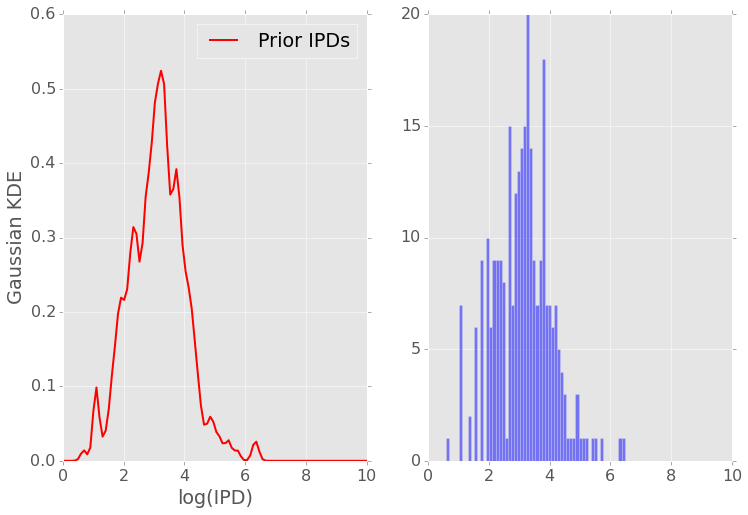

000000F motif: TGCAGATCTAG n_prior: 279
	weight  : [ 0.39322644  0.60677356]
	means   : [[ 2.96408498  3.07567687]]
	AIC1:  693.190801596 	BIC1:  711.346860505


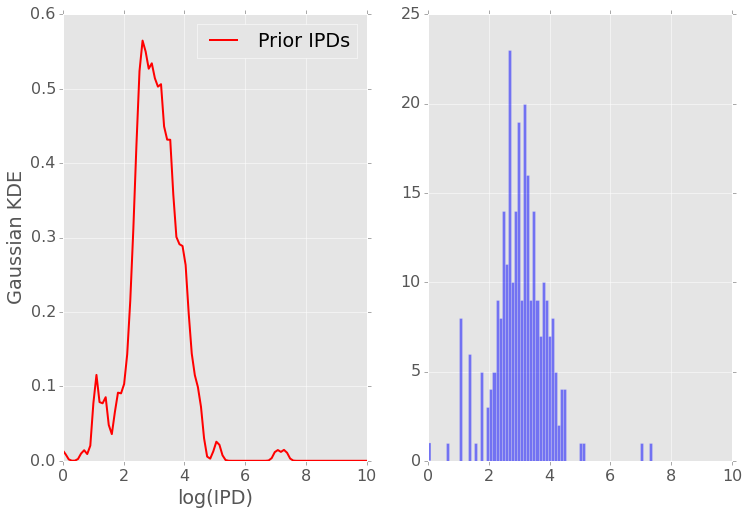

000000F motif: TGCAGATCTAA n_prior: 435
	weight  : [ 0.50418336  0.49581664]
	means   : [[ 3.44058273  2.78194867]]
	AIC1:  1113.56723194 	BIC1:  1133.9439621


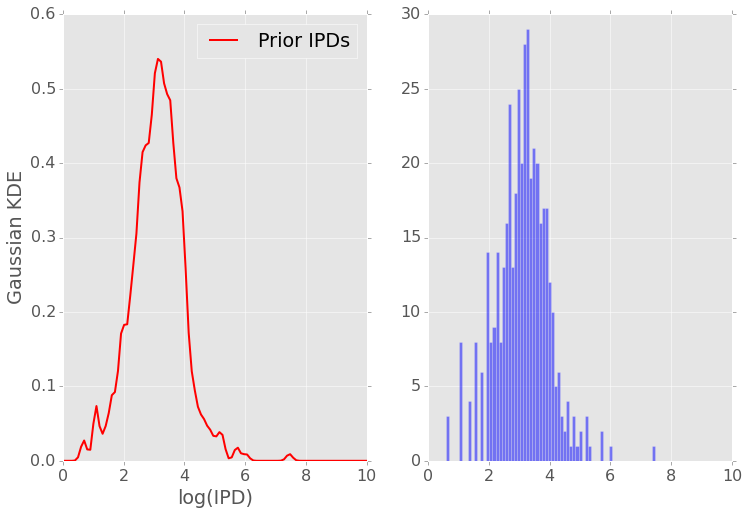

000000F motif: TGCAGATCTAC n_prior: 228
	weight  : [ 0.51536397  0.48463603]
	means   : [[ 2.85844554  3.79582882]]
	AIC1:  610.756474667 	BIC1:  627.903202812


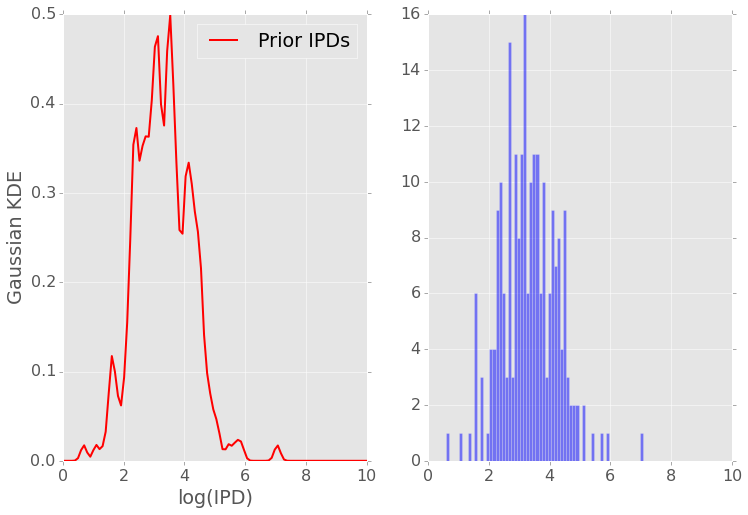

000000F motif: TATTCAGATCT n_prior: 1000
	weight  : [ 0.4588565  0.5411435]
	means   : [[ 2.87355588  2.55663534]]
	AIC1:  2450.71527074 	BIC1:  2475.25404714


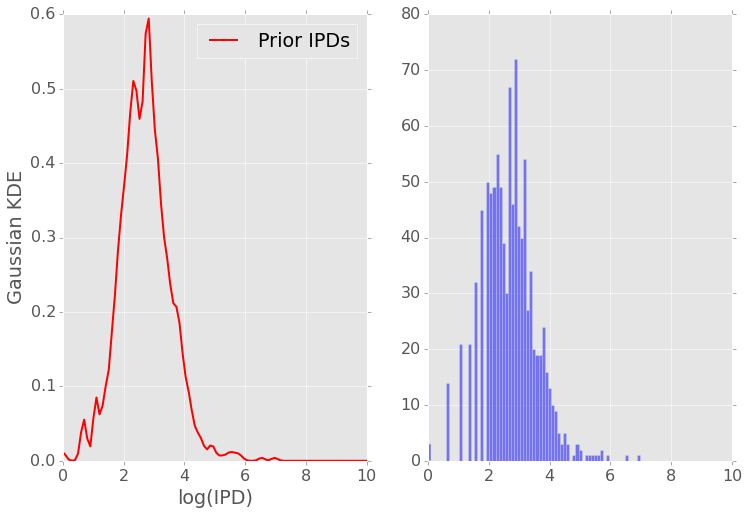

000000F motif: CAGATCTATTA n_prior: 748
	weight  : [ 0.55894036  0.44105964]
	means   : [[ 2.42835485  3.28520992]]
	AIC1:  1841.96409358 	BIC1:  1865.05110847


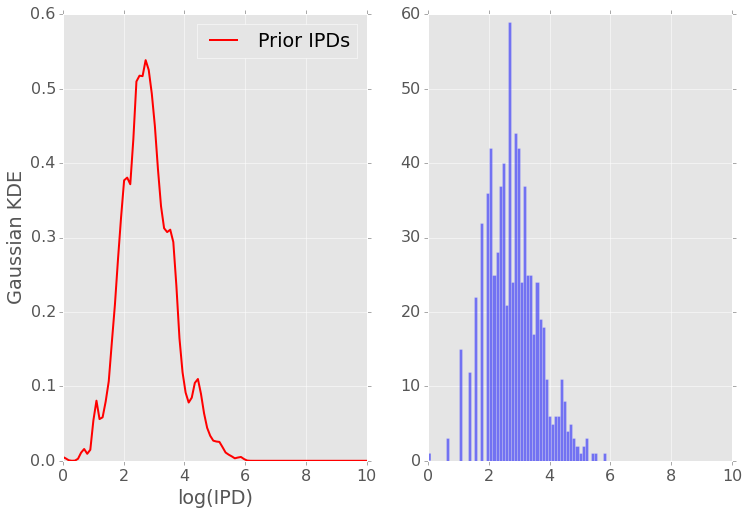

000000F motif: CGCTCAGATCT n_prior: 62
	weight  : [ 0.80956929  0.19043071]
	means   : [[ 2.65336961  3.70260111]]
	AIC1:  165.360413452 	BIC1:  175.996085377


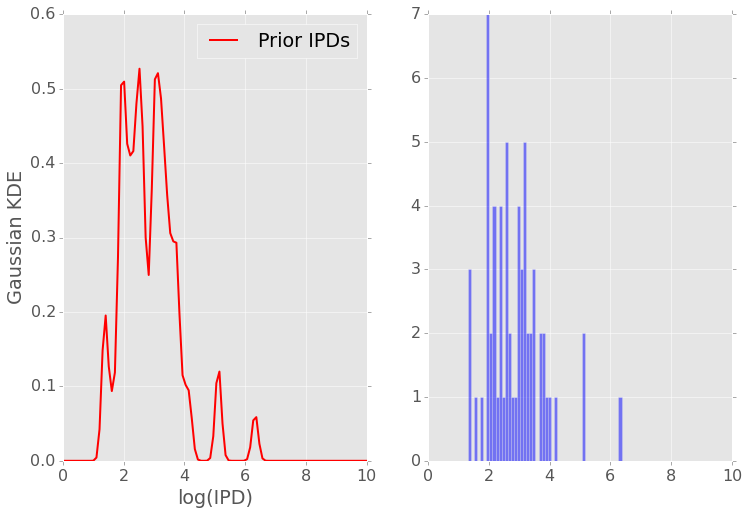

000000F motif: ATCTCAGATCT n_prior: 1000
	weight  : [ 0.51004665  0.48995335]
	means   : [[ 3.1781858   2.44105282]]
	AIC1:  2466.51301953 	BIC1:  2491.05179592


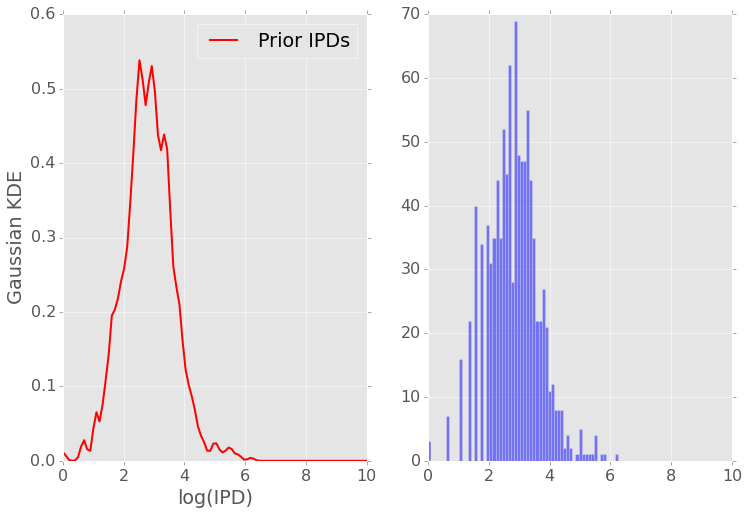

000000F motif: CTGGCAGATCT n_prior: 381
	weight  : [ 0.40781825  0.59218175]
	means   : [[ 2.96786315  2.58404912]]
	AIC1:  901.268385778 	BIC1:  920.982382654


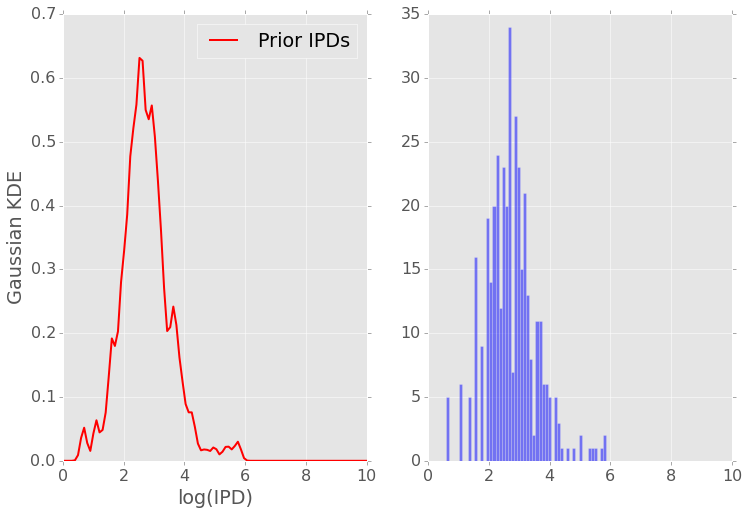

KeyboardInterrupt: 

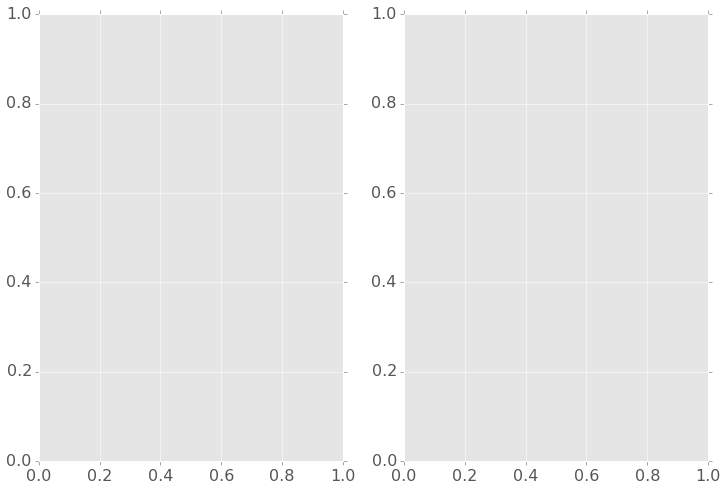

In [37]:
# look at priors for significant priors
in_motifs = 'CAGATCT', 'GAGATCT'
matching = []
for motif in in_motifs:
    matching.extend([i for i in motif_dict if motif in i])
for curr_motif in matching:
    prior_ipds = np.array([[int(x)] for x in motif_dict[curr_motif].split(',', 1001)[0:1000]])
    logx = np.linspace(0,10,100)
    halflogx = np.linspace(0,10,50)
    gs = gridspec.GridSpec(2, 2)
    ax1 = plt.subplot(gs[:,0])
    ax2 = plt.subplot(gs[:,1])
    prior_log = np.log(prior_ipds).reshape(1,len(prior_ipds))
    g = mixture.GMM(n_components=2)
    x = g.fit(prior_log.T)
    print "000000F", "motif:", curr_motif, "n_prior:", len(prior_ipds)
    print "\tweight  :", x.weights_
    print "\tmeans   :", np.reshape(x.means_, (1,2))
    print '\tAIC1: ', x.aic(prior_log.T), '\tBIC1: ', x.bic(prior_log.T)
    kde_prior = kde_scipy(prior_log, logx, bandwidth=0.1)
    ax1.plot(logx, kde_prior, 'r-', label="Prior IPDs")
    ax2.hist(prior_log.T, bins=logx, color='b', alpha=0.5)
    #plt.xscale('log')
    ax1.legend()
    ax1.set_xlabel("log(IPD)")
    ax1.set_ylabel("Gaussian KDE")
    plt.show()
    #wait = raw_input("PRESS ENTER TO CONTINUE.")
    #display.clear_output(wait=True)
    #display.display(plt.gcf())

In [4]:
basedir = '/sc/orga/scratch/bashia02/collaborations/hardik_shah/jason_new/hapcut_outputs/hg002_re_000000F/'
bam_fp = pysam.Samfile(basedir + 'hg002.000000F.het_sites_truth_partition_snps_only.bam', 'rb')

In [158]:
# get methylation by column (SLOW)
read_parsed_ipds_test = dict()
motif_ipd_values_test = dict()

pbar = ProgressBar(33500000)
motif_len = 11
mhl = int(math.floor(motif_len/2))
count = 0
for i in bam_fp.pileup():
    pbar.animate()
    count += 1
    if count > 1000:
        break
    ref_pos = i.reference_pos
    if ref_pos < mhl+1: continue # motif runs over start of ref
    ref_motif = str(sequences['000000F'][ref_pos-mhl:ref_pos+mhl+1]) # this is an 11-mer
    ref_3mer = ref_motif[mhl-1:mhl+2]
    for read in i.pileups:
        qpos = read.query_position
        if (qpos <= mhl)|(qpos >= read.alignment.query_length - mhl) :
            continue # cannot determine full motif
        read_3mer = get_matched_bases_in_read(read.alignment, range(ref_pos-1,ref_pos+2), read_bpos)
        if read_3mer != ref_3mer:
            continue
        # okay, if we've gotten this far it means we want to keep the ipd
        if read.alignment.qname not in read_parsed_ipds:
            read_parsed_ipds[read.alignment.qname] = [int(i) for i in read.alignment.get_tag('ip').strip('S').split(',')]
        ipd_val = read_parsed_ipds[read.alignment.qname][qpos]
        if ref_motif in motif_ipd_values:
            motif_ipd_values[ref_motif].append(ipd_val)
        else:
            motif_ipd_values[ref_motif] = [ipd_val]

In [5]:
# get methylation by read (hopefully faster)
#basedir = '/sc/orga/scratch/bashia02/collaborations/hardik_shah/jason_new/hapcut_outputs/hg002_re_000000F/'
#bam_fp = pysam.Samfile(basedir + 'hg002_000000F.new.merged.bam', 'rb')
bam_fp = pysam.AlignmentFile("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002_000000F.new.merged.bam.rg.bam", "rb")

ipd_by_position_hap1 = dict()
ipd_by_position_hap2 = dict()

pbar = ProgressBar(2000)
count=0
for read in bam_fp.fetch(region="000000F", start=32372315, end=32383980):
    pbar.animate()
    if read.is_reverse:
        continue
    ipd_values = [int(i) for i in read.get_tag('ip').strip('S').split(',')]
    sigoverlap = [i for i in siteslist if (i[1] <= rend) & (i[1] >= rstart)]
    norm_factor = np.mean(np.log(ipd_values)) # taken from SMALR
    rstart, rend = read.reference_start, read.reference_end
    rlen = rend-rstart
    refseq = str(sequences['000000F'][rstart:rend])
    refmap = get_refmap(read)
    #hap = read.get_tag('ZH')
    #hap = int(read.get_tag('ZH').split(";")[0].split(",")[1])
    #block = int(read.get_tag('ZH').split(";")[0].split(",")[0])
    for refpos in range(rstart+6,rend-6):
        # translate the refpos value to a read-based coord
        basepos = get_position_in_read(read, refpos, refmap)
        if basepos == None: continue
        motif = refseq[refpos-rstart-5:refpos-rstart+6]
        ref_3mer = motif[4:7]
        read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
        if ref_3mer != read_3mer: continue
        if read.is_reverse == True:
            ipd_value = np.log(ipd_values[read.qlen-basepos+1])/norm_factor # ipd of base before should now be the one
        else:
            ipd_value = np.log(ipd_values[basepos])/norm_factor
        hap = 1
        if hap == 1:
            if refpos in ipd_by_position_hap1:
                ipd_by_position_hap1[refpos].append([ipd_value, block])
            else:
                ipd_by_position_hap1[refpos] = [[ipd_value, block]]
        if hap == 2:
            if refpos in ipd_by_position_hap2:
                ipd_by_position_hap2[refpos].append([ipd_value, block])
            else:
                ipd_by_position_hap2[refpos] = [[ipd_value, block]]
#bam_fp.close()

NameError: name 'siteslist' is not defined

In [762]:
ipd_by_position_hap1

{32374784: [[0.91262334756875652, 23780],
  [1.1285690635215258, 23780],
  [0.7883207635142222, 23780],
  [0.6024853804917637, 23780],
  [1.0105925765978812, 23780],
  [1.0735073982161027, 23780],
  [1.2870357890812569, 23780],
  [0.67677556649772008, 23780],
  [1.1027207767359073, 23780],
  [0.91583804364845278, 23780],
  [0.48297881095988593, 23780],
  [0.93585681077623251, 23780],
  [0.8803501886298889, 23780],
  [0.82226752401553371, 23780],
  [0.92535721831395856, 23780],
  [0.92809268744573215, 23780],
  [1.1575478675310173, 23780],
  [1.099043954647094, 23780],
  [1.0246737858093928, 23780],
  [1.6423788108959703, 23780],
  [1.0958366363819814, 23780],
  [0.9999521017816303, 23780],
  [0.88069045362766429, 23780],
  [1.0275799866097237, 23780],
  [0.76676126095729535, 23780],
  [1.1590973950576244, 23780]],
 32374785: [[1.1083767195496812, 23780],
  [1.5357104577492806, 23780],
  [1.2716106703070025, 23780],
  [0.86031744400531529, 23780],
  [1.0237313047926979, 23780],
  [1.010

In [765]:
ipds_all = []
for i in ipd_by_position_hap1:
    for a in ipd_by_position_hap1[i]:
        ipds_all.append([i, a[0]])

In [763]:
plt_out = []
for i in range(32372315,32383980):
    if i not in ipd_by_position_hap1:
        continue
    if len(ipd_by_position_hap1[i]) <= 10:
        continue
    plt_out.append([i,None,None, None, None, [], [], [], []])
    plt_out[-1][1] = np.mean([a[0] for a in ipd_by_position_hap1[i]])
    #plt_out[-1][2] = np.mean([a[0] for a in ipd_by_position_hap2[i]])
    plt_out[-1][3] = len(ipd_by_position_hap1[i])
    #plt_out[-1][4] = len(ipd_by_position_hap2[i])
    plt_out[-1][5] = ipd_by_position_hap1[i]
    #plt_out[-1][6] = ipd_by_position_hap2[i]
    plt_out[-1][7] = np.mean([b[1] for b in ipd_by_position_hap1[i]])
    #plt_out[-1][8] = np.mean([b[1] for b in ipd_by_position_hap2[i]])

In [727]:
siteslist = []
pbar = ProgressBar(61100)
for line in open("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_qv13_methyl_sig_sites-novariant-11mer.tsv", 'r'):
    pbar.animate()
    chrom, pos, mean1, mean2 = line.strip('\n').split(' ')
    pos, mean1, mean2 = int(pos), float(mean1), float(mean2)
    siteslist.append([chrom, pos, mean1, mean2])

In [363]:
from sklearn.decomposition import PCA

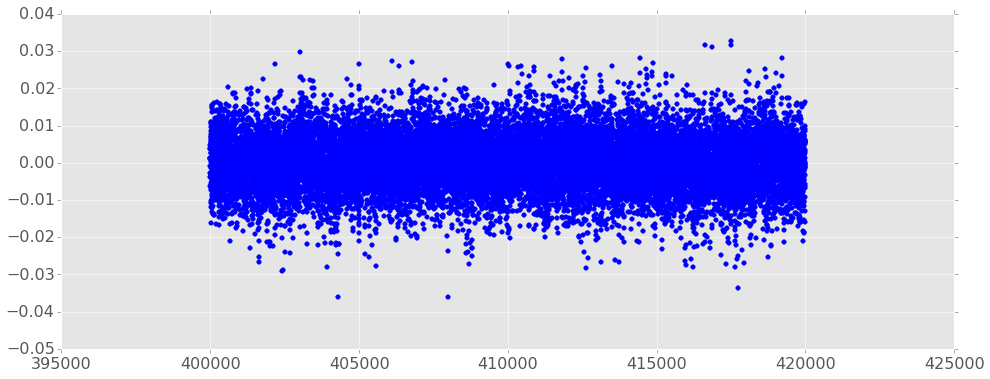

In [403]:
p = PCA(n_components=2)
p.fit(np.array(zip([i[1] for i in plt_out], [i[2] for i in plt_out])).reshape(2,len(plt_out)))
new_trans = p.transform(np.array(zip([i[1] for i in plt_out], [i[2] for i in plt_out])).reshape(2,len(plt_out)))
len(p.components_[0])
plt.scatter([i[0] for i in plt_out], p.components_[0], color='b')

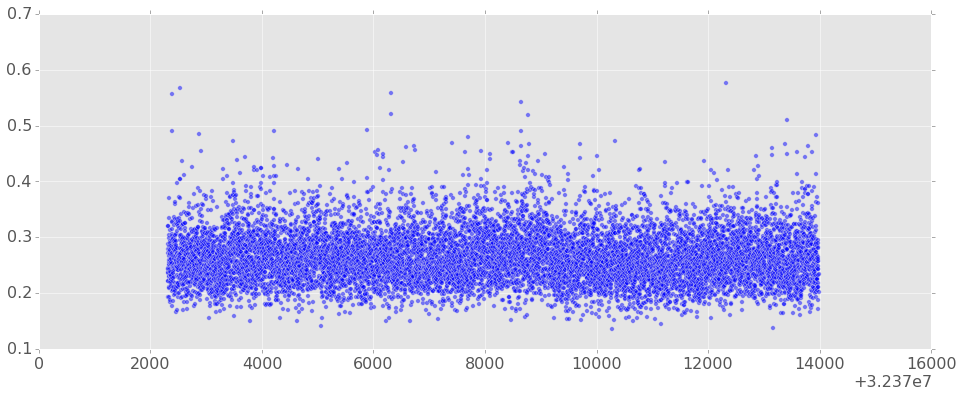

In [782]:
plt.scatter([i[0] for i in plt_out], [np.std([a[0] for a in i[5]]) for i in plt_out], alpha=0.5)
#plt.scatter([i[0] for i in plt_out], [i[2] for i in plt_out], color='r', alpha=0.5)
plt.show()

In [597]:
import scipy as sp
import scipy
import scipy.fftpack

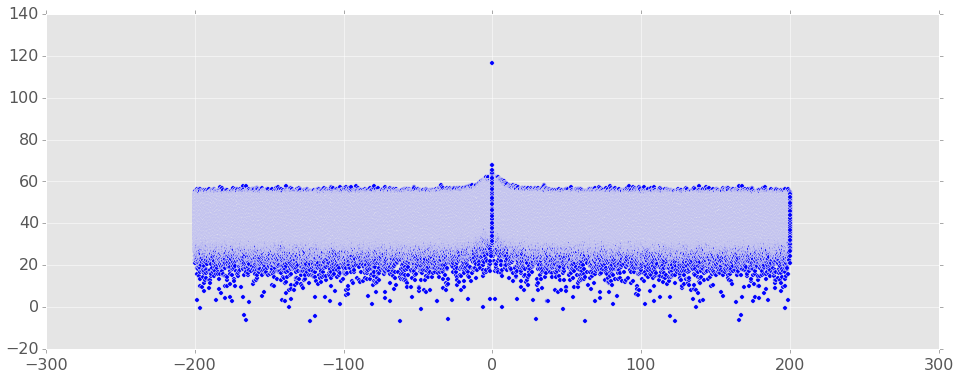

In [767]:
t = scipy.linspace(0,75,30000)
signal = np.array([i[1] for i in ipds_all])
FFT = abs(scipy.fft(signal))
freqs = scipy.fftpack.fftfreq(signal.size, t[1]-t[0])
plt.scatter(freqs,20*scipy.log10(FFT))
plt.show()

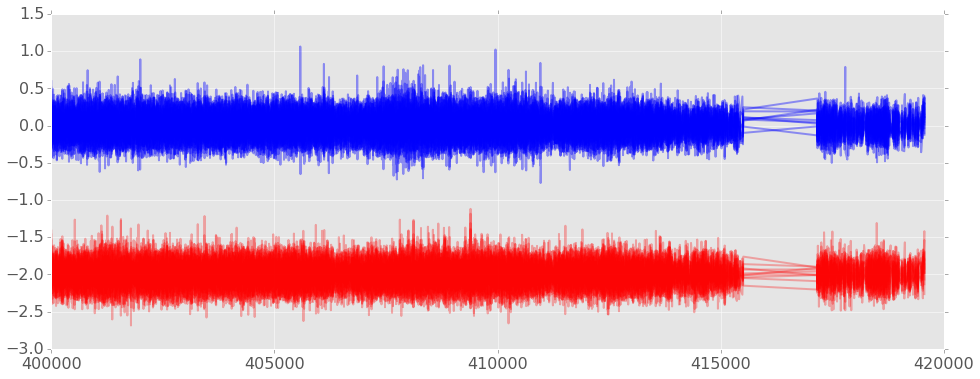

In [719]:
plt_out = []
for i in range(400000,420000):
    if i not in ipd_by_position_hap1 or i not in ipd_by_position_hap2:
        continue
    if len(ipd_by_position_hap1[i]) <= 10 or len(ipd_by_position_hap2[i]) <= 10:
        continue
    plt_out.append([i,None,None, None, None, [], []])
    plt_out[-1][1] = np.mean(ipd_by_position_hap1[i])
    plt_out[-1][2] = np.mean(ipd_by_position_hap2[i])
    plt_out[-1][3] = len(ipd_by_position_hap1[i])
    plt_out[-1][4] = len(ipd_by_position_hap2[i])
    plt_out[-1][5] = ipd_by_position_hap1[i]
    plt_out[-1][6] = ipd_by_position_hap2[i]


cf = 50
#mov_avg_hap1 = np.convolve([i[1] for i in plt_out], [1. / cf] * cf, 'same')
#mov_avg_hap2 = np.convolve([i[2] for i in plt_out], [1. / cf] * cf, 'same')
#plt.plot([i[0] for i in plt_out], mov_avg_hap1, color='b', alpha=0.5)
#plt.plot([i[0] for i in plt_out], mov_avg_hap2, color='r', alpha=0.5)
for read in range(0,10):
    cf = 10
    mov_avg_hap1_lf = np.convolve([i[5][read] for i in plt_out], [1. / cf] * cf, 'same')
    mov_avg_hap2_lf = np.convolve([i[6][read] for i in plt_out], [1. / cf] * cf, 'same')
    cf = 3
    mov_avg_hap1 = np.convolve([i[5][read] for i in plt_out], [1. / cf] * cf, 'same')
    mov_avg_hap2 = np.convolve([i[6][read] for i in plt_out], [1. / cf] * cf, 'same')
    plt.plot([i[0] for i in plt_out], mov_avg_hap2 - mov_avg_hap2_lf, color='b', alpha=0.4)
    plt.plot([i[0] for i in plt_out], mov_avg_hap1 - mov_avg_hap1_lf-2, color='r', alpha=0.3)
plt.show()

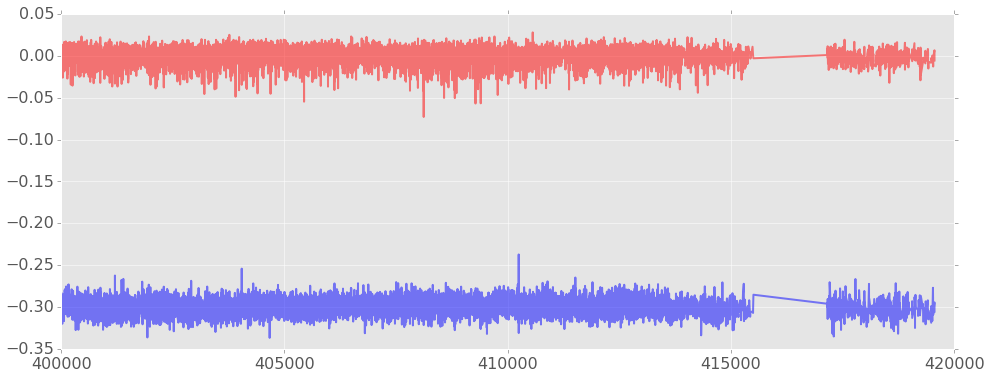

In [711]:
ica_signal = FastICA(n_components=2, max_iter=20000, tol=0.000001)
sources = ica_signal.fit_transform(np.array(zip([i[1] for i in plt_out], [i[2] for i in plt_out])))
mov_avg_hap1 = [i[0] for i in sources]
mov_avg_hap2 = [i[1] for i in sources]
#mov_avg_hap1 = np.convolve([i[0] for i in sources], [1. / 1] * 1, 'same')
#mov_avg_hap2 = np.convolve([i[1] for i in sources], [1. / 1] * 1, 'same')
plt.plot([i[0] for i in plt_out], np.array(mov_avg_hap1)-0.3, color='b', alpha=0.5)
plt.plot([i[0] for i in plt_out], mov_avg_hap2, color='r', alpha=0.5)
#plt.plot([i[0] for i in plt_out], mov_avg_hap2-mov_avg_hap1, color='g', alpha=0.5)
plt.show()

In [357]:
plt_out = []
for i in range(410280,410300):
    if i not in ipd_by_position_hap1 or i not in ipd_by_position_hap2:
        continue
    if len(ipd_by_position_hap1[i]) <= 10 or len(ipd_by_position_hap2[i]) <= 10:
        continue
    plt_out.append([i,None,None, None, None])
    plt_out[-1][1] = np.mean(ipd_by_position_hap1[i])
    plt_out[-1][2] = np.mean(ipd_by_position_hap2[i])
    plt_out[-1][3] = len(ipd_by_position_hap1[i])
    plt_out[-1][4] = len(ipd_by_position_hap2[i])

In [262]:
str(sequences["000000F"][410090:410110])

'TTCTACTACGGTCAGTCAGA'

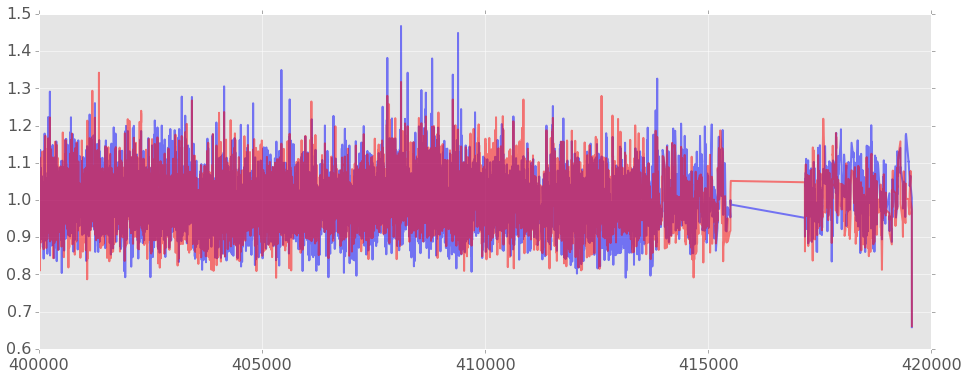

In [712]:
mov_avg_hap1 = np.convolve([i[1] for i in ipds_all], [1. / 3] * 3, 'same')
plt.plot([i[0] for i in plt_out], mov_avg_hap1, color='b', alpha=0.5)

In [ ]:
plt.scatter([i[0] for i in plt_out], [i[2] for i in plt_out])

In [6]:
out_fp = open('/hpc/users/neffr01/2work/methyl_motif_priors/hg002_000000F_ipd-by-position.tsv', 'w')
out_fp.write("#ref_chrom\tref_pos\tipd_at_position\n")
for key in sorted(ipd_by_position.keys()):
    out_fp.write('\t'.join([str(x) for x in ['000000F', key, ','.join([str(a) for a in ipd_by_position[key]])]]) + '\n')
out_fp.close()

In [52]:
opticalmap = pd.read_csv('/hpc/users/neffr01/2work/alex_na24385_phasing/hmap_combine/alex_merged_hapinform_000000F.txt', sep=' ', 
                         header=None)
opticalmap.sort(columns=5, inplace=True)

In [136]:
opticalset = set({3366531,  3889116,  4207133,  4425218,  4487852,  
4702639,  5045343,  5583143,  5680200,  5768307,  5833916,  6155226,  
6156314,  6570993,  6639583,  6767351,  7068928,  7305328,  7518309,  
7519511,  7602559,  7702805,  7954498,  8165876,  8379084,  8380364,  
8543489,  9099398,  10285036,  10767843,  10822262,  11357859,  11535218,  
11687657,  12308506,  12514736,  12903461,  13030317,  13472377,  
13571579,  13929459,  14271488,  14508482,  14982344,  15416851,  
16528454,  16975566,  17131635,  17131656,  17277992,  17459946,  
17661507,  17894890,  17960782,  18581522,  19136557,  20715234,  
20715942,  20802007,  20842429,  21185532,  21482025,  21611092,  
22128495,  22747901,  22764384,  22807060,  23445922,  24994218,  
26695714,  27981178,  27982485,  28325028,  28925872,  29325841,  
29327157,  29869010,  31716937,  31981142,  32232474,  32643115,  
32652723,  32804199})

In [137]:
list_set = list(opticalset)
for i in list_set:
    for a in range(i-1,i+6):
        opticalset.add(a)

In [33]:
obs = np.concatenate((np.random.randn(100, 1),
...                       10 + np.random.randn(300, 1)))

In [7]:
'''
PERMUTED KS TEST

'''


import itertools
'''
# Three subplots sharing both x/y axes
f, (ax1, ax2, ax3) = plt.subplots(3, sharex=True, sharey=True)
ax1.plot(x, y)
ax1.set_title('Sharing both axes')
ax2.scatter(x, y)
ax3.scatter(x, 2 * y ** 2 - 1, color='r')
# Fine-tune figure; make subplots close to each other and hide x ticks for
# all but bottom plot.
f.subplots_adjust(hspace=0)
plt.setp([a.get_xticklabels() for a in f.axes[:-1]], visible=False)
'''
kstest_arr = open("/hpc/users/neffr01/jason_new/kstest/kstest_plot_permute.tsv", 'w')
import matplotlib.gridspec as gridspec
pd.set_option('display.width', 900)
pd.set_option('display.max_columns', 100)
plt.style.use('ggplot')
rcParams['figure.figsize'] = (16, 6)
rcParams['figure.dpi'] = 150
rcParams['font.size'] = 16
rcParams['font.family'] = 'Bitstream Vera Sans'
outprefix = "truth_test_"
pos_in = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002_truth_test_trio_ipd_positions_merged.tsv', 'rb')
bam_fp = pysam.AlignmentFile("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002_000000F.new.merged.bam.rg.bam", "rb")
pbar = ProgressBar(200000)
siteslist = [] # list of methyl potentials
counter = 0
for line in pos_in:
    pbar.animate()
    if counter % 100 == 0:
        kstest_arr.flush()
    if (line[0] == "#") | (line[0] == "="):
        continue
    chrom, pos, ipdl_hap1, ipdl_hap2 = line.strip('\n').split('\t')
    pos = int(pos)
    #if pos < 2000: 
    #    continue
    #if pos not in opticalset:
    #    continue 
    curr_motif = str(sequences['000000F'][pos-5:pos+6])
    if curr_motif in motif_dict:
        prior_ipds = [int(x) for x in motif_dict[curr_motif].split(',', 2001)[0:2000]]
    else:
        continue
    if (ipdl_hap1 == '')|(ipdl_hap2 == ''):
        continue
    ipd_hap1 = np.array([int(x) for x in ipdl_hap1.split(',')])
    ipd_hap2 = np.array([int(x) for x in ipdl_hap2.split(',')])
    if (len(ipd_hap1) < 8) | (len(ipd_hap2) < 8):
        continue
    ipds = np.concatenate([ipd_hap1, ipd_hap2])
    ipds = np.random.permutation(ipds)
    ipd_hap1 = ipds[0:len(ipd_hap1)]
    ipd_hap2 = ipds[len(ipd_hap1):len(ipds)]
    kstest_haps = stats.ks_2samp(ipd_hap1, ipd_hap2)[1]
    kstest_prior1 = stats.ks_2samp(prior_ipds, ipd_hap1)[1]
    kstest_prior2 = stats.ks_2samp(prior_ipds, ipd_hap2)[1]
    kstest_arr.write('\t'.join([str(a) for a in [pos, kstest_haps, kstest_prior1, kstest_prior2, len(ipd_hap1), len(ipd_hap2)]]) + '\n')
    counter += 1

[***************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************************

In [789]:
kstest_arr.close()

In [267]:

'''
haplotype joining by methlyation


pseudocode:
1. get set of significant IPD positions along the contig (by partitioned haplotype)
2. get set of blocks from hapcut file
3. for each pair of blocks: 
    a. look at reads that overlap a few ipd sites in each block, "call" read based on which model it falls into
        i. how to determine confidence interval? probably bootstrapping
    b. see if there is a pattern between haplotypes in each block and called haplotypes
    c. continue for whole contig/genome
'''
print >>sys.stderr, "init"
pos_in = open('/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002_truth_test_trio_ipd_positions_merged.tsv', 'rb')
block_reader = HapCutReader("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hapcut_qv13_mq10/hg002_hapcut_000000F.hapcut")
bam_fp = pysam.AlignmentFile("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002_000000F.new.merged.bam.rg.bam")
sequences = dict( (s.name, s) for s in ht.FastaReader("/hpc/users/neffr01/jason_new/contig_000000F.fa") )
#motif dict load?
#out_fp = open("/hpc/users/neffr01/jason_new/hapcut_outputs/truth_test_methyl_sig_sites.tsv", "wb")
logx, halflogx = np.linspace(0,10,100), np.linspace(0,10,50)
print >>sys.stderr, "1. get set of significant IPD positions"
pbar = ProgressBar(28169687)
siteslist = [] # list of methylated positions
for line in pos_in:
    pbar.animate()
    if (line[0] == "#") | (line[0] == "="):
        continue
    chrom, pos, ipdl_hap1, ipdl_hap2 = line.strip('\n').split('\t')
    pos = int(pos)
    if pos < 24265329:
        continue # already did a lot so far
    curr_motif = str(sequences['000000F'][pos-5:pos+6])
    if curr_motif not in motif_dict:
        continue
    if (ipdl_hap1 == '')|(ipdl_hap2 == ''):
        continue
    ipd_hap1, ipd_hap2 = [int(x) for x in ipdl_hap1.split(',')], [int(x) for x in ipdl_hap2.split(',')]
    if min([ipd_hap1,ipd_hap2]) < 8:
        continue
    prior_ipds = [int(x) for x in motif_dict[curr_motif].split(',', 1001)[0:1000]]
    kstest_haps = stats.ks_2samp(ipd_hap1, ipd_hap2)
    kstest_prior1, kstest_prior2 = stats.ks_2samp(prior_ipds, ipd_hap1), stats.ks_2samp(prior_ipds, ipd_hap2)
    if (kstest_haps[1] > 0.01 ) | (min([kstest_prior1[1], kstest_prior2[1]]) > 0.01):
        continue
    obs1, obs2 = np.array([[i] for i in np.log(ipd_hap1)]), np.array([[i] for i in np.log(ipd_hap2)])
    obs = np.concatenate((obs1, obs2))
    g, h = mixture.GMM(n_components=1), mixture.GMM(n_components=1)
    x, y = g.fit(obs1), h.fit(obs2)
    #print "000000F", pos, x.means_[0][0], y.means_[0][0]
    print >>out_fp, "000000F", pos, x.means_[0][0], y.means_[0][0]
    out_fp.flush()

init
1. get set of significant IPD positions

[****************100%******************]  28169062 of 28169687 complete Elapsed: 354.1 minutes	 Remaining: 0.0 minutes


In [265]:
out_fp.flush()

In [250]:
s = pd.DataFrame(siteslist)
s.to_csv("/hpc/users/neffr01/jason_new/hapcut_outputs/small_sig_sites_list.tsv", sep='\t', index=None, header=None)

In [251]:
out_fp = open("/hpc/users/neffr01/jason_new/hapcut_outputs/sample_methyl_sig_sites.tsv", "wb")
out_fp.f

In [ ]:

print >>sys.stderr, "2. look at interblock reads from hapcut file"
block_ids = sorted(block_reader.blocks.keys())
for ix, bid in enumerate(block_ids[1:len(block_ids)]):
    block = block_reader.loc(bid)
    lastblock = block_reader.loc(block_ids[ix])
    span = (lastblock.chrom, lastblock.start, block.end)
    last_sig = [i for i in siteslist if ((i[1] >= lastblock.start) & (i[1] <= lastblock.end))]
    curr_sig = [i for i in siteslist if ((i[1] >= block.start) & (i[1] <= block.end))]
    reads_across_span = bam_fp.fetch(region=span[0] + ':' + str(span[1]) + '-' + str(span[2]))
    hap_links = []
    for read in reads_across_span:
        refseq = str(sequences[chrom][rstart:rend])
        rstart, rend = read.pos, read.aend
        if (rstart <= lastblock.end) & (rend >= block.start):
            last_sigoverlap = [i for i in last_sig if i[1] >= rstart]
            curr_sigoverlap = [i for i in curr_sig if i[1] <= rend]
            if min([len(last_sigoverlap), len(curr_sigoverlap)]) < 2:
                continue # below cutoff
            # the read should be ready for partitioning - call ipds in the read
            refmap = get_refmap(read)
            ipd_values = [int(i) for i in read.get_tag('ip').strip('S').split(',')]
            res1, res2 = [], []
            for row in last_sigoverlap:
                basepos = get_position_in_read(read, row[1], refmap)
                if basepos==None: continue
                ipd_value = np.log(ipd_values[basepos])
                motif = refseq[refpos-5-(rstart):refpos+6-rstart]
                ref_3mer = motif[4:7]
                read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
                if ref_3mer != read_3mer: continue
                res1.append([(abs(row[3]-ipd_value), abs(row[4]-ipd_value))])
            for row in curr_sigoverlap:
                basepos = get_position_in_read(read, row[1], refmap)
                if basepos==None: continue
                ipd_value = np.log(ipd_values[basepos])
                motif = refseq[refpos-5-(rstart):refpos+6-rstart]
                ref_3mer = motif[4:7]
                read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
                if ref_3mer != read_3mer: continue
                res2.append([(abs(row[3]-ipd_value), abs(row[4]-ipd_value))])
            # calculate probable haplotype for each block:
            lh = sum([i[0] for i in res1]) - sum([i[1] for i in res1])
            ch = sum([i[0] for i in res2]) - sum([i[1] for i in res2])
            last_hap = (1,lh) if lh < 0 else (2,lh)
            curr_hap = (1,ch) if ch < 0 else (2,ch)
            hap_links.append((last_hap, curr_hap))
    print hap_links
    break

In [246]:
bam_fp = pysam.AlignmentFile("/hpc/users/neffr01/jason_new/hapcut_outputs/hg002_re_000000F/hg002.000000F.het_sites_truth_partition_snps_only.bam")
predictions = []
pbar = ProgressBar(5000)
for read in bam_fp.fetch(region="000000F", start=0, end=180000):
    pbar.animate()
    rstart, rend = read.pos, read.aend
    sigoverlap = [i for i in siteslist if (i[1] <= rend) & (i[1] >= rstart)]
    if len(sigoverlap) == 0:
        continue
    refmap = get_refmap(read)
    ipd_values = [int(i) for i in read.get_tag('ip').strip('S').split(',')]
    #hap = int(read.get_tag('ZH').split(";")[0].split(",")[1])
    hap = read.get_tag('ZH')
    pv = read.get_tag('ZV')
    res = []
    for row in sigoverlap:
        refpos = row[1]
        basepos = get_position_in_read(read, refpos, refmap)
        if basepos==None: continue
        ipd_value = np.log(ipd_values[basepos])
        #motif = refseq[refpos-5-(rstart):refpos+6-rstart]
        #ref_3mer = motif[4:7]
        #read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
        #if ref_3mer != read_3mer: continue
        res.append([abs(row[2]-ipd_value), abs(row[3]-ipd_value)])
    if res != []:
        #print read.qname
        hap1_res = sum([i[0] for i in res])
        hap2_res = sum([i[1] for i in res])
        predict_hap = None
        if hap1_res > hap2_res:
            predict_hap = 2
        else:
            predict_hap = 1
        #print "Predicted:\t", predict_hap, "actual:\t", hap
        predictions.append([predict_hap, hap, len(res), pv, hap1_res, hap2_res, read.alen])

[***               9%                  ]  436 of 5000 complete Elapsed: 0.2 minutes	 Remaining: 1.6 minutes


In [783]:
rcParams['figure.figsize'] = (4, 4)
rcParams['axes.titlesize'] = 12
pltarr = []
for var in range(0,10):
    predcheck = [i for i in predictions if i[3] > var]
    if len(predcheck) == 0:
        break
    acc = round(np.mean([1 if i[0] == i[1] else 0 for i in predcheck]), 3)
    n = len(predcheck)
    pltarr.append([var, acc, n])
    print "partition variants >=", var, "prediction acc:", acc , "n=", n
plt.title("Methyl partitioning accuracy by # of het variants in read")
plt.plot([i[0] for i in pltarr], [i[1] for i in pltarr])
plt.ylim([0,1.1])
plt.xlabel("# of het variants", fontsize='small')
plt.ylabel("Hap prediction accuracy", fontsize='small')
plt.show()

NameError: name 'predictions' is not defined

partition variants >= 0 prediction acc: 0.645 n= 445
partition variants >= 1000 prediction acc: 0.645 n= 439
partition variants >= 2000 prediction acc: 0.639 n= 413
partition variants >= 3000 prediction acc: 0.629 n= 388
partition variants >= 4000 prediction acc: 0.615 n= 358
partition variants >= 5000 prediction acc: 0.605 n= 332
partition variants >= 6000 prediction acc: 0.601 n= 303
partition variants >= 7000 prediction acc: 0.611 n= 270
partition variants >= 8000 prediction acc: 0.618 n= 241
partition variants >= 9000 prediction acc: 0.614 n= 215
partition variants >= 10000 prediction acc: 0.608 n= 189
partition variants >= 11000 prediction acc: 0.618 n= 152
partition variants >= 12000 prediction acc: 0.589 n= 112
partition variants >= 13000 prediction acc: 0.59 n= 83
partition variants >= 14000 prediction acc: 0.689 n= 61
partition variants >= 15000 prediction acc: 0.61 n= 41
partition variants >= 16000 prediction acc: 0.652 n= 23
partition variants >= 17000 prediction acc: 0.667 

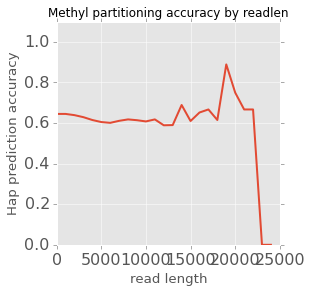

In [248]:
rcParams['figure.figsize'] = (4, 4)
rcParams['axes.titlesize'] = 12
pltarr = []
for var in range(0,25000,1000):
    predcheck = [i for i in predictions if i[6] > var]
    if len(predcheck) == 0:
        break
    acc = round(np.mean([1 if i[0] == i[1] else 0 for i in predcheck]), 3)
    n = len(predcheck)
    pltarr.append([var, acc, n])
    print "partition variants >=", var, "prediction acc:", acc , "n=", n
plt.title("Methyl partitioning accuracy by readlen")
plt.plot([i[0] for i in pltarr], [i[1] for i in pltarr])
plt.ylim([0,1.1])
plt.xlabel("read length", fontsize='small')
plt.ylabel("Hap prediction accuracy", fontsize='small')
plt.show()

In [169]:
print >>sys.stderr, "2. look at interblock reads from hapcut file"
block_ids = sorted(block_reader.blocks.keys())
for ix, bid in enumerate(block_ids[1:len(block_ids)]):
    block = block_reader.loc(bid)
    lastblock = block_reader.loc(block_ids[ix])
    span = (lastblock.chrom, lastblock.start, block.end)
    last_sig = [i for i in siteslist if ((i[1] >= lastblock.start) & (i[1] <= lastblock.end))]
    curr_sig = [i for i in siteslist if ((i[1] >= block.start) & (i[1] <= block.end))]
    reads_across_span = bam_fp.fetch(region=span[0] + ':' + str(span[1]) + '-' + str(span[2]))
    hap_links = []
    for read in reads_across_span:
        rstart, rend = read.pos, read.aend
        refseq = str(sequences[chrom][rstart:rend])
        if (rstart <= lastblock.end) & (rend >= block.start):
            last_sigoverlap = [i for i in last_sig if i[1] >= rstart]
            curr_sigoverlap = [i for i in curr_sig if i[1] <= rend]
            if min([len(last_sigoverlap), len(curr_sigoverlap)]) < 2:
                continue # below cutoff
            # the read should be ready for partitioning - call ipds in the read
            refmap = get_refmap(read)
            ipd_values = [int(i) for i in read.get_tag('ip').strip('S').split(',')]
            res1, res2 = [], []
            for row in last_sigoverlap:
                basepos = get_position_in_read(read, row[1], refmap)
                if basepos==None: continue
                ipd_value = np.log(ipd_values[basepos])
                motif = refseq[refpos-5-(rstart):refpos+6-rstart]
                ref_3mer = motif[4:7]
                read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
                if ref_3mer != read_3mer: continue
                res1.append([(abs(row[3]-ipd_value), abs(row[4]-ipd_value))])
            for row in curr_sigoverlap:
                basepos = get_position_in_read(read, row[1], refmap)
                if basepos==None: continue
                ipd_value = np.log(ipd_values[basepos])
                motif = refseq[refpos-5-(rstart):refpos+6-rstart]
                ref_3mer = motif[4:7]
                read_3mer = get_matched_bases_in_read(read, range(refpos-1,refpos+2), refmap)
                if ref_3mer != read_3mer: continue
                res2.append([(abs(row[3]-ipd_value), abs(row[4]-ipd_value))])
            # calculate probable haplotype for each block:
            lh = sum([i[0] for i in res1]) - sum([i[1] for i in res1])
            ch = sum([i[0] for i in res2]) - sum([i[1] for i in res2])
            last_hap = (1,lh) if lh < 0 else (2,lh)
            curr_hap = (1,ch) if ch < 0 else (2,ch)
            hap_links.append((last_hap, curr_hap))
    print hap_links, 
    break

 []


2. look at interblock reads from hapcut file


In [163]:
arr = [1,2,3,4]
t = sum(arr),1 if sum(arr) < 15 else (None,2)
print t

(10, 1)
